# Synthetic time series data using GAN tutorial

## Part B: Experiments on Air Quality dataset

### Note!: 

1. We choose the DC2GAN model to use for the creation of synthetic Time Series data training it on the Air Quality dataset.

2. We slightly modify the DC2GAN class to work properly on the time series data.

In [ ]:
from __future__ import print_function, division

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Embedding, multiply
from keras.layers import BatchNormalization, Activation, ZeroPadding2D, Concatenate
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.layers.merge import _Merge
from keras.models import Sequential, Model
from keras.optimizers import Adam, RMSprop
from keras.utils import to_categorical
from keras.preprocessing import image
import keras.backend as K

from functools import partial

import matplotlib.pyplot as plt
%matplotlib inline

import sys
import time

import numpy as np
import pandas as pd

from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import acf, pacf

from sklearn.preprocessing import StandardScaler, MinMaxScaler

### Stationarity check

In [42]:
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    roll_mean = timeseries.rolling(12).mean()
    roll_std = timeseries.rolling(12).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(roll_mean, color='red', label='Rolling Mean')
    std = plt.plot(roll_std, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    ### Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    
    # The number of lags is chosen to minimise the Akaike's Information Criterion (AIC)
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
    print('\n\n')
    
    ### Perform KPSS test:
    print ('Results of KPSS Test:')
    
    kpsstest = kpss(timeseries, regression='c')
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    print (kpss_output)

### Load the data

In [11]:
data = pd.read_csv('~/Desktop/AirQuality/air_quality.csv', delimiter=';')

In [12]:
data = data.drop(['Date', 'Time'], axis=1)

In [13]:
scaler = MinMaxScaler()
data_transformed = pd.DataFrame(scaler.fit_transform(data))

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/preprocessing/data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


In [14]:
data_transformed.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.956111,0.696429,0.251980,0.803565,0.516156,0.217987,0.435657,0.579630,0.635966,0.539111,0.873262,0.862141,0.992715
1,0.953280,0.666071,0.224622,0.794084,0.478459,0.180465,0.476587,0.540741,0.591261,0.430408,0.872036,0.857984,0.992556
2,0.954224,0.715179,0.207343,0.792567,0.471831,0.197141,0.464794,0.581481,0.589916,0.467866,0.866312,0.879806,0.992678
3,0.954224,0.703571,0.201584,0.793326,0.475559,0.221560,0.448144,0.596296,0.599664,0.515241,0.862633,0.900589,0.992858
4,0.951392,0.657143,0.180706,0.783087,0.429163,0.197141,0.487340,0.585185,0.568067,0.481087,0.863451,0.899203,0.992869


In [16]:
original_data = pd.DataFrame(scaler.inverse_transform(data_transformed))

In [17]:
original_data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


### Check for missing/NaN/infinite values

In [45]:
for i in range(data.shape[1]):
    if np.isnan(data.iloc[:,i]).any() == True:
        print('Nan values exist in the ', data.columns[i], ' column')
    if np.isfinite(data.iloc[:,i]).any() == False:
        print('Infinite values exist in the ', data.columns[i], ' column')

### Check if the multivariate time series data are stationary


CO(GT)  column under investigation...


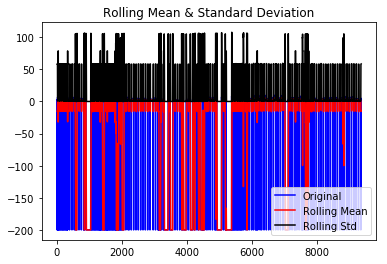

Results of Dickey-Fuller Test:
Test Statistic                -9.552225e+00
p-value                        2.553762e-16
#Lags Used                     2.800000e+01
Number of Observations Used    9.328000e+03
Critical Value (1%)           -3.431051e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            1.190468
p-value                   0.010000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




PT08.S1(CO)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


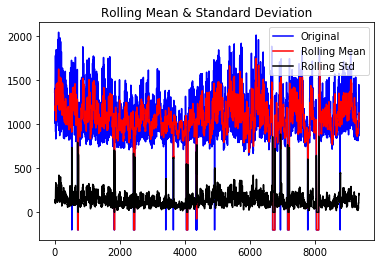

Results of Dickey-Fuller Test:
Test Statistic                -1.069065e+01
p-value                        3.733641e-19
#Lags Used                     3.600000e+01
Number of Observations Used    9.320000e+03
Critical Value (1%)           -3.431052e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            0.286484
p-value                   0.100000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




NMHC(GT)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1278: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


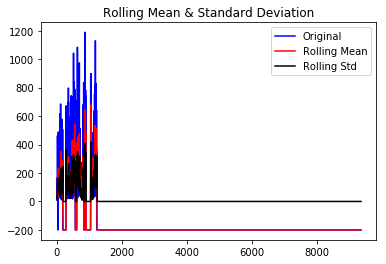

Results of Dickey-Fuller Test:
Test Statistic                -6.391014e+00
p-value                        2.105931e-08
#Lags Used                     3.700000e+01
Number of Observations Used    9.319000e+03
Critical Value (1%)           -3.431052e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            6.902341
p-value                   0.010000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




C6H6(GT)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


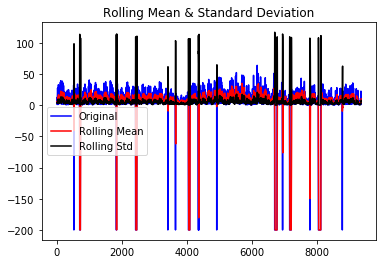

Results of Dickey-Fuller Test:
Test Statistic                -1.103248e+01
p-value                        5.622890e-20
#Lags Used                     2.500000e+01
Number of Observations Used    9.331000e+03
Critical Value (1%)           -3.431051e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            0.317232
p-value                   0.100000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




PT08.S2(NMHC)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1278: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


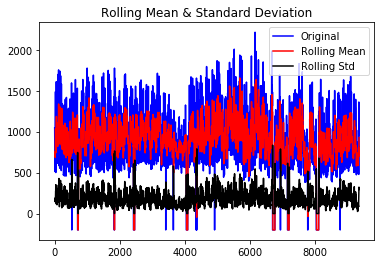

Results of Dickey-Fuller Test:
Test Statistic                -1.058964e+01
p-value                        6.578483e-19
#Lags Used                     3.700000e+01
Number of Observations Used    9.319000e+03
Critical Value (1%)           -3.431052e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            0.859891
p-value                   0.010000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




NOx(GT)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


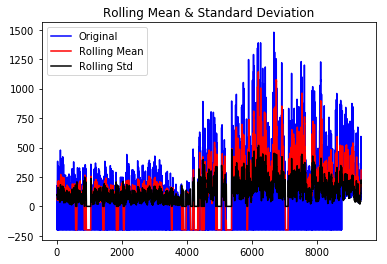

Results of Dickey-Fuller Test:
Test Statistic                -7.727651e+00
p-value                        1.147579e-11
#Lags Used                     3.000000e+01
Number of Observations Used    9.326000e+03
Critical Value (1%)           -3.431051e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            7.592001
p-value                   0.010000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




PT08.S3(NOx)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


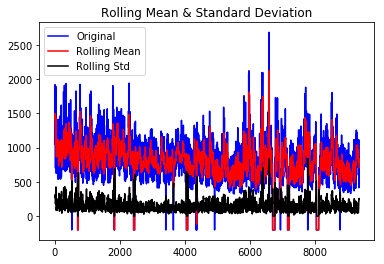

Results of Dickey-Fuller Test:
Test Statistic                -1.070934e+01
p-value                        3.363197e-19
#Lags Used                     3.800000e+01
Number of Observations Used    9.318000e+03
Critical Value (1%)           -3.431052e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            2.806853
p-value                   0.010000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




NO2(GT)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


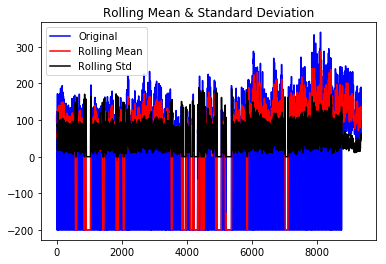

Results of Dickey-Fuller Test:
Test Statistic                -8.175770e+00
p-value                        8.385434e-13
#Lags Used                     3.400000e+01
Number of Observations Used    9.322000e+03
Critical Value (1%)           -3.431052e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            3.11056
p-value                   0.01000
Lags Used                38.00000
Critical Value (10%)      0.34700
Critical Value (5%)       0.46300
Critical Value (2.5%)     0.57400
Critical Value (1%)       0.73900
dtype: float64




PT08.S4(NO2)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


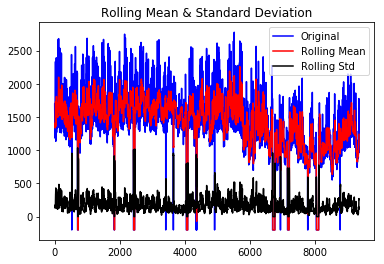

Results of Dickey-Fuller Test:
Test Statistic                -9.202227e+00
p-value                        1.987842e-15
#Lags Used                     2.900000e+01
Number of Observations Used    9.327000e+03
Critical Value (1%)           -3.431051e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            7.518317
p-value                   0.010000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




PT08.S5(O3)  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


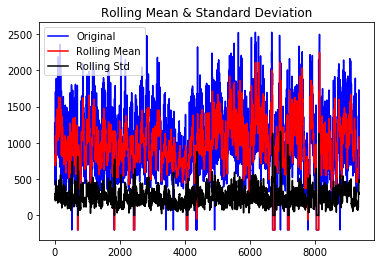

Results of Dickey-Fuller Test:
Test Statistic                -1.140111e+01
p-value                        7.644253e-21
#Lags Used                     2.900000e+01
Number of Observations Used    9.327000e+03
Critical Value (1%)           -3.431051e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            0.412316
p-value                   0.071846
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




T  column under investigation...


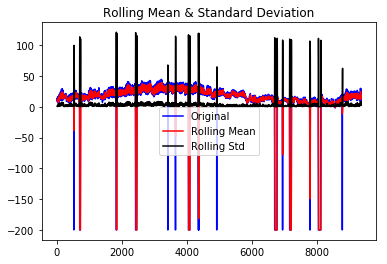

Results of Dickey-Fuller Test:
Test Statistic                -1.095375e+01
p-value                        8.666324e-20
#Lags Used                     1.400000e+01
Number of Observations Used    9.342000e+03
Critical Value (1%)           -3.431050e+00
Critical Value (5%)           -2.861849e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            1.26297
p-value                   0.01000
Lags Used                38.00000
Critical Value (10%)      0.34700
Critical Value (5%)       0.46300
Critical Value (2.5%)     0.57400
Critical Value (1%)       0.73900
dtype: float64




RH  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1276: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


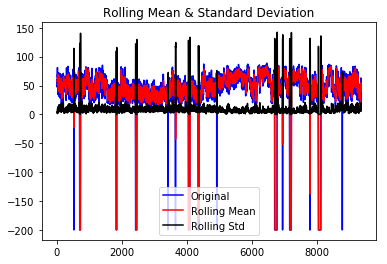

Results of Dickey-Fuller Test:
Test Statistic                -9.995876e+00
p-value                        1.940944e-17
#Lags Used                     3.800000e+01
Number of Observations Used    9.318000e+03
Critical Value (1%)           -3.431052e+00
Critical Value (5%)           -2.861850e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            0.139171
p-value                   0.100000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64




AH  column under investigation...


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1278: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


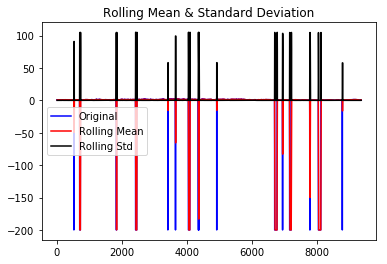

Results of Dickey-Fuller Test:
Test Statistic                -1.123486e+01
p-value                        1.868185e-20
#Lags Used                     1.400000e+01
Number of Observations Used    9.342000e+03
Critical Value (1%)           -3.431050e+00
Critical Value (5%)           -2.861849e+00
Critical Value (10%)          -2.566935e+00
dtype: float64



Results of KPSS Test:
Test Statistic            0.273944
p-value                   0.100000
Lags Used                38.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64





/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/statsmodels/tsa/stattools.py:1278: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


In [46]:
for i in range(data.shape[1]):
    print('===============================================\n')
    print(data.columns[i], ' column under investigation...')
    
    test_stationarity(data.iloc[:,i])
    
    print('\n')
    print('===============================================\n')

In [47]:
data.shape[0] # self._rows ~ number of timesteps

9357

In [48]:
data.shape[1] # self._cols ~ number of features

13

In [2]:
class GAN():
    '''
        A class for a Generative Adversarial Network.
    
    '''
    
    def __init__(self):
        # Properties initialisation
        self._rows = 13
        self._cols = 1
        self._channels = 1
        self._input_shape = (self._rows, self._cols)
        self._latent_dim = 100 # shape of the noise
        self._synthetic_data = pd.DataFrame()
        self._scaler = MinMaxScaler()
        
        opt = Adam(0.0002, 0.5)
                
        # Get a discriminator
        self._discriminator = self.get_discriminator()
        self._discriminator.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
        
        # Get a generator
        self._generator = self.get_generator()
        
        # Feed the generator with noise to generate adversarial input/images
        noise = Input(shape=(self._latent_dim,))
        adv_input = self._generator(noise)
        
        # The discriminator will not be trained in the full GAN model
        self._discriminator.trainable = False
        
        # Feed the discriminator with the adversarial input
        validity = self._discriminator(adv_input)
        
        # Get the full GAN model (generator -> discriminator)
        self._full_gan = Model(noise, validity)
        self._full_gan.compile(loss='binary_crossentropy', optimizer=opt)
    
    def get_discriminator(self):
        '''
            This function builds the architecture of the discriminator model (or validator)
            In our case, the discriminator is a deep CNN-based neural architecture and is 
            responsible for the validation of the given image (legit or fake).
            
        '''
        
        model = Sequential()

        model.add(Flatten(input_shape=self._input_shape))
        
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        
        model.add(Dense(1, activation='sigmoid'))
        
        model.summary()
        
        disc_input = Input(shape=self._input_shape)
        validity = model(disc_input)
        
        return Model(disc_input, validity)
    
    
    def get_generator(self):
        '''
            This function builds the architecture of the generator model (or adversary)
            In our case, the generator is a deep CNN-based neural architecture and is 
            responsible for the generating adversarial input to the discriminator.
            
        '''
        
        model = Sequential()
        
        model.add(Dense(256, input_dim=self._latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.9))
        
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.9))
        
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.9))
        
        model.add(Dense(np.prod(self._input_shape), activation='sigmoid'))
        model.add(Reshape(self._input_shape))
        
        model.summary()
        
        noise = Input(shape=(self._latent_dim,))
        adv_input = model(noise)
        
        return Model(noise, adv_input)
    
    
    def predictions(self, epoch):
        '''
            On a per-epoch basis prediction. The GAN predicts the new generated images 
            and generates new samples in this way.
        
        '''
        
        num_rows = 5
        num_cols = 5
        
        # Sample random noise
        noise = np.random.normal(0, 1, (num_rows*num_cols, self._latent_dim))
        
        # Get samples from the generator
        gen_samples = self._generator.predict(noise)
        gen_samples = np.squeeze(gen_samples)
        gen_samples = pd.DataFrame(gen_samples)
        print('Generated samples: \n\n',gen_samples.head())
        
        for i in range(gen_samples.shape[0]):
            self._synthetic_data = pd.concat([self._synthetic_data, gen_samples], axis=0)
        
    
    def plot_results(self, disc_losses, gen_losses, model_accuracies):
        '''
            Plot the results of the training of the GAN
        
        '''
        
        # Plot losses
        plt.figure()
        plt.plot(disc_losses)
        plt.plot(gen_losses)
        plt.title('GAN loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Discriminator', 'Generator'], loc='upper left')
        plt.savefig('gan_losses.png')
        
        # Plot accuracy
        plt.figure()
        plt.plot(model_accuracies)
        plt.title('GAN accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['GAN'], loc='upper left')
        plt.savefig('gan_accuracy.png')
    
    
    def run(self, epochs, batch_size, interval_size, verbose=0):
        '''
            This function is responsible for loading and manipulating the data as well as training the
            Generative Adversarial Network.
            
            epochs: The number of epochs which the model will use for its training.
            batch_size: The batch size for the (batch) training of the model.
            save_images: A flag indicating whether we want to save the generated images or not.
        
        '''
        
        original_data = pd.read_csv('~/Desktop/AirQuality/air_quality.csv', delimiter=';')
        original_data = original_data.drop(['Date', 'Time'], axis=1)
        original_data = self._scaler.fit_transform(original_data)
        pd.DataFrame(original_data).to_csv('air_quality_original_transformed_data.csv')
        original_data = np.expand_dims(original_data, axis=3)
        
        # Adversarial ground truths
        valid = np.ones((batch_size, 1)) # real are labelled as one
        adversaries = np.zeros((batch_size, 1)) # adversaries/fake are labelled as zero
        
        disc_losses = np.zeros((epochs,))
        gen_losses = np.zeros((epochs,))
        model_accuracies = np.zeros((epochs,))
        
        start = time.time()
        
        for epoch in range(epochs):
            
            # Train the discriminator
            '''
                The goal of the discriminator is to detect which input is legit or adversary.
                The discriminator must not be fooled by the adversary generator model at all times.
            
            '''
            
            # Random sampling of images
            idx = np.random.randint(0, original_data.shape[0], batch_size)
            samples = original_data[idx]
            
            # Sample noise
            noise = np.random.normal(0, 1, (batch_size, self._latent_dim))
            
            # Generate noisy/adversarial images (input to the discriminator/validator)
            adv_samples = self._generator.predict(noise)
            
            # Train the discriminator and get the loss from the real and adversary input
            disc_loss_real = self._discriminator.train_on_batch(samples, valid)
            disc_loss_adv = self._discriminator.train_on_batch(adv_samples, adversaries)
            
            # Calculate loss of discriminator
            disc_loss = np.add(disc_loss_real, disc_loss_adv) / 2
            
            # Train the generator
            '''
                The goal of the generator is to fool successfully the discriminator.
                The ultimate target is to have a quite robust discriminator.
            
            '''
            
            # Calculate the loss of the generator
            gen_loss = self._full_gan.train_on_batch(noise, valid)
            
            # Save the training history
            disc_losses[epoch] = disc_loss[0]
            gen_losses[epoch] = gen_loss
            model_accuracies[epoch] = disc_loss[1]
            
            if verbose == 1:
                print ("%d [Discriminator loss: %f, Discriminator accuracy: %.2f%%] Generator loss: %f" % (epoch, disc_loss[0], 100*disc_loss[1], gen_loss))
            
            print('Epoch:', epoch+1)
            
            # Batch predictions (according to interval size)
            if epoch % interval_size == 0:
                self.predictions(epoch)
        
        print('Time elapsed during training: ', time.time()-start, 'seconds.')
        
        self.plot_results(disc_losses, gen_losses, model_accuracies)
        
        print('Mean discriminator loss:', np.mean(disc_loss[0]))
        print('Mean discriminator accuracy:', np.mean(disc_loss[1]))
        print('Mean generator loss:', np.mean(gen_loss))
        
        self._synthetic_data.to_csv('air_quality_synthetic_transformed_data.csv')
                

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 13)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               7168      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 257       
Total params: 138,753
Trainable params: 138,753
Non-trainable params: 0
_________________________________________________________________
____

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/sklearn/preprocessing/data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:165: DeprecationWarning: Both axis > a.ndim and axis < -a.ndim - 1 are deprecated and will raise an AxisError in the future.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did

Epoch: 1
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.128632  0.005443  0.000043  0.239517  0.493661  0.019043  0.045006   
1  0.011467  0.023275  0.709944  0.001712  0.581607  0.647436  0.570944   
2  0.292561  0.983371  0.017331  0.732170  0.587747  0.934109  0.799477   
3  0.417605  0.547787  0.195891  0.182734  0.948469  0.569451  0.038589   
4  0.403720  0.002017  0.348226  0.616024  0.707417  0.057062  0.395319   

         7         8         9         10        11        12  
0  0.942179  0.320686  0.238162  0.996715  0.794487  0.319978  
1  0.675149  0.863902  0.903250  0.990790  0.029275  0.002230  
2  0.015181  0.125057  0.330021  0.927975  0.176220  0.139010  
3  0.706143  0.842568  0.006153  0.835030  0.865898  0.885589  
4  0.683119  0.965200  0.446883  0.969486  0.364496  0.038204  
Epoch: 2
Epoch: 3
Epoch: 4
Epoch: 5
Epoch: 6
Epoch: 7
Epoch: 8
Epoch: 9
Epoch: 10
Epoch: 11
Epoch: 12
Epoch: 13
Epoch: 14


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15
Epoch: 16
Epoch: 17
Epoch: 18
Epoch: 19
Epoch: 20
Epoch: 21
Epoch: 22
Epoch: 23
Epoch: 24
Epoch: 25
Epoch: 26
Epoch: 27
Epoch: 28
Epoch: 29


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 30
Epoch: 31
Epoch: 32
Epoch: 33
Epoch: 34
Epoch: 35
Epoch: 36
Epoch: 37
Epoch: 38
Epoch: 39
Epoch: 40
Epoch: 41
Epoch: 42
Epoch: 43
Epoch: 44
Epoch: 45


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 46
Epoch: 47
Epoch: 48
Epoch: 49
Epoch: 50
Epoch: 51
Epoch: 52
Epoch: 53
Epoch: 54
Epoch: 55
Epoch: 56
Epoch: 57
Epoch: 58
Epoch: 59
Epoch: 60


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 61
Epoch: 62
Epoch: 63
Epoch: 64
Epoch: 65
Epoch: 66
Epoch: 67
Epoch: 68
Epoch: 69
Epoch: 70
Epoch: 71
Epoch: 72
Epoch: 73
Epoch: 74
Epoch: 75


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 76
Epoch: 77
Epoch: 78
Epoch: 79
Epoch: 80
Epoch: 81
Epoch: 82
Epoch: 83
Epoch: 84
Epoch: 85
Epoch: 86
Epoch: 87
Epoch: 88
Epoch: 89
Epoch: 90


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 91
Epoch: 92
Epoch: 93
Epoch: 94
Epoch: 95
Epoch: 96
Epoch: 97
Epoch: 98
Epoch: 99
Epoch: 100
Epoch: 101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.571290  0.821427  0.568931  0.613212  0.038674  0.896520  0.122274   
1  0.307117  0.153263  0.999999  0.011944  0.017548  0.022117  0.373483   
2  0.953234  0.921160  0.921874  0.988148  0.468273  0.201873  0.015962   
3  0.176321  0.182482  0.001444  0.990287  0.061876  0.321359  0.928647   
4  0.989141  0.947396  0.001012  0.968841  0.600450  0.009018  0.246294   

         7         8         9         10        11        12  
0  0.933939  0.796635  0.732291  0.619335  0.993602  0.290304  
1  0.000955  0.013750  0.226771  0.193923  0.271824  0.024908  
2  0.635903  0.986720  0.537700  0.954889  0.999027  0.998683  
3  0.311939  0.112432  0.945464  0.874572  0.995759  0.993839  
4  0.502774  0.998712  0.124634  0.226461  0.807695  0.855894  
Epoch: 102
Epoch: 103


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 104
Epoch: 105
Epoch: 106
Epoch: 107
Epoch: 108
Epoch: 109
Epoch: 110
Epoch: 111
Epoch: 112
Epoch: 113
Epoch: 114
Epoch: 115
Epoch: 116
Epoch: 117
Epoch: 118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 119
Epoch: 120
Epoch: 121
Epoch: 122
Epoch: 123
Epoch: 124
Epoch: 125
Epoch: 126
Epoch: 127
Epoch: 128
Epoch: 129
Epoch: 130
Epoch: 131
Epoch: 132
Epoch: 133
Epoch: 134


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 135
Epoch: 136
Epoch: 137
Epoch: 138
Epoch: 139
Epoch: 140
Epoch: 141
Epoch: 142
Epoch: 143
Epoch: 144
Epoch: 145
Epoch: 146
Epoch: 147
Epoch: 148
Epoch: 149


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 150
Epoch: 151
Epoch: 152
Epoch: 153
Epoch: 154
Epoch: 155
Epoch: 156
Epoch: 157
Epoch: 158
Epoch: 159
Epoch: 160
Epoch: 161
Epoch: 162
Epoch: 163
Epoch: 164
Epoch: 165


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 166
Epoch: 167
Epoch: 168
Epoch: 169
Epoch: 170
Epoch: 171
Epoch: 172
Epoch: 173
Epoch: 174
Epoch: 175
Epoch: 176
Epoch: 177
Epoch: 178
Epoch: 179
Epoch: 180


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 181
Epoch: 182
Epoch: 183
Epoch: 184
Epoch: 185
Epoch: 186
Epoch: 187
Epoch: 188
Epoch: 189
Epoch: 190
Epoch: 191
Epoch: 192
Epoch: 193
Epoch: 194
Epoch: 195
Epoch: 196
Epoch: 197


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 198
Epoch: 199
Epoch: 200
Epoch: 201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.801130  0.269644  0.001336  0.197008  0.060741  0.116350  0.079050   
1  0.952089  0.263124  0.002579  0.627904  0.235234  0.025618  0.035164   
2  0.966565  0.449509  0.147752  0.648305  0.211146  0.037010  0.020131   
3  0.599173  0.779428  0.000722  0.906539  0.878064  0.155141  0.491255   
4  0.616069  0.011180  0.260288  0.064573  0.056993  0.176650  0.240800   

         7         8         9         10        11        12  
0  0.112768  0.091511  0.087115  0.900013  0.857279  0.907927  
1  0.256063  0.365599  0.134137  0.953133  0.979605  0.979386  
2  0.467119  0.143104  0.267447  0.930348  0.965294  0.985302  
3  0.279378  0.376782  0.331672  0.900049  0.805816  0.960561  
4  0.166979  0.013050  0.041521  0.637675  0.267643  0.383450  
Epoch: 202
Epoch: 203
Epoch: 204
Epoch: 205
Epoch: 206
Epoch: 207
Epoch: 208
Epoch: 209
Epoch: 210


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 212
Epoch: 213
Epoch: 214
Epoch: 215
Epoch: 216
Epoch: 217
Epoch: 218
Epoch: 219
Epoch: 220
Epoch: 221
Epoch: 222
Epoch: 223
Epoch: 224
Epoch: 225
Epoch: 226
Epoch: 227


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 228
Epoch: 229
Epoch: 230
Epoch: 231
Epoch: 232
Epoch: 233
Epoch: 234
Epoch: 235
Epoch: 236
Epoch: 237
Epoch: 238
Epoch: 239
Epoch: 240
Epoch: 241
Epoch: 242
Epoch: 243


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 244
Epoch: 245
Epoch: 246
Epoch: 247
Epoch: 248
Epoch: 249
Epoch: 250
Epoch: 251
Epoch: 252
Epoch: 253
Epoch: 254
Epoch: 255
Epoch: 256
Epoch: 257
Epoch: 258
Epoch: 259


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 260
Epoch: 261
Epoch: 262
Epoch: 263
Epoch: 264
Epoch: 265
Epoch: 266
Epoch: 267
Epoch: 268
Epoch: 269
Epoch: 270
Epoch: 271
Epoch: 272
Epoch: 273
Epoch: 274
Epoch: 275


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 276
Epoch: 277
Epoch: 278
Epoch: 279
Epoch: 280
Epoch: 281
Epoch: 282
Epoch: 283
Epoch: 284
Epoch: 285
Epoch: 286
Epoch: 287
Epoch: 288
Epoch: 289
Epoch: 290


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 291
Epoch: 292
Epoch: 293
Epoch: 294
Epoch: 295
Epoch: 296
Epoch: 297
Epoch: 298
Epoch: 299
Epoch: 300
Epoch: 301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.875898  0.415197  0.016436  0.809520  0.343352  0.054702  0.053471   
1  0.208290  0.172165  0.011853  0.173917  0.010558  0.006521  0.008570   
2  0.497121  0.522978  0.178224  0.823789  0.178820  0.031775  0.448794   
3  0.009459  0.551269  0.098283  0.054342  0.001191  0.028057  0.003693   
4  0.744812  0.754640  0.008337  0.905439  0.486914  0.110475  0.072145   

         7         8         9         10        11        12  
0  0.638647  0.478860  0.382131  0.887107  0.565567  0.950129  
1  0.180310  0.007575  0.093867  0.134792  0.026062  0.917568  
2  0.821196  0.284926  0.342686  0.867785  0.744637  0.884566  
3  0.708557  0.004699  0.249481  0.017294  0.010747  0.720691  
4  0.198938  0.454122  0.299919  0.883555  0.835499  0.951208  
Epoch: 302
Epoch: 303


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 305
Epoch: 306
Epoch: 307
Epoch: 308
Epoch: 309
Epoch: 310
Epoch: 311
Epoch: 312
Epoch: 313
Epoch: 314
Epoch: 315
Epoch: 316
Epoch: 317
Epoch: 318
Epoch: 319
Epoch: 320


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 321
Epoch: 322
Epoch: 323
Epoch: 324
Epoch: 325
Epoch: 326
Epoch: 327
Epoch: 328
Epoch: 329
Epoch: 330
Epoch: 331
Epoch: 332
Epoch: 333
Epoch: 334
Epoch: 335
Epoch: 336


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 337
Epoch: 338
Epoch: 339
Epoch: 340
Epoch: 341
Epoch: 342
Epoch: 343
Epoch: 344
Epoch: 345
Epoch: 346
Epoch: 347
Epoch: 348
Epoch: 349
Epoch: 350
Epoch: 351
Epoch: 352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 353
Epoch: 354
Epoch: 355
Epoch: 356
Epoch: 357
Epoch: 358
Epoch: 359
Epoch: 360
Epoch: 361
Epoch: 362
Epoch: 363
Epoch: 364
Epoch: 365
Epoch: 366
Epoch: 367
Epoch: 368


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 369
Epoch: 370
Epoch: 371
Epoch: 372
Epoch: 373
Epoch: 374
Epoch: 375
Epoch: 376
Epoch: 377
Epoch: 378
Epoch: 379
Epoch: 380
Epoch: 381
Epoch: 382


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 383
Epoch: 384
Epoch: 385
Epoch: 386
Epoch: 387
Epoch: 388
Epoch: 389
Epoch: 390
Epoch: 391
Epoch: 392
Epoch: 393
Epoch: 394


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 395
Epoch: 396
Epoch: 397
Epoch: 398
Epoch: 399
Epoch: 400
Epoch: 401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.882109  0.456379  0.013477  0.848883  0.456016  0.098022  0.008621   
1  0.307771  0.256475  0.016191  0.612456  0.702842  0.068788  0.024535   
2  0.345583  0.575826  0.023155  0.542222  0.212759  0.004992  0.903952   
3  0.011957  0.877714  0.023964  0.710353  0.267356  0.004284  0.500644   
4  0.969010  0.408029  0.004342  0.898339  0.644880  0.522672  0.090128   

         7         8         9         10        11        12  
0  0.295653  0.465793  0.530297  0.921190  0.883583  0.993676  
1  0.351853  0.554032  0.645447  0.829240  0.905032  0.935765  
2  0.040679  0.692158  0.335749  0.477804  0.806914  0.964201  
3  0.069982  0.798097  0.396958  0.835755  0.639108  0.921085  
4  0.732579  0.728632  0.327030  0.924664  0.954601  0.989702  
Epoch: 402
Epoch: 403
Epoch: 404
Epoch: 405


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 406
Epoch: 407
Epoch: 408
Epoch: 409
Epoch: 410
Epoch: 411
Epoch: 412
Epoch: 413
Epoch: 414
Epoch: 415
Epoch: 416
Epoch: 417
Epoch: 418
Epoch: 419
Epoch: 420
Epoch: 421
Epoch: 422


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 423
Epoch: 424
Epoch: 425
Epoch: 426
Epoch: 427
Epoch: 428
Epoch: 429
Epoch: 430
Epoch: 431
Epoch: 432
Epoch: 433
Epoch: 434
Epoch: 435
Epoch: 436
Epoch: 437
Epoch: 438
Epoch: 439


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 440
Epoch: 441
Epoch: 442
Epoch: 443
Epoch: 444
Epoch: 445
Epoch: 446
Epoch: 447
Epoch: 448
Epoch: 449
Epoch: 450
Epoch: 451
Epoch: 452
Epoch: 453


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 454
Epoch: 455
Epoch: 456
Epoch: 457
Epoch: 458
Epoch: 459
Epoch: 460
Epoch: 461
Epoch: 462
Epoch: 463
Epoch: 464
Epoch: 465
Epoch: 466
Epoch: 467


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 468
Epoch: 469
Epoch: 470
Epoch: 471
Epoch: 472
Epoch: 473
Epoch: 474
Epoch: 475
Epoch: 476
Epoch: 477
Epoch: 478
Epoch: 479


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 480
Epoch: 481
Epoch: 482
Epoch: 483
Epoch: 484
Epoch: 485
Epoch: 486
Epoch: 487
Epoch: 488
Epoch: 489
Epoch: 490
Epoch: 491
Epoch: 492
Epoch: 493


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 494
Epoch: 495
Epoch: 496
Epoch: 497
Epoch: 498
Epoch: 499
Epoch: 500
Epoch: 501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.960962  0.497700  0.011157  0.876198  0.402537  0.041512  0.523188   
1  0.117042  0.855377  0.011535  0.852016  0.588374  0.052703  0.388246   
2  0.675227  0.554912  0.005369  0.742562  0.626367  0.044010  0.359466   
3  0.894204  0.562378  0.007561  0.678310  0.354681  0.096064  0.657487   
4  0.963232  0.777021  0.011348  0.811893  0.223013  0.164083  0.749276   

         7         8         9         10        11        12  
0  0.430403  0.473789  0.686612  0.946916  0.903730  0.995113  
1  0.175199  0.558802  0.519053  0.974468  0.928403  0.991895  
2  0.124394  0.672788  0.403929  0.830509  0.929739  0.933614  
3  0.355671  0.629233  0.646650  0.902374  0.930781  0.975028  
4  0.577779  0.628942  0.520887  0.824990  0.836894  0.957981  
Epoch: 502
Epoch: 503
Epoch: 504
Epoch: 505
Epoch: 506


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 507
Epoch: 508
Epoch: 509
Epoch: 510
Epoch: 511
Epoch: 512
Epoch: 513
Epoch: 514
Epoch: 515
Epoch: 516
Epoch: 517


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 518
Epoch: 519
Epoch: 520
Epoch: 521
Epoch: 522
Epoch: 523
Epoch: 524
Epoch: 525
Epoch: 526
Epoch: 527
Epoch: 528
Epoch: 529
Epoch: 530
Epoch: 531
Epoch: 532
Epoch: 533
Epoch: 534


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 535
Epoch: 536
Epoch: 537
Epoch: 538
Epoch: 539
Epoch: 540
Epoch: 541
Epoch: 542
Epoch: 543
Epoch: 544
Epoch: 545
Epoch: 546
Epoch: 547
Epoch: 548
Epoch: 549
Epoch: 550

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo


Epoch: 551
Epoch: 552
Epoch: 553
Epoch: 554
Epoch: 555
Epoch: 556
Epoch: 557
Epoch: 558
Epoch: 559
Epoch: 560
Epoch: 561
Epoch: 562
Epoch: 563
Epoch: 564


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 565
Epoch: 566
Epoch: 567
Epoch: 568
Epoch: 569
Epoch: 570
Epoch: 571
Epoch: 572
Epoch: 573
Epoch: 574
Epoch: 575
Epoch: 576
Epoch: 577
Epoch: 578
Epoch: 579
Epoch: 580
Epoch: 581


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 582
Epoch: 583
Epoch: 584
Epoch: 585
Epoch: 586
Epoch: 587
Epoch: 588
Epoch: 589
Epoch: 590
Epoch: 591
Epoch: 592
Epoch: 593
Epoch: 594
Epoch: 595
Epoch: 596
Epoch: 597
Epoch: 598


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 599
Epoch: 600
Epoch: 601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.996294  0.582909  0.070100  0.826681  0.387473  0.600655  0.220068   
1  0.828345  0.592630  0.008080  0.728048  0.393200  0.316505  0.396958   
2  0.960159  0.572019  0.004268  0.643156  0.636333  0.322532  0.215087   
3  0.973460  0.640174  0.018379  0.842895  0.430219  0.339225  0.294854   
4  0.863603  0.656922  0.002763  0.890598  0.743905  0.106303  0.270958   

         7         8         9         10        11        12  
0  0.574304  0.719708  0.646456  0.945014  0.752085  0.952672  
1  0.610464  0.532245  0.552120  0.930204  0.854299  0.971541  
2  0.771261  0.491890  0.676686  0.866181  0.876098  0.989435  
3  0.505579  0.182409  0.452713  0.972018  0.877708  0.983723  
4  0.329982  0.655580  0.402061  0.929832  0.961315  0.997276  
Epoch: 602
Epoch: 603
Epoch: 604
Epoch: 605
Epoch: 606
Epoch: 607
Epoch: 608
Epoch: 609
Epoch: 610
Epoch: 611


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 613
Epoch: 614
Epoch: 615
Epoch: 616
Epoch: 617
Epoch: 618
Epoch: 619
Epoch: 620
Epoch: 621
Epoch: 622
Epoch: 623
Epoch: 624
Epoch: 625
Epoch: 626
Epoch: 627
Epoch: 628


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 629
Epoch: 630
Epoch: 631
Epoch: 632
Epoch: 633
Epoch: 634
Epoch: 635
Epoch: 636
Epoch: 637
Epoch: 638
Epoch: 639
Epoch: 640


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 641
Epoch: 642
Epoch: 643
Epoch: 644
Epoch: 645
Epoch: 646
Epoch: 647
Epoch: 648
Epoch: 649
Epoch: 650
Epoch: 651
Epoch: 652
Epoch: 653
Epoch: 654


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 655
Epoch: 656
Epoch: 657
Epoch: 658
Epoch: 659
Epoch: 660
Epoch: 661
Epoch: 662
Epoch: 663
Epoch: 664
Epoch: 665
Epoch: 666
Epoch: 667
Epoch: 668
Epoch: 669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 670
Epoch: 671
Epoch: 672
Epoch: 673
Epoch: 674
Epoch: 675
Epoch: 676
Epoch: 677
Epoch: 678
Epoch: 679
Epoch: 680
Epoch: 681
Epoch: 682
Epoch: 683
Epoch: 684
Epoch: 685


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 686
Epoch: 687
Epoch: 688
Epoch: 689
Epoch: 690
Epoch: 691
Epoch: 692
Epoch: 693
Epoch: 694
Epoch: 695
Epoch: 696
Epoch: 697
Epoch: 698
Epoch: 699
Epoch: 700
Epoch: 701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.537980  0.680259  0.002398  0.890424  0.653026  0.098570  0.401921   
1  0.239314  0.673111  0.002447  0.766196  0.436239  0.058545  0.259239   
2  0.082244  0.688907  0.009645  0.797458  0.455468  0.089320  0.379295   
3  0.616741  0.672710  0.002025  0.910462  0.380536  0.082217  0.332111   
4  0.816074  0.635021  0.004325  0.740097  0.613191  0.233329  0.338999   

         7         8         9         10        11        12  
0  0.280163  0.583326  0.247844  0.959133  0.852414  0.998476  
1  0.201146  0.595372  0.511080  0.905083  0.958023  0.993953  
2  0.107068  0.702387  0.612986  0.939674  0.940879  0.986013  
3  0.222433  0.412840  0.568145  0.989101  0.866068  0.997242  
4  0.286009  0.611133  0.598359

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 702
Epoch: 703
Epoch: 704
Epoch: 705
Epoch: 706
Epoch: 707
Epoch: 708
Epoch: 709
Epoch: 710
Epoch: 711
Epoch: 712
Epoch: 713
Epoch: 714
Epoch: 715
Epoch: 716
Epoch: 717
Epoch: 718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 719
Epoch: 720
Epoch: 721
Epoch: 722
Epoch: 723
Epoch: 724
Epoch: 725
Epoch: 726
Epoch: 727
Epoch: 728
Epoch: 729
Epoch: 730
Epoch: 731
Epoch: 732
Epoch: 733
Epoch: 734


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 735
Epoch: 736
Epoch: 737
Epoch: 738
Epoch: 739
Epoch: 740
Epoch: 741
Epoch: 742
Epoch: 743
Epoch: 744
Epoch: 745
Epoch: 746
Epoch: 747
Epoch: 748
Epoch: 749
Epoch: 750


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 751
Epoch: 752
Epoch: 753
Epoch: 754
Epoch: 755
Epoch: 756
Epoch: 757
Epoch: 758
Epoch: 759
Epoch: 760
Epoch: 761
Epoch: 762
Epoch: 763
Epoch: 764
Epoch: 765
Epoch: 766


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 767
Epoch: 768
Epoch: 769
Epoch: 770
Epoch: 771
Epoch: 772
Epoch: 773
Epoch: 774
Epoch: 775
Epoch: 776
Epoch: 777
Epoch: 778
Epoch: 779
Epoch: 780
Epoch: 781
Epoch: 782
Epoch: 783


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 784
Epoch: 785
Epoch: 786
Epoch: 787
Epoch: 788
Epoch: 789
Epoch: 790
Epoch: 791
Epoch: 792
Epoch: 793
Epoch: 794
Epoch: 795
Epoch: 796
Epoch: 797
Epoch: 798
Epoch: 799
Epoch: 800


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.409934  0.648464  0.002445  0.745590  0.373821  0.043260  0.289050   
1  0.975391  0.520036  0.008183  0.794263  0.322495  0.386635  0.766367   
2  0.210392  0.355426  0.004474  0.770529  0.524343  0.062143  0.291848   
3  0.997594  0.683187  0.004093  0.853509  0.486513  0.111528  0.162914   
4  0.805859  0.676177  0.001996  0.865582  0.451066  0.057423  0.231662   

         7         8         9         10        11        12  
0  0.192448  0.838095  0.333307  0.954870  0.923026  0.989807  
1  0.708315  0.435839  0.211806  0.854098  0.833867  0.982217  
2  0.162532  0.638566  0.572056  0.974741  0.761166  0.993339  
3  0.686522  0.460884  0.397858  0.850421  0.839161  0.998283  
4  0.587140  0.466958  0.477468  0.937268  0.877267  0.988406  
Epoch: 802
Epoch: 803
Epoch: 804
Epoch: 805
Epoch: 806
Epoch: 807
Epoch: 808
Epoch: 809
Epoch: 810
Epoch: 811
Epoch: 812
Epoch: 813


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 815
Epoch: 816
Epoch: 817
Epoch: 818
Epoch: 819
Epoch: 820
Epoch: 821
Epoch: 822
Epoch: 823
Epoch: 824
Epoch: 825
Epoch: 826
Epoch: 827
Epoch: 828
Epoch: 829
Epoch: 830


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 831
Epoch: 832
Epoch: 833
Epoch: 834
Epoch: 835
Epoch: 836
Epoch: 837
Epoch: 838
Epoch: 839
Epoch: 840
Epoch: 841
Epoch: 842
Epoch: 843
Epoch: 844
Epoch: 845
Epoch: 846


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 847
Epoch: 848
Epoch: 849
Epoch: 850
Epoch: 851
Epoch: 852
Epoch: 853
Epoch: 854
Epoch: 855
Epoch: 856
Epoch: 857
Epoch: 858
Epoch: 859
Epoch: 860
Epoch: 861


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 862
Epoch: 863
Epoch: 864
Epoch: 865
Epoch: 866
Epoch: 867
Epoch: 868
Epoch: 869
Epoch: 870
Epoch: 871
Epoch: 872
Epoch: 873
Epoch: 874


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 875
Epoch: 876
Epoch: 877
Epoch: 878
Epoch: 879
Epoch: 880
Epoch: 881
Epoch: 882
Epoch: 883
Epoch: 884
Epoch: 885
Epoch: 886
Epoch: 887


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 888
Epoch: 889
Epoch: 890
Epoch: 891
Epoch: 892
Epoch: 893
Epoch: 894
Epoch: 895
Epoch: 896
Epoch: 897
Epoch: 898
Epoch: 899
Epoch: 900
Epoch: 901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.998945  0.566919  0.042718  0.818698  0.673648  0.630089  0.282086   
1  0.038362  0.453243  0.000987  0.821327  0.374404  0.019270  0.187433   
2  0.006324  0.373583  0.008513  0.765308  0.344813  0.029735  0.593514   
3  0.921439  0.636246  0.012559  0.832524  0.613492  0.230533  0.273032   
4  0.986124  0.495089  0.007187  0.896985  0.672014  0.136339  0.522749   

         7         8         9         10        11        12  
0  0.769316  0.674647  0.786619  0.822981  0.894459  0.993386  
1  0.074909  0.757178  0.350500  0.898843  0.814835  0.996938  
2  0.052050  0.635210  0.262993  0.903527  0.786822  0.987262  
3  0.592571  0.616051  0.520070  0.899224  0.904521  0.986660  
4  0.834012  0.659807  0.493313  0.876822  0.844247  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 902
Epoch: 903
Epoch: 904
Epoch: 905
Epoch: 906
Epoch: 907
Epoch: 908
Epoch: 909
Epoch: 910
Epoch: 911
Epoch: 912
Epoch: 913
Epoch: 914
Epoch: 915
Epoch: 916
Epoch: 917


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 918
Epoch: 919
Epoch: 920
Epoch: 921
Epoch: 922
Epoch: 923
Epoch: 924
Epoch: 925
Epoch: 926
Epoch: 927
Epoch: 928
Epoch: 929
Epoch: 930
Epoch: 931
Epoch: 932
Epoch: 933
Epoch: 934


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 935
Epoch: 936
Epoch: 937
Epoch: 938
Epoch: 939
Epoch: 940
Epoch: 941
Epoch: 942
Epoch: 943
Epoch: 944
Epoch: 945
Epoch: 946
Epoch: 947
Epoch: 948
Epoch: 949
Epoch: 950


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 951
Epoch: 952
Epoch: 953
Epoch: 954
Epoch: 955
Epoch: 956
Epoch: 957
Epoch: 958
Epoch: 959
Epoch: 960
Epoch: 961
Epoch: 962
Epoch: 963
Epoch: 964
Epoch: 965
Epoch: 966


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 967
Epoch: 968
Epoch: 969
Epoch: 970
Epoch: 971
Epoch: 972
Epoch: 973
Epoch: 974
Epoch: 975
Epoch: 976
Epoch: 977
Epoch: 978
Epoch: 979
Epoch: 980
Epoch: 981
Epoch: 982


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 983
Epoch: 984
Epoch: 985
Epoch: 986
Epoch: 987
Epoch: 988
Epoch: 989
Epoch: 990
Epoch: 991
Epoch: 992
Epoch: 993
Epoch: 994
Epoch: 995
Epoch: 996
Epoch: 997
Epoch: 998


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 999
Epoch: 1000
Epoch: 1001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.846136  0.473972  0.005035  0.902158  0.385143  0.117269  0.215210   
1  0.983669  0.431207  0.003007  0.829339  0.546993  0.375541  0.358965   
2  0.806784  0.586903  0.000815  0.931069  0.472311  0.130233  0.422932   
3  0.977179  0.529069  0.003868  0.740139  0.526092  0.340512  0.356505   
4  0.173322  0.444815  0.001301  0.792700  0.262057  0.143894  0.505793   

         7         8         9         10        11        12  
0  0.309874  0.577860  0.379412  0.940487  0.788091  0.992077  
1  0.562806  0.580157  0.482527  0.922584  0.944441  0.996554  
2  0.445658  0.577044  0.224286  0.879044  0.819741  0.995249  
3  0.412000  0.513980  0.682523  0.901194  0.879350  0.997386  
4  0.179107  0.445773  0.346918  0.935700  0.954085  0.995521  
Epoch: 1002
Epoch: 1003
Epoch: 1004
Epoch: 1005
Epoch: 1006
Epoch: 1007
Epoch: 1008
Epoch: 1009
Epoch: 1010


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1014
Epoch: 1015
Epoch: 1016
Epoch: 1017
Epoch: 1018
Epoch: 1019
Epoch: 1020
Epoch: 1021
Epoch: 1022
Epoch: 1023
Epoch: 1024
Epoch: 1025
Epoch: 1026
Epoch: 1027
Epoch: 1028


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1029
Epoch: 1030
Epoch: 1031
Epoch: 1032
Epoch: 1033
Epoch: 1034
Epoch: 1035
Epoch: 1036
Epoch: 1037
Epoch: 1038
Epoch: 1039
Epoch: 1040
Epoch: 1041


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1042
Epoch: 1043
Epoch: 1044
Epoch: 1045
Epoch: 1046
Epoch: 1047
Epoch: 1048
Epoch: 1049
Epoch: 1050
Epoch: 1051
Epoch: 1052
Epoch: 1053
Epoch: 1054
Epoch: 1055
Epoch: 1056
Epoch: 1057
Epoch: 1058


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1059
Epoch: 1060
Epoch: 1061
Epoch: 1062
Epoch: 1063
Epoch: 1064
Epoch: 1065
Epoch: 1066
Epoch: 1067
Epoch: 1068
Epoch: 1069
Epoch: 1070
Epoch: 1071
Epoch: 1072
Epoch: 1073
Epoch: 1074
Epoch: 1075


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1076
Epoch: 1077
Epoch: 1078
Epoch: 1079
Epoch: 1080
Epoch: 1081
Epoch: 1082
Epoch: 1083
Epoch: 1084
Epoch: 1085
Epoch: 1086
Epoch: 1087
Epoch: 1088
Epoch: 1089
Epoch: 1090
Epoch: 1091
Epoch: 1092


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1093
Epoch: 1094
Epoch: 1095
Epoch: 1096
Epoch: 1097
Epoch: 1098
Epoch: 1099
Epoch: 1100
Epoch: 1101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.989585  0.821782  0.011380  0.811080  0.607679  0.330120  0.200446   
1  0.939832  0.714142  0.013046  0.902067  0.682473  0.170766  0.333931   
2  0.999992  0.545355  0.161902  0.834980  0.500366  0.273849  0.162167   
3  0.999365  0.606000  0.018187  0.826045  0.439041  0.328455  0.386281   
4  0.858596  0.371058  0.017759  0.825787  0.513432  0.094091  0.570549   

         7         8         9         10        11        12  
0  0.434150  0.665839  0.500847  0.900495  0.853005  0.998517  
1  0.582852  0.651886  0.489549  0.951608  0.900167  0.997043  
2  0.647114  0.674106  0.786389  0.956048  0.892106  0.994540  
3  0.588562  0.432861  0.554230  0.905961  0.924917  0.989770  
4  0.215329  0.576658  0.293129  0.799062  0.937625  0.996748  
Epoch: 1102
Epoch: 1103
Epoch: 1104

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1108
Epoch: 1109
Epoch: 1110
Epoch: 1111
Epoch: 1112
Epoch: 1113
Epoch: 1114
Epoch: 1115
Epoch: 1116
Epoch: 1117
Epoch: 1118
Epoch: 1119
Epoch: 1120
Epoch: 1121
Epoch: 1122
Epoch: 1123
Epoch: 1124


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1125
Epoch: 1126
Epoch: 1127
Epoch: 1128
Epoch: 1129
Epoch: 1130
Epoch: 1131
Epoch: 1132
Epoch: 1133
Epoch: 1134
Epoch: 1135
Epoch: 1136
Epoch: 1137
Epoch: 1138
Epoch: 1139
Epoch: 1140
Epoch: 1141


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1142
Epoch: 1143
Epoch: 1144
Epoch: 1145
Epoch: 1146
Epoch: 1147
Epoch: 1148
Epoch: 1149
Epoch: 1150
Epoch: 1151
Epoch: 1152
Epoch: 1153
Epoch: 1154
Epoch: 1155
Epoch: 1156
Epoch: 1157
Epoch: 1158


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1159
Epoch: 1160
Epoch: 1161
Epoch: 1162
Epoch: 1163
Epoch: 1164
Epoch: 1165
Epoch: 1166
Epoch: 1167
Epoch: 1168
Epoch: 1169
Epoch: 1170
Epoch: 1171
Epoch: 1172
Epoch: 1173
Epoch: 1174
Epoch: 1175


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1176
Epoch: 1177
Epoch: 1178
Epoch: 1179
Epoch: 1180
Epoch: 1181
Epoch: 1182
Epoch: 1183
Epoch: 1184
Epoch: 1185
Epoch: 1186
Epoch: 1187
Epoch: 1188
Epoch: 1189
Epoch: 1190
Epoch: 1191
Epoch: 1192


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1193
Epoch: 1194
Epoch: 1195
Epoch: 1196
Epoch: 1197
Epoch: 1198
Epoch: 1199
Epoch: 1200
Epoch: 1201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.000143  0.490610  0.000195  0.856098  0.503172  0.011642  0.494767   
1  0.003815  0.584900  0.000053  0.873548  0.386491  0.037239  0.293497   
2  0.991456  0.631605  0.002563  0.850690  0.431956  0.243028  0.534350   
3  0.348971  0.522154  0.000529  0.754834  0.343070  0.376272  0.417182   
4  0.934458  0.555003  0.011436  0.829796  0.292720  0.201781  0.432230   

         7         8         9         10        11        12  
0  0.028024  0.644818  0.341203  0.939988  0.853389  0.997165  
1  0.058773  0.647090  0.450348  0.843571  0.765442  0.999448  
2  0.535294  0.650937  0.445132  0.946151  0.941596  0.998713  
3  0.361415  0.484791  0.333137  0.886206  0.771608  0.989202  
4  0.456437  0.586782  0.353782  0.891234  0.794137  0.996367  
Epoch: 1202
Epoch: 1203
Epoch: 1204

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1206
Epoch: 1207
Epoch: 1208
Epoch: 1209
Epoch: 1210
Epoch: 1211
Epoch: 1212
Epoch: 1213
Epoch: 1214
Epoch: 1215
Epoch: 1216
Epoch: 1217
Epoch: 1218
Epoch: 1219
Epoch: 1220
Epoch: 1221


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1222
Epoch: 1223
Epoch: 1224
Epoch: 1225
Epoch: 1226
Epoch: 1227
Epoch: 1228
Epoch: 1229
Epoch: 1230
Epoch: 1231
Epoch: 1232
Epoch: 1233
Epoch: 1234
Epoch: 1235
Epoch: 1236
Epoch: 1237


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1238
Epoch: 1239
Epoch: 1240
Epoch: 1241
Epoch: 1242
Epoch: 1243
Epoch: 1244
Epoch: 1245
Epoch: 1246
Epoch: 1247
Epoch: 1248
Epoch: 1249
Epoch: 1250
Epoch: 1251
Epoch: 1252
Epoch: 1253


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1254
Epoch: 1255
Epoch: 1256
Epoch: 1257
Epoch: 1258
Epoch: 1259
Epoch: 1260
Epoch: 1261
Epoch: 1262
Epoch: 1263
Epoch: 1264
Epoch: 1265
Epoch: 1266
Epoch: 1267
Epoch: 1268
Epoch: 1269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1270
Epoch: 1271
Epoch: 1272
Epoch: 1273
Epoch: 1274
Epoch: 1275
Epoch: 1276
Epoch: 1277
Epoch: 1278
Epoch: 1279
Epoch: 1280
Epoch: 1281
Epoch: 1282
Epoch: 1283
Epoch: 1284
Epoch: 1285
Epoch: 1286
Epoch: 1287
Epoch: 1288
Epoch: 1289
Epoch: 1290
Epoch: 1291
Epoch: 1292
Epoch: 1293
Epoch: 1294
Epoch: 1295
Epoch: 1296
Epoch: 1297
Epoch: 1298


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1299
Epoch: 1300
Epoch: 1301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.000989  0.530457  0.000168  0.781647  0.439637  0.056860  0.344975   
1  0.999349  0.601626  0.009941  0.873193  0.356516  0.139264  0.440167   
2  0.634602  0.425823  0.008945  0.860204  0.426964  0.100323  0.277993   
3  0.106775  0.602133  0.004403  0.843444  0.469686  0.103683  0.381062   
4  0.903251  0.425958  0.001865  0.881653  0.241181  0.066957  0.396423   

         7         8         9         10        11        12  
0  0.111132  0.518468  0.453245  0.946301  0.933288  0.999629  
1  0.462899  0.534212  0.369514  0.928470  0.863643  0.997976  
2  0.347495  0.449180  0.604043  0.921871  0.893515  0.999438  
3  0.311289  0.625702  0.415651  0.914431  0.896553  0.998057  
4  0.497582  0.451961  0.279158  0.915616  0.957142  0.999535  
Epoch: 1302
Epoch: 1303
Epoch: 1304
Epoch: 1305
Epoch: 1306
Epoch: 1307
Epoch: 1308
Epoch: 1309
Epoch: 1310

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1312
Epoch: 1313
Epoch: 1314
Epoch: 1315
Epoch: 1316
Epoch: 1317
Epoch: 1318
Epoch: 1319
Epoch: 1320
Epoch: 1321
Epoch: 1322
Epoch: 1323
Epoch: 1324
Epoch: 1325
Epoch: 1326
Epoch: 1327


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1328
Epoch: 1329
Epoch: 1330
Epoch: 1331
Epoch: 1332
Epoch: 1333
Epoch: 1334
Epoch: 1335
Epoch: 1336
Epoch: 1337
Epoch: 1338
Epoch: 1339
Epoch: 1340
Epoch: 1341
Epoch: 1342


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1343
Epoch: 1344
Epoch: 1345
Epoch: 1346
Epoch: 1347
Epoch: 1348
Epoch: 1349
Epoch: 1350
Epoch: 1351
Epoch: 1352
Epoch: 1353
Epoch: 1354
Epoch: 1355
Epoch: 1356
Epoch: 1357
Epoch: 1358


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1359
Epoch: 1360
Epoch: 1361
Epoch: 1362
Epoch: 1363
Epoch: 1364
Epoch: 1365
Epoch: 1366
Epoch: 1367
Epoch: 1368
Epoch: 1369
Epoch: 1370
Epoch: 1371
Epoch: 1372
Epoch: 1373
Epoch: 1374


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1375
Epoch: 1376
Epoch: 1377
Epoch: 1378
Epoch: 1379
Epoch: 1380
Epoch: 1381
Epoch: 1382
Epoch: 1383
Epoch: 1384
Epoch: 1385
Epoch: 1386
Epoch: 1387
Epoch: 1388


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1389
Epoch: 1390
Epoch: 1391
Epoch: 1392
Epoch: 1393
Epoch: 1394
Epoch: 1395
Epoch: 1396
Epoch: 1397
Epoch: 1398
Epoch: 1399
Epoch: 1400
Epoch: 1401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.123488  0.545619  0.003659  0.778303  0.452712  0.054914  0.548067   
1  0.843956  0.549042  0.007152  0.852881  0.497265  0.109437  0.433226   
2  0.802982  0.471180  0.008959  0.764493  0.354468  0.086295  0.419028   
3  0.999925  0.638951  0.030739  0.747011  0.394267  0.339140  0.283474   
4  0.988575  0.516678  0.004343  0.802791  0.475512  0.141792  0.300039   

         7         8         9         10        11        12  
0  0.270462  0.455983  0.385508  0.873995  0.854290  0.997334  
1  0.209101  0.610081  0.457472  0.940723  0.905595  0.999158  
2  0.327697  0.462090  0.341171  0.880770  0.904284  0.998844  
3  0.695176  0.493445  0.410449  0.876080  0.819435  0.999001  
4  0.493119  0.668022  0.404936  0.899902  0.881721

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1402
Epoch: 1403
Epoch: 1404
Epoch: 1405
Epoch: 1406
Epoch: 1407
Epoch: 1408
Epoch: 1409
Epoch: 1410
Epoch: 1411
Epoch: 1412
Epoch: 1413
Epoch: 1414
Epoch: 1415
Epoch: 1416
Epoch: 1417


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1418
Epoch: 1419
Epoch: 1420
Epoch: 1421
Epoch: 1422
Epoch: 1423
Epoch: 1424
Epoch: 1425
Epoch: 1426
Epoch: 1427
Epoch: 1428
Epoch: 1429
Epoch: 1430
Epoch: 1431
Epoch: 1432
Epoch: 1433


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1434
Epoch: 1435
Epoch: 1436
Epoch: 1437
Epoch: 1438
Epoch: 1439
Epoch: 1440
Epoch: 1441
Epoch: 1442
Epoch: 1443
Epoch: 1444
Epoch: 1445
Epoch: 1446
Epoch: 1447
Epoch: 1448
Epoch: 1449


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1450
Epoch: 1451
Epoch: 1452
Epoch: 1453
Epoch: 1454
Epoch: 1455
Epoch: 1456
Epoch: 1457
Epoch: 1458
Epoch: 1459
Epoch: 1460
Epoch: 1461
Epoch: 1462
Epoch: 1463
Epoch: 1464


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1465
Epoch: 1466
Epoch: 1467
Epoch: 1468
Epoch: 1469
Epoch: 1470
Epoch: 1471
Epoch: 1472
Epoch: 1473
Epoch: 1474
Epoch: 1475
Epoch: 1476
Epoch: 1477
Epoch: 1478
Epoch: 1479


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1480
Epoch: 1481
Epoch: 1482
Epoch: 1483
Epoch: 1484
Epoch: 1485
Epoch: 1486
Epoch: 1487
Epoch: 1488
Epoch: 1489
Epoch: 1490
Epoch: 1491
Epoch: 1492
Epoch: 1493
Epoch: 1494
Epoch: 1495


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1496
Epoch: 1497
Epoch: 1498
Epoch: 1499
Epoch: 1500
Epoch: 1501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.989721  0.634080  0.007427  0.784917  0.630081  0.410147  0.245296   
1  0.000012  0.594530  0.000297  0.670768  0.397555  0.038548  0.515151   
2  0.000003  0.521830  0.000013  0.851234  0.375263  0.006778  0.376469   
3  0.998954  0.620488  0.002635  0.765185  0.413968  0.067384  0.379454   
4  0.998006  0.532352  0.142145  0.724777  0.467866  0.184918  0.497563   

         7         8         9         10        11        12  
0  0.716744  0.591617  0.649636  0.882134  0.860556  0.998415  
1  0.062482  0.536847  0.427627  0.960481  0.919216  0.998764  
2  0.023278  0.688241  0.342452  0.964335  0.960150  0.999148  
3  0.423137  0.514627  0.563258  0.919900  0.837087  0.999414  
4  0.546180  0.406286  0.386329  0.872998  0.837928  0.996362  
Epoch: 1502
Epoch: 1503
Epoch: 1504
Epoch: 1505
Epoch: 1506
Epoch: 1507

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1510
Epoch: 1511
Epoch: 1512
Epoch: 1513
Epoch: 1514
Epoch: 1515
Epoch: 1516
Epoch: 1517
Epoch: 1518
Epoch: 1519
Epoch: 1520
Epoch: 1521
Epoch: 1522
Epoch: 1523
Epoch: 1524
Epoch: 1525


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1526
Epoch: 1527
Epoch: 1528
Epoch: 1529
Epoch: 1530
Epoch: 1531
Epoch: 1532
Epoch: 1533
Epoch: 1534
Epoch: 1535
Epoch: 1536
Epoch: 1537
Epoch: 1538
Epoch: 1539
Epoch: 1540


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1541
Epoch: 1542
Epoch: 1543
Epoch: 1544
Epoch: 1545
Epoch: 1546
Epoch: 1547
Epoch: 1548
Epoch: 1549
Epoch: 1550
Epoch: 1551
Epoch: 1552
Epoch: 1553
Epoch: 1554
Epoch: 1555


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1556
Epoch: 1557
Epoch: 1558
Epoch: 1559
Epoch: 1560
Epoch: 1561
Epoch: 1562
Epoch: 1563
Epoch: 1564
Epoch: 1565
Epoch: 1566
Epoch: 1567
Epoch: 1568
Epoch: 1569
Epoch: 1570
Epoch: 1571


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1572
Epoch: 1573
Epoch: 1574
Epoch: 1575
Epoch: 1576
Epoch: 1577
Epoch: 1578
Epoch: 1579
Epoch: 1580
Epoch: 1581
Epoch: 1582
Epoch: 1583
Epoch: 1584
Epoch: 1585
Epoch: 1586
Epoch: 1587


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1588
Epoch: 1589
Epoch: 1590
Epoch: 1591
Epoch: 1592
Epoch: 1593
Epoch: 1594
Epoch: 1595
Epoch: 1596
Epoch: 1597
Epoch: 1598
Epoch: 1599
Epoch: 1600
Epoch: 1601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999964  0.802543  0.042252  0.853980  0.781346  0.427932  0.229449   
1  0.933082  0.606645  0.000997  0.821425  0.656963  0.203231  0.326060   
2  0.999964  0.666053  0.048494  0.798490  0.655477  0.246404  0.270592   
3  0.999999  0.605630  0.172323  0.807335  0.521725  0.108377  0.220695   
4  0.999974  0.607095  0.110484  0.799948  0.665107  0.325019  0.298485   

         7         8         9         10        11        12  
0  0.751100  0.733081  0.680931  0.961044  0.879454  0.999224  
1  0.259973  0.461189  0.767749  0.864327  0.863390  0.998631  
2  0.602178  0.645683  0.606955  0.925236  0.833758  0.998669  
3  0.650853  0.570758  0.362230  0.888722  0.895152  0.994076  
4  0.694447  0.544227  0.535208  0.8440

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1602
Epoch: 1603
Epoch: 1604
Epoch: 1605
Epoch: 1606
Epoch: 1607
Epoch: 1608
Epoch: 1609
Epoch: 1610
Epoch: 1611
Epoch: 1612
Epoch: 1613
Epoch: 1614
Epoch: 1615
Epoch: 1616


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1617
Epoch: 1618
Epoch: 1619
Epoch: 1620
Epoch: 1621
Epoch: 1622
Epoch: 1623
Epoch: 1624
Epoch: 1625
Epoch: 1626
Epoch: 1627
Epoch: 1628
Epoch: 1629
Epoch: 1630
Epoch: 1631


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1632
Epoch: 1633
Epoch: 1634
Epoch: 1635
Epoch: 1636
Epoch: 1637
Epoch: 1638
Epoch: 1639
Epoch: 1640
Epoch: 1641
Epoch: 1642
Epoch: 1643
Epoch: 1644
Epoch: 1645
Epoch: 1646


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1647
Epoch: 1648
Epoch: 1649
Epoch: 1650
Epoch: 1651
Epoch: 1652
Epoch: 1653
Epoch: 1654
Epoch: 1655
Epoch: 1656
Epoch: 1657
Epoch: 1658
Epoch: 1659
Epoch: 1660
Epoch: 1661


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1662
Epoch: 1663
Epoch: 1664
Epoch: 1665
Epoch: 1666
Epoch: 1667
Epoch: 1668
Epoch: 1669
Epoch: 1670
Epoch: 1671
Epoch: 1672
Epoch: 1673
Epoch: 1674
Epoch: 1675
Epoch: 1676
Epoch: 1677


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1678
Epoch: 1679
Epoch: 1680
Epoch: 1681
Epoch: 1682
Epoch: 1683
Epoch: 1684
Epoch: 1685
Epoch: 1686
Epoch: 1687
Epoch: 1688
Epoch: 1689
Epoch: 1690
Epoch: 1691
Epoch: 1692


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1693
Epoch: 1694
Epoch: 1695
Epoch: 1696
Epoch: 1697
Epoch: 1698
Epoch: 1699
Epoch: 1700
Epoch: 1701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.457554  0.457590  0.003863  0.758035  0.386576  0.087472  0.341780   
1  0.999327  0.537271  0.007190  0.808024  0.534646  0.163690  0.371644   
2  0.000112  0.717788  0.000268  0.734755  0.434313  0.048462  0.227426   
3  0.958393  0.662291  0.001936  0.801145  0.547144  0.152747  0.336697   
4  0.999970  0.765786  0.030076  0.879271  0.766358  0.430413  0.317343   

         7         8         9         10        11        12  
0  0.271984  0.562824  0.347283  0.888075  0.785470  0.998495  
1  0.560267  0.451643  0.539599  0.947559  0.799832  0.998982  
2  0.122628  0.791690  0.600552  0.901040  0.861361  0.997123  
3  0.450447  0.477236  0.549177  0.894385  0.895493  0.999118  
4  0.578449  0.764821  0.641079  0.917607  0.873851  0.998501  
Epoch: 1702
Epoch: 1703
Epoch: 1704

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1707
Epoch: 1708
Epoch: 1709
Epoch: 1710
Epoch: 1711
Epoch: 1712
Epoch: 1713
Epoch: 1714
Epoch: 1715
Epoch: 1716
Epoch: 1717
Epoch: 1718
Epoch: 1719
Epoch: 1720
Epoch: 1721
Epoch: 1722


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1723
Epoch: 1724
Epoch: 1725
Epoch: 1726
Epoch: 1727
Epoch: 1728
Epoch: 1729
Epoch: 1730
Epoch: 1731
Epoch: 1732
Epoch: 1733
Epoch: 1734
Epoch: 1735
Epoch: 1736
Epoch: 1737
Epoch: 1738


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1739
Epoch: 1740
Epoch: 1741
Epoch: 1742
Epoch: 1743
Epoch: 1744
Epoch: 1745
Epoch: 1746
Epoch: 1747
Epoch: 1748
Epoch: 1749
Epoch: 1750
Epoch: 1751
Epoch: 1752
Epoch: 1753


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1754
Epoch: 1755
Epoch: 1756
Epoch: 1757
Epoch: 1758
Epoch: 1759
Epoch: 1760
Epoch: 1761
Epoch: 1762
Epoch: 1763
Epoch: 1764
Epoch: 1765
Epoch: 1766
Epoch: 1767
Epoch: 1768
Epoch: 1769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1770
Epoch: 1771
Epoch: 1772
Epoch: 1773
Epoch: 1774
Epoch: 1775
Epoch: 1776
Epoch: 1777
Epoch: 1778
Epoch: 1779
Epoch: 1780
Epoch: 1781
Epoch: 1782
Epoch: 1783
Epoch: 1784
Epoch: 1785


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1786
Epoch: 1787
Epoch: 1788
Epoch: 1789
Epoch: 1790
Epoch: 1791
Epoch: 1792
Epoch: 1793
Epoch: 1794
Epoch: 1795
Epoch: 1796
Epoch: 1797
Epoch: 1798
Epoch: 1799
Epoch: 1800
Epoch: 1801
Generated samples: 

 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

         0         1         2         3         4         5         6   \
0  0.837499  0.467166  0.004090  0.783422  0.441261  0.118765  0.379836   
1  0.959982  0.548336  0.002617  0.865409  0.549553  0.315016  0.279604   
2  0.164735  0.625895  0.001571  0.753323  0.521394  0.101999  0.276675   
3  0.663446  0.626137  0.002969  0.787542  0.454659  0.131125  0.373059   
4  0.999991  0.674397  0.006582  0.869682  0.628073  0.473654  0.253875   

         7         8         9         10        11        12  
0  0.495230  0.640085  0.399267  0.930774  0.847408  0.998621  
1  0.602571  0.583934  0.552575  0.920357  0.888227  0.999490  
2  0.257262  0.666048  0.474767  0.880025  0.823526  0.999399  
3  0.415593  0.449057  0.400258  0.867322  0.881230  0.998299  
4  0.806995  0.546944  0.707277  0.925204  0.928780  0.999511  
Epoch: 1802
Epoch: 1803
Epoch: 1804
Epoch: 1805
Epoch: 1806
Epoch: 1807
Epoch: 1808
Epoch: 1809
Epoch: 1810
Epoch: 1811
Epoch: 1812
Epoch: 1813
Epoch: 1814
Epoch: 18

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1816
Epoch: 1817
Epoch: 1818
Epoch: 1819
Epoch: 1820
Epoch: 1821
Epoch: 1822
Epoch: 1823
Epoch: 1824
Epoch: 1825
Epoch: 1826
Epoch: 1827
Epoch: 1828
Epoch: 1829
Epoch: 1830


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1831
Epoch: 1832
Epoch: 1833
Epoch: 1834
Epoch: 1835
Epoch: 1836
Epoch: 1837
Epoch: 1838
Epoch: 1839
Epoch: 1840
Epoch: 1841
Epoch: 1842
Epoch: 1843
Epoch: 1844
Epoch: 1845
Epoch: 1846


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1847
Epoch: 1848
Epoch: 1849
Epoch: 1850
Epoch: 1851
Epoch: 1852
Epoch: 1853
Epoch: 1854
Epoch: 1855
Epoch: 1856
Epoch: 1857
Epoch: 1858
Epoch: 1859
Epoch: 1860
Epoch: 1861
Epoch: 1862


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1863
Epoch: 1864
Epoch: 1865
Epoch: 1866
Epoch: 1867
Epoch: 1868
Epoch: 1869
Epoch: 1870
Epoch: 1871
Epoch: 1872
Epoch: 1873
Epoch: 1874
Epoch: 1875
Epoch: 1876
Epoch: 1877
Epoch: 1878


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1879
Epoch: 1880
Epoch: 1881
Epoch: 1882
Epoch: 1883
Epoch: 1884
Epoch: 1885
Epoch: 1886
Epoch: 1887
Epoch: 1888
Epoch: 1889
Epoch: 1890
Epoch: 1891
Epoch: 1892
Epoch: 1893


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1894
Epoch: 1895
Epoch: 1896
Epoch: 1897
Epoch: 1898
Epoch: 1899
Epoch: 1900
Epoch: 1901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.104944  0.615710  0.000141  0.856904  0.595435  0.156315  0.213987   
1  0.999986  0.355275  0.095524  0.807415  0.331603  0.103339  0.412461   
2  0.001462  0.603230  0.001729  0.782266  0.558494  0.043598  0.332181   
3  0.999987  0.776208  0.002895  0.836331  0.668263  0.659948  0.238957   
4  0.989781  0.590900  0.005046  0.816337  0.385905  0.128338  0.389221   

         7         8         9         10        11        12  
0  0.365220  0.686057  0.650095  0.898208  0.931342  0.999838  
1  0.370432  0.460491  0.265352  0.840691  0.784974  0.998617  
2  0.206420  0.476752  0.384756  0.909256  0.830775  0.998859  
3  0.829471  0.739690  0.704515  0.869494  0.881503  0.999579  
4  0.501059  0.499417  0.379250  0.873318  0.907550  0.998549  
Epoch: 1902
Epoch: 1903
Epoch: 1904
Epoch: 1905

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1907
Epoch: 1908
Epoch: 1909
Epoch: 1910
Epoch: 1911
Epoch: 1912
Epoch: 1913
Epoch: 1914
Epoch: 1915
Epoch: 1916
Epoch: 1917
Epoch: 1918
Epoch: 1919
Epoch: 1920
Epoch: 1921
Epoch: 1922


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1923
Epoch: 1924
Epoch: 1925
Epoch: 1926
Epoch: 1927
Epoch: 1928
Epoch: 1929
Epoch: 1930
Epoch: 1931
Epoch: 1932
Epoch: 1933
Epoch: 1934
Epoch: 1935
Epoch: 1936
Epoch: 1937


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1938
Epoch: 1939
Epoch: 1940
Epoch: 1941
Epoch: 1942
Epoch: 1943
Epoch: 1944
Epoch: 1945
Epoch: 1946
Epoch: 1947
Epoch: 1948
Epoch: 1949
Epoch: 1950
Epoch: 1951
Epoch: 1952
Epoch: 1953


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1954
Epoch: 1955
Epoch: 1956
Epoch: 1957
Epoch: 1958
Epoch: 1959
Epoch: 1960
Epoch: 1961
Epoch: 1962
Epoch: 1963
Epoch: 1964
Epoch: 1965
Epoch: 1966
Epoch: 1967
Epoch: 1968
Epoch: 1969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1970
Epoch: 1971
Epoch: 1972
Epoch: 1973
Epoch: 1974
Epoch: 1975
Epoch: 1976
Epoch: 1977
Epoch: 1978
Epoch: 1979
Epoch: 1980
Epoch: 1981
Epoch: 1982
Epoch: 1983
Epoch: 1984
Epoch: 1985


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 1986
Epoch: 1987
Epoch: 1988
Epoch: 1989
Epoch: 1990
Epoch: 1991
Epoch: 1992
Epoch: 1993
Epoch: 1994
Epoch: 1995
Epoch: 1996
Epoch: 1997
Epoch: 1998
Epoch: 1999
Epoch: 2000
Epoch: 2001
Generated samples: 

 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

         0         1         2         3         4         5         6   \
0  0.000877  0.704925  0.000301  0.839066  0.461202  0.083961  0.340180   
1  0.999985  0.684189  0.084012  0.799994  0.553274  0.378468  0.306615   
2  0.998045  0.601423  0.004136  0.729201  0.493984  0.219144  0.290302   
3  0.999991  0.548041  0.011156  0.818965  0.421686  0.106202  0.460034   
4  0.955023  0.814133  0.000206  0.926303  0.560711  0.440602  0.220292   

         7         8         9         10        11        12  
0  0.205700  0.609054  0.440348  0.960025  0.885536  0.999162  
1  0.712272  0.673367  0.671790  0.935816  0.861753  0.999026  
2  0.624004  0.590603  0.560728  0.854074  0.929800  0.999123  
3  0.504471  0.408965  0.320189  0.918261  0.881050  0.998487  
4  0.764178  0.645921  0.694942  0.923784  0.918313  0.999889  
Epoch: 2002
Epoch: 2003
Epoch: 2004
Epoch: 2005
Epoch: 2006
Epoch: 2007
Epoch: 2008
Epoch: 2009
Epoch: 2010
Epoch: 2011
Epoch: 2012
Epoch: 2013
Epoch: 2014


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2015
Epoch: 2016
Epoch: 2017
Epoch: 2018
Epoch: 2019
Epoch: 2020
Epoch: 2021
Epoch: 2022
Epoch: 2023
Epoch: 2024
Epoch: 2025
Epoch: 2026
Epoch: 2027
Epoch: 2028
Epoch: 2029
Epoch: 2030


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2031
Epoch: 2032
Epoch: 2033
Epoch: 2034
Epoch: 2035
Epoch: 2036
Epoch: 2037
Epoch: 2038
Epoch: 2039
Epoch: 2040
Epoch: 2041
Epoch: 2042
Epoch: 2043
Epoch: 2044
Epoch: 2045
Epoch: 2046


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2047
Epoch: 2048
Epoch: 2049
Epoch: 2050
Epoch: 2051
Epoch: 2052
Epoch: 2053
Epoch: 2054
Epoch: 2055
Epoch: 2056
Epoch: 2057
Epoch: 2058
Epoch: 2059
Epoch: 2060
Epoch: 2061


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2062
Epoch: 2063
Epoch: 2064
Epoch: 2065
Epoch: 2066
Epoch: 2067
Epoch: 2068
Epoch: 2069
Epoch: 2070
Epoch: 2071
Epoch: 2072
Epoch: 2073
Epoch: 2074
Epoch: 2075
Epoch: 2076
Epoch: 2077


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2078
Epoch: 2079
Epoch: 2080
Epoch: 2081
Epoch: 2082
Epoch: 2083
Epoch: 2084
Epoch: 2085
Epoch: 2086
Epoch: 2087
Epoch: 2088
Epoch: 2089
Epoch: 2090
Epoch: 2091
Epoch: 2092
Epoch: 2093


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2094
Epoch: 2095
Epoch: 2096
Epoch: 2097
Epoch: 2098
Epoch: 2099
Epoch: 2100
Epoch: 2101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.095648  0.605158  0.000323  0.820077  0.424049  0.227211  0.357431   
1  0.999585  0.556301  0.001543  0.737068  0.427412  0.232958  0.307864   
2  0.974709  0.480632  0.000693  0.749818  0.400763  0.208380  0.363701   
3  0.999979  0.676092  0.008219  0.783728  0.552114  0.224017  0.283755   
4  0.000964  0.504942  0.005691  0.743831  0.430013  0.042191  0.427571   

         7         8         9         10        11        12  
0  0.310732  0.533942  0.434273  0.854432  0.834414  0.997892  
1  0.702408  0.645722  0.536108  0.792438  0.888658  0.999181  
2  0.486999  0.620496  0.388035  0.858795  0.898578  0.999629  
3  0.593368  0.620820  0.503967  0.922932  0.856185  0.999034  
4  0.143994  0.436076  0.271272  0.855948  0.849056  0.996073  
Epoch: 2102
Epoch: 2103
Epoch: 2104
Epoch: 2105

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2108
Epoch: 2109
Epoch: 2110
Epoch: 2111
Epoch: 2112
Epoch: 2113
Epoch: 2114
Epoch: 2115
Epoch: 2116
Epoch: 2117
Epoch: 2118
Epoch: 2119
Epoch: 2120
Epoch: 2121
Epoch: 2122
Epoch: 2123
Epoch: 2124


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2125
Epoch: 2126
Epoch: 2127
Epoch: 2128
Epoch: 2129
Epoch: 2130
Epoch: 2131
Epoch: 2132
Epoch: 2133
Epoch: 2134
Epoch: 2135
Epoch: 2136
Epoch: 2137
Epoch: 2138
Epoch: 2139
Epoch: 2140
Epoch: 2141


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2142
Epoch: 2143
Epoch: 2144
Epoch: 2145
Epoch: 2146
Epoch: 2147
Epoch: 2148
Epoch: 2149
Epoch: 2150
Epoch: 2151
Epoch: 2152
Epoch: 2153
Epoch: 2154
Epoch: 2155
Epoch: 2156
Epoch: 2157
Epoch: 2158


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2159
Epoch: 2160
Epoch: 2161
Epoch: 2162
Epoch: 2163
Epoch: 2164
Epoch: 2165
Epoch: 2166
Epoch: 2167
Epoch: 2168
Epoch: 2169
Epoch: 2170
Epoch: 2171
Epoch: 2172
Epoch: 2173
Epoch: 2174
Epoch: 2175


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2176
Epoch: 2177
Epoch: 2178
Epoch: 2179
Epoch: 2180
Epoch: 2181
Epoch: 2182
Epoch: 2183
Epoch: 2184
Epoch: 2185
Epoch: 2186
Epoch: 2187
Epoch: 2188
Epoch: 2189
Epoch: 2190
Epoch: 2191
Epoch: 2192


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2193
Epoch: 2194
Epoch: 2195
Epoch: 2196
Epoch: 2197
Epoch: 2198
Epoch: 2199
Epoch: 2200
Epoch: 2201
Generated samples: 

              0         1         2         3         4         5         6   \
0  1.609637e-09  0.554557  0.000071  0.712133  0.437479  0.010621  0.282529   
1  9.997426e-01  0.420954  0.004630  0.769266  0.512755  0.275048  0.345317   
2  9.993693e-01  0.564743  0.005646  0.748110  0.424634  0.222949  0.395305   
3  9.999954e-01  0.634922  0.083584  0.770107  0.519667  0.170585  0.369495   
4  8.285992e-02  0.498378  0.000709  0.634179  0.411722  0.053842  0.470344   

         7         8         9         10        11        12  
0  0.014038  0.555194  0.425452  0.924342  0.826759  0.999708  
1  0.602411  0.528659  0.396418  0.898464  0.826669  0.998701  
2  0.504275  0.440588  0.424140  0.849862  0.861841  0.999656  
3  0.426232  0.616782  0.482657  0.888856  0.815516  0.998657  
4  0.212054  0.529783  0.281834  0.899019  0.871378  0.999281  
Epoch: 2202

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2207
Epoch: 2208
Epoch: 2209
Epoch: 2210
Epoch: 2211
Epoch: 2212
Epoch: 2213
Epoch: 2214
Epoch: 2215
Epoch: 2216
Epoch: 2217
Epoch: 2218
Epoch: 2219
Epoch: 2220
Epoch: 2221
Epoch: 2222


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2223
Epoch: 2224
Epoch: 2225
Epoch: 2226
Epoch: 2227
Epoch: 2228
Epoch: 2229
Epoch: 2230
Epoch: 2231
Epoch: 2232
Epoch: 2233
Epoch: 2234
Epoch: 2235
Epoch: 2236
Epoch: 2237
Epoch: 2238
Epoch: 2239


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2240
Epoch: 2241
Epoch: 2242
Epoch: 2243
Epoch: 2244
Epoch: 2245
Epoch: 2246
Epoch: 2247
Epoch: 2248
Epoch: 2249
Epoch: 2250
Epoch: 2251
Epoch: 2252
Epoch: 2253
Epoch: 2254
Epoch: 2255
Epoch: 2256


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2257
Epoch: 2258
Epoch: 2259
Epoch: 2260
Epoch: 2261
Epoch: 2262
Epoch: 2263
Epoch: 2264
Epoch: 2265
Epoch: 2266
Epoch: 2267
Epoch: 2268
Epoch: 2269
Epoch: 2270
Epoch: 2271
Epoch: 2272
Epoch: 2273


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2274
Epoch: 2275
Epoch: 2276
Epoch: 2277
Epoch: 2278
Epoch: 2279
Epoch: 2280
Epoch: 2281
Epoch: 2282
Epoch: 2283
Epoch: 2284
Epoch: 2285
Epoch: 2286
Epoch: 2287
Epoch: 2288
Epoch: 2289
Epoch: 2290


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2291
Epoch: 2292
Epoch: 2293
Epoch: 2294
Epoch: 2295
Epoch: 2296
Epoch: 2297
Epoch: 2298
Epoch: 2299
Epoch: 2300
Epoch: 2301
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.749121e-01  0.427252  0.004029  0.811524  0.332493  0.059856  0.599152   
1  2.121315e-03  0.452514  0.000435  0.826986  0.351649  0.068050  0.469141   
2  9.995723e-01  0.625151  0.009021  0.770777  0.536695  0.233695  0.351218   
3  1.763800e-07  0.601305  0.000100  0.833156  0.509478  0.052464  0.264936   
4  9.988114e-01  0.701626  0.000543  0.837912  0.631394  0.307638  0.228284   

         7         8         9         10        11        12  
0  0.347704  0.562515  0.224797  0.884138  0.881885  0.999799  
1  0.221215  0.483244  0.306569  0.904536  0.870991  0.998877  
2  0.512774  0.555910  0.461096  0.917492  0.844229  0.998727  
3  0.140134  0.631957  0.618587  0.884934  0.838092  0.998976  
4  0.568664  0.583570  0.569131  0.884542  0.852645

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2305
Epoch: 2306
Epoch: 2307
Epoch: 2308
Epoch: 2309
Epoch: 2310
Epoch: 2311
Epoch: 2312
Epoch: 2313
Epoch: 2314
Epoch: 2315
Epoch: 2316
Epoch: 2317
Epoch: 2318
Epoch: 2319
Epoch: 2320
Epoch: 2321


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2322
Epoch: 2323
Epoch: 2324
Epoch: 2325
Epoch: 2326
Epoch: 2327
Epoch: 2328
Epoch: 2329
Epoch: 2330
Epoch: 2331
Epoch: 2332
Epoch: 2333
Epoch: 2334
Epoch: 2335
Epoch: 2336
Epoch: 2337
Epoch: 2338


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2339
Epoch: 2340
Epoch: 2341
Epoch: 2342
Epoch: 2343
Epoch: 2344
Epoch: 2345
Epoch: 2346
Epoch: 2347
Epoch: 2348
Epoch: 2349
Epoch: 2350
Epoch: 2351
Epoch: 2352
Epoch: 2353
Epoch: 2354


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2355
Epoch: 2356
Epoch: 2357
Epoch: 2358
Epoch: 2359
Epoch: 2360
Epoch: 2361
Epoch: 2362
Epoch: 2363
Epoch: 2364
Epoch: 2365
Epoch: 2366
Epoch: 2367
Epoch: 2368
Epoch: 2369
Epoch: 2370


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2371
Epoch: 2372
Epoch: 2373
Epoch: 2374
Epoch: 2375
Epoch: 2376
Epoch: 2377
Epoch: 2378
Epoch: 2379
Epoch: 2380
Epoch: 2381
Epoch: 2382
Epoch: 2383
Epoch: 2384
Epoch: 2385
Epoch: 2386
Epoch: 2387


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2388
Epoch: 2389
Epoch: 2390
Epoch: 2391
Epoch: 2392
Epoch: 2393
Epoch: 2394
Epoch: 2395
Epoch: 2396
Epoch: 2397
Epoch: 2398
Epoch: 2399
Epoch: 2400
Epoch: 2401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999995  0.524471  0.005539  0.804025  0.344485  0.172644  0.485352   
1  1.000000  0.619713  0.020474  0.833367  0.501062  0.171078  0.368046   
2  0.999800  0.539576  0.014025  0.788948  0.449336  0.282932  0.383442   
3  0.999992  0.484114  0.003083  0.819831  0.342914  0.191396  0.478181   
4  0.491539  0.603296  0.002393  0.800904  0.439834  0.090102  0.390611   

         7         8         9         10        11        12  
0  0.510072  0.460648  0.314931  0.922861  0.864528  0.998573  
1  0.423856  0.542848  0.482843  0.902238  0.851789  0.999576  
2  0.627027  0.507657  0.398194  0.881119  0.882842  0.998863  
3  0.611017  0.445170  0.311692  0.911443  0.896511  0.999425  
4  0.335009  0.503552  0.359542  0.9458

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2402
Epoch: 2403
Epoch: 2404
Epoch: 2405
Epoch: 2406
Epoch: 2407
Epoch: 2408
Epoch: 2409
Epoch: 2410
Epoch: 2411
Epoch: 2412
Epoch: 2413
Epoch: 2414
Epoch: 2415
Epoch: 2416
Epoch: 2417


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2418
Epoch: 2419
Epoch: 2420
Epoch: 2421
Epoch: 2422
Epoch: 2423
Epoch: 2424
Epoch: 2425
Epoch: 2426
Epoch: 2427
Epoch: 2428
Epoch: 2429
Epoch: 2430
Epoch: 2431
Epoch: 2432
Epoch: 2433
Epoch: 2434


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2435
Epoch: 2436
Epoch: 2437
Epoch: 2438
Epoch: 2439
Epoch: 2440
Epoch: 2441
Epoch: 2442
Epoch: 2443
Epoch: 2444
Epoch: 2445
Epoch: 2446
Epoch: 2447
Epoch: 2448
Epoch: 2449
Epoch: 2450
Epoch: 2451


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2452
Epoch: 2453
Epoch: 2454
Epoch: 2455
Epoch: 2456
Epoch: 2457
Epoch: 2458
Epoch: 2459
Epoch: 2460
Epoch: 2461
Epoch: 2462
Epoch: 2463
Epoch: 2464
Epoch: 2465
Epoch: 2466
Epoch: 2467
Epoch: 2468


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2469
Epoch: 2470
Epoch: 2471
Epoch: 2472
Epoch: 2473
Epoch: 2474
Epoch: 2475
Epoch: 2476
Epoch: 2477
Epoch: 2478
Epoch: 2479
Epoch: 2480
Epoch: 2481
Epoch: 2482
Epoch: 2483
Epoch: 2484
Epoch: 2485


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2486
Epoch: 2487
Epoch: 2488
Epoch: 2489
Epoch: 2490
Epoch: 2491
Epoch: 2492
Epoch: 2493
Epoch: 2494
Epoch: 2495
Epoch: 2496
Epoch: 2497
Epoch: 2498
Epoch: 2499
Epoch: 2500
Epoch: 2501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999276  0.651842  0.000122  0.783520  0.580620  0.217653  0.257256   
1  0.995326  0.470338  0.004504  0.781626  0.382109  0.191722  0.458587   
2  0.796921  0.618157  0.004353  0.804478  0.409064  0.248154  0.365482   
3  0.997029  0.591880  0.000228  0.817801  0.471667  0.161808  0.387696   
4  0.991588  0.478574  0.001194  0.826457  0.317235  0.149886  0.451891   

         7         8         9         10        11        12  
0  0.572463  0.706226  0.477601  0.921045  0.909492  0.999849  
1  0.610417  0.554053  0.401365  0.876050  0.906355  0.999227  
2  0.708039  0.421055  0.447758  0.876642  0.862358  0.998455  
3  0.429246  0.557891  0.401614  0.963989  0.915551  0.999660  
4  0.581339  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2502
Epoch: 2503
Epoch: 2504
Epoch: 2505
Epoch: 2506
Epoch: 2507
Epoch: 2508
Epoch: 2509
Epoch: 2510
Epoch: 2511
Epoch: 2512
Epoch: 2513
Epoch: 2514
Epoch: 2515
Epoch: 2516
Epoch: 2517
Epoch: 2518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2519
Epoch: 2520
Epoch: 2521
Epoch: 2522
Epoch: 2523
Epoch: 2524
Epoch: 2525
Epoch: 2526
Epoch: 2527
Epoch: 2528
Epoch: 2529
Epoch: 2530
Epoch: 2531
Epoch: 2532
Epoch: 2533
Epoch: 2534
Epoch: 2535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2536
Epoch: 2537
Epoch: 2538
Epoch: 2539
Epoch: 2540
Epoch: 2541
Epoch: 2542
Epoch: 2543
Epoch: 2544
Epoch: 2545
Epoch: 2546
Epoch: 2547
Epoch: 2548
Epoch: 2549
Epoch: 2550
Epoch: 2551
Epoch: 2552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2553
Epoch: 2554
Epoch: 2555
Epoch: 2556
Epoch: 2557
Epoch: 2558
Epoch: 2559
Epoch: 2560
Epoch: 2561
Epoch: 2562
Epoch: 2563
Epoch: 2564
Epoch: 2565
Epoch: 2566
Epoch: 2567
Epoch: 2568
Epoch: 2569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2570
Epoch: 2571
Epoch: 2572
Epoch: 2573
Epoch: 2574
Epoch: 2575
Epoch: 2576
Epoch: 2577
Epoch: 2578
Epoch: 2579
Epoch: 2580
Epoch: 2581
Epoch: 2582
Epoch: 2583
Epoch: 2584
Epoch: 2585


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2586
Epoch: 2587
Epoch: 2588
Epoch: 2589
Epoch: 2590
Epoch: 2591
Epoch: 2592
Epoch: 2593
Epoch: 2594
Epoch: 2595
Epoch: 2596
Epoch: 2597
Epoch: 2598
Epoch: 2599
Epoch: 2600
Epoch: 2601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999999  0.674968  0.000261  0.910396  0.653973  0.284263  0.295033   
1  0.734684  0.485117  0.019527  0.752544  0.337737  0.089255  0.418764   
2  0.999887  0.680788  0.000067  0.836235  0.556700  0.287291  0.288726   
3  0.999995  0.486587  0.028498  0.756460  0.392328  0.148150  0.421143   
4  0.256109  0.500761  0.003619  0.791907  0.348945  0.093618  0.475277   

         7         8         9         10        11        12  
0  0.539401  0.611289  0.609070  0.917712  0.928394  0.999828  
1  0.271743  0.352470  0.279768  0.851888  0.763792  0.999524  
2  0.526933  0.672970  0.601198  0.890044  0.892738  0.999828  
3  0.447490  0.490138  0.262750  0.883578  0.802972  0.999367  
4  0.306881  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2602
Epoch: 2603
Epoch: 2604
Epoch: 2605
Epoch: 2606
Epoch: 2607
Epoch: 2608
Epoch: 2609
Epoch: 2610
Epoch: 2611
Epoch: 2612
Epoch: 2613
Epoch: 2614
Epoch: 2615
Epoch: 2616
Epoch: 2617
Epoch: 2618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2619
Epoch: 2620
Epoch: 2621
Epoch: 2622
Epoch: 2623
Epoch: 2624
Epoch: 2625
Epoch: 2626
Epoch: 2627
Epoch: 2628
Epoch: 2629
Epoch: 2630
Epoch: 2631
Epoch: 2632
Epoch: 2633
Epoch: 2634
Epoch: 2635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2636
Epoch: 2637
Epoch: 2638
Epoch: 2639
Epoch: 2640
Epoch: 2641
Epoch: 2642
Epoch: 2643
Epoch: 2644
Epoch: 2645
Epoch: 2646
Epoch: 2647
Epoch: 2648
Epoch: 2649
Epoch: 2650
Epoch: 2651
Epoch: 2652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2653
Epoch: 2654
Epoch: 2655
Epoch: 2656
Epoch: 2657
Epoch: 2658
Epoch: 2659
Epoch: 2660
Epoch: 2661
Epoch: 2662
Epoch: 2663
Epoch: 2664
Epoch: 2665
Epoch: 2666
Epoch: 2667
Epoch: 2668
Epoch: 2669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2670
Epoch: 2671
Epoch: 2672
Epoch: 2673
Epoch: 2674
Epoch: 2675
Epoch: 2676
Epoch: 2677
Epoch: 2678
Epoch: 2679
Epoch: 2680
Epoch: 2681
Epoch: 2682
Epoch: 2683
Epoch: 2684
Epoch: 2685
Epoch: 2686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2687
Epoch: 2688
Epoch: 2689
Epoch: 2690
Epoch: 2691
Epoch: 2692
Epoch: 2693
Epoch: 2694
Epoch: 2695
Epoch: 2696
Epoch: 2697
Epoch: 2698
Epoch: 2699
Epoch: 2700
Epoch: 2701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.000194  0.574715  0.002195  0.797429  0.394706  0.013023  0.494446   
1  0.999843  0.532375  0.006622  0.796844  0.401723  0.264916  0.380639   
2  0.998040  0.580723  0.001863  0.743828  0.453994  0.278169  0.331009   
3  0.999691  0.533803  0.000024  0.776499  0.425860  0.148161  0.337743   
4  0.999592  0.431571  0.001327  0.784175  0.332626  0.160882  0.458245   

         7         8         9         10        11        12  
0  0.047066  0.628117  0.317701  0.946625  0.911384  0.999787  
1  0.628376  0.430044  0.323563  0.932086  0.806502  0.999526  
2  0.699726  0.503953  0.428682  0.833079  0.860328  0.999794  
3  0.308388  0.527037  0.403271  0.849862  0.907664  0.999946  
4  0.580708  0.409652  0.29

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2702
Epoch: 2703
Epoch: 2704
Epoch: 2705
Epoch: 2706
Epoch: 2707
Epoch: 2708
Epoch: 2709
Epoch: 2710
Epoch: 2711
Epoch: 2712
Epoch: 2713
Epoch: 2714
Epoch: 2715
Epoch: 2716
Epoch: 2717
Epoch: 2718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2719
Epoch: 2720
Epoch: 2721
Epoch: 2722
Epoch: 2723
Epoch: 2724
Epoch: 2725
Epoch: 2726
Epoch: 2727
Epoch: 2728
Epoch: 2729
Epoch: 2730
Epoch: 2731
Epoch: 2732
Epoch: 2733
Epoch: 2734
Epoch: 2735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2736
Epoch: 2737
Epoch: 2738
Epoch: 2739
Epoch: 2740
Epoch: 2741
Epoch: 2742
Epoch: 2743
Epoch: 2744
Epoch: 2745
Epoch: 2746
Epoch: 2747
Epoch: 2748
Epoch: 2749
Epoch: 2750
Epoch: 2751
Epoch: 2752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2753
Epoch: 2754
Epoch: 2755
Epoch: 2756
Epoch: 2757
Epoch: 2758
Epoch: 2759
Epoch: 2760
Epoch: 2761
Epoch: 2762
Epoch: 2763
Epoch: 2764
Epoch: 2765
Epoch: 2766
Epoch: 2767
Epoch: 2768
Epoch: 2769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2770
Epoch: 2771
Epoch: 2772
Epoch: 2773
Epoch: 2774
Epoch: 2775
Epoch: 2776
Epoch: 2777
Epoch: 2778
Epoch: 2779
Epoch: 2780
Epoch: 2781
Epoch: 2782
Epoch: 2783
Epoch: 2784
Epoch: 2785
Epoch: 2786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2787
Epoch: 2788
Epoch: 2789
Epoch: 2790
Epoch: 2791
Epoch: 2792
Epoch: 2793
Epoch: 2794
Epoch: 2795
Epoch: 2796
Epoch: 2797
Epoch: 2798
Epoch: 2799
Epoch: 2800
Epoch: 2801
Generated samples: 

              0         1         2         3         4         5         6   \
0  2.739859e-10  0.434397  0.000009  0.742649  0.302606  0.004180  0.455645   
1  9.999259e-01  0.578572  0.009622  0.795982  0.473459  0.272569  0.399947   
2  9.999912e-01  0.566359  0.026911  0.807672  0.512772  0.224562  0.360256   
3  9.999554e-01  0.802448  0.663023  0.903539  0.707297  0.333801  0.266353   
4  9.996098e-01  0.561018  0.002197  0.725392  0.415841  0.181445  0.415295   

         7         8         9         10        11        12  
0  0.002989  0.483888  0.235420  0.861736  0.908830  0.999755  
1  0.659418  0.533592  0.429786  0.920160  0.816398  0.999702  
2  0.624303  0.540676  0.481135  0.900971  0.884430  0.999520  
3  0.789545  0.740396  0.698948  0.902113  0.763140  0.995047  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2802
Epoch: 2803
Epoch: 2804
Epoch: 2805
Epoch: 2806
Epoch: 2807
Epoch: 2808
Epoch: 2809
Epoch: 2810
Epoch: 2811
Epoch: 2812
Epoch: 2813
Epoch: 2814
Epoch: 2815
Epoch: 2816
Epoch: 2817
Epoch: 2818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2819
Epoch: 2820
Epoch: 2821
Epoch: 2822
Epoch: 2823
Epoch: 2824
Epoch: 2825
Epoch: 2826
Epoch: 2827
Epoch: 2828
Epoch: 2829
Epoch: 2830
Epoch: 2831
Epoch: 2832
Epoch: 2833
Epoch: 2834
Epoch: 2835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2836
Epoch: 2837
Epoch: 2838
Epoch: 2839
Epoch: 2840
Epoch: 2841
Epoch: 2842
Epoch: 2843
Epoch: 2844
Epoch: 2845
Epoch: 2846
Epoch: 2847
Epoch: 2848
Epoch: 2849
Epoch: 2850
Epoch: 2851
Epoch: 2852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2853
Epoch: 2854
Epoch: 2855
Epoch: 2856
Epoch: 2857
Epoch: 2858
Epoch: 2859
Epoch: 2860
Epoch: 2861
Epoch: 2862
Epoch: 2863
Epoch: 2864
Epoch: 2865
Epoch: 2866
Epoch: 2867
Epoch: 2868
Epoch: 2869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2870
Epoch: 2871
Epoch: 2872
Epoch: 2873
Epoch: 2874
Epoch: 2875
Epoch: 2876
Epoch: 2877
Epoch: 2878
Epoch: 2879
Epoch: 2880
Epoch: 2881
Epoch: 2882
Epoch: 2883
Epoch: 2884
Epoch: 2885
Epoch: 2886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2887
Epoch: 2888
Epoch: 2889
Epoch: 2890
Epoch: 2891
Epoch: 2892
Epoch: 2893
Epoch: 2894
Epoch: 2895
Epoch: 2896
Epoch: 2897
Epoch: 2898
Epoch: 2899
Epoch: 2900
Epoch: 2901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.997761  0.479520  0.001694  0.716744  0.352614  0.202834  0.443171   
1  0.999542  0.626169  0.000820  0.830142  0.533916  0.331271  0.288498   
2  0.000033  0.602225  0.006052  0.751616  0.404121  0.146749  0.393192   
3  0.999999  0.778851  0.017101  0.874404  0.696791  0.472642  0.191026   
4  1.000000  0.653058  0.002097  0.823293  0.538640  0.178029  0.305457   

         7         8         9         10        11        12  
0  0.417233  0.399253  0.301761  0.849349  0.896406  0.999717  
1  0.681211  0.618709  0.586682  0.907512  0.897185  0.999593  
2  0.681319  0.445237  0.408411  0.751168  0.745817  0.995091  
3  0.614290  0.719623  0.786188  0.942267  0.871102  0.999702  
4  0.463333  0.713553  0.48

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2902
Epoch: 2903
Epoch: 2904
Epoch: 2905
Epoch: 2906
Epoch: 2907
Epoch: 2908
Epoch: 2909
Epoch: 2910
Epoch: 2911
Epoch: 2912
Epoch: 2913
Epoch: 2914
Epoch: 2915
Epoch: 2916
Epoch: 2917
Epoch: 2918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2919
Epoch: 2920
Epoch: 2921
Epoch: 2922
Epoch: 2923
Epoch: 2924
Epoch: 2925
Epoch: 2926
Epoch: 2927
Epoch: 2928
Epoch: 2929
Epoch: 2930
Epoch: 2931
Epoch: 2932
Epoch: 2933
Epoch: 2934
Epoch: 2935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2936
Epoch: 2937
Epoch: 2938
Epoch: 2939
Epoch: 2940
Epoch: 2941
Epoch: 2942
Epoch: 2943
Epoch: 2944
Epoch: 2945
Epoch: 2946
Epoch: 2947
Epoch: 2948
Epoch: 2949
Epoch: 2950
Epoch: 2951
Epoch: 2952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2953
Epoch: 2954
Epoch: 2955
Epoch: 2956
Epoch: 2957
Epoch: 2958
Epoch: 2959
Epoch: 2960
Epoch: 2961
Epoch: 2962
Epoch: 2963
Epoch: 2964
Epoch: 2965
Epoch: 2966
Epoch: 2967
Epoch: 2968
Epoch: 2969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2970
Epoch: 2971
Epoch: 2972
Epoch: 2973
Epoch: 2974
Epoch: 2975
Epoch: 2976
Epoch: 2977
Epoch: 2978
Epoch: 2979
Epoch: 2980
Epoch: 2981
Epoch: 2982
Epoch: 2983
Epoch: 2984
Epoch: 2985
Epoch: 2986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 2987
Epoch: 2988
Epoch: 2989
Epoch: 2990
Epoch: 2991
Epoch: 2992
Epoch: 2993
Epoch: 2994
Epoch: 2995
Epoch: 2996
Epoch: 2997
Epoch: 2998
Epoch: 2999
Epoch: 3000
Epoch: 3001
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.999768e-01  0.523025  0.006111  0.764653  0.335842  0.080211  0.465407   
1  9.999992e-01  0.558416  0.005419  0.834172  0.490454  0.256290  0.340134   
2  9.999311e-01  0.559548  0.001744  0.806521  0.447467  0.331057  0.339464   
3  1.595461e-08  0.671730  0.000304  0.796061  0.561354  0.030008  0.247961   
4  9.994136e-01  0.485613  0.000528  0.794655  0.346660  0.120602  0.452445   

         7         8         9         10        11        12  
0  0.341114  0.378944  0.223454  0.856629  0.849841  0.999751  
1  0.528138  0.565302  0.460785  0.913015  0.890987  0.999669  
2  0.623434  0.570211  0.394722  0.882417  0.820556  0.999743  
3  0.063807  0.645819  0.581410  0.901855  0.791442  0.998891  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3002
Epoch: 3003
Epoch: 3004
Epoch: 3005
Epoch: 3006
Epoch: 3007
Epoch: 3008
Epoch: 3009
Epoch: 3010
Epoch: 3011
Epoch: 3012
Epoch: 3013
Epoch: 3014
Epoch: 3015
Epoch: 3016
Epoch: 3017
Epoch: 3018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3019
Epoch: 3020
Epoch: 3021
Epoch: 3022
Epoch: 3023
Epoch: 3024
Epoch: 3025
Epoch: 3026
Epoch: 3027
Epoch: 3028
Epoch: 3029
Epoch: 3030
Epoch: 3031
Epoch: 3032
Epoch: 3033
Epoch: 3034
Epoch: 3035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3036
Epoch: 3037
Epoch: 3038
Epoch: 3039
Epoch: 3040
Epoch: 3041
Epoch: 3042
Epoch: 3043
Epoch: 3044
Epoch: 3045
Epoch: 3046
Epoch: 3047
Epoch: 3048
Epoch: 3049
Epoch: 3050
Epoch: 3051


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3052
Epoch: 3053
Epoch: 3054
Epoch: 3055
Epoch: 3056
Epoch: 3057
Epoch: 3058
Epoch: 3059
Epoch: 3060
Epoch: 3061
Epoch: 3062
Epoch: 3063
Epoch: 3064
Epoch: 3065
Epoch: 3066
Epoch: 3067
Epoch: 3068


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3069
Epoch: 3070
Epoch: 3071
Epoch: 3072
Epoch: 3073
Epoch: 3074
Epoch: 3075
Epoch: 3076
Epoch: 3077
Epoch: 3078
Epoch: 3079
Epoch: 3080
Epoch: 3081
Epoch: 3082
Epoch: 3083
Epoch: 3084
Epoch: 3085


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3086
Epoch: 3087
Epoch: 3088
Epoch: 3089
Epoch: 3090
Epoch: 3091
Epoch: 3092
Epoch: 3093
Epoch: 3094
Epoch: 3095
Epoch: 3096
Epoch: 3097
Epoch: 3098
Epoch: 3099
Epoch: 3100
Epoch: 3101
Generated samples: 

              0         1         2         3         4         5         6   \
0  2.557767e-07  0.533690  0.011267  0.717678  0.502502  0.005720  0.327291   
1  9.998913e-01  0.852369  0.000495  0.932018  0.766271  0.682195  0.141649   
2  9.916912e-01  0.660900  0.005044  0.801391  0.594863  0.491350  0.296584   
3  9.999932e-01  0.803533  0.820871  0.906475  0.733028  0.253954  0.298461   
4  8.591126e-01  0.554596  0.000240  0.721084  0.464181  0.214265  0.329549   

         7         8         9         10        11        12  
0  0.008031  0.756678  0.428356  0.945992  0.874922  0.999116  
1  0.752190  0.717369  0.868774  0.871991  0.935737  0.999701  
2  0.775552  0.596300  0.602232  0.890841  0.875284  0.997708  
3  0.574435  0.789163  0.659291  0.944413  0.831219  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3102
Epoch: 3103
Epoch: 3104
Epoch: 3105
Epoch: 3106
Epoch: 3107
Epoch: 3108
Epoch: 3109
Epoch: 3110
Epoch: 3111
Epoch: 3112
Epoch: 3113
Epoch: 3114
Epoch: 3115
Epoch: 3116
Epoch: 3117
Epoch: 3118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3119
Epoch: 3120
Epoch: 3121
Epoch: 3122
Epoch: 3123
Epoch: 3124
Epoch: 3125
Epoch: 3126
Epoch: 3127
Epoch: 3128
Epoch: 3129
Epoch: 3130
Epoch: 3131
Epoch: 3132
Epoch: 3133
Epoch: 3134
Epoch: 3135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3136
Epoch: 3137
Epoch: 3138
Epoch: 3139
Epoch: 3140
Epoch: 3141
Epoch: 3142
Epoch: 3143
Epoch: 3144
Epoch: 3145
Epoch: 3146
Epoch: 3147
Epoch: 3148
Epoch: 3149
Epoch: 3150
Epoch: 3151
Epoch: 3152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3153
Epoch: 3154
Epoch: 3155
Epoch: 3156
Epoch: 3157
Epoch: 3158
Epoch: 3159
Epoch: 3160
Epoch: 3161
Epoch: 3162
Epoch: 3163
Epoch: 3164
Epoch: 3165
Epoch: 3166
Epoch: 3167
Epoch: 3168
Epoch: 3169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3170
Epoch: 3171
Epoch: 3172
Epoch: 3173
Epoch: 3174
Epoch: 3175
Epoch: 3176
Epoch: 3177
Epoch: 3178
Epoch: 3179
Epoch: 3180
Epoch: 3181
Epoch: 3182
Epoch: 3183
Epoch: 3184
Epoch: 3185
Epoch: 3186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3187
Epoch: 3188
Epoch: 3189
Epoch: 3190
Epoch: 3191
Epoch: 3192
Epoch: 3193
Epoch: 3194
Epoch: 3195
Epoch: 3196
Epoch: 3197
Epoch: 3198
Epoch: 3199
Epoch: 3200
Epoch: 3201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999982  0.517551  0.000262  0.787651  0.421921  0.227198  0.379751   
1  0.002681  0.603430  0.000195  0.723328  0.463452  0.008128  0.369025   
2  0.999906  0.529384  0.000435  0.803861  0.460645  0.238133  0.347209   
3  0.995061  0.637474  0.001867  0.848026  0.506046  0.307457  0.397192   
4  0.946360  0.642214  0.000149  0.792613  0.490351  0.124207  0.297799   

         7         8         9         10        11        12  
0  0.492871  0.530926  0.390039  0.931830  0.889268  0.999729  
1  0.010779  0.618033  0.447673  0.880910  0.928101  0.999732  
2  0.526556  0.606713  0.445408  0.905170  0.867077  0.999571  
3  0.738472  0.575891  0.479598  0.952151  0.874539  0.999663  
4  0.250671  0.509627  0.47

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3202
Epoch: 3203
Epoch: 3204
Epoch: 3205
Epoch: 3206
Epoch: 3207
Epoch: 3208
Epoch: 3209
Epoch: 3210
Epoch: 3211
Epoch: 3212
Epoch: 3213
Epoch: 3214
Epoch: 3215
Epoch: 3216
Epoch: 3217
Epoch: 3218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3219
Epoch: 3220
Epoch: 3221
Epoch: 3222
Epoch: 3223
Epoch: 3224
Epoch: 3225
Epoch: 3226
Epoch: 3227
Epoch: 3228
Epoch: 3229
Epoch: 3230
Epoch: 3231
Epoch: 3232
Epoch: 3233
Epoch: 3234
Epoch: 3235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3236
Epoch: 3237
Epoch: 3238
Epoch: 3239
Epoch: 3240
Epoch: 3241
Epoch: 3242
Epoch: 3243
Epoch: 3244
Epoch: 3245
Epoch: 3246
Epoch: 3247
Epoch: 3248
Epoch: 3249
Epoch: 3250
Epoch: 3251
Epoch: 3252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3253
Epoch: 3254
Epoch: 3255
Epoch: 3256
Epoch: 3257
Epoch: 3258
Epoch: 3259
Epoch: 3260
Epoch: 3261
Epoch: 3262
Epoch: 3263
Epoch: 3264
Epoch: 3265
Epoch: 3266
Epoch: 3267
Epoch: 3268
Epoch: 3269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3270
Epoch: 3271
Epoch: 3272
Epoch: 3273
Epoch: 3274
Epoch: 3275
Epoch: 3276
Epoch: 3277
Epoch: 3278
Epoch: 3279
Epoch: 3280
Epoch: 3281
Epoch: 3282
Epoch: 3283
Epoch: 3284
Epoch: 3285
Epoch: 3286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3287
Epoch: 3288
Epoch: 3289
Epoch: 3290
Epoch: 3291
Epoch: 3292
Epoch: 3293
Epoch: 3294
Epoch: 3295
Epoch: 3296
Epoch: 3297
Epoch: 3298
Epoch: 3299
Epoch: 3300
Epoch: 3301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.118014  0.482093  0.000491  0.821795  0.350136  0.019193  0.507621   
1  0.000156  0.466047  0.000659  0.780048  0.314325  0.057840  0.574136   
2  0.999985  0.489993  0.000914  0.752504  0.373359  0.184856  0.463837   
3  0.999975  0.414409  0.000423  0.777932  0.356121  0.159760  0.480071   
4  0.986474  0.492447  0.000244  0.786362  0.318177  0.050026  0.523972   

         7         8         9         10        11        12  
0  0.039841  0.458548  0.231148  0.922763  0.876217  0.999650  
1  0.277026  0.323772  0.205038  0.963966  0.870768  0.999334  
2  0.540541  0.466464  0.284214  0.880907  0.856176  0.999849  
3  0.475287  0.428373  0.220906  0.940972  0.920132  0.999749  
4  0.228375  0.399124  0.22

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3302
Epoch: 3303
Epoch: 3304
Epoch: 3305
Epoch: 3306
Epoch: 3307
Epoch: 3308
Epoch: 3309
Epoch: 3310
Epoch: 3311
Epoch: 3312
Epoch: 3313
Epoch: 3314
Epoch: 3315
Epoch: 3316
Epoch: 3317
Epoch: 3318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3319
Epoch: 3320
Epoch: 3321
Epoch: 3322
Epoch: 3323
Epoch: 3324
Epoch: 3325
Epoch: 3326
Epoch: 3327
Epoch: 3328
Epoch: 3329
Epoch: 3330
Epoch: 3331
Epoch: 3332
Epoch: 3333
Epoch: 3334
Epoch: 3335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3336
Epoch: 3337
Epoch: 3338
Epoch: 3339
Epoch: 3340
Epoch: 3341
Epoch: 3342
Epoch: 3343
Epoch: 3344
Epoch: 3345
Epoch: 3346
Epoch: 3347
Epoch: 3348
Epoch: 3349
Epoch: 3350
Epoch: 3351
Epoch: 3352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3353
Epoch: 3354
Epoch: 3355
Epoch: 3356
Epoch: 3357
Epoch: 3358
Epoch: 3359
Epoch: 3360
Epoch: 3361
Epoch: 3362
Epoch: 3363
Epoch: 3364
Epoch: 3365
Epoch: 3366
Epoch: 3367
Epoch: 3368
Epoch: 3369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3370
Epoch: 3371
Epoch: 3372
Epoch: 3373
Epoch: 3374
Epoch: 3375
Epoch: 3376
Epoch: 3377
Epoch: 3378
Epoch: 3379
Epoch: 3380
Epoch: 3381
Epoch: 3382
Epoch: 3383
Epoch: 3384
Epoch: 3385
Epoch: 3386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3387
Epoch: 3388
Epoch: 3389
Epoch: 3390
Epoch: 3391
Epoch: 3392
Epoch: 3393
Epoch: 3394
Epoch: 3395
Epoch: 3396
Epoch: 3397
Epoch: 3398
Epoch: 3399
Epoch: 3400
Epoch: 3401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.030322  0.564026  0.000624  0.850886  0.532859  0.161341  0.362513   
1  0.999981  0.590820  0.000749  0.860500  0.486693  0.208555  0.338044   
2  1.000000  0.711351  0.000116  0.873371  0.598856  0.509075  0.221117   
3  0.999998  0.465891  0.003344  0.821215  0.462629  0.054463  0.371397   
4  0.969091  0.441511  0.001415  0.795179  0.431669  0.224379  0.377204   

         7         8         9         10        11        12  
0  0.539439  0.553974  0.493334  0.946888  0.833126  0.996215  
1  0.589957  0.586596  0.438906  0.948128  0.895591  0.999932  
2  0.735382  0.590180  0.666351  0.890559  0.933229  0.999969  
3  0.147113  0.642113  0.286019  0.963965  0.886925  0.999955  
4  0.678976  0.526281  0.31

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3402
Epoch: 3403
Epoch: 3404
Epoch: 3405
Epoch: 3406
Epoch: 3407
Epoch: 3408
Epoch: 3409
Epoch: 3410
Epoch: 3411
Epoch: 3412
Epoch: 3413
Epoch: 3414
Epoch: 3415
Epoch: 3416
Epoch: 3417
Epoch: 3418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3419
Epoch: 3420
Epoch: 3421
Epoch: 3422
Epoch: 3423
Epoch: 3424
Epoch: 3425
Epoch: 3426
Epoch: 3427
Epoch: 3428
Epoch: 3429
Epoch: 3430
Epoch: 3431
Epoch: 3432
Epoch: 3433
Epoch: 3434
Epoch: 3435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3436
Epoch: 3437
Epoch: 3438
Epoch: 3439
Epoch: 3440
Epoch: 3441
Epoch: 3442
Epoch: 3443
Epoch: 3444
Epoch: 3445
Epoch: 3446
Epoch: 3447
Epoch: 3448
Epoch: 3449
Epoch: 3450
Epoch: 3451
Epoch: 3452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3453
Epoch: 3454
Epoch: 3455
Epoch: 3456
Epoch: 3457
Epoch: 3458
Epoch: 3459
Epoch: 3460
Epoch: 3461
Epoch: 3462
Epoch: 3463
Epoch: 3464
Epoch: 3465
Epoch: 3466
Epoch: 3467
Epoch: 3468
Epoch: 3469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3470
Epoch: 3471
Epoch: 3472
Epoch: 3473
Epoch: 3474
Epoch: 3475
Epoch: 3476
Epoch: 3477
Epoch: 3478
Epoch: 3479
Epoch: 3480
Epoch: 3481
Epoch: 3482
Epoch: 3483
Epoch: 3484
Epoch: 3485
Epoch: 3486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3487
Epoch: 3488
Epoch: 3489
Epoch: 3490
Epoch: 3491
Epoch: 3492
Epoch: 3493
Epoch: 3494
Epoch: 3495
Epoch: 3496
Epoch: 3497
Epoch: 3498
Epoch: 3499
Epoch: 3500
Epoch: 3501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999371  0.496636  0.000788  0.784567  0.335308  0.197208  0.464245   
1  0.999717  0.438577  0.000507  0.766293  0.388747  0.335586  0.417078   
2  0.999999  0.747874  0.005563  0.856812  0.595436  0.452836  0.275397   
3  0.999163  0.606068  0.000382  0.804106  0.545146  0.472194  0.309875   
4  1.000000  0.489151  0.004494  0.798654  0.368578  0.095244  0.456440   

         7         8         9         10        11        12  
0  0.601999  0.405873  0.290245  0.889961  0.860895  0.999543  
1  0.676446  0.394456  0.310322  0.868380  0.836732  0.999627  
2  0.652253  0.599429  0.661722  0.916186  0.935562  0.999596  
3  0.803063  0.475702  0.611797  0.824919  0.864319  0.999701  
4  0.471069  0.650298  0.29

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3502
Epoch: 3503
Epoch: 3504
Epoch: 3505
Epoch: 3506
Epoch: 3507
Epoch: 3508
Epoch: 3509
Epoch: 3510
Epoch: 3511
Epoch: 3512
Epoch: 3513
Epoch: 3514
Epoch: 3515
Epoch: 3516
Epoch: 3517
Epoch: 3518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3519
Epoch: 3520
Epoch: 3521
Epoch: 3522
Epoch: 3523
Epoch: 3524
Epoch: 3525
Epoch: 3526
Epoch: 3527
Epoch: 3528
Epoch: 3529
Epoch: 3530
Epoch: 3531
Epoch: 3532
Epoch: 3533
Epoch: 3534
Epoch: 3535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3536
Epoch: 3537
Epoch: 3538
Epoch: 3539
Epoch: 3540
Epoch: 3541
Epoch: 3542
Epoch: 3543
Epoch: 3544
Epoch: 3545
Epoch: 3546
Epoch: 3547
Epoch: 3548
Epoch: 3549
Epoch: 3550
Epoch: 3551
Epoch: 3552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3553
Epoch: 3554
Epoch: 3555
Epoch: 3556
Epoch: 3557
Epoch: 3558
Epoch: 3559
Epoch: 3560
Epoch: 3561
Epoch: 3562
Epoch: 3563
Epoch: 3564
Epoch: 3565
Epoch: 3566
Epoch: 3567
Epoch: 3568
Epoch: 3569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3570
Epoch: 3571
Epoch: 3572
Epoch: 3573
Epoch: 3574
Epoch: 3575
Epoch: 3576
Epoch: 3577
Epoch: 3578
Epoch: 3579
Epoch: 3580
Epoch: 3581
Epoch: 3582
Epoch: 3583
Epoch: 3584
Epoch: 3585
Epoch: 3586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3587
Epoch: 3588
Epoch: 3589
Epoch: 3590
Epoch: 3591
Epoch: 3592
Epoch: 3593
Epoch: 3594
Epoch: 3595
Epoch: 3596
Epoch: 3597
Epoch: 3598
Epoch: 3599
Epoch: 3600
Epoch: 3601
Generated samples: 

              0         1         2         3         4         5         6   \
0  1.492400e-02  0.479996  0.000777  0.823655  0.377673  0.114451  0.412228   
1  9.999502e-01  0.640228  0.003493  0.815845  0.573873  0.387727  0.273406   
2  6.611262e-12  0.484125  0.000131  0.762061  0.394933  0.006937  0.474520   
3  9.999890e-01  0.473080  0.002710  0.758814  0.330894  0.273223  0.431560   
4  9.999890e-01  0.715215  0.152436  0.856540  0.633666  0.338565  0.275014   

         7         8         9         10        11        12  
0  0.240388  0.475781  0.357310  0.895376  0.891235  0.998930  
1  0.736962  0.694658  0.538548  0.927343  0.844151  0.999567  
2  0.015790  0.463050  0.371769  0.821226  0.839868  0.996595  
3  0.591148  0.384387  0.316825  0.889655  0.903913  0.999696  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3602
Epoch: 3603
Epoch: 3604
Epoch: 3605
Epoch: 3606
Epoch: 3607
Epoch: 3608
Epoch: 3609
Epoch: 3610
Epoch: 3611
Epoch: 3612
Epoch: 3613
Epoch: 3614
Epoch: 3615
Epoch: 3616
Epoch: 3617
Epoch: 3618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3619
Epoch: 3620
Epoch: 3621
Epoch: 3622
Epoch: 3623
Epoch: 3624
Epoch: 3625
Epoch: 3626
Epoch: 3627
Epoch: 3628
Epoch: 3629
Epoch: 3630
Epoch: 3631
Epoch: 3632
Epoch: 3633
Epoch: 3634
Epoch: 3635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3636
Epoch: 3637
Epoch: 3638
Epoch: 3639
Epoch: 3640
Epoch: 3641
Epoch: 3642
Epoch: 3643
Epoch: 3644
Epoch: 3645
Epoch: 3646
Epoch: 3647
Epoch: 3648
Epoch: 3649
Epoch: 3650
Epoch: 3651
Epoch: 3652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3653
Epoch: 3654
Epoch: 3655
Epoch: 3656
Epoch: 3657
Epoch: 3658
Epoch: 3659
Epoch: 3660
Epoch: 3661
Epoch: 3662
Epoch: 3663
Epoch: 3664
Epoch: 3665
Epoch: 3666
Epoch: 3667
Epoch: 3668
Epoch: 3669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3670
Epoch: 3671
Epoch: 3672
Epoch: 3673
Epoch: 3674
Epoch: 3675
Epoch: 3676
Epoch: 3677
Epoch: 3678
Epoch: 3679
Epoch: 3680
Epoch: 3681
Epoch: 3682
Epoch: 3683
Epoch: 3684
Epoch: 3685
Epoch: 3686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3687
Epoch: 3688
Epoch: 3689
Epoch: 3690
Epoch: 3691
Epoch: 3692
Epoch: 3693
Epoch: 3694
Epoch: 3695
Epoch: 3696
Epoch: 3697
Epoch: 3698
Epoch: 3699
Epoch: 3700
Epoch: 3701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999220  0.575199  0.017600  0.747410  0.437132  0.156044  0.385479   
1  0.186039  0.532504  0.001487  0.807772  0.409014  0.347674  0.404813   
2  0.999998  0.601148  0.002273  0.826229  0.392830  0.212376  0.448397   
3  0.923570  0.463507  0.000081  0.815501  0.385163  0.271124  0.400993   
4  0.999972  0.553483  0.000220  0.828968  0.392563  0.095780  0.427175   

         7         8         9         10        11        12  
0  0.432659  0.495921  0.379550  0.846115  0.898170  0.999029  
1  0.868602  0.329897  0.458009  0.889806  0.838522  0.998470  
2  0.564197  0.441565  0.321922  0.929630  0.889898  0.999875  
3  0.726551  0.411193  0.342521  0.889801  0.853306  0.999669  
4  0.219959  0.582306  0.32

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3702
Epoch: 3703
Epoch: 3704
Epoch: 3705
Epoch: 3706
Epoch: 3707
Epoch: 3708
Epoch: 3709
Epoch: 3710
Epoch: 3711
Epoch: 3712
Epoch: 3713
Epoch: 3714
Epoch: 3715
Epoch: 3716
Epoch: 3717
Epoch: 3718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3719
Epoch: 3720
Epoch: 3721
Epoch: 3722
Epoch: 3723
Epoch: 3724
Epoch: 3725
Epoch: 3726
Epoch: 3727
Epoch: 3728
Epoch: 3729
Epoch: 3730
Epoch: 3731
Epoch: 3732
Epoch: 3733
Epoch: 3734
Epoch: 3735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3736
Epoch: 3737
Epoch: 3738
Epoch: 3739
Epoch: 3740
Epoch: 3741
Epoch: 3742
Epoch: 3743
Epoch: 3744
Epoch: 3745
Epoch: 3746
Epoch: 3747
Epoch: 3748
Epoch: 3749
Epoch: 3750
Epoch: 3751
Epoch: 3752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3753
Epoch: 3754
Epoch: 3755
Epoch: 3756
Epoch: 3757
Epoch: 3758
Epoch: 3759
Epoch: 3760
Epoch: 3761
Epoch: 3762
Epoch: 3763
Epoch: 3764
Epoch: 3765
Epoch: 3766
Epoch: 3767
Epoch: 3768
Epoch: 3769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3770
Epoch: 3771
Epoch: 3772
Epoch: 3773
Epoch: 3774
Epoch: 3775
Epoch: 3776
Epoch: 3777
Epoch: 3778
Epoch: 3779
Epoch: 3780
Epoch: 3781
Epoch: 3782
Epoch: 3783
Epoch: 3784
Epoch: 3785
Epoch: 3786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3787
Epoch: 3788
Epoch: 3789
Epoch: 3790
Epoch: 3791
Epoch: 3792
Epoch: 3793
Epoch: 3794
Epoch: 3795
Epoch: 3796
Epoch: 3797
Epoch: 3798
Epoch: 3799
Epoch: 3800
Epoch: 3801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999124  0.560712  0.001147  0.795170  0.457937  0.276573  0.334308   
1  1.000000  0.536048  0.000925  0.786561  0.461100  0.283388  0.322670   
2  0.999766  0.581147  0.000418  0.791033  0.464232  0.391850  0.331064   
3  0.977020  0.645435  0.000005  0.827977  0.555167  0.433655  0.295551   
4  0.996724  0.699649  0.061684  0.872370  0.609854  0.414789  0.270212   

         7         8         9         10        11        12  
0  0.631598  0.553798  0.427908  0.887337  0.820363  0.999730  
1  0.614483  0.631842  0.480040  0.922223  0.867763  0.999869  
2  0.719510  0.448236  0.501690  0.874345  0.896289  0.999886  
3  0.727654  0.487564  0.624341  0.810768  0.896479  0.999845  
4  0.655945  0.615844  0.63

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3802
Epoch: 3803
Epoch: 3804
Epoch: 3805
Epoch: 3806
Epoch: 3807
Epoch: 3808
Epoch: 3809
Epoch: 3810
Epoch: 3811
Epoch: 3812
Epoch: 3813
Epoch: 3814
Epoch: 3815
Epoch: 3816
Epoch: 3817
Epoch: 3818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3819
Epoch: 3820
Epoch: 3821
Epoch: 3822
Epoch: 3823
Epoch: 3824
Epoch: 3825
Epoch: 3826
Epoch: 3827
Epoch: 3828
Epoch: 3829
Epoch: 3830
Epoch: 3831
Epoch: 3832
Epoch: 3833
Epoch: 3834
Epoch: 3835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3836
Epoch: 3837
Epoch: 3838
Epoch: 3839
Epoch: 3840
Epoch: 3841
Epoch: 3842
Epoch: 3843
Epoch: 3844
Epoch: 3845
Epoch: 3846
Epoch: 3847
Epoch: 3848
Epoch: 3849
Epoch: 3850
Epoch: 3851
Epoch: 3852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3853
Epoch: 3854
Epoch: 3855
Epoch: 3856
Epoch: 3857
Epoch: 3858
Epoch: 3859
Epoch: 3860
Epoch: 3861
Epoch: 3862
Epoch: 3863
Epoch: 3864
Epoch: 3865
Epoch: 3866
Epoch: 3867
Epoch: 3868
Epoch: 3869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3870
Epoch: 3871
Epoch: 3872
Epoch: 3873
Epoch: 3874
Epoch: 3875
Epoch: 3876
Epoch: 3877
Epoch: 3878
Epoch: 3879
Epoch: 3880
Epoch: 3881
Epoch: 3882
Epoch: 3883
Epoch: 3884
Epoch: 3885
Epoch: 3886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3887
Epoch: 3888
Epoch: 3889
Epoch: 3890
Epoch: 3891
Epoch: 3892
Epoch: 3893
Epoch: 3894
Epoch: 3895
Epoch: 3896
Epoch: 3897
Epoch: 3898
Epoch: 3899
Epoch: 3900
Epoch: 3901
Generated samples: 

              0         1         2         3         4         5         6   \
0  3.821243e-08  0.565413  0.000103  0.780171  0.440830  0.010170  0.427385   
1  9.679517e-01  0.669517  0.000046  0.778649  0.584084  0.609461  0.301467   
2  9.999913e-01  0.646691  0.000075  0.863590  0.619453  0.345720  0.243182   
3  9.998809e-01  0.830437  0.005939  0.849753  0.691044  0.604435  0.193866   
4  1.920674e-02  0.459940  0.002374  0.760434  0.323516  0.028266  0.486846   

         7         8         9         10        11        12  
0  0.065586  0.502968  0.334013  0.957219  0.755106  0.998252  
1  0.848425  0.400479  0.679640  0.859869  0.895646  0.999853  
2  0.602666  0.697079  0.564035  0.966745  0.885097  0.999952  
3  0.669823  0.686058  0.818169  0.785294  0.899474  0.999560  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3902
Epoch: 3903
Epoch: 3904
Epoch: 3905
Epoch: 3906
Epoch: 3907
Epoch: 3908
Epoch: 3909
Epoch: 3910
Epoch: 3911
Epoch: 3912
Epoch: 3913
Epoch: 3914
Epoch: 3915
Epoch: 3916
Epoch: 3917
Epoch: 3918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3919
Epoch: 3920
Epoch: 3921
Epoch: 3922
Epoch: 3923
Epoch: 3924
Epoch: 3925
Epoch: 3926
Epoch: 3927
Epoch: 3928
Epoch: 3929
Epoch: 3930
Epoch: 3931
Epoch: 3932
Epoch: 3933
Epoch: 3934
Epoch: 3935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3936
Epoch: 3937
Epoch: 3938
Epoch: 3939
Epoch: 3940
Epoch: 3941
Epoch: 3942
Epoch: 3943
Epoch: 3944
Epoch: 3945
Epoch: 3946
Epoch: 3947
Epoch: 3948
Epoch: 3949
Epoch: 3950
Epoch: 3951
Epoch: 3952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3953
Epoch: 3954
Epoch: 3955
Epoch: 3956
Epoch: 3957
Epoch: 3958
Epoch: 3959
Epoch: 3960
Epoch: 3961
Epoch: 3962
Epoch: 3963
Epoch: 3964
Epoch: 3965
Epoch: 3966
Epoch: 3967
Epoch: 3968
Epoch: 3969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3970
Epoch: 3971
Epoch: 3972
Epoch: 3973
Epoch: 3974
Epoch: 3975
Epoch: 3976
Epoch: 3977
Epoch: 3978
Epoch: 3979
Epoch: 3980
Epoch: 3981
Epoch: 3982
Epoch: 3983
Epoch: 3984
Epoch: 3985
Epoch: 3986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 3987
Epoch: 3988
Epoch: 3989
Epoch: 3990
Epoch: 3991
Epoch: 3992
Epoch: 3993
Epoch: 3994
Epoch: 3995
Epoch: 3996
Epoch: 3997
Epoch: 3998
Epoch: 3999
Epoch: 4000
Epoch: 4001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999973  0.668209  0.055027  0.850125  0.533918  0.290591  0.362819   
1  0.994190  0.583551  0.002993  0.802462  0.478664  0.299439  0.315735   
2  0.000021  0.422292  0.002885  0.733267  0.257325  0.004662  0.569236   
3  0.999939  0.603294  0.000125  0.777587  0.449152  0.138196  0.363591   
4  0.999388  0.570573  0.000927  0.779178  0.429989  0.187260  0.397143   

         7         8         9         10        11        12  
0  0.573984  0.528886  0.423159  0.938130  0.897286  0.999571  
1  0.608090  0.471823  0.454883  0.872101  0.843553  0.999877  
2  0.005353  0.332856  0.212265  0.896317  0.834743  0.998649  
3  0.480959  0.674121  0.383048  0.937349  0.869675  0.999941  
4  0.653032  0.586286  0.35

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4002
Epoch: 4003
Epoch: 4004
Epoch: 4005
Epoch: 4006
Epoch: 4007
Epoch: 4008
Epoch: 4009
Epoch: 4010
Epoch: 4011
Epoch: 4012
Epoch: 4013
Epoch: 4014
Epoch: 4015
Epoch: 4016
Epoch: 4017
Epoch: 4018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4019
Epoch: 4020
Epoch: 4021
Epoch: 4022
Epoch: 4023
Epoch: 4024
Epoch: 4025
Epoch: 4026
Epoch: 4027
Epoch: 4028
Epoch: 4029
Epoch: 4030
Epoch: 4031
Epoch: 4032
Epoch: 4033
Epoch: 4034
Epoch: 4035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4036
Epoch: 4037
Epoch: 4038
Epoch: 4039
Epoch: 4040
Epoch: 4041
Epoch: 4042
Epoch: 4043
Epoch: 4044
Epoch: 4045
Epoch: 4046
Epoch: 4047
Epoch: 4048
Epoch: 4049
Epoch: 4050
Epoch: 4051
Epoch: 4052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4053
Epoch: 4054
Epoch: 4055
Epoch: 4056
Epoch: 4057
Epoch: 4058
Epoch: 4059
Epoch: 4060
Epoch: 4061
Epoch: 4062
Epoch: 4063
Epoch: 4064
Epoch: 4065
Epoch: 4066
Epoch: 4067
Epoch: 4068
Epoch: 4069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4070
Epoch: 4071
Epoch: 4072
Epoch: 4073
Epoch: 4074
Epoch: 4075
Epoch: 4076
Epoch: 4077
Epoch: 4078
Epoch: 4079
Epoch: 4080
Epoch: 4081
Epoch: 4082
Epoch: 4083
Epoch: 4084
Epoch: 4085
Epoch: 4086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4087
Epoch: 4088
Epoch: 4089
Epoch: 4090
Epoch: 4091
Epoch: 4092
Epoch: 4093
Epoch: 4094
Epoch: 4095
Epoch: 4096
Epoch: 4097
Epoch: 4098
Epoch: 4099
Epoch: 4100
Epoch: 4101
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.927913e-01  0.522727  0.000098  0.786082  0.331926  0.076976  0.491061   
1  9.988170e-01  0.537843  0.003894  0.834535  0.427295  0.213906  0.401555   
2  9.966944e-01  0.546848  0.007735  0.779224  0.386620  0.069500  0.441327   
3  2.061650e-12  0.571547  0.000042  0.841177  0.399232  0.006110  0.333187   
4  9.999998e-01  0.553161  0.001128  0.834905  0.427258  0.228639  0.394929   

         7         8         9         10        11        12  
0  0.155238  0.423168  0.263798  0.898606  0.924151  0.999851  
1  0.671790  0.522072  0.325630  0.950195  0.846135  0.999794  
2  0.234565  0.558375  0.316792  0.905562  0.866234  0.999736  
3  0.003228  0.440126  0.466804  0.891597  0.936505  0.999564  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4102
Epoch: 4103
Epoch: 4104
Epoch: 4105
Epoch: 4106
Epoch: 4107
Epoch: 4108
Epoch: 4109
Epoch: 4110
Epoch: 4111
Epoch: 4112
Epoch: 4113
Epoch: 4114
Epoch: 4115
Epoch: 4116
Epoch: 4117
Epoch: 4118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4119
Epoch: 4120
Epoch: 4121
Epoch: 4122
Epoch: 4123
Epoch: 4124
Epoch: 4125
Epoch: 4126
Epoch: 4127
Epoch: 4128
Epoch: 4129
Epoch: 4130
Epoch: 4131
Epoch: 4132
Epoch: 4133
Epoch: 4134


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4135
Epoch: 4136
Epoch: 4137
Epoch: 4138
Epoch: 4139
Epoch: 4140
Epoch: 4141
Epoch: 4142
Epoch: 4143
Epoch: 4144
Epoch: 4145
Epoch: 4146
Epoch: 4147
Epoch: 4148
Epoch: 4149
Epoch: 4150
Epoch: 4151


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4152
Epoch: 4153
Epoch: 4154
Epoch: 4155
Epoch: 4156
Epoch: 4157
Epoch: 4158
Epoch: 4159
Epoch: 4160
Epoch: 4161
Epoch: 4162
Epoch: 4163
Epoch: 4164
Epoch: 4165
Epoch: 4166
Epoch: 4167
Epoch: 4168


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4169
Epoch: 4170
Epoch: 4171
Epoch: 4172
Epoch: 4173
Epoch: 4174
Epoch: 4175
Epoch: 4176
Epoch: 4177
Epoch: 4178
Epoch: 4179
Epoch: 4180
Epoch: 4181
Epoch: 4182
Epoch: 4183
Epoch: 4184
Epoch: 4185


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4186
Epoch: 4187
Epoch: 4188
Epoch: 4189
Epoch: 4190
Epoch: 4191
Epoch: 4192
Epoch: 4193
Epoch: 4194
Epoch: 4195
Epoch: 4196
Epoch: 4197
Epoch: 4198
Epoch: 4199
Epoch: 4200
Epoch: 4201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999726  0.599277  0.000295  0.849239  0.523298  0.318659  0.297961   
1  0.000072  0.697273  0.000057  0.852579  0.598053  0.286548  0.335016   
2  0.999638  0.648670  0.001511  0.857416  0.578062  0.305658  0.298714   
3  0.999490  0.562301  0.003567  0.800660  0.428077  0.338995  0.367152   
4  0.999156  0.553751  0.001016  0.820995  0.436713  0.274107  0.360884   

         7         8         9         10        11        12  
0  0.607535  0.551663  0.539391  0.903695  0.921428  0.999893  
1  0.820687  0.548172  0.663369  0.936796  0.755163  0.999357  
2  0.548909  0.616091  0.569959  0.893890  0.900807  0.999857  
3  0.667732  0.458756  0.422042  0.846218  0.824663  0.999482  
4  0.591924  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4202
Epoch: 4203
Epoch: 4204
Epoch: 4205
Epoch: 4206
Epoch: 4207
Epoch: 4208
Epoch: 4209
Epoch: 4210
Epoch: 4211
Epoch: 4212
Epoch: 4213
Epoch: 4214
Epoch: 4215
Epoch: 4216
Epoch: 4217
Epoch: 4218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4219
Epoch: 4220
Epoch: 4221
Epoch: 4222
Epoch: 4223
Epoch: 4224
Epoch: 4225
Epoch: 4226
Epoch: 4227
Epoch: 4228
Epoch: 4229
Epoch: 4230
Epoch: 4231
Epoch: 4232
Epoch: 4233
Epoch: 4234
Epoch: 4235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4236
Epoch: 4237
Epoch: 4238
Epoch: 4239
Epoch: 4240
Epoch: 4241
Epoch: 4242
Epoch: 4243
Epoch: 4244
Epoch: 4245
Epoch: 4246
Epoch: 4247
Epoch: 4248
Epoch: 4249
Epoch: 4250
Epoch: 4251
Epoch: 4252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4253
Epoch: 4254
Epoch: 4255
Epoch: 4256
Epoch: 4257
Epoch: 4258
Epoch: 4259
Epoch: 4260
Epoch: 4261
Epoch: 4262
Epoch: 4263
Epoch: 4264
Epoch: 4265
Epoch: 4266
Epoch: 4267
Epoch: 4268
Epoch: 4269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4270
Epoch: 4271
Epoch: 4272
Epoch: 4273
Epoch: 4274
Epoch: 4275
Epoch: 4276
Epoch: 4277
Epoch: 4278
Epoch: 4279
Epoch: 4280
Epoch: 4281
Epoch: 4282
Epoch: 4283
Epoch: 4284
Epoch: 4285
Epoch: 4286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4287
Epoch: 4288
Epoch: 4289
Epoch: 4290
Epoch: 4291
Epoch: 4292
Epoch: 4293
Epoch: 4294
Epoch: 4295
Epoch: 4296
Epoch: 4297
Epoch: 4298
Epoch: 4299
Epoch: 4300
Epoch: 4301
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.991971e-01  0.433645  0.000635  0.662079  0.249361  0.030175  0.593919   
1  9.999999e-01  0.674090  0.000226  0.851145  0.616657  0.262962  0.259804   
2  9.992340e-01  0.503255  0.000527  0.785734  0.302344  0.148584  0.470093   
3  1.617897e-04  0.614962  0.000098  0.772168  0.440830  0.242711  0.296968   
4  1.626208e-13  0.660131  0.000112  0.776400  0.526792  0.000517  0.384669   

         7         8         9         10        11        12  
0  0.036569  0.302342  0.220019  0.808216  0.875718  0.999937  
1  0.595059  0.785109  0.521474  0.977340  0.871543  0.999983  
2  0.513423  0.414826  0.271011  0.945365  0.894990  0.999917  
3  0.648955  0.533035  0.541047  0.893038  0.773356  0.999556  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4302
Epoch: 4303
Epoch: 4304
Epoch: 4305
Epoch: 4306
Epoch: 4307
Epoch: 4308
Epoch: 4309
Epoch: 4310
Epoch: 4311
Epoch: 4312
Epoch: 4313
Epoch: 4314
Epoch: 4315
Epoch: 4316
Epoch: 4317


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4318
Epoch: 4319
Epoch: 4320
Epoch: 4321
Epoch: 4322
Epoch: 4323
Epoch: 4324
Epoch: 4325
Epoch: 4326
Epoch: 4327
Epoch: 4328
Epoch: 4329
Epoch: 4330
Epoch: 4331
Epoch: 4332
Epoch: 4333
Epoch: 4334


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4335
Epoch: 4336
Epoch: 4337
Epoch: 4338
Epoch: 4339
Epoch: 4340
Epoch: 4341
Epoch: 4342
Epoch: 4343
Epoch: 4344
Epoch: 4345
Epoch: 4346
Epoch: 4347
Epoch: 4348
Epoch: 4349
Epoch: 4350
Epoch: 4351


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4352
Epoch: 4353
Epoch: 4354
Epoch: 4355
Epoch: 4356
Epoch: 4357
Epoch: 4358
Epoch: 4359
Epoch: 4360
Epoch: 4361
Epoch: 4362
Epoch: 4363
Epoch: 4364
Epoch: 4365
Epoch: 4366
Epoch: 4367
Epoch: 4368


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4369
Epoch: 4370
Epoch: 4371
Epoch: 4372
Epoch: 4373
Epoch: 4374
Epoch: 4375
Epoch: 4376
Epoch: 4377
Epoch: 4378
Epoch: 4379
Epoch: 4380
Epoch: 4381
Epoch: 4382
Epoch: 4383
Epoch: 4384
Epoch: 4385


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4386
Epoch: 4387
Epoch: 4388
Epoch: 4389
Epoch: 4390
Epoch: 4391
Epoch: 4392
Epoch: 4393
Epoch: 4394
Epoch: 4395
Epoch: 4396
Epoch: 4397
Epoch: 4398
Epoch: 4399
Epoch: 4400
Epoch: 4401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999999  0.589883  0.001795  0.819242  0.467211  0.188332  0.440610   
1  0.999802  0.662037  0.000091  0.801140  0.559490  0.379267  0.284401   
2  0.999962  0.571601  0.002803  0.802816  0.522071  0.182888  0.318146   
3  0.999893  0.696984  0.000080  0.837598  0.691983  0.541443  0.233377   
4  1.000000  0.510724  0.000254  0.760418  0.464918  0.225311  0.344612   

         7         8         9         10        11        12  
0  0.657924  0.658959  0.384025  0.958142  0.870130  0.999845  
1  0.667825  0.618969  0.595818  0.929797  0.899568  0.999950  
2  0.498033  0.632237  0.426511  0.895340  0.891193  0.999775  
3  0.728558  0.660775  0.716432  0.928456  0.882539  0.999747  
4  0.592917  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4402
Epoch: 4403
Epoch: 4404
Epoch: 4405
Epoch: 4406
Epoch: 4407
Epoch: 4408
Epoch: 4409
Epoch: 4410
Epoch: 4411
Epoch: 4412
Epoch: 4413
Epoch: 4414
Epoch: 4415
Epoch: 4416
Epoch: 4417
Epoch: 4418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4419
Epoch: 4420
Epoch: 4421
Epoch: 4422
Epoch: 4423
Epoch: 4424
Epoch: 4425
Epoch: 4426
Epoch: 4427
Epoch: 4428
Epoch: 4429
Epoch: 4430
Epoch: 4431
Epoch: 4432
Epoch: 4433
Epoch: 4434
Epoch: 4435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4436
Epoch: 4437
Epoch: 4438
Epoch: 4439
Epoch: 4440
Epoch: 4441
Epoch: 4442
Epoch: 4443
Epoch: 4444
Epoch: 4445
Epoch: 4446
Epoch: 4447
Epoch: 4448
Epoch: 4449
Epoch: 4450
Epoch: 4451
Epoch: 4452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4453
Epoch: 4454
Epoch: 4455
Epoch: 4456
Epoch: 4457
Epoch: 4458
Epoch: 4459
Epoch: 4460
Epoch: 4461
Epoch: 4462
Epoch: 4463
Epoch: 4464
Epoch: 4465
Epoch: 4466
Epoch: 4467
Epoch: 4468
Epoch: 4469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4470
Epoch: 4471
Epoch: 4472
Epoch: 4473
Epoch: 4474
Epoch: 4475
Epoch: 4476
Epoch: 4477
Epoch: 4478
Epoch: 4479
Epoch: 4480
Epoch: 4481
Epoch: 4482
Epoch: 4483
Epoch: 4484
Epoch: 4485
Epoch: 4486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4487
Epoch: 4488
Epoch: 4489
Epoch: 4490
Epoch: 4491
Epoch: 4492
Epoch: 4493
Epoch: 4494
Epoch: 4495
Epoch: 4496
Epoch: 4497
Epoch: 4498
Epoch: 4499
Epoch: 4500
Epoch: 4501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999937  0.465006  0.003143  0.768797  0.382176  0.133124  0.413239   
1  0.952265  0.759251  0.005070  0.850979  0.657339  0.499279  0.223748   
2  0.994864  0.795079  0.000068  0.818983  0.637068  0.685527  0.187132   
3  0.998787  0.649459  0.040655  0.860243  0.609597  0.183065  0.340917   
4  0.999996  0.574111  0.000018  0.846201  0.454823  0.270752  0.306946   

         7         8         9         10        11        12  
0  0.405085  0.529357  0.311308  0.870017  0.912480  0.999759  
1  0.670588  0.715801  0.742608  0.854063  0.858683  0.999691  
2  0.866491  0.628643  0.822385  0.781205  0.896727  0.999927  
3  0.585467  0.803997  0.499368  0.962075  0.850153  0.999765  
4  0.574412  0.512983  0.47

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4502
Epoch: 4503
Epoch: 4504
Epoch: 4505
Epoch: 4506
Epoch: 4507
Epoch: 4508
Epoch: 4509
Epoch: 4510
Epoch: 4511
Epoch: 4512
Epoch: 4513
Epoch: 4514
Epoch: 4515
Epoch: 4516
Epoch: 4517
Epoch: 4518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4519
Epoch: 4520
Epoch: 4521
Epoch: 4522
Epoch: 4523
Epoch: 4524
Epoch: 4525
Epoch: 4526
Epoch: 4527
Epoch: 4528
Epoch: 4529
Epoch: 4530
Epoch: 4531
Epoch: 4532
Epoch: 4533
Epoch: 4534
Epoch: 4535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4536
Epoch: 4537
Epoch: 4538
Epoch: 4539
Epoch: 4540
Epoch: 4541
Epoch: 4542
Epoch: 4543
Epoch: 4544
Epoch: 4545
Epoch: 4546
Epoch: 4547
Epoch: 4548
Epoch: 4549
Epoch: 4550
Epoch: 4551
Epoch: 4552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4553
Epoch: 4554
Epoch: 4555
Epoch: 4556
Epoch: 4557
Epoch: 4558
Epoch: 4559
Epoch: 4560
Epoch: 4561
Epoch: 4562
Epoch: 4563
Epoch: 4564
Epoch: 4565
Epoch: 4566
Epoch: 4567
Epoch: 4568
Epoch: 4569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4570
Epoch: 4571
Epoch: 4572
Epoch: 4573
Epoch: 4574
Epoch: 4575
Epoch: 4576
Epoch: 4577
Epoch: 4578
Epoch: 4579
Epoch: 4580
Epoch: 4581
Epoch: 4582
Epoch: 4583
Epoch: 4584
Epoch: 4585
Epoch: 4586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4587
Epoch: 4588
Epoch: 4589
Epoch: 4590
Epoch: 4591
Epoch: 4592
Epoch: 4593
Epoch: 4594
Epoch: 4595
Epoch: 4596
Epoch: 4597
Epoch: 4598
Epoch: 4599
Epoch: 4600
Epoch: 4601
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.798620e-01  0.465892  0.000053  0.792213  0.308267  0.039711  0.518741   
1  9.475502e-13  0.526054  0.000986  0.785161  0.412713  0.002338  0.372896   
2  9.999995e-01  0.590374  0.052796  0.825624  0.471369  0.170645  0.422577   
3  9.998511e-01  0.651050  0.008270  0.840751  0.519075  0.173151  0.327892   
4  6.716991e-01  0.654002  0.001183  0.794738  0.562570  0.277338  0.317424   

         7         8         9         10        11        12  
0  0.045107  0.388674  0.255039  0.856783  0.825119  0.999947  
1  0.001024  0.609105  0.300764  0.904149  0.898716  0.997680  
2  0.577711  0.553868  0.334926  0.951046  0.850947  0.999770  
3  0.589569  0.720147  0.447925  0.953587  0.909413  0.999902  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4602
Epoch: 4603
Epoch: 4604
Epoch: 4605
Epoch: 4606
Epoch: 4607
Epoch: 4608
Epoch: 4609
Epoch: 4610
Epoch: 4611
Epoch: 4612
Epoch: 4613
Epoch: 4614
Epoch: 4615
Epoch: 4616
Epoch: 4617
Epoch: 4618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4619
Epoch: 4620
Epoch: 4621
Epoch: 4622
Epoch: 4623
Epoch: 4624
Epoch: 4625
Epoch: 4626
Epoch: 4627
Epoch: 4628
Epoch: 4629
Epoch: 4630
Epoch: 4631
Epoch: 4632
Epoch: 4633
Epoch: 4634
Epoch: 4635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4636
Epoch: 4637
Epoch: 4638
Epoch: 4639
Epoch: 4640
Epoch: 4641
Epoch: 4642
Epoch: 4643
Epoch: 4644
Epoch: 4645
Epoch: 4646
Epoch: 4647
Epoch: 4648
Epoch: 4649
Epoch: 4650
Epoch: 4651
Epoch: 4652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4653
Epoch: 4654
Epoch: 4655
Epoch: 4656
Epoch: 4657
Epoch: 4658
Epoch: 4659
Epoch: 4660
Epoch: 4661
Epoch: 4662
Epoch: 4663
Epoch: 4664
Epoch: 4665
Epoch: 4666
Epoch: 4667
Epoch: 4668
Epoch: 4669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4670
Epoch: 4671
Epoch: 4672
Epoch: 4673
Epoch: 4674
Epoch: 4675
Epoch: 4676
Epoch: 4677
Epoch: 4678
Epoch: 4679
Epoch: 4680
Epoch: 4681
Epoch: 4682
Epoch: 4683
Epoch: 4684
Epoch: 4685
Epoch: 4686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4687
Epoch: 4688
Epoch: 4689
Epoch: 4690
Epoch: 4691
Epoch: 4692
Epoch: 4693
Epoch: 4694
Epoch: 4695
Epoch: 4696
Epoch: 4697
Epoch: 4698
Epoch: 4699
Epoch: 4700
Epoch: 4701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999997  0.579961  0.000935  0.852891  0.475849  0.234036  0.391968   
1  0.999998  0.430241  0.006033  0.757337  0.354207  0.116102  0.478014   
2  0.000069  0.561904  0.000389  0.774117  0.424848  0.023416  0.295274   
3  0.999172  0.468424  0.000202  0.734929  0.345625  0.254690  0.434416   
4  0.999995  0.542908  0.267051  0.827938  0.435290  0.215108  0.493519   

         7         8         9         10        11        12  
0  0.529138  0.563218  0.472784  0.944415  0.929974  0.999961  
1  0.236620  0.460167  0.332338  0.828646  0.891852  0.999682  
2  0.017838  0.618639  0.424150  0.901582  0.922649  0.999597  
3  0.689277  0.407335  0.292750  0.896491  0.855731  0.999757  
4  0.613048  0.416692  0.39

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4702
Epoch: 4703
Epoch: 4704
Epoch: 4705
Epoch: 4706
Epoch: 4707
Epoch: 4708
Epoch: 4709
Epoch: 4710
Epoch: 4711
Epoch: 4712
Epoch: 4713
Epoch: 4714
Epoch: 4715
Epoch: 4716
Epoch: 4717
Epoch: 4718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4719
Epoch: 4720
Epoch: 4721
Epoch: 4722
Epoch: 4723
Epoch: 4724
Epoch: 4725
Epoch: 4726
Epoch: 4727
Epoch: 4728
Epoch: 4729
Epoch: 4730
Epoch: 4731
Epoch: 4732
Epoch: 4733
Epoch: 4734
Epoch: 4735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4736
Epoch: 4737
Epoch: 4738
Epoch: 4739
Epoch: 4740
Epoch: 4741
Epoch: 4742
Epoch: 4743
Epoch: 4744
Epoch: 4745
Epoch: 4746
Epoch: 4747
Epoch: 4748
Epoch: 4749
Epoch: 4750
Epoch: 4751
Epoch: 4752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4753
Epoch: 4754
Epoch: 4755
Epoch: 4756
Epoch: 4757
Epoch: 4758
Epoch: 4759
Epoch: 4760
Epoch: 4761
Epoch: 4762
Epoch: 4763
Epoch: 4764
Epoch: 4765
Epoch: 4766
Epoch: 4767
Epoch: 4768
Epoch: 4769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4770
Epoch: 4771
Epoch: 4772
Epoch: 4773
Epoch: 4774
Epoch: 4775
Epoch: 4776
Epoch: 4777
Epoch: 4778
Epoch: 4779
Epoch: 4780
Epoch: 4781
Epoch: 4782
Epoch: 4783
Epoch: 4784
Epoch: 4785
Epoch: 4786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4787
Epoch: 4788
Epoch: 4789
Epoch: 4790
Epoch: 4791
Epoch: 4792
Epoch: 4793
Epoch: 4794
Epoch: 4795
Epoch: 4796
Epoch: 4797
Epoch: 4798
Epoch: 4799
Epoch: 4800
Epoch: 4801
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.756600e-01  0.659947  0.048915  0.820362  0.481384  0.288724  0.407977   
1  1.680641e-14  0.703870  0.000038  0.818423  0.637971  0.000105  0.163644   
2  9.814309e-01  0.564617  0.000220  0.800349  0.454145  0.364743  0.351645   
3  2.465105e-01  0.535169  0.001733  0.745493  0.382561  0.025507  0.395550   
4  9.984171e-01  0.541610  0.005303  0.757209  0.375869  0.264117  0.417874   

         7         8         9         10        11        12  
0  0.636982  0.512432  0.582607  0.831404  0.947343  0.999521  
1  0.000012  0.726900  0.694806  0.950310  0.948259  0.998944  
2  0.606892  0.479787  0.496276  0.820287  0.885592  0.999875  
3  0.054173  0.612726  0.330167  0.906844  0.873820  0.999448  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4802
Epoch: 4803
Epoch: 4804
Epoch: 4805
Epoch: 4806
Epoch: 4807
Epoch: 4808
Epoch: 4809
Epoch: 4810
Epoch: 4811
Epoch: 4812
Epoch: 4813
Epoch: 4814
Epoch: 4815
Epoch: 4816
Epoch: 4817
Epoch: 4818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4819
Epoch: 4820
Epoch: 4821
Epoch: 4822
Epoch: 4823
Epoch: 4824
Epoch: 4825
Epoch: 4826
Epoch: 4827
Epoch: 4828
Epoch: 4829
Epoch: 4830
Epoch: 4831
Epoch: 4832
Epoch: 4833
Epoch: 4834
Epoch: 4835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4836
Epoch: 4837
Epoch: 4838
Epoch: 4839
Epoch: 4840
Epoch: 4841
Epoch: 4842
Epoch: 4843
Epoch: 4844
Epoch: 4845
Epoch: 4846
Epoch: 4847
Epoch: 4848
Epoch: 4849
Epoch: 4850
Epoch: 4851
Epoch: 4852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4853
Epoch: 4854
Epoch: 4855
Epoch: 4856
Epoch: 4857
Epoch: 4858
Epoch: 4859
Epoch: 4860
Epoch: 4861
Epoch: 4862
Epoch: 4863
Epoch: 4864
Epoch: 4865
Epoch: 4866
Epoch: 4867
Epoch: 4868
Epoch: 4869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4870
Epoch: 4871
Epoch: 4872
Epoch: 4873
Epoch: 4874
Epoch: 4875
Epoch: 4876
Epoch: 4877
Epoch: 4878
Epoch: 4879
Epoch: 4880
Epoch: 4881
Epoch: 4882
Epoch: 4883
Epoch: 4884
Epoch: 4885
Epoch: 4886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4887
Epoch: 4888
Epoch: 4889
Epoch: 4890
Epoch: 4891
Epoch: 4892
Epoch: 4893
Epoch: 4894
Epoch: 4895
Epoch: 4896
Epoch: 4897
Epoch: 4898
Epoch: 4899
Epoch: 4900
Epoch: 4901
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.885831  0.746473  7.119909e-07  0.810725  0.623352  0.511858  0.207790   
1  0.622420  0.595674  1.922204e-04  0.804761  0.484193  0.373785  0.313562   
2  0.000191  0.547283  2.896995e-04  0.773274  0.424087  0.006256  0.438626   
3  0.996065  0.698624  5.469270e-04  0.838771  0.610972  0.381952  0.270745   
4  0.242199  0.583345  1.219684e-03  0.813052  0.455234  0.295283  0.336070   

         7         8         9         10        11        12  
0  0.754116  0.583717  0.775888  0.887852  0.793374  0.999996  
1  0.638322  0.555591  0.554174  0.878688  0.892196  0.999874  
2  0.003765  0.503756  0.346748  0.902749  0.928443  0.999401  
3  0.667143  0.693436  0.688992  0.898952  0.882746  0.999879  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4902
Epoch: 4903
Epoch: 4904
Epoch: 4905
Epoch: 4906
Epoch: 4907
Epoch: 4908
Epoch: 4909
Epoch: 4910
Epoch: 4911
Epoch: 4912
Epoch: 4913
Epoch: 4914
Epoch: 4915
Epoch: 4916
Epoch: 4917
Epoch: 4918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4919
Epoch: 4920
Epoch: 4921
Epoch: 4922
Epoch: 4923
Epoch: 4924
Epoch: 4925
Epoch: 4926
Epoch: 4927
Epoch: 4928
Epoch: 4929
Epoch: 4930
Epoch: 4931
Epoch: 4932
Epoch: 4933
Epoch: 4934
Epoch: 4935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4936
Epoch: 4937
Epoch: 4938
Epoch: 4939
Epoch: 4940
Epoch: 4941
Epoch: 4942
Epoch: 4943
Epoch: 4944
Epoch: 4945
Epoch: 4946
Epoch: 4947
Epoch: 4948
Epoch: 4949
Epoch: 4950
Epoch: 4951
Epoch: 4952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4953
Epoch: 4954
Epoch: 4955
Epoch: 4956
Epoch: 4957
Epoch: 4958
Epoch: 4959
Epoch: 4960
Epoch: 4961
Epoch: 4962
Epoch: 4963
Epoch: 4964
Epoch: 4965
Epoch: 4966
Epoch: 4967
Epoch: 4968
Epoch: 4969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4970
Epoch: 4971
Epoch: 4972
Epoch: 4973
Epoch: 4974
Epoch: 4975
Epoch: 4976
Epoch: 4977
Epoch: 4978
Epoch: 4979
Epoch: 4980
Epoch: 4981
Epoch: 4982
Epoch: 4983
Epoch: 4984
Epoch: 4985
Epoch: 4986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 4987
Epoch: 4988
Epoch: 4989
Epoch: 4990
Epoch: 4991
Epoch: 4992
Epoch: 4993
Epoch: 4994
Epoch: 4995
Epoch: 4996
Epoch: 4997
Epoch: 4998
Epoch: 4999
Epoch: 5000
Epoch: 5001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.880708  0.518069  0.004219  0.754261  0.410719  0.009093  0.420408   
1  0.998760  0.713238  0.005538  0.834061  0.689774  0.330622  0.226148   
2  0.990164  0.735067  0.014511  0.822085  0.605541  0.424102  0.226000   
3  0.461474  0.500247  0.000446  0.778888  0.461760  0.217677  0.366505   
4  0.397776  0.671383  0.000082  0.791446  0.550508  0.335072  0.286756   

         7         8         9         10        11        12  
0  0.009151  0.487898  0.378655  0.909581  0.884734  0.998779  
1  0.633659  0.774901  0.663590  0.947182  0.860417  0.999929  
2  0.631717  0.692195  0.646294  0.858359  0.880426  0.999509  
3  0.682070  0.536071  0.341180  0.915907  0.767910  0.999612  
4  0.780725  0.502723  0.57

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5002
Epoch: 5003
Epoch: 5004
Epoch: 5005
Epoch: 5006
Epoch: 5007
Epoch: 5008
Epoch: 5009
Epoch: 5010
Epoch: 5011
Epoch: 5012
Epoch: 5013
Epoch: 5014
Epoch: 5015
Epoch: 5016
Epoch: 5017
Epoch: 5018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5019
Epoch: 5020
Epoch: 5021
Epoch: 5022
Epoch: 5023
Epoch: 5024
Epoch: 5025
Epoch: 5026
Epoch: 5027
Epoch: 5028
Epoch: 5029
Epoch: 5030
Epoch: 5031
Epoch: 5032
Epoch: 5033
Epoch: 5034
Epoch: 5035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5036
Epoch: 5037
Epoch: 5038
Epoch: 5039
Epoch: 5040
Epoch: 5041
Epoch: 5042
Epoch: 5043
Epoch: 5044
Epoch: 5045
Epoch: 5046
Epoch: 5047
Epoch: 5048
Epoch: 5049
Epoch: 5050
Epoch: 5051
Epoch: 5052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5053
Epoch: 5054
Epoch: 5055
Epoch: 5056
Epoch: 5057
Epoch: 5058
Epoch: 5059
Epoch: 5060
Epoch: 5061
Epoch: 5062
Epoch: 5063
Epoch: 5064
Epoch: 5065
Epoch: 5066
Epoch: 5067
Epoch: 5068
Epoch: 5069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5070
Epoch: 5071
Epoch: 5072
Epoch: 5073
Epoch: 5074
Epoch: 5075
Epoch: 5076
Epoch: 5077
Epoch: 5078
Epoch: 5079
Epoch: 5080
Epoch: 5081
Epoch: 5082
Epoch: 5083
Epoch: 5084
Epoch: 5085
Epoch: 5086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5087
Epoch: 5088
Epoch: 5089
Epoch: 5090
Epoch: 5091
Epoch: 5092
Epoch: 5093
Epoch: 5094
Epoch: 5095
Epoch: 5096
Epoch: 5097
Epoch: 5098
Epoch: 5099
Epoch: 5100
Epoch: 5101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.028065  0.495579  0.000054  0.738577  0.333595  0.203187  0.443265   
1  0.999998  0.501690  0.000713  0.782958  0.338374  0.209207  0.458171   
2  0.997575  0.625922  0.141326  0.817500  0.517851  0.243675  0.372369   
3  0.933914  0.780200  0.311805  0.856659  0.682211  0.388449  0.258636   
4  1.000000  0.566204  0.004309  0.812736  0.373610  0.218995  0.413210   

         7         8         9         10        11        12  
0  0.666976  0.396283  0.301371  0.849144  0.903742  0.999776  
1  0.528578  0.346352  0.349860  0.863175  0.917207  0.999933  
2  0.598030  0.588614  0.444443  0.909022  0.869973  0.999290  
3  0.663160  0.756098  0.687703  0.806318  0.859975  0.998869  
4  0.510693  0.397984  0.42

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5102
Epoch: 5103
Epoch: 5104
Epoch: 5105
Epoch: 5106
Epoch: 5107
Epoch: 5108
Epoch: 5109
Epoch: 5110
Epoch: 5111
Epoch: 5112
Epoch: 5113
Epoch: 5114
Epoch: 5115
Epoch: 5116
Epoch: 5117
Epoch: 5118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5119
Epoch: 5120
Epoch: 5121
Epoch: 5122
Epoch: 5123
Epoch: 5124
Epoch: 5125
Epoch: 5126
Epoch: 5127
Epoch: 5128
Epoch: 5129
Epoch: 5130
Epoch: 5131
Epoch: 5132
Epoch: 5133
Epoch: 5134


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5135
Epoch: 5136
Epoch: 5137
Epoch: 5138
Epoch: 5139
Epoch: 5140
Epoch: 5141
Epoch: 5142
Epoch: 5143
Epoch: 5144
Epoch: 5145
Epoch: 5146
Epoch: 5147
Epoch: 5148
Epoch: 5149
Epoch: 5150
Epoch: 5151


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5152
Epoch: 5153
Epoch: 5154
Epoch: 5155
Epoch: 5156
Epoch: 5157
Epoch: 5158
Epoch: 5159
Epoch: 5160
Epoch: 5161
Epoch: 5162
Epoch: 5163
Epoch: 5164
Epoch: 5165
Epoch: 5166
Epoch: 5167
Epoch: 5168


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5169
Epoch: 5170
Epoch: 5171
Epoch: 5172
Epoch: 5173
Epoch: 5174
Epoch: 5175
Epoch: 5176
Epoch: 5177
Epoch: 5178
Epoch: 5179
Epoch: 5180
Epoch: 5181
Epoch: 5182
Epoch: 5183
Epoch: 5184
Epoch: 5185


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5186
Epoch: 5187
Epoch: 5188
Epoch: 5189
Epoch: 5190
Epoch: 5191
Epoch: 5192
Epoch: 5193
Epoch: 5194
Epoch: 5195
Epoch: 5196
Epoch: 5197
Epoch: 5198
Epoch: 5199
Epoch: 5200
Epoch: 5201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.998867  0.629164  0.000004  0.829151  0.523900  0.299870  0.305938   
1  1.000000  0.691630  0.004930  0.829440  0.511532  0.334012  0.296037   
2  0.021113  0.479575  0.000061  0.731771  0.315152  0.031077  0.467544   
3  0.122818  0.488574  0.000103  0.725410  0.312356  0.183110  0.434773   
4  0.999948  0.522297  0.008905  0.779907  0.367662  0.221449  0.450522   

         7         8         9         10        11        12  
0  0.696907  0.587551  0.498300  0.956751  0.840885  0.999994  
1  0.720524  0.610904  0.550488  0.933468  0.933862  0.999839  
2  0.093690  0.413646  0.277635  0.887324  0.891328  0.999663  
3  0.501462  0.402125  0.321327  0.886319  0.864777  0.999674  
4  0.580556  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5202
Epoch: 5203
Epoch: 5204
Epoch: 5205
Epoch: 5206
Epoch: 5207
Epoch: 5208
Epoch: 5209
Epoch: 5210
Epoch: 5211
Epoch: 5212
Epoch: 5213
Epoch: 5214
Epoch: 5215
Epoch: 5216
Epoch: 5217
Epoch: 5218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5219
Epoch: 5220
Epoch: 5221
Epoch: 5222
Epoch: 5223
Epoch: 5224
Epoch: 5225
Epoch: 5226
Epoch: 5227
Epoch: 5228
Epoch: 5229
Epoch: 5230
Epoch: 5231
Epoch: 5232
Epoch: 5233
Epoch: 5234
Epoch: 5235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5236
Epoch: 5237
Epoch: 5238
Epoch: 5239
Epoch: 5240
Epoch: 5241
Epoch: 5242
Epoch: 5243
Epoch: 5244
Epoch: 5245
Epoch: 5246
Epoch: 5247
Epoch: 5248
Epoch: 5249
Epoch: 5250
Epoch: 5251
Epoch: 5252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5253
Epoch: 5254
Epoch: 5255
Epoch: 5256
Epoch: 5257
Epoch: 5258
Epoch: 5259
Epoch: 5260
Epoch: 5261
Epoch: 5262
Epoch: 5263
Epoch: 5264
Epoch: 5265
Epoch: 5266
Epoch: 5267
Epoch: 5268
Epoch: 5269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5270
Epoch: 5271
Epoch: 5272
Epoch: 5273
Epoch: 5274
Epoch: 5275
Epoch: 5276
Epoch: 5277
Epoch: 5278
Epoch: 5279
Epoch: 5280
Epoch: 5281
Epoch: 5282
Epoch: 5283
Epoch: 5284
Epoch: 5285
Epoch: 5286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5287
Epoch: 5288
Epoch: 5289
Epoch: 5290
Epoch: 5291
Epoch: 5292
Epoch: 5293
Epoch: 5294
Epoch: 5295
Epoch: 5296
Epoch: 5297
Epoch: 5298
Epoch: 5299
Epoch: 5300
Epoch: 5301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999972  0.632819  0.000144  0.835823  0.509112  0.384641  0.358732   
1  0.999157  0.516555  0.004620  0.736333  0.320779  0.057930  0.498628   
2  1.000000  0.659305  0.026002  0.811054  0.571702  0.227110  0.350499   
3  1.000000  0.598728  0.000118  0.827071  0.496346  0.305223  0.328292   
4  0.999948  0.646891  0.345803  0.827710  0.526322  0.204878  0.427123   

         7         8         9         10        11        12  
0  0.651504  0.512653  0.611062  0.884578  0.923251  0.999957  
1  0.162874  0.520144  0.319127  0.843211  0.926791  0.999124  
2  0.574763  0.673522  0.576989  0.922577  0.877912  0.999906  
3  0.585944  0.517793  0.501213  0.914959  0.907742  0.999974  
4  0.616822  0.574648  0.45

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5302
Epoch: 5303
Epoch: 5304
Epoch: 5305
Epoch: 5306
Epoch: 5307
Epoch: 5308
Epoch: 5309
Epoch: 5310
Epoch: 5311
Epoch: 5312
Epoch: 5313
Epoch: 5314
Epoch: 5315
Epoch: 5316
Epoch: 5317
Epoch: 5318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5319
Epoch: 5320
Epoch: 5321
Epoch: 5322
Epoch: 5323
Epoch: 5324
Epoch: 5325
Epoch: 5326
Epoch: 5327
Epoch: 5328
Epoch: 5329
Epoch: 5330
Epoch: 5331
Epoch: 5332
Epoch: 5333
Epoch: 5334
Epoch: 5335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5336
Epoch: 5337
Epoch: 5338
Epoch: 5339
Epoch: 5340
Epoch: 5341
Epoch: 5342
Epoch: 5343
Epoch: 5344
Epoch: 5345
Epoch: 5346
Epoch: 5347
Epoch: 5348
Epoch: 5349
Epoch: 5350
Epoch: 5351
Epoch: 5352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5353
Epoch: 5354
Epoch: 5355
Epoch: 5356
Epoch: 5357
Epoch: 5358
Epoch: 5359
Epoch: 5360
Epoch: 5361
Epoch: 5362
Epoch: 5363
Epoch: 5364
Epoch: 5365
Epoch: 5366
Epoch: 5367
Epoch: 5368
Epoch: 5369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5370
Epoch: 5371
Epoch: 5372
Epoch: 5373
Epoch: 5374
Epoch: 5375
Epoch: 5376
Epoch: 5377
Epoch: 5378
Epoch: 5379
Epoch: 5380
Epoch: 5381
Epoch: 5382
Epoch: 5383
Epoch: 5384
Epoch: 5385


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5386
Epoch: 5387
Epoch: 5388
Epoch: 5389
Epoch: 5390
Epoch: 5391
Epoch: 5392
Epoch: 5393
Epoch: 5394
Epoch: 5395
Epoch: 5396
Epoch: 5397
Epoch: 5398
Epoch: 5399
Epoch: 5400
Epoch: 5401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.096695  0.723853  0.000226  0.820192  0.634952  0.319188  0.181460   
1  0.999981  0.795500  0.011369  0.913319  0.718464  0.605667  0.240733   
2  0.997542  0.482785  0.000124  0.739233  0.362359  0.322544  0.439989   
3  0.999984  0.657990  0.000308  0.863391  0.620519  0.369133  0.295762   
4  0.029956  0.575889  0.000465  0.757260  0.453194  0.062642  0.300484   

         7         8         9         10        11        12  
0  0.706678  0.783554  0.677833  0.900159  0.854714  0.999834  
1  0.733885  0.742459  0.732359  0.894746  0.937529  0.999797  
2  0.760923  0.354040  0.280545  0.890466  0.809156  0.999853  
3  0.586635  0.689077  0.548828  0.961955  0.865655  0.999981  
4  0.165828  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5402
Epoch: 5403
Epoch: 5404
Epoch: 5405
Epoch: 5406
Epoch: 5407
Epoch: 5408
Epoch: 5409
Epoch: 5410
Epoch: 5411
Epoch: 5412
Epoch: 5413
Epoch: 5414
Epoch: 5415
Epoch: 5416
Epoch: 5417
Epoch: 5418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5419
Epoch: 5420
Epoch: 5421
Epoch: 5422
Epoch: 5423
Epoch: 5424
Epoch: 5425
Epoch: 5426
Epoch: 5427
Epoch: 5428
Epoch: 5429
Epoch: 5430
Epoch: 5431
Epoch: 5432
Epoch: 5433
Epoch: 5434
Epoch: 5435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5436
Epoch: 5437
Epoch: 5438
Epoch: 5439
Epoch: 5440
Epoch: 5441
Epoch: 5442
Epoch: 5443
Epoch: 5444
Epoch: 5445
Epoch: 5446
Epoch: 5447
Epoch: 5448
Epoch: 5449
Epoch: 5450
Epoch: 5451
Epoch: 5452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5453
Epoch: 5454
Epoch: 5455
Epoch: 5456
Epoch: 5457
Epoch: 5458
Epoch: 5459
Epoch: 5460
Epoch: 5461
Epoch: 5462
Epoch: 5463
Epoch: 5464
Epoch: 5465
Epoch: 5466
Epoch: 5467
Epoch: 5468
Epoch: 5469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5470
Epoch: 5471
Epoch: 5472
Epoch: 5473
Epoch: 5474
Epoch: 5475
Epoch: 5476
Epoch: 5477
Epoch: 5478
Epoch: 5479
Epoch: 5480
Epoch: 5481
Epoch: 5482
Epoch: 5483
Epoch: 5484
Epoch: 5485
Epoch: 5486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5487
Epoch: 5488
Epoch: 5489
Epoch: 5490
Epoch: 5491
Epoch: 5492
Epoch: 5493
Epoch: 5494
Epoch: 5495
Epoch: 5496
Epoch: 5497
Epoch: 5498
Epoch: 5499
Epoch: 5500
Epoch: 5501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999912  0.624229  0.170767  0.818203  0.521509  0.247527  0.369357   
1  0.998907  0.493472  0.018218  0.745544  0.398283  0.194162  0.413080   
2  0.998888  0.503511  0.000035  0.806332  0.412781  0.184004  0.423498   
3  0.999999  0.508406  0.002664  0.804918  0.387435  0.260695  0.424786   
4  0.999127  0.614404  0.013267  0.832662  0.586039  0.350632  0.315655   

         7         8         9         10        11        12  
0  0.602737  0.551953  0.475290  0.903844  0.816226  0.999479  
1  0.540439  0.430779  0.348913  0.788461  0.758810  0.999084  
2  0.580612  0.559866  0.303206  0.944882  0.825661  0.999982  
3  0.628897  0.387491  0.320905  0.924300  0.904725  0.999870  
4  0.648686  0.651252  0.54

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5502
Epoch: 5503
Epoch: 5504
Epoch: 5505
Epoch: 5506
Epoch: 5507
Epoch: 5508
Epoch: 5509
Epoch: 5510
Epoch: 5511
Epoch: 5512
Epoch: 5513
Epoch: 5514
Epoch: 5515
Epoch: 5516
Epoch: 5517
Epoch: 5518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5519
Epoch: 5520
Epoch: 5521
Epoch: 5522
Epoch: 5523
Epoch: 5524
Epoch: 5525
Epoch: 5526
Epoch: 5527
Epoch: 5528
Epoch: 5529
Epoch: 5530
Epoch: 5531
Epoch: 5532
Epoch: 5533
Epoch: 5534
Epoch: 5535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5536
Epoch: 5537
Epoch: 5538
Epoch: 5539
Epoch: 5540
Epoch: 5541
Epoch: 5542
Epoch: 5543
Epoch: 5544
Epoch: 5545
Epoch: 5546
Epoch: 5547
Epoch: 5548
Epoch: 5549
Epoch: 5550
Epoch: 5551
Epoch: 5552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5553
Epoch: 5554
Epoch: 5555
Epoch: 5556
Epoch: 5557
Epoch: 5558
Epoch: 5559
Epoch: 5560
Epoch: 5561
Epoch: 5562
Epoch: 5563
Epoch: 5564
Epoch: 5565
Epoch: 5566
Epoch: 5567
Epoch: 5568


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5569
Epoch: 5570
Epoch: 5571
Epoch: 5572
Epoch: 5573
Epoch: 5574
Epoch: 5575
Epoch: 5576
Epoch: 5577
Epoch: 5578
Epoch: 5579
Epoch: 5580
Epoch: 5581
Epoch: 5582
Epoch: 5583
Epoch: 5584
Epoch: 5585


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5586
Epoch: 5587
Epoch: 5588
Epoch: 5589
Epoch: 5590
Epoch: 5591
Epoch: 5592
Epoch: 5593
Epoch: 5594
Epoch: 5595
Epoch: 5596
Epoch: 5597
Epoch: 5598
Epoch: 5599
Epoch: 5600
Epoch: 5601
Generated samples: 

          0         1         2         3         4         5         6   \
0  1.000000  0.496993  0.003539  0.795520  0.421615  0.181369  0.415529   
1  0.121051  0.553709  0.000270  0.818619  0.492850  0.015856  0.373167   
2  0.992329  0.613940  0.000009  0.807414  0.417261  0.312109  0.326631   
3  0.799307  0.464465  0.000078  0.778893  0.390509  0.108528  0.484305   
4  0.998672  0.738172  0.005510  0.835100  0.698857  0.421051  0.225524   

         7         8         9         10        11        12  
0  0.535019  0.572823  0.369397  0.931206  0.897887  0.999960  
1  0.041757  0.577623  0.396342  0.933487  0.762005  0.999943  
2  0.604226  0.377436  0.465091  0.864095  0.940202  0.999971  
3  0.460847  0.505958  0.259559  0.911456  0.798539  0.999747  
4  0.645001  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5602
Epoch: 5603
Epoch: 5604
Epoch: 5605
Epoch: 5606
Epoch: 5607
Epoch: 5608
Epoch: 5609
Epoch: 5610
Epoch: 5611
Epoch: 5612
Epoch: 5613
Epoch: 5614
Epoch: 5615
Epoch: 5616
Epoch: 5617
Epoch: 5618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5619
Epoch: 5620
Epoch: 5621
Epoch: 5622
Epoch: 5623
Epoch: 5624
Epoch: 5625
Epoch: 5626
Epoch: 5627
Epoch: 5628
Epoch: 5629
Epoch: 5630
Epoch: 5631
Epoch: 5632
Epoch: 5633
Epoch: 5634
Epoch: 5635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5636
Epoch: 5637
Epoch: 5638
Epoch: 5639
Epoch: 5640
Epoch: 5641
Epoch: 5642
Epoch: 5643
Epoch: 5644
Epoch: 5645
Epoch: 5646
Epoch: 5647
Epoch: 5648
Epoch: 5649
Epoch: 5650
Epoch: 5651
Epoch: 5652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5653
Epoch: 5654
Epoch: 5655
Epoch: 5656
Epoch: 5657
Epoch: 5658
Epoch: 5659
Epoch: 5660
Epoch: 5661
Epoch: 5662
Epoch: 5663
Epoch: 5664
Epoch: 5665
Epoch: 5666
Epoch: 5667
Epoch: 5668
Epoch: 5669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5670
Epoch: 5671
Epoch: 5672
Epoch: 5673
Epoch: 5674
Epoch: 5675
Epoch: 5676
Epoch: 5677
Epoch: 5678
Epoch: 5679
Epoch: 5680
Epoch: 5681
Epoch: 5682
Epoch: 5683
Epoch: 5684
Epoch: 5685
Epoch: 5686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5687
Epoch: 5688
Epoch: 5689
Epoch: 5690
Epoch: 5691
Epoch: 5692
Epoch: 5693
Epoch: 5694
Epoch: 5695
Epoch: 5696
Epoch: 5697
Epoch: 5698
Epoch: 5699
Epoch: 5700
Epoch: 5701
Generated samples: 

              0         1         2         3         4         5         6   \
0  5.525385e-14  0.676632  0.002215  0.830619  0.572194  0.000080  0.232528   
1  9.998079e-01  0.873774  0.000001  0.885869  0.830540  0.894564  0.162024   
2  1.641671e-02  0.555138  0.000100  0.762398  0.434051  0.196855  0.389353   
3  1.494196e-04  0.503828  0.000063  0.739094  0.355124  0.115532  0.393748   
4  9.999784e-01  0.504312  0.111532  0.776859  0.363962  0.045626  0.509241   

         7         8         9         10        11        12  
0  0.000006  0.735336  0.544058  0.947608  0.925793  0.951901  
1  0.908228  0.607203  0.940940  0.777225  0.829234  0.999998  
2  0.531479  0.444041  0.426079  0.835239  0.766703  0.998799  
3  0.364864  0.467841  0.267064  0.873074  0.771654  0.995763  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5702
Epoch: 5703
Epoch: 5704
Epoch: 5705
Epoch: 5706
Epoch: 5707
Epoch: 5708
Epoch: 5709
Epoch: 5710
Epoch: 5711
Epoch: 5712
Epoch: 5713
Epoch: 5714
Epoch: 5715
Epoch: 5716
Epoch: 5717
Epoch: 5718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5719
Epoch: 5720
Epoch: 5721
Epoch: 5722
Epoch: 5723
Epoch: 5724
Epoch: 5725
Epoch: 5726
Epoch: 5727
Epoch: 5728
Epoch: 5729
Epoch: 5730
Epoch: 5731
Epoch: 5732
Epoch: 5733
Epoch: 5734
Epoch: 5735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5736
Epoch: 5737
Epoch: 5738
Epoch: 5739
Epoch: 5740
Epoch: 5741
Epoch: 5742
Epoch: 5743
Epoch: 5744
Epoch: 5745
Epoch: 5746
Epoch: 5747
Epoch: 5748
Epoch: 5749
Epoch: 5750
Epoch: 5751
Epoch: 5752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5753
Epoch: 5754
Epoch: 5755
Epoch: 5756
Epoch: 5757
Epoch: 5758
Epoch: 5759
Epoch: 5760
Epoch: 5761
Epoch: 5762
Epoch: 5763
Epoch: 5764
Epoch: 5765
Epoch: 5766
Epoch: 5767
Epoch: 5768
Epoch: 5769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5770
Epoch: 5771
Epoch: 5772
Epoch: 5773
Epoch: 5774
Epoch: 5775
Epoch: 5776
Epoch: 5777
Epoch: 5778
Epoch: 5779
Epoch: 5780
Epoch: 5781
Epoch: 5782
Epoch: 5783
Epoch: 5784
Epoch: 5785
Epoch: 5786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5787
Epoch: 5788
Epoch: 5789
Epoch: 5790
Epoch: 5791
Epoch: 5792
Epoch: 5793
Epoch: 5794
Epoch: 5795
Epoch: 5796
Epoch: 5797
Epoch: 5798
Epoch: 5799
Epoch: 5800
Epoch: 5801
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.999994e-01  0.643016  0.006244  0.851286  0.534206  0.345842  0.341895   
1  1.240179e-08  0.585586  0.000011  0.746655  0.437976  0.004344  0.342541   
2  9.991964e-01  0.483006  0.010806  0.778361  0.406999  0.188449  0.444776   
3  9.818917e-01  0.474099  0.032335  0.721890  0.288530  0.068543  0.571669   
4  9.999988e-01  0.510671  0.076448  0.818354  0.415345  0.183339  0.482911   

         7         8         9         10        11        12  
0  0.630778  0.521470  0.625410  0.864039  0.888968  0.999951  
1  0.002314  0.560004  0.459739  0.861522  0.886361  0.998139  
2  0.586604  0.515892  0.296302  0.932404  0.787000  0.998812  
3  0.190770  0.419168  0.294482  0.751365  0.911358  0.998841  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5802
Epoch: 5803
Epoch: 5804
Epoch: 5805
Epoch: 5806
Epoch: 5807
Epoch: 5808
Epoch: 5809
Epoch: 5810
Epoch: 5811
Epoch: 5812
Epoch: 5813
Epoch: 5814
Epoch: 5815
Epoch: 5816
Epoch: 5817
Epoch: 5818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5819
Epoch: 5820
Epoch: 5821
Epoch: 5822
Epoch: 5823
Epoch: 5824
Epoch: 5825
Epoch: 5826
Epoch: 5827
Epoch: 5828
Epoch: 5829
Epoch: 5830
Epoch: 5831
Epoch: 5832
Epoch: 5833
Epoch: 5834
Epoch: 5835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5836
Epoch: 5837
Epoch: 5838
Epoch: 5839
Epoch: 5840
Epoch: 5841
Epoch: 5842
Epoch: 5843
Epoch: 5844
Epoch: 5845
Epoch: 5846
Epoch: 5847
Epoch: 5848
Epoch: 5849
Epoch: 5850
Epoch: 5851
Epoch: 5852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5853
Epoch: 5854
Epoch: 5855
Epoch: 5856
Epoch: 5857
Epoch: 5858
Epoch: 5859
Epoch: 5860
Epoch: 5861
Epoch: 5862
Epoch: 5863
Epoch: 5864
Epoch: 5865
Epoch: 5866
Epoch: 5867
Epoch: 5868
Epoch: 5869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5870
Epoch: 5871
Epoch: 5872
Epoch: 5873
Epoch: 5874
Epoch: 5875
Epoch: 5876
Epoch: 5877
Epoch: 5878
Epoch: 5879
Epoch: 5880
Epoch: 5881
Epoch: 5882
Epoch: 5883
Epoch: 5884
Epoch: 5885
Epoch: 5886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5887
Epoch: 5888
Epoch: 5889
Epoch: 5890
Epoch: 5891
Epoch: 5892
Epoch: 5893
Epoch: 5894
Epoch: 5895
Epoch: 5896
Epoch: 5897
Epoch: 5898
Epoch: 5899
Epoch: 5900
Epoch: 5901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.994752  0.704230  0.000011  0.825413  0.578836  0.458760  0.276995   
1  0.999790  0.674031  0.007244  0.840792  0.573241  0.307517  0.294383   
2  1.000000  0.680435  0.000313  0.834432  0.546928  0.481781  0.249640   
3  0.000009  0.485418  0.000199  0.728580  0.375341  0.143147  0.422286   
4  0.935759  0.469012  0.002137  0.758855  0.291225  0.150793  0.453506   

         7         8         9         10        11        12  
0  0.719488  0.500904  0.659378  0.873993  0.888477  0.999971  
1  0.600993  0.718091  0.538822  0.923375  0.909239  0.999889  
2  0.685976  0.511775  0.589872  0.843183  0.975398  0.999979  
3  0.667462  0.505719  0.288021  0.920466  0.763392  0.991587  
4  0.489859  0.423269  0.27

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5902
Epoch: 5903
Epoch: 5904
Epoch: 5905
Epoch: 5906
Epoch: 5907
Epoch: 5908
Epoch: 5909
Epoch: 5910
Epoch: 5911
Epoch: 5912
Epoch: 5913
Epoch: 5914
Epoch: 5915
Epoch: 5916
Epoch: 5917
Epoch: 5918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5919
Epoch: 5920
Epoch: 5921
Epoch: 5922
Epoch: 5923
Epoch: 5924
Epoch: 5925
Epoch: 5926
Epoch: 5927
Epoch: 5928
Epoch: 5929
Epoch: 5930
Epoch: 5931
Epoch: 5932
Epoch: 5933
Epoch: 5934
Epoch: 5935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5936
Epoch: 5937
Epoch: 5938
Epoch: 5939
Epoch: 5940
Epoch: 5941
Epoch: 5942
Epoch: 5943
Epoch: 5944
Epoch: 5945
Epoch: 5946
Epoch: 5947
Epoch: 5948
Epoch: 5949
Epoch: 5950
Epoch: 5951
Epoch: 5952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5953
Epoch: 5954
Epoch: 5955
Epoch: 5956
Epoch: 5957
Epoch: 5958
Epoch: 5959
Epoch: 5960
Epoch: 5961
Epoch: 5962
Epoch: 5963
Epoch: 5964
Epoch: 5965
Epoch: 5966
Epoch: 5967
Epoch: 5968
Epoch: 5969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5970
Epoch: 5971
Epoch: 5972
Epoch: 5973
Epoch: 5974
Epoch: 5975
Epoch: 5976
Epoch: 5977
Epoch: 5978
Epoch: 5979
Epoch: 5980
Epoch: 5981
Epoch: 5982
Epoch: 5983
Epoch: 5984
Epoch: 5985
Epoch: 5986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 5987
Epoch: 5988
Epoch: 5989
Epoch: 5990
Epoch: 5991
Epoch: 5992
Epoch: 5993
Epoch: 5994
Epoch: 5995
Epoch: 5996
Epoch: 5997
Epoch: 5998
Epoch: 5999
Epoch: 6000
Epoch: 6001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999718  0.516209  0.002890  0.792486  0.495092  0.196521  0.361721   
1  0.999755  0.532047  0.000015  0.822522  0.449274  0.301333  0.377412   
2  0.976855  0.687647  0.000033  0.839276  0.583451  0.307405  0.239610   
3  0.033948  0.587124  0.009180  0.769840  0.496720  0.030569  0.373610   
4  0.988183  0.499330  0.000258  0.739453  0.395080  0.124055  0.402957   

         7         8         9         10        11        12  
0  0.553234  0.604536  0.374824  0.951100  0.702509  0.999720  
1  0.635883  0.373829  0.413900  0.876991  0.834026  0.999926  
2  0.582138  0.716282  0.607772  0.911441  0.901099  0.999960  
3  0.030697  0.554821  0.531433  0.834661  0.871885  0.998104  
4  0.383186  0.598132  0.31

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6002
Epoch: 6003
Epoch: 6004
Epoch: 6005
Epoch: 6006
Epoch: 6007
Epoch: 6008
Epoch: 6009
Epoch: 6010
Epoch: 6011
Epoch: 6012
Epoch: 6013
Epoch: 6014
Epoch: 6015
Epoch: 6016
Epoch: 6017
Epoch: 6018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6019
Epoch: 6020
Epoch: 6021
Epoch: 6022
Epoch: 6023
Epoch: 6024
Epoch: 6025
Epoch: 6026
Epoch: 6027
Epoch: 6028
Epoch: 6029
Epoch: 6030
Epoch: 6031
Epoch: 6032
Epoch: 6033
Epoch: 6034
Epoch: 6035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6036
Epoch: 6037
Epoch: 6038
Epoch: 6039
Epoch: 6040
Epoch: 6041
Epoch: 6042
Epoch: 6043
Epoch: 6044
Epoch: 6045
Epoch: 6046
Epoch: 6047
Epoch: 6048
Epoch: 6049
Epoch: 6050
Epoch: 6051
Epoch: 6052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6053
Epoch: 6054
Epoch: 6055
Epoch: 6056
Epoch: 6057
Epoch: 6058
Epoch: 6059
Epoch: 6060
Epoch: 6061
Epoch: 6062
Epoch: 6063
Epoch: 6064
Epoch: 6065
Epoch: 6066
Epoch: 6067
Epoch: 6068
Epoch: 6069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6070
Epoch: 6071
Epoch: 6072
Epoch: 6073
Epoch: 6074
Epoch: 6075
Epoch: 6076
Epoch: 6077
Epoch: 6078
Epoch: 6079
Epoch: 6080
Epoch: 6081
Epoch: 6082
Epoch: 6083
Epoch: 6084
Epoch: 6085
Epoch: 6086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6087
Epoch: 6088
Epoch: 6089
Epoch: 6090
Epoch: 6091
Epoch: 6092
Epoch: 6093
Epoch: 6094
Epoch: 6095
Epoch: 6096
Epoch: 6097
Epoch: 6098
Epoch: 6099
Epoch: 6100
Epoch: 6101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.993455  0.513632  0.000110  0.786858  0.435484  0.191237  0.347741   
1  0.999996  0.563550  0.000674  0.801726  0.376543  0.320936  0.395472   
2  0.999702  0.502391  0.000294  0.799569  0.366981  0.181446  0.432920   
3  0.999960  0.501920  0.000012  0.796560  0.412162  0.285893  0.378026   
4  0.999993  0.703799  0.005268  0.830504  0.539656  0.317009  0.318630   

         7         8         9         10        11        12  
0  0.494027  0.581219  0.379423  0.904907  0.884914  0.999749  
1  0.690417  0.338835  0.431613  0.834258  0.942721  0.999944  
2  0.584227  0.365722  0.353008  0.863581  0.918057  0.999780  
3  0.602214  0.377881  0.376803  0.901438  0.884047  0.999997  
4  0.636405  0.614809  0.61

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6102
Epoch: 6103
Epoch: 6104
Epoch: 6105
Epoch: 6106
Epoch: 6107
Epoch: 6108
Epoch: 6109
Epoch: 6110
Epoch: 6111
Epoch: 6112
Epoch: 6113
Epoch: 6114
Epoch: 6115
Epoch: 6116
Epoch: 6117
Epoch: 6118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6119
Epoch: 6120
Epoch: 6121
Epoch: 6122
Epoch: 6123
Epoch: 6124
Epoch: 6125
Epoch: 6126
Epoch: 6127
Epoch: 6128
Epoch: 6129
Epoch: 6130
Epoch: 6131
Epoch: 6132
Epoch: 6133
Epoch: 6134
Epoch: 6135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6136
Epoch: 6137
Epoch: 6138
Epoch: 6139
Epoch: 6140
Epoch: 6141
Epoch: 6142
Epoch: 6143
Epoch: 6144
Epoch: 6145
Epoch: 6146
Epoch: 6147
Epoch: 6148
Epoch: 6149
Epoch: 6150
Epoch: 6151
Epoch: 6152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6153
Epoch: 6154
Epoch: 6155
Epoch: 6156
Epoch: 6157
Epoch: 6158
Epoch: 6159
Epoch: 6160
Epoch: 6161
Epoch: 6162
Epoch: 6163
Epoch: 6164
Epoch: 6165
Epoch: 6166
Epoch: 6167
Epoch: 6168
Epoch: 6169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6170
Epoch: 6171
Epoch: 6172
Epoch: 6173
Epoch: 6174
Epoch: 6175
Epoch: 6176
Epoch: 6177
Epoch: 6178
Epoch: 6179
Epoch: 6180
Epoch: 6181
Epoch: 6182
Epoch: 6183
Epoch: 6184
Epoch: 6185
Epoch: 6186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6187
Epoch: 6188
Epoch: 6189
Epoch: 6190
Epoch: 6191
Epoch: 6192
Epoch: 6193
Epoch: 6194
Epoch: 6195
Epoch: 6196
Epoch: 6197
Epoch: 6198
Epoch: 6199
Epoch: 6200
Epoch: 6201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.005873  0.569749  0.000027  0.786243  0.496037  0.090898  0.293143   
1  0.000353  0.675880  0.000011  0.807207  0.564533  0.000655  0.245348   
2  0.999999  0.839821  0.008395  0.879083  0.750077  0.587748  0.158605   
3  0.959281  0.509292  0.000049  0.717036  0.335711  0.145319  0.407671   
4  0.025354  0.682428  0.000011  0.820565  0.598044  0.000065  0.246418   

         7         8         9         10        11        12  
0  0.459864  0.723605  0.489608  0.936254  0.848022  0.999762  
1  0.000028  0.714289  0.639826  0.901556  0.934919  0.999991  
2  0.758529  0.743769  0.866052  0.808767  0.958856  0.999993  
3  0.494542  0.385259  0.337918  0.855137  0.871749  0.999909  
4  0.000001  0.672076  0.71

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6202
Epoch: 6203
Epoch: 6204
Epoch: 6205
Epoch: 6206
Epoch: 6207
Epoch: 6208
Epoch: 6209
Epoch: 6210
Epoch: 6211
Epoch: 6212
Epoch: 6213
Epoch: 6214
Epoch: 6215
Epoch: 6216
Epoch: 6217
Epoch: 6218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6219
Epoch: 6220
Epoch: 6221
Epoch: 6222
Epoch: 6223
Epoch: 6224
Epoch: 6225
Epoch: 6226
Epoch: 6227
Epoch: 6228
Epoch: 6229
Epoch: 6230
Epoch: 6231
Epoch: 6232
Epoch: 6233
Epoch: 6234
Epoch: 6235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6236
Epoch: 6237
Epoch: 6238
Epoch: 6239
Epoch: 6240
Epoch: 6241
Epoch: 6242
Epoch: 6243
Epoch: 6244
Epoch: 6245
Epoch: 6246
Epoch: 6247
Epoch: 6248
Epoch: 6249
Epoch: 6250
Epoch: 6251
Epoch: 6252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6253
Epoch: 6254
Epoch: 6255
Epoch: 6256
Epoch: 6257
Epoch: 6258
Epoch: 6259
Epoch: 6260
Epoch: 6261
Epoch: 6262
Epoch: 6263
Epoch: 6264
Epoch: 6265
Epoch: 6266
Epoch: 6267
Epoch: 6268
Epoch: 6269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6270
Epoch: 6271
Epoch: 6272
Epoch: 6273
Epoch: 6274
Epoch: 6275
Epoch: 6276
Epoch: 6277
Epoch: 6278
Epoch: 6279
Epoch: 6280
Epoch: 6281
Epoch: 6282
Epoch: 6283
Epoch: 6284
Epoch: 6285
Epoch: 6286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6287
Epoch: 6288
Epoch: 6289
Epoch: 6290
Epoch: 6291
Epoch: 6292
Epoch: 6293
Epoch: 6294
Epoch: 6295
Epoch: 6296
Epoch: 6297
Epoch: 6298
Epoch: 6299
Epoch: 6300
Epoch: 6301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999935  0.647124  0.000018  0.839182  0.603604  0.341208  0.251246   
1  1.000000  0.654414  0.819340  0.811481  0.446659  0.185104  0.499653   
2  0.999311  0.811011  0.000010  0.875250  0.776813  0.698420  0.196928   
3  0.999996  0.476063  0.145182  0.750716  0.274823  0.078002  0.569224   
4  1.000000  0.626951  0.000633  0.803322  0.483852  0.240104  0.354453   

         7         8         9         10        11        12  
0  0.618356  0.678424  0.544963  0.956869  0.866975  0.999992  
1  0.612023  0.543701  0.350736  0.859627  0.918291  0.987679  
2  0.810199  0.725334  0.872692  0.924948  0.866179  0.999999  
3  0.373350  0.429483  0.212518  0.834333  0.880289  0.996323  
4  0.633618  0.682044  0.44

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6302
Epoch: 6303
Epoch: 6304
Epoch: 6305
Epoch: 6306
Epoch: 6307
Epoch: 6308
Epoch: 6309
Epoch: 6310
Epoch: 6311
Epoch: 6312
Epoch: 6313
Epoch: 6314
Epoch: 6315
Epoch: 6316
Epoch: 6317
Epoch: 6318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6319
Epoch: 6320
Epoch: 6321
Epoch: 6322
Epoch: 6323
Epoch: 6324
Epoch: 6325
Epoch: 6326
Epoch: 6327
Epoch: 6328
Epoch: 6329
Epoch: 6330
Epoch: 6331
Epoch: 6332
Epoch: 6333
Epoch: 6334
Epoch: 6335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6336
Epoch: 6337
Epoch: 6338
Epoch: 6339
Epoch: 6340
Epoch: 6341
Epoch: 6342
Epoch: 6343
Epoch: 6344
Epoch: 6345
Epoch: 6346
Epoch: 6347
Epoch: 6348
Epoch: 6349
Epoch: 6350
Epoch: 6351
Epoch: 6352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6353
Epoch: 6354
Epoch: 6355
Epoch: 6356
Epoch: 6357
Epoch: 6358
Epoch: 6359
Epoch: 6360
Epoch: 6361
Epoch: 6362
Epoch: 6363
Epoch: 6364
Epoch: 6365
Epoch: 6366
Epoch: 6367
Epoch: 6368
Epoch: 6369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6370
Epoch: 6371
Epoch: 6372
Epoch: 6373
Epoch: 6374
Epoch: 6375
Epoch: 6376
Epoch: 6377
Epoch: 6378
Epoch: 6379
Epoch: 6380
Epoch: 6381
Epoch: 6382
Epoch: 6383
Epoch: 6384
Epoch: 6385
Epoch: 6386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6387
Epoch: 6388
Epoch: 6389
Epoch: 6390
Epoch: 6391
Epoch: 6392
Epoch: 6393
Epoch: 6394
Epoch: 6395
Epoch: 6396
Epoch: 6397
Epoch: 6398
Epoch: 6399
Epoch: 6400
Epoch: 6401
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.418578e-01  0.557467  0.000282  0.773385  0.410300  0.230794  0.329234   
1  9.967840e-01  0.589767  0.001847  0.831468  0.515612  0.210382  0.321866   
2  2.258981e-07  0.639319  0.000004  0.848049  0.573653  0.000902  0.306225   
3  9.939667e-01  0.595946  0.000441  0.829238  0.555397  0.160351  0.317868   
4  9.999977e-01  0.477704  0.000045  0.823799  0.379525  0.155126  0.464448   

         7         8         9         10        11        12  
0  0.615544  0.478720  0.389511  0.890347  0.846632  0.999595  
1  0.498990  0.667103  0.460893  0.928816  0.863431  0.999332  
2  0.000126  0.688687  0.438455  0.971118  0.872140  0.999986  
3  0.472990  0.696476  0.388454  0.954018  0.795561  0.999764  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6402
Epoch: 6403
Epoch: 6404
Epoch: 6405
Epoch: 6406
Epoch: 6407
Epoch: 6408
Epoch: 6409
Epoch: 6410
Epoch: 6411
Epoch: 6412
Epoch: 6413
Epoch: 6414
Epoch: 6415
Epoch: 6416
Epoch: 6417
Epoch: 6418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6419
Epoch: 6420
Epoch: 6421
Epoch: 6422
Epoch: 6423
Epoch: 6424
Epoch: 6425
Epoch: 6426
Epoch: 6427
Epoch: 6428
Epoch: 6429
Epoch: 6430
Epoch: 6431
Epoch: 6432
Epoch: 6433
Epoch: 6434
Epoch: 6435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6436
Epoch: 6437
Epoch: 6438
Epoch: 6439
Epoch: 6440
Epoch: 6441
Epoch: 6442
Epoch: 6443
Epoch: 6444
Epoch: 6445
Epoch: 6446
Epoch: 6447
Epoch: 6448
Epoch: 6449
Epoch: 6450
Epoch: 6451
Epoch: 6452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6453
Epoch: 6454
Epoch: 6455
Epoch: 6456
Epoch: 6457
Epoch: 6458
Epoch: 6459
Epoch: 6460
Epoch: 6461
Epoch: 6462
Epoch: 6463
Epoch: 6464
Epoch: 6465
Epoch: 6466
Epoch: 6467
Epoch: 6468
Epoch: 6469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6470
Epoch: 6471
Epoch: 6472
Epoch: 6473
Epoch: 6474
Epoch: 6475
Epoch: 6476
Epoch: 6477
Epoch: 6478
Epoch: 6479
Epoch: 6480
Epoch: 6481
Epoch: 6482
Epoch: 6483
Epoch: 6484
Epoch: 6485
Epoch: 6486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6487
Epoch: 6488
Epoch: 6489
Epoch: 6490
Epoch: 6491
Epoch: 6492
Epoch: 6493
Epoch: 6494
Epoch: 6495
Epoch: 6496
Epoch: 6497
Epoch: 6498
Epoch: 6499
Epoch: 6500
Epoch: 6501
Generated samples: 

              0         1             2         3         4             5   \
0  8.263860e-01  0.478412  6.519802e-04  0.774992  0.359164  1.992491e-01   
1  9.996318e-01  0.682122  4.950727e-05  0.790450  0.521803  5.028142e-01   
2  9.999998e-01  0.471936  5.057626e-04  0.775646  0.376735  1.715132e-01   
3  4.807359e-16  0.759089  4.104831e-07  0.860690  0.727512  2.784596e-08   
4  1.000000e+00  0.428631  4.044530e-03  0.773731  0.271304  1.992327e-01   

         6             7         8         9         10        11        12  
0  0.425411  5.365203e-01  0.471464  0.239220  0.943059  0.815524  0.998874  
1  0.255148  7.050343e-01  0.518699  0.549991  0.837259  0.933003  0.999985  
2  0.439128  4.967467e-01  0.460759  0.249880  0.926484  0.842352  0.999962  
3  0.149902  4.842048e-

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6502
Epoch: 6503
Epoch: 6504
Epoch: 6505
Epoch: 6506
Epoch: 6507
Epoch: 6508
Epoch: 6509
Epoch: 6510
Epoch: 6511
Epoch: 6512
Epoch: 6513
Epoch: 6514
Epoch: 6515
Epoch: 6516
Epoch: 6517
Epoch: 6518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6519
Epoch: 6520
Epoch: 6521
Epoch: 6522
Epoch: 6523
Epoch: 6524
Epoch: 6525
Epoch: 6526
Epoch: 6527
Epoch: 6528
Epoch: 6529
Epoch: 6530
Epoch: 6531
Epoch: 6532
Epoch: 6533
Epoch: 6534
Epoch: 6535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6536
Epoch: 6537
Epoch: 6538
Epoch: 6539
Epoch: 6540
Epoch: 6541
Epoch: 6542
Epoch: 6543
Epoch: 6544
Epoch: 6545
Epoch: 6546
Epoch: 6547
Epoch: 6548
Epoch: 6549
Epoch: 6550
Epoch: 6551
Epoch: 6552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6553
Epoch: 6554
Epoch: 6555
Epoch: 6556
Epoch: 6557
Epoch: 6558
Epoch: 6559
Epoch: 6560
Epoch: 6561
Epoch: 6562
Epoch: 6563
Epoch: 6564
Epoch: 6565
Epoch: 6566
Epoch: 6567
Epoch: 6568
Epoch: 6569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6570
Epoch: 6571
Epoch: 6572
Epoch: 6573
Epoch: 6574
Epoch: 6575
Epoch: 6576
Epoch: 6577
Epoch: 6578
Epoch: 6579
Epoch: 6580
Epoch: 6581
Epoch: 6582
Epoch: 6583
Epoch: 6584
Epoch: 6585


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6586
Epoch: 6587
Epoch: 6588
Epoch: 6589
Epoch: 6590
Epoch: 6591
Epoch: 6592
Epoch: 6593
Epoch: 6594
Epoch: 6595
Epoch: 6596
Epoch: 6597
Epoch: 6598
Epoch: 6599
Epoch: 6600
Epoch: 6601
Generated samples: 

              0         1             2         3         4         5   \
0  9.999988e-01  0.737010  2.504683e-02  0.835388  0.572730  0.230246   
1  9.999931e-01  0.711753  3.910608e-06  0.851610  0.604142  0.491417   
2  2.526260e-01  0.520391  4.214297e-04  0.774070  0.410770  0.193926   
3  1.002111e-13  0.480653  5.675248e-05  0.747284  0.440183  0.000857   
4  1.000000e+00  0.791254  2.666522e-07  0.869725  0.733782  0.609163   

         6         7         8         9         10        11        12  
0  0.312372  0.515828  0.705048  0.595967  0.923574  0.935183  0.999857  
1  0.271400  0.601370  0.498989  0.664585  0.901115  0.916000  1.000000  
2  0.383139  0.558104  0.508200  0.314669  0.916337  0.757559  0.995555  
3  0.314053  0.000323  0.547549  0.392347  0.899065

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6602
Epoch: 6603
Epoch: 6604
Epoch: 6605
Epoch: 6606
Epoch: 6607
Epoch: 6608
Epoch: 6609
Epoch: 6610
Epoch: 6611
Epoch: 6612
Epoch: 6613
Epoch: 6614
Epoch: 6615
Epoch: 6616
Epoch: 6617
Epoch: 6618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6619
Epoch: 6620
Epoch: 6621
Epoch: 6622
Epoch: 6623
Epoch: 6624
Epoch: 6625
Epoch: 6626
Epoch: 6627
Epoch: 6628
Epoch: 6629
Epoch: 6630
Epoch: 6631
Epoch: 6632
Epoch: 6633
Epoch: 6634
Epoch: 6635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6636
Epoch: 6637
Epoch: 6638
Epoch: 6639
Epoch: 6640
Epoch: 6641
Epoch: 6642
Epoch: 6643
Epoch: 6644
Epoch: 6645
Epoch: 6646
Epoch: 6647
Epoch: 6648
Epoch: 6649
Epoch: 6650
Epoch: 6651
Epoch: 6652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6653
Epoch: 6654
Epoch: 6655
Epoch: 6656
Epoch: 6657
Epoch: 6658
Epoch: 6659
Epoch: 6660
Epoch: 6661
Epoch: 6662
Epoch: 6663
Epoch: 6664
Epoch: 6665
Epoch: 6666
Epoch: 6667
Epoch: 6668
Epoch: 6669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6670
Epoch: 6671
Epoch: 6672
Epoch: 6673
Epoch: 6674
Epoch: 6675
Epoch: 6676
Epoch: 6677
Epoch: 6678
Epoch: 6679
Epoch: 6680
Epoch: 6681
Epoch: 6682
Epoch: 6683
Epoch: 6684
Epoch: 6685
Epoch: 6686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6687
Epoch: 6688
Epoch: 6689
Epoch: 6690
Epoch: 6691
Epoch: 6692
Epoch: 6693
Epoch: 6694
Epoch: 6695
Epoch: 6696
Epoch: 6697
Epoch: 6698
Epoch: 6699
Epoch: 6700
Epoch: 6701
Generated samples: 

          0         1         2         3         4         5         6   \
0  1.000000  0.538845  0.000029  0.800951  0.426638  0.216395  0.371498   
1  1.000000  0.680862  0.216914  0.834294  0.478474  0.099580  0.468740   
2  1.000000  0.625889  0.490730  0.817628  0.473513  0.161206  0.392454   
3  0.041834  0.525874  0.000030  0.827470  0.423745  0.006173  0.413878   
4  0.934055  0.592877  0.019665  0.809474  0.506463  0.177427  0.384193   

         7         8         9         10        11        12  
0  0.573142  0.489924  0.456954  0.921266  0.939701  0.999997  
1  0.495429  0.651927  0.525708  0.911821  0.945859  0.999926  
2  0.523898  0.574135  0.497285  0.901004  0.918097  0.999528  
3  0.002092  0.476467  0.428809  0.900984  0.929731  0.999989  
4  0.583788  0.680602  0.47

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6702
Epoch: 6703
Epoch: 6704
Epoch: 6705
Epoch: 6706
Epoch: 6707
Epoch: 6708
Epoch: 6709
Epoch: 6710
Epoch: 6711
Epoch: 6712
Epoch: 6713
Epoch: 6714
Epoch: 6715
Epoch: 6716
Epoch: 6717
Epoch: 6718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6719
Epoch: 6720
Epoch: 6721
Epoch: 6722
Epoch: 6723
Epoch: 6724
Epoch: 6725
Epoch: 6726
Epoch: 6727
Epoch: 6728
Epoch: 6729
Epoch: 6730
Epoch: 6731
Epoch: 6732
Epoch: 6733
Epoch: 6734
Epoch: 6735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6736
Epoch: 6737
Epoch: 6738
Epoch: 6739
Epoch: 6740
Epoch: 6741
Epoch: 6742
Epoch: 6743
Epoch: 6744
Epoch: 6745
Epoch: 6746
Epoch: 6747
Epoch: 6748
Epoch: 6749
Epoch: 6750
Epoch: 6751
Epoch: 6752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6753
Epoch: 6754
Epoch: 6755
Epoch: 6756
Epoch: 6757
Epoch: 6758
Epoch: 6759
Epoch: 6760
Epoch: 6761
Epoch: 6762
Epoch: 6763
Epoch: 6764
Epoch: 6765
Epoch: 6766
Epoch: 6767
Epoch: 6768
Epoch: 6769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6770
Epoch: 6771
Epoch: 6772
Epoch: 6773
Epoch: 6774
Epoch: 6775
Epoch: 6776
Epoch: 6777
Epoch: 6778
Epoch: 6779
Epoch: 6780
Epoch: 6781
Epoch: 6782
Epoch: 6783
Epoch: 6784
Epoch: 6785
Epoch: 6786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6787
Epoch: 6788
Epoch: 6789
Epoch: 6790
Epoch: 6791
Epoch: 6792
Epoch: 6793
Epoch: 6794
Epoch: 6795
Epoch: 6796
Epoch: 6797
Epoch: 6798
Epoch: 6799
Epoch: 6800
Epoch: 6801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999998  0.837856  0.730823  0.842769  0.754434  0.414656  0.253302   
1  0.836069  0.465329  0.011295  0.773640  0.354395  0.218668  0.449622   
2  0.999991  0.525777  0.002027  0.805507  0.425699  0.183805  0.381555   
3  0.999891  0.536097  0.000504  0.799540  0.481056  0.220757  0.318230   
4  1.000000  0.475066  0.003609  0.795289  0.419450  0.134729  0.439420   

         7         8         9         10        11        12  
0  0.759254  0.890978  0.803931  0.903664  0.874324  0.999422  
1  0.582545  0.418962  0.313010  0.862398  0.785710  0.975563  
2  0.520236  0.583373  0.347833  0.925002  0.894832  0.999828  
3  0.571465  0.640215  0.463481  0.939373  0.885210  0.999846  
4  0.495698  0.625004  0.31

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6802
Epoch: 6803
Epoch: 6804
Epoch: 6805
Epoch: 6806
Epoch: 6807
Epoch: 6808
Epoch: 6809
Epoch: 6810
Epoch: 6811
Epoch: 6812
Epoch: 6813
Epoch: 6814
Epoch: 6815
Epoch: 6816
Epoch: 6817


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6818
Epoch: 6819
Epoch: 6820
Epoch: 6821
Epoch: 6822
Epoch: 6823
Epoch: 6824
Epoch: 6825
Epoch: 6826
Epoch: 6827
Epoch: 6828
Epoch: 6829
Epoch: 6830
Epoch: 6831
Epoch: 6832
Epoch: 6833


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6834
Epoch: 6835
Epoch: 6836
Epoch: 6837
Epoch: 6838
Epoch: 6839
Epoch: 6840
Epoch: 6841
Epoch: 6842
Epoch: 6843
Epoch: 6844
Epoch: 6845
Epoch: 6846
Epoch: 6847
Epoch: 6848
Epoch: 6849
Epoch: 6850


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6851
Epoch: 6852
Epoch: 6853
Epoch: 6854
Epoch: 6855
Epoch: 6856
Epoch: 6857
Epoch: 6858
Epoch: 6859
Epoch: 6860
Epoch: 6861
Epoch: 6862
Epoch: 6863
Epoch: 6864
Epoch: 6865
Epoch: 6866
Epoch: 6867


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6868
Epoch: 6869
Epoch: 6870
Epoch: 6871
Epoch: 6872
Epoch: 6873
Epoch: 6874
Epoch: 6875
Epoch: 6876
Epoch: 6877
Epoch: 6878
Epoch: 6879
Epoch: 6880
Epoch: 6881
Epoch: 6882
Epoch: 6883
Epoch: 6884


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6885
Epoch: 6886
Epoch: 6887
Epoch: 6888
Epoch: 6889
Epoch: 6890
Epoch: 6891
Epoch: 6892
Epoch: 6893
Epoch: 6894
Epoch: 6895
Epoch: 6896
Epoch: 6897
Epoch: 6898
Epoch: 6899
Epoch: 6900
Epoch: 6901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.997412  0.514580  0.001886  0.806563  0.402318  0.188420  0.427515   
1  1.000000  0.525167  0.001967  0.814897  0.382758  0.174283  0.450773   
2  0.940472  0.545222  0.004908  0.796940  0.452078  0.189638  0.406700   
3  0.999992  0.571703  0.000038  0.805622  0.472582  0.248160  0.281566   
4  0.996781  0.507679  0.000873  0.775941  0.404568  0.158707  0.391313   

         7         8         9         10        11        12  
0  0.541644  0.482757  0.381851  0.929569  0.841948  0.999348  
1  0.529776  0.519511  0.335532  0.904354  0.867785  0.999869  
2  0.570193  0.524380  0.347852  0.920140  0.738297  0.993322  
3  0.608593  0.521685  0.523100  0.916937  0.915112  0.999985  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6902
Epoch: 6903
Epoch: 6904
Epoch: 6905
Epoch: 6906
Epoch: 6907
Epoch: 6908
Epoch: 6909
Epoch: 6910
Epoch: 6911
Epoch: 6912
Epoch: 6913
Epoch: 6914
Epoch: 6915
Epoch: 6916
Epoch: 6917
Epoch: 6918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6919
Epoch: 6920
Epoch: 6921
Epoch: 6922
Epoch: 6923
Epoch: 6924
Epoch: 6925
Epoch: 6926
Epoch: 6927
Epoch: 6928
Epoch: 6929
Epoch: 6930
Epoch: 6931
Epoch: 6932
Epoch: 6933
Epoch: 6934
Epoch: 6935
Epoch: 6936


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6937
Epoch: 6938
Epoch: 6939
Epoch: 6940
Epoch: 6941
Epoch: 6942
Epoch: 6943
Epoch: 6944
Epoch: 6945
Epoch: 6946
Epoch: 6947
Epoch: 6948
Epoch: 6949
Epoch: 6950
Epoch: 6951
Epoch: 6952
Epoch: 6953


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6954
Epoch: 6955
Epoch: 6956
Epoch: 6957
Epoch: 6958
Epoch: 6959
Epoch: 6960
Epoch: 6961
Epoch: 6962
Epoch: 6963
Epoch: 6964
Epoch: 6965
Epoch: 6966
Epoch: 6967
Epoch: 6968
Epoch: 6969
Epoch: 6970


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6971
Epoch: 6972
Epoch: 6973
Epoch: 6974
Epoch: 6975
Epoch: 6976
Epoch: 6977
Epoch: 6978
Epoch: 6979
Epoch: 6980
Epoch: 6981
Epoch: 6982
Epoch: 6983
Epoch: 6984
Epoch: 6985
Epoch: 6986
Epoch: 6987


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 6988
Epoch: 6989
Epoch: 6990
Epoch: 6991
Epoch: 6992
Epoch: 6993
Epoch: 6994
Epoch: 6995
Epoch: 6996
Epoch: 6997
Epoch: 6998
Epoch: 6999
Epoch: 7000
Epoch: 7001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999995  0.725108  0.001226  0.848951  0.632002  0.331586  0.301455   
1  1.000000  0.457775  0.001295  0.768294  0.263185  0.179804  0.476087   
2  1.000000  0.611996  0.051337  0.826703  0.478391  0.199313  0.453637   
3  0.967040  0.616115  0.000742  0.791239  0.499418  0.249022  0.303559   
4  0.999846  0.690842  0.000046  0.843208  0.644423  0.243978  0.265234   

         7         8         9         10        11        12  
0  0.527788  0.813130  0.589869  0.924200  0.936267  0.999984  
1  0.494451  0.337146  0.224777  0.849878  0.967779  0.999983  
2  0.579894  0.649823  0.406573  0.927362  0.899889  0.999888  
3  0.521527  0.622405  0.476503  0.916241  0.839304  0.998867  
4  0.499471  0.783568  0.553436  0.9629

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7003
Epoch: 7004
Epoch: 7005
Epoch: 7006
Epoch: 7007
Epoch: 7008
Epoch: 7009
Epoch: 7010
Epoch: 7011
Epoch: 7012
Epoch: 7013
Epoch: 7014
Epoch: 7015
Epoch: 7016
Epoch: 7017
Epoch: 7018
Epoch: 7019


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7020
Epoch: 7021
Epoch: 7022
Epoch: 7023
Epoch: 7024
Epoch: 7025
Epoch: 7026
Epoch: 7027
Epoch: 7028
Epoch: 7029
Epoch: 7030
Epoch: 7031
Epoch: 7032
Epoch: 7033
Epoch: 7034
Epoch: 7035
Epoch: 7036


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7037
Epoch: 7038
Epoch: 7039
Epoch: 7040
Epoch: 7041
Epoch: 7042
Epoch: 7043
Epoch: 7044
Epoch: 7045
Epoch: 7046
Epoch: 7047
Epoch: 7048
Epoch: 7049
Epoch: 7050
Epoch: 7051
Epoch: 7052
Epoch: 7053


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7054
Epoch: 7055
Epoch: 7056
Epoch: 7057
Epoch: 7058
Epoch: 7059
Epoch: 7060
Epoch: 7061
Epoch: 7062
Epoch: 7063
Epoch: 7064
Epoch: 7065
Epoch: 7066
Epoch: 7067
Epoch: 7068
Epoch: 7069
Epoch: 7070


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7071
Epoch: 7072
Epoch: 7073
Epoch: 7074
Epoch: 7075
Epoch: 7076
Epoch: 7077
Epoch: 7078
Epoch: 7079
Epoch: 7080
Epoch: 7081
Epoch: 7082
Epoch: 7083
Epoch: 7084
Epoch: 7085
Epoch: 7086
Epoch: 7087


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7088
Epoch: 7089
Epoch: 7090
Epoch: 7091
Epoch: 7092
Epoch: 7093
Epoch: 7094
Epoch: 7095
Epoch: 7096
Epoch: 7097
Epoch: 7098
Epoch: 7099
Epoch: 7100
Epoch: 7101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999927  0.628539  0.002442  0.820635  0.581780  0.303772  0.284887   
1  1.000000  0.573925  0.000126  0.809897  0.403728  0.281295  0.343834   
2  1.000000  0.606707  0.003282  0.820189  0.466703  0.254445  0.352627   
3  0.998648  0.578065  0.001177  0.820580  0.507948  0.216636  0.322913   
4  0.999980  0.649340  0.000025  0.832228  0.521080  0.347091  0.291562   

         7         8         9         10        11        12  
0  0.583737  0.705099  0.476729  0.941627  0.753769  0.999873  
1  0.549794  0.443065  0.334152  0.900188  0.967520  0.999998  
2  0.610192  0.610809  0.385499  0.919404  0.949454  0.999963  
3  0.478541  0.643783  0.386022  0.952755  0.813567  0.999656  
4  0.616099  0.624513  0.521337  0.9277

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7102
Epoch: 7103
Epoch: 7104
Epoch: 7105
Epoch: 7106
Epoch: 7107
Epoch: 7108
Epoch: 7109
Epoch: 7110
Epoch: 7111
Epoch: 7112
Epoch: 7113
Epoch: 7114
Epoch: 7115
Epoch: 7116
Epoch: 7117
Epoch: 7118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7119
Epoch: 7120
Epoch: 7121
Epoch: 7122
Epoch: 7123
Epoch: 7124
Epoch: 7125
Epoch: 7126
Epoch: 7127
Epoch: 7128
Epoch: 7129
Epoch: 7130
Epoch: 7131
Epoch: 7132
Epoch: 7133
Epoch: 7134
Epoch: 7135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7136
Epoch: 7137
Epoch: 7138
Epoch: 7139
Epoch: 7140
Epoch: 7141
Epoch: 7142
Epoch: 7143
Epoch: 7144
Epoch: 7145
Epoch: 7146
Epoch: 7147
Epoch: 7148
Epoch: 7149
Epoch: 7150
Epoch: 7151
Epoch: 7152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7153
Epoch: 7154
Epoch: 7155
Epoch: 7156
Epoch: 7157
Epoch: 7158
Epoch: 7159
Epoch: 7160
Epoch: 7161
Epoch: 7162
Epoch: 7163
Epoch: 7164
Epoch: 7165
Epoch: 7166
Epoch: 7167
Epoch: 7168
Epoch: 7169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7170
Epoch: 7171
Epoch: 7172
Epoch: 7173
Epoch: 7174
Epoch: 7175
Epoch: 7176
Epoch: 7177
Epoch: 7178
Epoch: 7179
Epoch: 7180
Epoch: 7181
Epoch: 7182
Epoch: 7183
Epoch: 7184
Epoch: 7185
Epoch: 7186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7187
Epoch: 7188
Epoch: 7189
Epoch: 7190
Epoch: 7191
Epoch: 7192
Epoch: 7193
Epoch: 7194
Epoch: 7195
Epoch: 7196
Epoch: 7197
Epoch: 7198
Epoch: 7199
Epoch: 7200
Epoch: 7201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999981  0.394119  0.008699  0.742461  0.291991  0.119756  0.576002   
1  0.999983  0.578288  0.001785  0.819531  0.552668  0.211523  0.310126   
2  1.000000  0.550279  0.106455  0.801063  0.377493  0.159052  0.503536   
3  1.000000  0.526281  0.000193  0.802741  0.486366  0.168200  0.386123   
4  0.999937  0.633221  0.000398  0.813473  0.578321  0.246031  0.256118   

         7         8         9         10        11        12  
0  0.439292  0.343762  0.231484  0.827950  0.832266  0.999699  
1  0.608423  0.717042  0.494271  0.959329  0.733895  0.999912  
2  0.496324  0.524545  0.305649  0.896046  0.943218  0.999918  
3  0.462432  0.630874  0.340664  0.948697  0.862385  0.999993  
4  0.582324  0.762923  0.51

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7202
Epoch: 7203
Epoch: 7204
Epoch: 7205
Epoch: 7206
Epoch: 7207
Epoch: 7208
Epoch: 7209
Epoch: 7210
Epoch: 7211
Epoch: 7212
Epoch: 7213
Epoch: 7214
Epoch: 7215
Epoch: 7216
Epoch: 7217
Epoch: 7218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7219
Epoch: 7220
Epoch: 7221
Epoch: 7222
Epoch: 7223
Epoch: 7224
Epoch: 7225
Epoch: 7226
Epoch: 7227
Epoch: 7228
Epoch: 7229
Epoch: 7230
Epoch: 7231
Epoch: 7232
Epoch: 7233
Epoch: 7234
Epoch: 7235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7236
Epoch: 7237
Epoch: 7238
Epoch: 7239
Epoch: 7240
Epoch: 7241
Epoch: 7242
Epoch: 7243
Epoch: 7244
Epoch: 7245
Epoch: 7246
Epoch: 7247
Epoch: 7248
Epoch: 7249
Epoch: 7250
Epoch: 7251
Epoch: 7252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7253
Epoch: 7254
Epoch: 7255
Epoch: 7256
Epoch: 7257
Epoch: 7258
Epoch: 7259
Epoch: 7260
Epoch: 7261
Epoch: 7262
Epoch: 7263
Epoch: 7264
Epoch: 7265
Epoch: 7266
Epoch: 7267
Epoch: 7268
Epoch: 7269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7270
Epoch: 7271
Epoch: 7272
Epoch: 7273
Epoch: 7274
Epoch: 7275
Epoch: 7276
Epoch: 7277
Epoch: 7278
Epoch: 7279
Epoch: 7280
Epoch: 7281
Epoch: 7282
Epoch: 7283
Epoch: 7284
Epoch: 7285
Epoch: 7286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7287
Epoch: 7288
Epoch: 7289
Epoch: 7290
Epoch: 7291
Epoch: 7292
Epoch: 7293
Epoch: 7294
Epoch: 7295
Epoch: 7296
Epoch: 7297
Epoch: 7298
Epoch: 7299
Epoch: 7300
Epoch: 7301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.094479  0.501122  0.000219  0.712237  0.337732  0.246676  0.355475   
1  0.998175  0.539021  0.000012  0.800696  0.449815  0.199550  0.327296   
2  0.000006  0.532779  0.000025  0.759786  0.398220  0.008874  0.432841   
3  0.998991  0.557598  0.000845  0.811317  0.418757  0.208890  0.362507   
4  0.986263  0.611092  0.000558  0.808973  0.470923  0.281230  0.321106   

         7         8         9         10        11        12  
0  0.649625  0.493803  0.307057  0.753021  0.911653  0.988453  
1  0.576581  0.465245  0.441336  0.912314  0.900179  0.999978  
2  0.004124  0.560403  0.300036  0.889305  0.864986  0.999654  
3  0.534121  0.455324  0.414904  0.870761  0.927793  0.999947  
4  0.630840  0.558485  0.50

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7302
Epoch: 7303
Epoch: 7304
Epoch: 7305
Epoch: 7306
Epoch: 7307
Epoch: 7308
Epoch: 7309
Epoch: 7310
Epoch: 7311
Epoch: 7312
Epoch: 7313
Epoch: 7314
Epoch: 7315
Epoch: 7316
Epoch: 7317
Epoch: 7318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7319
Epoch: 7320
Epoch: 7321
Epoch: 7322
Epoch: 7323
Epoch: 7324
Epoch: 7325
Epoch: 7326
Epoch: 7327
Epoch: 7328
Epoch: 7329
Epoch: 7330
Epoch: 7331
Epoch: 7332
Epoch: 7333
Epoch: 7334


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7335
Epoch: 7336
Epoch: 7337
Epoch: 7338
Epoch: 7339
Epoch: 7340
Epoch: 7341
Epoch: 7342
Epoch: 7343
Epoch: 7344
Epoch: 7345
Epoch: 7346
Epoch: 7347
Epoch: 7348
Epoch: 7349
Epoch: 7350
Epoch: 7351


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7352
Epoch: 7353
Epoch: 7354
Epoch: 7355
Epoch: 7356
Epoch: 7357
Epoch: 7358
Epoch: 7359
Epoch: 7360
Epoch: 7361
Epoch: 7362
Epoch: 7363
Epoch: 7364
Epoch: 7365
Epoch: 7366
Epoch: 7367
Epoch: 7368


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7369
Epoch: 7370
Epoch: 7371
Epoch: 7372
Epoch: 7373
Epoch: 7374
Epoch: 7375
Epoch: 7376
Epoch: 7377
Epoch: 7378
Epoch: 7379
Epoch: 7380
Epoch: 7381
Epoch: 7382
Epoch: 7383
Epoch: 7384
Epoch: 7385


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7386
Epoch: 7387
Epoch: 7388
Epoch: 7389
Epoch: 7390
Epoch: 7391
Epoch: 7392
Epoch: 7393
Epoch: 7394
Epoch: 7395
Epoch: 7396
Epoch: 7397
Epoch: 7398
Epoch: 7399
Epoch: 7400
Epoch: 7401
Generated samples: 

              0         1             2         3         4         5   \
0  9.981407e-01  0.481222  3.978047e-04  0.779238  0.371486  0.187176   
1  9.999049e-01  0.767329  3.436550e-03  0.861235  0.610323  0.393236   
2  9.998697e-01  0.770863  2.898956e-03  0.866972  0.730802  0.372573   
3  3.833204e-14  0.538404  2.940874e-07  0.781813  0.394656  0.000093   
4  9.944485e-01  0.666045  9.141479e-06  0.827612  0.585063  0.413394   

         6         7         8         9         10        11        12  
0  0.420741  0.612084  0.422972  0.289838  0.876006  0.877537  0.997925  
1  0.247956  0.680802  0.659447  0.680871  0.931070  0.949759  0.999976  
2  0.208674  0.623756  0.828554  0.733761  0.963577  0.876175  0.999965  
3  0.354775  0.000010  0.514716  0.384130  0.912923

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7402
Epoch: 7403
Epoch: 7404
Epoch: 7405
Epoch: 7406
Epoch: 7407
Epoch: 7408
Epoch: 7409
Epoch: 7410
Epoch: 7411
Epoch: 7412
Epoch: 7413
Epoch: 7414
Epoch: 7415
Epoch: 7416
Epoch: 7417
Epoch: 7418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7419
Epoch: 7420
Epoch: 7421
Epoch: 7422
Epoch: 7423
Epoch: 7424
Epoch: 7425
Epoch: 7426
Epoch: 7427
Epoch: 7428
Epoch: 7429
Epoch: 7430
Epoch: 7431
Epoch: 7432
Epoch: 7433
Epoch: 7434
Epoch: 7435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7436
Epoch: 7437
Epoch: 7438
Epoch: 7439
Epoch: 7440
Epoch: 7441
Epoch: 7442
Epoch: 7443
Epoch: 7444
Epoch: 7445
Epoch: 7446
Epoch: 7447
Epoch: 7448
Epoch: 7449
Epoch: 7450
Epoch: 7451
Epoch: 7452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7453
Epoch: 7454
Epoch: 7455
Epoch: 7456
Epoch: 7457
Epoch: 7458
Epoch: 7459
Epoch: 7460
Epoch: 7461
Epoch: 7462
Epoch: 7463
Epoch: 7464
Epoch: 7465
Epoch: 7466
Epoch: 7467
Epoch: 7468
Epoch: 7469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7470
Epoch: 7471
Epoch: 7472
Epoch: 7473
Epoch: 7474
Epoch: 7475
Epoch: 7476
Epoch: 7477
Epoch: 7478
Epoch: 7479
Epoch: 7480
Epoch: 7481
Epoch: 7482
Epoch: 7483
Epoch: 7484
Epoch: 7485
Epoch: 7486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7487
Epoch: 7488
Epoch: 7489
Epoch: 7490
Epoch: 7491
Epoch: 7492
Epoch: 7493
Epoch: 7494
Epoch: 7495
Epoch: 7496
Epoch: 7497
Epoch: 7498
Epoch: 7499
Epoch: 7500
Epoch: 7501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.000006  0.653285  0.000011  0.867542  0.557252  0.000236  0.321908   
1  0.999962  0.599320  0.001054  0.831861  0.480591  0.227590  0.332559   
2  0.997550  0.553610  0.000008  0.811178  0.399027  0.023962  0.374291   
3  0.999964  0.861327  0.000128  0.844934  0.768344  0.749621  0.119820   
4  0.981212  0.781763  0.000063  0.821206  0.653093  0.635965  0.168561   

         7         8         9         10        11        12  
0  0.000024  0.790458  0.513445  0.980515  0.814143  0.999958  
1  0.584186  0.587044  0.450617  0.927914  0.944744  0.999989  
2  0.063184  0.630000  0.334269  0.953305  0.856140  0.999973  
3  0.743515  0.708238  0.856902  0.819978  0.980754  0.999999  
4  0.774683  0.453839  0.85

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7502
Epoch: 7503
Epoch: 7504
Epoch: 7505
Epoch: 7506
Epoch: 7507
Epoch: 7508
Epoch: 7509
Epoch: 7510
Epoch: 7511
Epoch: 7512
Epoch: 7513
Epoch: 7514
Epoch: 7515
Epoch: 7516
Epoch: 7517


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7518
Epoch: 7519
Epoch: 7520
Epoch: 7521
Epoch: 7522
Epoch: 7523
Epoch: 7524
Epoch: 7525
Epoch: 7526
Epoch: 7527
Epoch: 7528
Epoch: 7529
Epoch: 7530
Epoch: 7531
Epoch: 7532
Epoch: 7533
Epoch: 7534


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7535
Epoch: 7536
Epoch: 7537
Epoch: 7538
Epoch: 7539
Epoch: 7540
Epoch: 7541
Epoch: 7542
Epoch: 7543
Epoch: 7544
Epoch: 7545
Epoch: 7546
Epoch: 7547
Epoch: 7548
Epoch: 7549
Epoch: 7550
Epoch: 7551


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7552
Epoch: 7553
Epoch: 7554
Epoch: 7555
Epoch: 7556
Epoch: 7557
Epoch: 7558
Epoch: 7559
Epoch: 7560
Epoch: 7561
Epoch: 7562
Epoch: 7563
Epoch: 7564
Epoch: 7565
Epoch: 7566
Epoch: 7567
Epoch: 7568


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7569
Epoch: 7570
Epoch: 7571
Epoch: 7572
Epoch: 7573
Epoch: 7574
Epoch: 7575
Epoch: 7576
Epoch: 7577
Epoch: 7578
Epoch: 7579
Epoch: 7580
Epoch: 7581
Epoch: 7582
Epoch: 7583
Epoch: 7584
Epoch: 7585


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7586
Epoch: 7587
Epoch: 7588
Epoch: 7589
Epoch: 7590
Epoch: 7591
Epoch: 7592
Epoch: 7593
Epoch: 7594
Epoch: 7595
Epoch: 7596
Epoch: 7597
Epoch: 7598
Epoch: 7599
Epoch: 7600
Epoch: 7601
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.999968  0.638421  2.842508e-01  0.815874  0.517035  0.164854  0.450627   
1  0.999888  0.617336  1.138469e-03  0.844763  0.624322  0.254062  0.301676   
2  0.996565  0.593298  8.097110e-06  0.802623  0.473472  0.362619  0.274184   
3  0.997449  0.585271  8.620086e-07  0.815896  0.458416  0.284605  0.290320   
4  1.000000  0.660577  2.614838e-01  0.803016  0.528681  0.219215  0.460316   

         7         8         9         10        11        12  
0  0.593538  0.732043  0.428908  0.927335  0.889188  0.999687  
1  0.621306  0.698747  0.531253  0.958047  0.709836  0.999956  
2  0.671915  0.510552  0.579952  0.879855  0.909662  0.999987  
3  0.688412  0.512584  0.584018  0.905913  0.924785  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7602
Epoch: 7603
Epoch: 7604
Epoch: 7605
Epoch: 7606
Epoch: 7607
Epoch: 7608
Epoch: 7609
Epoch: 7610
Epoch: 7611
Epoch: 7612
Epoch: 7613
Epoch: 7614
Epoch: 7615
Epoch: 7616
Epoch: 7617
Epoch: 7618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7619
Epoch: 7620
Epoch: 7621
Epoch: 7622
Epoch: 7623
Epoch: 7624
Epoch: 7625
Epoch: 7626
Epoch: 7627
Epoch: 7628
Epoch: 7629
Epoch: 7630
Epoch: 7631
Epoch: 7632
Epoch: 7633
Epoch: 7634
Epoch: 7635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7636
Epoch: 7637
Epoch: 7638
Epoch: 7639
Epoch: 7640
Epoch: 7641
Epoch: 7642
Epoch: 7643
Epoch: 7644
Epoch: 7645
Epoch: 7646
Epoch: 7647
Epoch: 7648
Epoch: 7649
Epoch: 7650
Epoch: 7651
Epoch: 7652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7653
Epoch: 7654
Epoch: 7655
Epoch: 7656
Epoch: 7657
Epoch: 7658
Epoch: 7659
Epoch: 7660
Epoch: 7661
Epoch: 7662
Epoch: 7663
Epoch: 7664
Epoch: 7665
Epoch: 7666
Epoch: 7667
Epoch: 7668
Epoch: 7669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7670
Epoch: 7671
Epoch: 7672
Epoch: 7673
Epoch: 7674
Epoch: 7675
Epoch: 7676
Epoch: 7677
Epoch: 7678
Epoch: 7679
Epoch: 7680
Epoch: 7681
Epoch: 7682
Epoch: 7683
Epoch: 7684
Epoch: 7685
Epoch: 7686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7687
Epoch: 7688
Epoch: 7689
Epoch: 7690
Epoch: 7691
Epoch: 7692
Epoch: 7693
Epoch: 7694
Epoch: 7695
Epoch: 7696
Epoch: 7697
Epoch: 7698
Epoch: 7699
Epoch: 7700
Epoch: 7701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999805  0.761165  0.001105  0.848159  0.648181  0.627506  0.241132   
1  0.997315  0.569524  0.000151  0.799647  0.450940  0.303130  0.356186   
2  0.999141  0.489617  0.000837  0.785903  0.429740  0.193816  0.372606   
3  0.999970  0.697202  0.003090  0.839763  0.637332  0.263266  0.296287   
4  0.999981  0.807464  0.000217  0.846189  0.722610  0.701215  0.189658   

         7         8         9         10        11        12  
0  0.738311  0.623207  0.776562  0.886646  0.922146  0.999989  
1  0.575155  0.505347  0.470548  0.908250  0.869170  0.999905  
2  0.503174  0.580403  0.313332  0.928589  0.851901  0.999855  
3  0.575804  0.757965  0.611830  0.959620  0.835424  0.999978  
4  0.765816  0.681874  0.83

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7702
Epoch: 7703
Epoch: 7704
Epoch: 7705
Epoch: 7706
Epoch: 7707
Epoch: 7708
Epoch: 7709
Epoch: 7710
Epoch: 7711
Epoch: 7712
Epoch: 7713
Epoch: 7714
Epoch: 7715
Epoch: 7716
Epoch: 7717
Epoch: 7718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7719
Epoch: 7720
Epoch: 7721
Epoch: 7722
Epoch: 7723
Epoch: 7724
Epoch: 7725
Epoch: 7726
Epoch: 7727
Epoch: 7728
Epoch: 7729
Epoch: 7730
Epoch: 7731
Epoch: 7732
Epoch: 7733
Epoch: 7734
Epoch: 7735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7736
Epoch: 7737
Epoch: 7738
Epoch: 7739
Epoch: 7740
Epoch: 7741
Epoch: 7742
Epoch: 7743
Epoch: 7744
Epoch: 7745
Epoch: 7746
Epoch: 7747
Epoch: 7748
Epoch: 7749
Epoch: 7750
Epoch: 7751
Epoch: 7752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7753
Epoch: 7754
Epoch: 7755
Epoch: 7756
Epoch: 7757
Epoch: 7758
Epoch: 7759
Epoch: 7760
Epoch: 7761
Epoch: 7762
Epoch: 7763
Epoch: 7764
Epoch: 7765
Epoch: 7766
Epoch: 7767
Epoch: 7768
Epoch: 7769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7770
Epoch: 7771
Epoch: 7772
Epoch: 7773
Epoch: 7774
Epoch: 7775
Epoch: 7776
Epoch: 7777
Epoch: 7778
Epoch: 7779
Epoch: 7780
Epoch: 7781
Epoch: 7782
Epoch: 7783
Epoch: 7784
Epoch: 7785
Epoch: 7786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7787
Epoch: 7788
Epoch: 7789
Epoch: 7790
Epoch: 7791
Epoch: 7792
Epoch: 7793
Epoch: 7794
Epoch: 7795
Epoch: 7796
Epoch: 7797
Epoch: 7798
Epoch: 7799
Epoch: 7800
Epoch: 7801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999922  0.536191  0.000005  0.813891  0.476992  0.202977  0.371443   
1  0.998990  0.711844  0.048939  0.844502  0.663213  0.200344  0.296077   
2  0.998799  0.469555  0.000527  0.803761  0.411060  0.185453  0.457128   
3  0.992108  0.775662  0.038904  0.854758  0.672090  0.309710  0.235458   
4  0.998941  0.509128  0.000385  0.804595  0.378250  0.187359  0.421985   

         7         8         9         10        11        12  
0  0.548738  0.546322  0.323685  0.949318  0.832635  0.999982  
1  0.533733  0.805609  0.597660  0.945867  0.801360  0.999842  
2  0.559472  0.505588  0.258674  0.943130  0.772770  0.999620  
3  0.646399  0.773584  0.716365  0.889361  0.849978  0.998679  
4  0.594342  0.506407  0.25

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7802
Epoch: 7803
Epoch: 7804
Epoch: 7805
Epoch: 7806
Epoch: 7807
Epoch: 7808
Epoch: 7809
Epoch: 7810
Epoch: 7811
Epoch: 7812
Epoch: 7813
Epoch: 7814
Epoch: 7815
Epoch: 7816
Epoch: 7817
Epoch: 7818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7819
Epoch: 7820
Epoch: 7821
Epoch: 7822
Epoch: 7823
Epoch: 7824
Epoch: 7825
Epoch: 7826
Epoch: 7827
Epoch: 7828
Epoch: 7829
Epoch: 7830
Epoch: 7831
Epoch: 7832
Epoch: 7833
Epoch: 7834
Epoch: 7835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7836
Epoch: 7837
Epoch: 7838
Epoch: 7839
Epoch: 7840
Epoch: 7841
Epoch: 7842
Epoch: 7843
Epoch: 7844
Epoch: 7845
Epoch: 7846
Epoch: 7847
Epoch: 7848
Epoch: 7849
Epoch: 7850
Epoch: 7851
Epoch: 7852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7853
Epoch: 7854
Epoch: 7855
Epoch: 7856
Epoch: 7857
Epoch: 7858
Epoch: 7859
Epoch: 7860
Epoch: 7861
Epoch: 7862
Epoch: 7863
Epoch: 7864
Epoch: 7865
Epoch: 7866
Epoch: 7867
Epoch: 7868
Epoch: 7869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7870
Epoch: 7871
Epoch: 7872
Epoch: 7873
Epoch: 7874
Epoch: 7875
Epoch: 7876
Epoch: 7877
Epoch: 7878
Epoch: 7879
Epoch: 7880
Epoch: 7881
Epoch: 7882
Epoch: 7883
Epoch: 7884
Epoch: 7885
Epoch: 7886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7887
Epoch: 7888
Epoch: 7889
Epoch: 7890
Epoch: 7891
Epoch: 7892
Epoch: 7893
Epoch: 7894
Epoch: 7895
Epoch: 7896
Epoch: 7897
Epoch: 7898
Epoch: 7899
Epoch: 7900
Epoch: 7901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999765  0.688348  0.000007  0.823974  0.557514  0.400076  0.273874   
1  0.790993  0.619774  0.000098  0.782660  0.508645  0.476279  0.303416   
2  0.613315  0.439324  0.000789  0.745822  0.281029  0.187012  0.466964   
3  0.972927  0.665538  0.000003  0.792229  0.528452  0.387744  0.296095   
4  0.991055  0.585808  0.000035  0.792148  0.495091  0.298929  0.305912   

         7         8         9         10        11        12  
0  0.580674  0.578891  0.621480  0.913261  0.924858  0.999999  
1  0.614653  0.476844  0.626552  0.772427  0.884773  0.999934  
2  0.622154  0.350071  0.222599  0.855560  0.776956  0.976667  
3  0.589507  0.572490  0.620883  0.856927  0.930178  0.999995  
4  0.541444  0.602154  0.48

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7902
Epoch: 7903
Epoch: 7904
Epoch: 7905
Epoch: 7906
Epoch: 7907
Epoch: 7908
Epoch: 7909
Epoch: 7910
Epoch: 7911
Epoch: 7912
Epoch: 7913
Epoch: 7914
Epoch: 7915
Epoch: 7916
Epoch: 7917
Epoch: 7918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7919
Epoch: 7920
Epoch: 7921
Epoch: 7922
Epoch: 7923
Epoch: 7924
Epoch: 7925
Epoch: 7926
Epoch: 7927
Epoch: 7928
Epoch: 7929
Epoch: 7930
Epoch: 7931
Epoch: 7932
Epoch: 7933
Epoch: 7934
Epoch: 7935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7936
Epoch: 7937
Epoch: 7938
Epoch: 7939
Epoch: 7940
Epoch: 7941
Epoch: 7942
Epoch: 7943
Epoch: 7944
Epoch: 7945
Epoch: 7946
Epoch: 7947
Epoch: 7948
Epoch: 7949
Epoch: 7950
Epoch: 7951
Epoch: 7952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7953
Epoch: 7954
Epoch: 7955
Epoch: 7956
Epoch: 7957
Epoch: 7958
Epoch: 7959
Epoch: 7960
Epoch: 7961
Epoch: 7962
Epoch: 7963
Epoch: 7964
Epoch: 7965
Epoch: 7966
Epoch: 7967
Epoch: 7968
Epoch: 7969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7970
Epoch: 7971
Epoch: 7972
Epoch: 7973
Epoch: 7974
Epoch: 7975
Epoch: 7976
Epoch: 7977
Epoch: 7978
Epoch: 7979
Epoch: 7980
Epoch: 7981
Epoch: 7982
Epoch: 7983
Epoch: 7984
Epoch: 7985
Epoch: 7986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 7987
Epoch: 7988
Epoch: 7989
Epoch: 7990
Epoch: 7991
Epoch: 7992
Epoch: 7993
Epoch: 7994
Epoch: 7995
Epoch: 7996
Epoch: 7997
Epoch: 7998
Epoch: 7999
Epoch: 8000
Epoch: 8001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999967  0.551484  0.001298  0.819987  0.407077  0.231454  0.382409   
1  0.992176  0.557878  0.000890  0.806692  0.441037  0.232886  0.378209   
2  0.000005  0.537846  0.000202  0.742871  0.470047  0.001121  0.428955   
3  0.999833  0.448833  0.001989  0.766202  0.337617  0.038599  0.476499   
4  0.999905  0.462263  0.000179  0.736590  0.387897  0.006149  0.424205   

         7         8         9         10        11        12  
0  0.532673  0.490252  0.412423  0.880542  0.926445  0.999976  
1  0.525011  0.568886  0.362422  0.900730  0.911139  0.998996  
2  0.000274  0.541069  0.303962  0.901122  0.840021  0.992742  
3  0.141911  0.546405  0.233603  0.905609  0.905683  0.999795  
4  0.005577  0.562856  0.35

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8002
Epoch: 8003
Epoch: 8004
Epoch: 8005
Epoch: 8006
Epoch: 8007
Epoch: 8008
Epoch: 8009
Epoch: 8010
Epoch: 8011
Epoch: 8012
Epoch: 8013
Epoch: 8014
Epoch: 8015
Epoch: 8016
Epoch: 8017
Epoch: 8018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8019
Epoch: 8020
Epoch: 8021
Epoch: 8022
Epoch: 8023
Epoch: 8024
Epoch: 8025
Epoch: 8026
Epoch: 8027
Epoch: 8028
Epoch: 8029
Epoch: 8030
Epoch: 8031
Epoch: 8032
Epoch: 8033
Epoch: 8034
Epoch: 8035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8036
Epoch: 8037
Epoch: 8038
Epoch: 8039
Epoch: 8040
Epoch: 8041
Epoch: 8042
Epoch: 8043
Epoch: 8044
Epoch: 8045
Epoch: 8046
Epoch: 8047
Epoch: 8048
Epoch: 8049
Epoch: 8050
Epoch: 8051
Epoch: 8052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8053
Epoch: 8054
Epoch: 8055
Epoch: 8056
Epoch: 8057
Epoch: 8058
Epoch: 8059
Epoch: 8060
Epoch: 8061
Epoch: 8062
Epoch: 8063
Epoch: 8064
Epoch: 8065
Epoch: 8066
Epoch: 8067
Epoch: 8068
Epoch: 8069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8070
Epoch: 8071
Epoch: 8072
Epoch: 8073
Epoch: 8074
Epoch: 8075
Epoch: 8076
Epoch: 8077
Epoch: 8078
Epoch: 8079
Epoch: 8080
Epoch: 8081
Epoch: 8082
Epoch: 8083
Epoch: 8084
Epoch: 8085
Epoch: 8086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8087
Epoch: 8088
Epoch: 8089
Epoch: 8090
Epoch: 8091
Epoch: 8092
Epoch: 8093
Epoch: 8094
Epoch: 8095
Epoch: 8096
Epoch: 8097
Epoch: 8098
Epoch: 8099
Epoch: 8100
Epoch: 8101
Generated samples: 

              0         1             2         3         4         5   \
0  2.677086e-06  0.497750  4.644257e-04  0.724888  0.338437  0.006263   
1  9.948619e-01  0.840051  4.092231e-05  0.902027  0.797970  0.607404   
2  3.980709e-07  0.616751  6.321615e-07  0.862216  0.630576  0.000017   
3  9.900918e-01  0.680638  2.367571e-03  0.815810  0.518971  0.313985   
4  9.861714e-01  0.783338  1.792772e-07  0.872588  0.715848  0.654421   

         6         7         8         9         10        11        12  
0  0.395517  0.010526  0.373041  0.375877  0.818262  0.893811  0.980089  
1  0.195029  0.727960  0.822164  0.772938  0.957621  0.829200  0.999999  
2  0.267091  0.000001  0.525022  0.679331  0.953775  0.943346  0.999999  
3  0.336165  0.598915  0.613489  0.477763  0.898024  0.921002  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8102
Epoch: 8103
Epoch: 8104
Epoch: 8105
Epoch: 8106
Epoch: 8107
Epoch: 8108
Epoch: 8109
Epoch: 8110
Epoch: 8111
Epoch: 8112
Epoch: 8113
Epoch: 8114
Epoch: 8115
Epoch: 8116
Epoch: 8117
Epoch: 8118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8119
Epoch: 8120
Epoch: 8121
Epoch: 8122
Epoch: 8123
Epoch: 8124
Epoch: 8125
Epoch: 8126
Epoch: 8127
Epoch: 8128
Epoch: 8129
Epoch: 8130
Epoch: 8131
Epoch: 8132
Epoch: 8133
Epoch: 8134
Epoch: 8135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8136
Epoch: 8137
Epoch: 8138
Epoch: 8139
Epoch: 8140
Epoch: 8141
Epoch: 8142
Epoch: 8143
Epoch: 8144
Epoch: 8145
Epoch: 8146
Epoch: 8147
Epoch: 8148
Epoch: 8149
Epoch: 8150
Epoch: 8151
Epoch: 8152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8153
Epoch: 8154
Epoch: 8155
Epoch: 8156
Epoch: 8157
Epoch: 8158
Epoch: 8159
Epoch: 8160
Epoch: 8161
Epoch: 8162
Epoch: 8163
Epoch: 8164
Epoch: 8165
Epoch: 8166
Epoch: 8167
Epoch: 8168
Epoch: 8169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8170
Epoch: 8171
Epoch: 8172
Epoch: 8173
Epoch: 8174
Epoch: 8175
Epoch: 8176
Epoch: 8177
Epoch: 8178
Epoch: 8179
Epoch: 8180
Epoch: 8181
Epoch: 8182
Epoch: 8183
Epoch: 8184
Epoch: 8185
Epoch: 8186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8187
Epoch: 8188
Epoch: 8189
Epoch: 8190
Epoch: 8191
Epoch: 8192
Epoch: 8193
Epoch: 8194
Epoch: 8195
Epoch: 8196
Epoch: 8197
Epoch: 8198
Epoch: 8199
Epoch: 8200
Epoch: 8201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.997657  0.465510  0.000925  0.783501  0.323918  0.194786  0.475099   
1  0.277931  0.440981  0.003171  0.752072  0.363350  0.049430  0.406112   
2  0.973735  0.692763  0.000009  0.823865  0.547694  0.349892  0.252888   
3  0.995587  0.475049  0.010069  0.787023  0.367469  0.166518  0.432993   
4  0.976474  0.468056  0.001605  0.777140  0.379808  0.223436  0.430297   

         7         8         9         10        11        12  
0  0.494923  0.310903  0.297796  0.882599  0.822860  0.999082  
1  0.250032  0.503252  0.306995  0.894859  0.832122  0.996675  
2  0.595126  0.666873  0.607597  0.925177  0.910793  0.999996  
3  0.535285  0.470776  0.301207  0.914164  0.825158  0.997755  
4  0.608317  0.496711  0.31

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8202
Epoch: 8203
Epoch: 8204
Epoch: 8205
Epoch: 8206
Epoch: 8207
Epoch: 8208
Epoch: 8209
Epoch: 8210
Epoch: 8211
Epoch: 8212
Epoch: 8213
Epoch: 8214
Epoch: 8215
Epoch: 8216
Epoch: 8217
Epoch: 8218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8219
Epoch: 8220
Epoch: 8221
Epoch: 8222
Epoch: 8223
Epoch: 8224
Epoch: 8225
Epoch: 8226
Epoch: 8227
Epoch: 8228
Epoch: 8229
Epoch: 8230
Epoch: 8231
Epoch: 8232
Epoch: 8233
Epoch: 8234
Epoch: 8235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8236
Epoch: 8237
Epoch: 8238
Epoch: 8239
Epoch: 8240
Epoch: 8241
Epoch: 8242
Epoch: 8243
Epoch: 8244
Epoch: 8245
Epoch: 8246
Epoch: 8247
Epoch: 8248
Epoch: 8249
Epoch: 8250
Epoch: 8251
Epoch: 8252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8253
Epoch: 8254
Epoch: 8255
Epoch: 8256
Epoch: 8257
Epoch: 8258
Epoch: 8259
Epoch: 8260
Epoch: 8261
Epoch: 8262
Epoch: 8263
Epoch: 8264
Epoch: 8265
Epoch: 8266
Epoch: 8267
Epoch: 8268
Epoch: 8269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8270
Epoch: 8271
Epoch: 8272
Epoch: 8273
Epoch: 8274
Epoch: 8275
Epoch: 8276
Epoch: 8277
Epoch: 8278
Epoch: 8279
Epoch: 8280
Epoch: 8281
Epoch: 8282
Epoch: 8283
Epoch: 8284
Epoch: 8285
Epoch: 8286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8287
Epoch: 8288
Epoch: 8289
Epoch: 8290
Epoch: 8291
Epoch: 8292
Epoch: 8293
Epoch: 8294
Epoch: 8295
Epoch: 8296
Epoch: 8297
Epoch: 8298
Epoch: 8299
Epoch: 8300
Epoch: 8301
Generated samples: 

          0         1             2         3         4             5   \
0  0.995728  0.701674  2.725984e-01  0.834177  0.566214  2.158916e-01   
1  0.919412  0.496376  5.513253e-07  0.730112  0.408840  2.868838e-02   
2  0.131861  0.510722  2.418725e-05  0.736685  0.460474  2.106713e-01   
3  0.000001  0.767901  1.257807e-08  0.763110  0.716298  8.408373e-07   
4  0.999348  0.673219  6.614235e-04  0.833793  0.599403  1.179225e-01   

         6             7         8         9         10        11        12  
0  0.338669  6.193047e-01  0.713030  0.541363  0.903353  0.891394  0.999695  
1  0.393450  1.061704e-01  0.532996  0.362428  0.917659  0.718616  0.999174  
2  0.332220  6.699203e-01  0.617988  0.358977  0.928060  0.697288  0.980203  
3  0.215804  1.313715e-08  0.657429  0.855175  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8302
Epoch: 8303
Epoch: 8304
Epoch: 8305
Epoch: 8306
Epoch: 8307
Epoch: 8308
Epoch: 8309
Epoch: 8310
Epoch: 8311
Epoch: 8312
Epoch: 8313
Epoch: 8314
Epoch: 8315
Epoch: 8316
Epoch: 8317
Epoch: 8318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8319
Epoch: 8320
Epoch: 8321
Epoch: 8322
Epoch: 8323
Epoch: 8324
Epoch: 8325
Epoch: 8326
Epoch: 8327
Epoch: 8328
Epoch: 8329
Epoch: 8330
Epoch: 8331
Epoch: 8332
Epoch: 8333
Epoch: 8334
Epoch: 8335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8336
Epoch: 8337
Epoch: 8338
Epoch: 8339
Epoch: 8340
Epoch: 8341
Epoch: 8342
Epoch: 8343
Epoch: 8344
Epoch: 8345
Epoch: 8346
Epoch: 8347
Epoch: 8348
Epoch: 8349
Epoch: 8350
Epoch: 8351
Epoch: 8352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8353
Epoch: 8354
Epoch: 8355
Epoch: 8356
Epoch: 8357
Epoch: 8358
Epoch: 8359
Epoch: 8360
Epoch: 8361
Epoch: 8362
Epoch: 8363
Epoch: 8364
Epoch: 8365
Epoch: 8366
Epoch: 8367
Epoch: 8368
Epoch: 8369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8370
Epoch: 8371
Epoch: 8372
Epoch: 8373
Epoch: 8374
Epoch: 8375
Epoch: 8376
Epoch: 8377
Epoch: 8378
Epoch: 8379
Epoch: 8380
Epoch: 8381
Epoch: 8382
Epoch: 8383
Epoch: 8384
Epoch: 8385
Epoch: 8386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8387
Epoch: 8388
Epoch: 8389
Epoch: 8390
Epoch: 8391
Epoch: 8392
Epoch: 8393
Epoch: 8394
Epoch: 8395
Epoch: 8396
Epoch: 8397
Epoch: 8398
Epoch: 8399
Epoch: 8400
Epoch: 8401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.894628  0.536397  0.000056  0.749016  0.375571  0.218164  0.339522   
1  0.949873  0.447622  0.001778  0.748526  0.303896  0.151414  0.485453   
2  0.874513  0.499802  0.048699  0.728630  0.393122  0.167859  0.398454   
3  0.881221  0.607302  0.000283  0.777637  0.492376  0.315777  0.338048   
4  0.976534  0.547114  0.000002  0.740308  0.418528  0.337944  0.409251   

         7         8         9         10        11        12  
0  0.496262  0.471161  0.370254  0.843485  0.917667  0.997390  
1  0.499927  0.415846  0.225522  0.894614  0.777184  0.990192  
2  0.576106  0.541345  0.375049  0.828115  0.675148  0.914619  
3  0.609405  0.576595  0.448089  0.886653  0.895483  0.999974  
4  0.690932  0.360508  0.42

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8402
Epoch: 8403
Epoch: 8404
Epoch: 8405
Epoch: 8406
Epoch: 8407
Epoch: 8408
Epoch: 8409
Epoch: 8410
Epoch: 8411
Epoch: 8412
Epoch: 8413
Epoch: 8414
Epoch: 8415
Epoch: 8416
Epoch: 8417
Epoch: 8418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8419
Epoch: 8420
Epoch: 8421
Epoch: 8422
Epoch: 8423
Epoch: 8424
Epoch: 8425
Epoch: 8426
Epoch: 8427
Epoch: 8428
Epoch: 8429
Epoch: 8430
Epoch: 8431
Epoch: 8432
Epoch: 8433
Epoch: 8434
Epoch: 8435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8436
Epoch: 8437
Epoch: 8438
Epoch: 8439
Epoch: 8440
Epoch: 8441
Epoch: 8442
Epoch: 8443
Epoch: 8444
Epoch: 8445
Epoch: 8446
Epoch: 8447
Epoch: 8448
Epoch: 8449
Epoch: 8450
Epoch: 8451
Epoch: 8452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8453
Epoch: 8454
Epoch: 8455
Epoch: 8456
Epoch: 8457
Epoch: 8458
Epoch: 8459
Epoch: 8460
Epoch: 8461
Epoch: 8462
Epoch: 8463
Epoch: 8464
Epoch: 8465
Epoch: 8466
Epoch: 8467
Epoch: 8468
Epoch: 8469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8470
Epoch: 8471
Epoch: 8472
Epoch: 8473
Epoch: 8474
Epoch: 8475
Epoch: 8476
Epoch: 8477
Epoch: 8478
Epoch: 8479
Epoch: 8480
Epoch: 8481
Epoch: 8482
Epoch: 8483
Epoch: 8484
Epoch: 8485
Epoch: 8486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8487
Epoch: 8488
Epoch: 8489
Epoch: 8490
Epoch: 8491
Epoch: 8492
Epoch: 8493
Epoch: 8494
Epoch: 8495
Epoch: 8496
Epoch: 8497
Epoch: 8498
Epoch: 8499
Epoch: 8500
Epoch: 8501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.966623  0.583168  0.000018  0.785485  0.527028  0.295960  0.318172   
1  0.967577  0.567051  0.000015  0.796165  0.452192  0.293515  0.325148   
2  0.994611  0.513380  0.011245  0.773697  0.356000  0.155789  0.445368   
3  0.976406  0.577261  0.000174  0.801482  0.483713  0.296101  0.320999   
4  0.970363  0.577601  0.000283  0.802797  0.552906  0.248402  0.322972   

         7         8         9         10        11        12  
0  0.637327  0.435881  0.554151  0.877912  0.834537  0.999895  
1  0.605604  0.367839  0.525863  0.846383  0.934681  0.999976  
2  0.492385  0.481706  0.282713  0.900990  0.879857  0.999026  
3  0.578101  0.449509  0.521562  0.885026  0.898131  0.999881  
4  0.546861  0.568908  0.49

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8502
Epoch: 8503
Epoch: 8504
Epoch: 8505
Epoch: 8506
Epoch: 8507
Epoch: 8508
Epoch: 8509
Epoch: 8510
Epoch: 8511
Epoch: 8512
Epoch: 8513
Epoch: 8514
Epoch: 8515
Epoch: 8516
Epoch: 8517
Epoch: 8518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8519
Epoch: 8520
Epoch: 8521
Epoch: 8522
Epoch: 8523
Epoch: 8524
Epoch: 8525
Epoch: 8526
Epoch: 8527
Epoch: 8528
Epoch: 8529
Epoch: 8530
Epoch: 8531
Epoch: 8532
Epoch: 8533
Epoch: 8534
Epoch: 8535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8536
Epoch: 8537
Epoch: 8538
Epoch: 8539
Epoch: 8540
Epoch: 8541
Epoch: 8542
Epoch: 8543
Epoch: 8544
Epoch: 8545
Epoch: 8546
Epoch: 8547
Epoch: 8548
Epoch: 8549
Epoch: 8550
Epoch: 8551
Epoch: 8552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8553
Epoch: 8554
Epoch: 8555
Epoch: 8556
Epoch: 8557
Epoch: 8558
Epoch: 8559
Epoch: 8560
Epoch: 8561
Epoch: 8562
Epoch: 8563
Epoch: 8564
Epoch: 8565
Epoch: 8566
Epoch: 8567
Epoch: 8568
Epoch: 8569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8570
Epoch: 8571
Epoch: 8572
Epoch: 8573
Epoch: 8574
Epoch: 8575
Epoch: 8576
Epoch: 8577
Epoch: 8578
Epoch: 8579
Epoch: 8580
Epoch: 8581
Epoch: 8582
Epoch: 8583
Epoch: 8584
Epoch: 8585
Epoch: 8586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8587
Epoch: 8588
Epoch: 8589
Epoch: 8590
Epoch: 8591
Epoch: 8592
Epoch: 8593
Epoch: 8594
Epoch: 8595
Epoch: 8596
Epoch: 8597
Epoch: 8598
Epoch: 8599
Epoch: 8600
Epoch: 8601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.984198  0.618020  0.000005  0.801654  0.507543  0.394012  0.317355   
1  0.956127  0.520391  0.000187  0.783494  0.478693  0.186586  0.365929   
2  0.000007  0.532196  0.000003  0.840896  0.449910  0.002515  0.352228   
3  0.961649  0.590750  0.000064  0.780172  0.513403  0.276529  0.328588   
4  0.894485  0.546294  0.004859  0.758901  0.381723  0.187621  0.382617   

         7         8         9         10        11        12  
0  0.770904  0.384832  0.633548  0.845812  0.808991  0.999988  
1  0.526913  0.536334  0.410673  0.914532  0.717943  0.998763  
2  0.001373  0.609526  0.326816  0.932716  0.927549  0.999790  
3  0.623043  0.511557  0.529927  0.895568  0.773530  0.999942  
4  0.529959  0.424244  0.37

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8602
Epoch: 8603
Epoch: 8604
Epoch: 8605
Epoch: 8606
Epoch: 8607
Epoch: 8608
Epoch: 8609
Epoch: 8610
Epoch: 8611
Epoch: 8612
Epoch: 8613
Epoch: 8614
Epoch: 8615
Epoch: 8616
Epoch: 8617
Epoch: 8618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8619
Epoch: 8620
Epoch: 8621
Epoch: 8622
Epoch: 8623
Epoch: 8624
Epoch: 8625
Epoch: 8626
Epoch: 8627
Epoch: 8628
Epoch: 8629
Epoch: 8630
Epoch: 8631
Epoch: 8632
Epoch: 8633
Epoch: 8634
Epoch: 8635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8636
Epoch: 8637
Epoch: 8638
Epoch: 8639
Epoch: 8640
Epoch: 8641
Epoch: 8642
Epoch: 8643
Epoch: 8644
Epoch: 8645
Epoch: 8646
Epoch: 8647
Epoch: 8648
Epoch: 8649
Epoch: 8650
Epoch: 8651
Epoch: 8652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8653
Epoch: 8654
Epoch: 8655
Epoch: 8656
Epoch: 8657
Epoch: 8658
Epoch: 8659
Epoch: 8660
Epoch: 8661
Epoch: 8662
Epoch: 8663
Epoch: 8664
Epoch: 8665
Epoch: 8666
Epoch: 8667
Epoch: 8668
Epoch: 8669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8670
Epoch: 8671
Epoch: 8672
Epoch: 8673
Epoch: 8674
Epoch: 8675
Epoch: 8676
Epoch: 8677
Epoch: 8678
Epoch: 8679
Epoch: 8680
Epoch: 8681
Epoch: 8682
Epoch: 8683
Epoch: 8684
Epoch: 8685
Epoch: 8686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8687
Epoch: 8688
Epoch: 8689
Epoch: 8690
Epoch: 8691
Epoch: 8692
Epoch: 8693
Epoch: 8694
Epoch: 8695
Epoch: 8696
Epoch: 8697
Epoch: 8698
Epoch: 8699
Epoch: 8700
Epoch: 8701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.969402  0.576134  0.000002  0.761300  0.392793  0.251106  0.362753   
1  0.982416  0.568363  0.000130  0.783610  0.374613  0.245665  0.379884   
2  0.974375  0.668178  0.000021  0.807688  0.578687  0.358909  0.297019   
3  0.974167  0.561555  0.000008  0.787473  0.433657  0.220011  0.368559   
4  0.945527  0.529981  0.000494  0.771119  0.406876  0.227810  0.378274   

         7         8         9         10        11        12  
0  0.581099  0.395510  0.427227  0.856222  0.906669  0.999990  
1  0.532992  0.441762  0.350995  0.873344  0.920937  0.999622  
2  0.648623  0.569941  0.605415  0.925366  0.750310  0.999987  
3  0.546230  0.534111  0.399065  0.898857  0.895625  0.999943  
4  0.507333  0.474678  0.34

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8702
Epoch: 8703
Epoch: 8704
Epoch: 8705
Epoch: 8706
Epoch: 8707
Epoch: 8708
Epoch: 8709
Epoch: 8710
Epoch: 8711
Epoch: 8712
Epoch: 8713
Epoch: 8714
Epoch: 8715
Epoch: 8716
Epoch: 8717
Epoch: 8718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8719
Epoch: 8720
Epoch: 8721
Epoch: 8722
Epoch: 8723
Epoch: 8724
Epoch: 8725
Epoch: 8726
Epoch: 8727
Epoch: 8728
Epoch: 8729
Epoch: 8730
Epoch: 8731
Epoch: 8732
Epoch: 8733
Epoch: 8734
Epoch: 8735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8736
Epoch: 8737
Epoch: 8738
Epoch: 8739
Epoch: 8740
Epoch: 8741
Epoch: 8742
Epoch: 8743
Epoch: 8744
Epoch: 8745
Epoch: 8746
Epoch: 8747
Epoch: 8748
Epoch: 8749
Epoch: 8750
Epoch: 8751
Epoch: 8752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8753
Epoch: 8754
Epoch: 8755
Epoch: 8756
Epoch: 8757
Epoch: 8758
Epoch: 8759
Epoch: 8760
Epoch: 8761
Epoch: 8762
Epoch: 8763
Epoch: 8764
Epoch: 8765
Epoch: 8766
Epoch: 8767
Epoch: 8768
Epoch: 8769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8770
Epoch: 8771
Epoch: 8772
Epoch: 8773
Epoch: 8774
Epoch: 8775
Epoch: 8776
Epoch: 8777
Epoch: 8778
Epoch: 8779
Epoch: 8780
Epoch: 8781
Epoch: 8782
Epoch: 8783
Epoch: 8784
Epoch: 8785
Epoch: 8786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8787
Epoch: 8788
Epoch: 8789
Epoch: 8790
Epoch: 8791
Epoch: 8792
Epoch: 8793
Epoch: 8794
Epoch: 8795
Epoch: 8796
Epoch: 8797
Epoch: 8798
Epoch: 8799
Epoch: 8800
Epoch: 8801
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.964798  0.544328  2.235253e-05  0.801256  0.455063  0.207115  0.374946   
1  0.928614  0.728847  5.233841e-04  0.831447  0.626537  0.275643  0.238732   
2  0.930841  0.518584  1.426763e-03  0.793895  0.434276  0.263556  0.387317   
3  0.986137  0.752311  1.844519e-06  0.849023  0.580562  0.527066  0.221513   
4  0.976256  0.703699  6.922763e-07  0.813275  0.523230  0.439212  0.250488   

         7         8         9         10        11        12  
0  0.583501  0.658593  0.370126  0.950331  0.858022  0.999967  
1  0.542209  0.857800  0.607448  0.943589  0.900163  0.999994  
2  0.594288  0.488746  0.373297  0.917702  0.766962  0.999384  
3  0.708389  0.592499  0.633057  0.887654  0.907484  1.000000  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8802
Epoch: 8803
Epoch: 8804
Epoch: 8805
Epoch: 8806
Epoch: 8807
Epoch: 8808
Epoch: 8809
Epoch: 8810
Epoch: 8811
Epoch: 8812
Epoch: 8813
Epoch: 8814
Epoch: 8815
Epoch: 8816
Epoch: 8817
Epoch: 8818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8819
Epoch: 8820
Epoch: 8821
Epoch: 8822
Epoch: 8823
Epoch: 8824
Epoch: 8825
Epoch: 8826
Epoch: 8827
Epoch: 8828
Epoch: 8829
Epoch: 8830
Epoch: 8831
Epoch: 8832
Epoch: 8833
Epoch: 8834
Epoch: 8835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8836
Epoch: 8837
Epoch: 8838
Epoch: 8839
Epoch: 8840
Epoch: 8841
Epoch: 8842
Epoch: 8843
Epoch: 8844
Epoch: 8845
Epoch: 8846
Epoch: 8847
Epoch: 8848
Epoch: 8849
Epoch: 8850
Epoch: 8851
Epoch: 8852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8853
Epoch: 8854
Epoch: 8855
Epoch: 8856
Epoch: 8857
Epoch: 8858
Epoch: 8859
Epoch: 8860
Epoch: 8861
Epoch: 8862
Epoch: 8863
Epoch: 8864
Epoch: 8865
Epoch: 8866
Epoch: 8867
Epoch: 8868
Epoch: 8869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8870
Epoch: 8871
Epoch: 8872
Epoch: 8873
Epoch: 8874
Epoch: 8875
Epoch: 8876
Epoch: 8877
Epoch: 8878
Epoch: 8879
Epoch: 8880
Epoch: 8881
Epoch: 8882
Epoch: 8883
Epoch: 8884
Epoch: 8885
Epoch: 8886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8887
Epoch: 8888
Epoch: 8889
Epoch: 8890
Epoch: 8891
Epoch: 8892
Epoch: 8893
Epoch: 8894
Epoch: 8895
Epoch: 8896
Epoch: 8897
Epoch: 8898
Epoch: 8899
Epoch: 8900
Epoch: 8901
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.986471  0.692744  6.146362e-07  0.800085  0.536584  0.397290  0.274801   
1  0.960230  0.571399  3.102640e-05  0.787058  0.433251  0.212163  0.336634   
2  0.965089  0.564806  1.792930e-05  0.784811  0.462081  0.221084  0.352556   
3  0.953269  0.673712  2.625873e-01  0.813436  0.551116  0.199278  0.360188   
4  0.892416  0.505725  2.581223e-04  0.755674  0.414862  0.139043  0.356487   

         7         8         9         10        11        12  
0  0.762131  0.420608  0.701262  0.866122  0.901548  0.999986  
1  0.555322  0.507095  0.442880  0.893257  0.928999  0.999987  
2  0.622005  0.485415  0.526879  0.896596  0.880727  0.999897  
3  0.549021  0.705918  0.503918  0.882624  0.855663  0.998879  
4  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8902
Epoch: 8903
Epoch: 8904
Epoch: 8905
Epoch: 8906
Epoch: 8907
Epoch: 8908
Epoch: 8909
Epoch: 8910
Epoch: 8911
Epoch: 8912
Epoch: 8913
Epoch: 8914
Epoch: 8915
Epoch: 8916
Epoch: 8917
Epoch: 8918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8919
Epoch: 8920
Epoch: 8921
Epoch: 8922
Epoch: 8923
Epoch: 8924
Epoch: 8925
Epoch: 8926
Epoch: 8927
Epoch: 8928
Epoch: 8929
Epoch: 8930
Epoch: 8931
Epoch: 8932
Epoch: 8933
Epoch: 8934
Epoch: 8935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8936
Epoch: 8937
Epoch: 8938
Epoch: 8939
Epoch: 8940
Epoch: 8941
Epoch: 8942
Epoch: 8943
Epoch: 8944
Epoch: 8945
Epoch: 8946
Epoch: 8947
Epoch: 8948
Epoch: 8949
Epoch: 8950
Epoch: 8951
Epoch: 8952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8953
Epoch: 8954
Epoch: 8955
Epoch: 8956
Epoch: 8957
Epoch: 8958
Epoch: 8959
Epoch: 8960
Epoch: 8961
Epoch: 8962
Epoch: 8963
Epoch: 8964
Epoch: 8965
Epoch: 8966
Epoch: 8967
Epoch: 8968
Epoch: 8969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8970
Epoch: 8971
Epoch: 8972
Epoch: 8973
Epoch: 8974
Epoch: 8975
Epoch: 8976
Epoch: 8977
Epoch: 8978
Epoch: 8979
Epoch: 8980
Epoch: 8981
Epoch: 8982
Epoch: 8983
Epoch: 8984
Epoch: 8985
Epoch: 8986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 8987
Epoch: 8988
Epoch: 8989
Epoch: 8990
Epoch: 8991
Epoch: 8992
Epoch: 8993
Epoch: 8994
Epoch: 8995
Epoch: 8996
Epoch: 8997
Epoch: 8998
Epoch: 8999
Epoch: 9000
Epoch: 9001
Generated samples: 

              0         1             2         3         4             5   \
0  9.734554e-01  0.808738  7.977585e-06  0.883877  0.752445  6.272777e-01   
1  6.862509e-01  0.459757  1.799757e-02  0.714309  0.276361  1.596768e-01   
2  5.937107e-01  0.454079  6.978567e-03  0.721587  0.292920  2.981465e-01   
3  9.397349e-01  0.530364  3.973637e-02  0.796262  0.443221  1.186971e-01   
4  4.056905e-13  0.747828  3.223465e-09  0.923803  0.742855  2.425777e-08   

         6             7         8         9         10        11        12  
0  0.226368  7.637104e-01  0.676595  0.814992  0.927125  0.842574  0.999997  
1  0.470889  4.753801e-01  0.412778  0.257737  0.770011  0.827257  0.955670  
2  0.451862  5.841547e-01  0.305196  0.286165  0.730139  0.819468  0.920844  
3  0.420138  5.167634e-

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9002
Epoch: 9003
Epoch: 9004
Epoch: 9005
Epoch: 9006
Epoch: 9007
Epoch: 9008
Epoch: 9009
Epoch: 9010
Epoch: 9011
Epoch: 9012
Epoch: 9013
Epoch: 9014
Epoch: 9015
Epoch: 9016
Epoch: 9017
Epoch: 9018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9019
Epoch: 9020
Epoch: 9021
Epoch: 9022
Epoch: 9023
Epoch: 9024
Epoch: 9025
Epoch: 9026
Epoch: 9027
Epoch: 9028
Epoch: 9029
Epoch: 9030
Epoch: 9031
Epoch: 9032
Epoch: 9033
Epoch: 9034
Epoch: 9035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9036
Epoch: 9037
Epoch: 9038
Epoch: 9039
Epoch: 9040
Epoch: 9041
Epoch: 9042
Epoch: 9043
Epoch: 9044
Epoch: 9045
Epoch: 9046
Epoch: 9047
Epoch: 9048
Epoch: 9049
Epoch: 9050
Epoch: 9051
Epoch: 9052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9053
Epoch: 9054
Epoch: 9055
Epoch: 9056
Epoch: 9057
Epoch: 9058
Epoch: 9059
Epoch: 9060
Epoch: 9061
Epoch: 9062
Epoch: 9063
Epoch: 9064
Epoch: 9065
Epoch: 9066
Epoch: 9067
Epoch: 9068
Epoch: 9069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9070
Epoch: 9071
Epoch: 9072
Epoch: 9073
Epoch: 9074
Epoch: 9075
Epoch: 9076
Epoch: 9077
Epoch: 9078
Epoch: 9079
Epoch: 9080
Epoch: 9081
Epoch: 9082
Epoch: 9083
Epoch: 9084
Epoch: 9085
Epoch: 9086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9087
Epoch: 9088
Epoch: 9089
Epoch: 9090
Epoch: 9091
Epoch: 9092
Epoch: 9093
Epoch: 9094
Epoch: 9095
Epoch: 9096
Epoch: 9097
Epoch: 9098
Epoch: 9099
Epoch: 9100
Epoch: 9101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.963841  0.701331  0.000039  0.820102  0.581372  0.357431  0.256558   
1  0.746225  0.515592  0.002786  0.768276  0.411069  0.274380  0.356259   
2  0.991419  0.781184  0.000002  0.821654  0.555159  0.597881  0.209107   
3  0.968407  0.550044  0.002136  0.775914  0.464086  0.334651  0.370202   
4  0.000061  0.551917  0.001172  0.715653  0.373829  0.000025  0.437099   

         7         8         9         10        11        12  
0  0.648530  0.658634  0.607492  0.906469  0.904282  0.999970  
1  0.646965  0.386172  0.418981  0.901396  0.777486  0.974954  
2  0.772762  0.499017  0.712324  0.806186  0.961578  0.999997  
3  0.724482  0.372441  0.466602  0.899945  0.706491  0.999370  
4  0.000003  0.391316  0.44

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9102
Epoch: 9103
Epoch: 9104
Epoch: 9105
Epoch: 9106
Epoch: 9107
Epoch: 9108
Epoch: 9109
Epoch: 9110
Epoch: 9111
Epoch: 9112
Epoch: 9113
Epoch: 9114
Epoch: 9115
Epoch: 9116
Epoch: 9117
Epoch: 9118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9119
Epoch: 9120
Epoch: 9121
Epoch: 9122
Epoch: 9123
Epoch: 9124
Epoch: 9125
Epoch: 9126
Epoch: 9127
Epoch: 9128
Epoch: 9129
Epoch: 9130
Epoch: 9131
Epoch: 9132
Epoch: 9133
Epoch: 9134
Epoch: 9135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9136
Epoch: 9137
Epoch: 9138
Epoch: 9139
Epoch: 9140
Epoch: 9141
Epoch: 9142
Epoch: 9143
Epoch: 9144
Epoch: 9145
Epoch: 9146
Epoch: 9147
Epoch: 9148
Epoch: 9149
Epoch: 9150
Epoch: 9151
Epoch: 9152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9153
Epoch: 9154
Epoch: 9155
Epoch: 9156
Epoch: 9157
Epoch: 9158
Epoch: 9159
Epoch: 9160
Epoch: 9161
Epoch: 9162
Epoch: 9163
Epoch: 9164
Epoch: 9165
Epoch: 9166
Epoch: 9167
Epoch: 9168
Epoch: 9169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9170
Epoch: 9171
Epoch: 9172
Epoch: 9173
Epoch: 9174
Epoch: 9175
Epoch: 9176
Epoch: 9177
Epoch: 9178
Epoch: 9179
Epoch: 9180
Epoch: 9181
Epoch: 9182
Epoch: 9183
Epoch: 9184
Epoch: 9185
Epoch: 9186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9187
Epoch: 9188
Epoch: 9189
Epoch: 9190
Epoch: 9191
Epoch: 9192
Epoch: 9193
Epoch: 9194
Epoch: 9195
Epoch: 9196
Epoch: 9197
Epoch: 9198
Epoch: 9199
Epoch: 9200
Epoch: 9201
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.974985  0.723986  8.049526e-05  0.874614  0.638201  0.456787  0.230442   
1  0.961165  0.542677  1.053106e-04  0.792201  0.355173  0.308975  0.347161   
2  0.805383  0.608564  2.543355e-07  0.770688  0.578144  0.000004  0.355016   
3  0.963630  0.523602  6.295848e-04  0.781514  0.384037  0.236023  0.391206   
4  0.992823  0.691379  6.286287e-01  0.811228  0.537791  0.223100  0.436280   

             7         8         9         10        11        12  
0  6.822308e-01  0.713644  0.752868  0.927171  0.930695  0.999954  
1  6.464539e-01  0.334790  0.413522  0.815834  0.958667  0.999441  
2  4.358424e-08  0.609618  0.548313  0.878953  0.931036  1.000000  
3  5.829569e-01  0.446656  0.333868  0.891302  0.82

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9202
Epoch: 9203
Epoch: 9204
Epoch: 9205
Epoch: 9206
Epoch: 9207
Epoch: 9208
Epoch: 9209
Epoch: 9210
Epoch: 9211
Epoch: 9212
Epoch: 9213
Epoch: 9214
Epoch: 9215
Epoch: 9216
Epoch: 9217
Epoch: 9218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9219
Epoch: 9220
Epoch: 9221
Epoch: 9222
Epoch: 9223
Epoch: 9224
Epoch: 9225
Epoch: 9226
Epoch: 9227
Epoch: 9228
Epoch: 9229
Epoch: 9230
Epoch: 9231
Epoch: 9232
Epoch: 9233
Epoch: 9234
Epoch: 9235
Epoch: 9236


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9237
Epoch: 9238
Epoch: 9239
Epoch: 9240
Epoch: 9241
Epoch: 9242
Epoch: 9243
Epoch: 9244
Epoch: 9245
Epoch: 9246
Epoch: 9247
Epoch: 9248
Epoch: 9249
Epoch: 9250
Epoch: 9251
Epoch: 9252
Epoch: 9253


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9254
Epoch: 9255
Epoch: 9256
Epoch: 9257
Epoch: 9258
Epoch: 9259
Epoch: 9260
Epoch: 9261
Epoch: 9262
Epoch: 9263
Epoch: 9264
Epoch: 9265
Epoch: 9266
Epoch: 9267
Epoch: 9268
Epoch: 9269
Epoch: 9270


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9271
Epoch: 9272
Epoch: 9273
Epoch: 9274
Epoch: 9275
Epoch: 9276
Epoch: 9277
Epoch: 9278
Epoch: 9279
Epoch: 9280
Epoch: 9281
Epoch: 9282
Epoch: 9283
Epoch: 9284
Epoch: 9285
Epoch: 9286
Epoch: 9287


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9288
Epoch: 9289
Epoch: 9290
Epoch: 9291
Epoch: 9292
Epoch: 9293
Epoch: 9294
Epoch: 9295
Epoch: 9296
Epoch: 9297
Epoch: 9298
Epoch: 9299
Epoch: 9300
Epoch: 9301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.920355  0.660599  0.002989  0.820109  0.557942  0.406626  0.291452   
1  0.968591  0.753511  0.000002  0.859166  0.681024  0.659846  0.205878   
2  0.956322  0.652543  0.000002  0.820836  0.512798  0.681957  0.288127   
3  0.927442  0.589939  0.011912  0.814879  0.550703  0.273652  0.328274   
4  0.000859  0.489659  0.001077  0.729987  0.351145  0.081582  0.429881   

         7         8         9         10        11        12  
0  0.698092  0.652092  0.553669  0.885467  0.849348  0.999982  
1  0.814788  0.647617  0.757261  0.869595  0.853917  0.999999  
2  0.828844  0.352620  0.620308  0.791507  0.844013  0.999989  
3  0.657831  0.615580  0.494226  0.920815  0.759937  0.999798  
4  0.359608  0.486303  0.277641  0.8637

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9302
Epoch: 9303
Epoch: 9304
Epoch: 9305
Epoch: 9306
Epoch: 9307
Epoch: 9308
Epoch: 9309
Epoch: 9310
Epoch: 9311
Epoch: 9312
Epoch: 9313
Epoch: 9314
Epoch: 9315
Epoch: 9316
Epoch: 9317
Epoch: 9318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9319
Epoch: 9320
Epoch: 9321
Epoch: 9322
Epoch: 9323
Epoch: 9324
Epoch: 9325
Epoch: 9326
Epoch: 9327
Epoch: 9328
Epoch: 9329
Epoch: 9330
Epoch: 9331
Epoch: 9332
Epoch: 9333
Epoch: 9334


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9335
Epoch: 9336
Epoch: 9337
Epoch: 9338
Epoch: 9339
Epoch: 9340
Epoch: 9341
Epoch: 9342
Epoch: 9343
Epoch: 9344
Epoch: 9345
Epoch: 9346
Epoch: 9347
Epoch: 9348
Epoch: 9349
Epoch: 9350
Epoch: 9351


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9352
Epoch: 9353
Epoch: 9354
Epoch: 9355
Epoch: 9356
Epoch: 9357
Epoch: 9358
Epoch: 9359
Epoch: 9360
Epoch: 9361
Epoch: 9362
Epoch: 9363
Epoch: 9364
Epoch: 9365
Epoch: 9366
Epoch: 9367
Epoch: 9368


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9369
Epoch: 9370
Epoch: 9371
Epoch: 9372
Epoch: 9373
Epoch: 9374
Epoch: 9375
Epoch: 9376
Epoch: 9377
Epoch: 9378
Epoch: 9379
Epoch: 9380
Epoch: 9381
Epoch: 9382
Epoch: 9383
Epoch: 9384
Epoch: 9385


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9386
Epoch: 9387
Epoch: 9388
Epoch: 9389
Epoch: 9390
Epoch: 9391
Epoch: 9392
Epoch: 9393
Epoch: 9394
Epoch: 9395
Epoch: 9396
Epoch: 9397
Epoch: 9398
Epoch: 9399
Epoch: 9400
Epoch: 9401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.998354  0.548873  0.045044  0.826979  0.436267  0.209438  0.535016   
1  0.967066  0.539510  0.000020  0.791854  0.434980  0.231235  0.388792   
2  0.969154  0.505919  0.000209  0.799190  0.443093  0.206757  0.430979   
3  0.964906  0.560203  0.000075  0.816231  0.526867  0.172491  0.404499   
4  0.940231  0.524710  0.000799  0.792067  0.432743  0.272377  0.412078   

         7         8         9         10        11        12  
0  0.455656  0.505591  0.417891  0.841248  0.843256  0.992417  
1  0.610664  0.437864  0.475190  0.903535  0.846903  0.999780  
2  0.559667  0.449629  0.419674  0.910912  0.802523  0.998124  
3  0.544838  0.653777  0.457453  0.947932  0.800132  0.999966  
4  0.579757  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9402
Epoch: 9403
Epoch: 9404
Epoch: 9405
Epoch: 9406
Epoch: 9407
Epoch: 9408
Epoch: 9409
Epoch: 9410
Epoch: 9411
Epoch: 9412
Epoch: 9413
Epoch: 9414
Epoch: 9415
Epoch: 9416
Epoch: 9417
Epoch: 9418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9419
Epoch: 9420
Epoch: 9421
Epoch: 9422
Epoch: 9423
Epoch: 9424
Epoch: 9425
Epoch: 9426
Epoch: 9427
Epoch: 9428
Epoch: 9429
Epoch: 9430
Epoch: 9431
Epoch: 9432
Epoch: 9433
Epoch: 9434
Epoch: 9435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9436
Epoch: 9437
Epoch: 9438
Epoch: 9439
Epoch: 9440
Epoch: 9441
Epoch: 9442
Epoch: 9443
Epoch: 9444
Epoch: 9445
Epoch: 9446
Epoch: 9447
Epoch: 9448
Epoch: 9449
Epoch: 9450
Epoch: 9451
Epoch: 9452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9453
Epoch: 9454
Epoch: 9455
Epoch: 9456
Epoch: 9457
Epoch: 9458
Epoch: 9459
Epoch: 9460
Epoch: 9461
Epoch: 9462
Epoch: 9463
Epoch: 9464
Epoch: 9465
Epoch: 9466
Epoch: 9467
Epoch: 9468
Epoch: 9469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9470
Epoch: 9471
Epoch: 9472
Epoch: 9473
Epoch: 9474
Epoch: 9475
Epoch: 9476
Epoch: 9477
Epoch: 9478
Epoch: 9479
Epoch: 9480
Epoch: 9481
Epoch: 9482
Epoch: 9483
Epoch: 9484
Epoch: 9485
Epoch: 9486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9487
Epoch: 9488
Epoch: 9489
Epoch: 9490
Epoch: 9491
Epoch: 9492
Epoch: 9493
Epoch: 9494
Epoch: 9495
Epoch: 9496
Epoch: 9497
Epoch: 9498
Epoch: 9499
Epoch: 9500
Epoch: 9501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.056149  0.569302  0.008062  0.715593  0.473747  0.315859  0.296872   
1  0.004075  0.479892  0.000089  0.764051  0.375968  0.001400  0.424948   
2  0.961038  0.738436  0.043370  0.846885  0.656831  0.296806  0.303093   
3  0.966659  0.486968  0.000199  0.776556  0.339854  0.346072  0.409995   
4  0.905555  0.488403  0.000314  0.780340  0.362060  0.243872  0.403459   

         7         8         9         10        11        12  
0  0.742057  0.517198  0.471209  0.813867  0.724566  0.846493  
1  0.003550  0.476772  0.295510  0.905322  0.891046  0.999531  
2  0.586121  0.817237  0.730031  0.931365  0.876563  0.999957  
3  0.616493  0.300727  0.424558  0.822980  0.924640  0.999084  
4  0.540966  0.401443  0.32

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9502
Epoch: 9503
Epoch: 9504
Epoch: 9505
Epoch: 9506
Epoch: 9507
Epoch: 9508
Epoch: 9509
Epoch: 9510
Epoch: 9511
Epoch: 9512
Epoch: 9513
Epoch: 9514
Epoch: 9515
Epoch: 9516
Epoch: 9517
Epoch: 9518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9519
Epoch: 9520
Epoch: 9521
Epoch: 9522
Epoch: 9523
Epoch: 9524
Epoch: 9525
Epoch: 9526
Epoch: 9527
Epoch: 9528
Epoch: 9529
Epoch: 9530
Epoch: 9531
Epoch: 9532
Epoch: 9533
Epoch: 9534
Epoch: 9535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9536
Epoch: 9537
Epoch: 9538
Epoch: 9539
Epoch: 9540
Epoch: 9541
Epoch: 9542
Epoch: 9543
Epoch: 9544
Epoch: 9545
Epoch: 9546
Epoch: 9547
Epoch: 9548
Epoch: 9549
Epoch: 9550
Epoch: 9551
Epoch: 9552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9553
Epoch: 9554
Epoch: 9555
Epoch: 9556
Epoch: 9557
Epoch: 9558
Epoch: 9559
Epoch: 9560
Epoch: 9561
Epoch: 9562
Epoch: 9563
Epoch: 9564
Epoch: 9565
Epoch: 9566
Epoch: 9567
Epoch: 9568
Epoch: 9569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9570
Epoch: 9571
Epoch: 9572
Epoch: 9573
Epoch: 9574
Epoch: 9575
Epoch: 9576
Epoch: 9577
Epoch: 9578
Epoch: 9579
Epoch: 9580
Epoch: 9581
Epoch: 9582
Epoch: 9583
Epoch: 9584
Epoch: 9585
Epoch: 9586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9587
Epoch: 9588
Epoch: 9589
Epoch: 9590
Epoch: 9591
Epoch: 9592
Epoch: 9593
Epoch: 9594
Epoch: 9595
Epoch: 9596
Epoch: 9597
Epoch: 9598
Epoch: 9599
Epoch: 9600
Epoch: 9601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.999852  0.461387  0.000077  0.783612  0.320235  0.058216  0.430210   
1  0.964761  0.686323  0.000002  0.845531  0.558997  0.400617  0.299412   
2  0.953597  0.667989  0.000005  0.826518  0.531987  0.350504  0.297934   
3  0.993717  0.644078  0.405596  0.820357  0.489668  0.122943  0.464543   
4  0.942143  0.437449  0.000345  0.772212  0.325368  0.156295  0.437805   

         7         8         9         10        11        12  
0  0.145362  0.503186  0.276797  0.905817  0.925303  0.999818  
1  0.753854  0.532413  0.590653  0.905841  0.825375  0.999993  
2  0.662297  0.583577  0.532349  0.916485  0.824752  0.999997  
3  0.528063  0.706422  0.473468  0.920052  0.893269  0.999306  
4  0.469367  0.391859  0.26

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9602
Epoch: 9603
Epoch: 9604
Epoch: 9605
Epoch: 9606
Epoch: 9607
Epoch: 9608
Epoch: 9609
Epoch: 9610
Epoch: 9611
Epoch: 9612
Epoch: 9613
Epoch: 9614
Epoch: 9615
Epoch: 9616
Epoch: 9617
Epoch: 9618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9619
Epoch: 9620
Epoch: 9621
Epoch: 9622
Epoch: 9623
Epoch: 9624
Epoch: 9625
Epoch: 9626
Epoch: 9627
Epoch: 9628
Epoch: 9629
Epoch: 9630
Epoch: 9631
Epoch: 9632
Epoch: 9633
Epoch: 9634
Epoch: 9635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9636
Epoch: 9637
Epoch: 9638
Epoch: 9639
Epoch: 9640
Epoch: 9641
Epoch: 9642
Epoch: 9643
Epoch: 9644
Epoch: 9645
Epoch: 9646
Epoch: 9647
Epoch: 9648
Epoch: 9649
Epoch: 9650
Epoch: 9651
Epoch: 9652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9653
Epoch: 9654
Epoch: 9655
Epoch: 9656
Epoch: 9657
Epoch: 9658
Epoch: 9659
Epoch: 9660
Epoch: 9661
Epoch: 9662
Epoch: 9663
Epoch: 9664
Epoch: 9665
Epoch: 9666
Epoch: 9667
Epoch: 9668


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9669
Epoch: 9670
Epoch: 9671
Epoch: 9672
Epoch: 9673
Epoch: 9674
Epoch: 9675
Epoch: 9676
Epoch: 9677
Epoch: 9678
Epoch: 9679
Epoch: 9680
Epoch: 9681
Epoch: 9682
Epoch: 9683
Epoch: 9684
Epoch: 9685


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9686
Epoch: 9687
Epoch: 9688
Epoch: 9689
Epoch: 9690
Epoch: 9691
Epoch: 9692
Epoch: 9693
Epoch: 9694
Epoch: 9695
Epoch: 9696
Epoch: 9697
Epoch: 9698
Epoch: 9699
Epoch: 9700
Epoch: 9701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.002765  0.606553  0.018176  0.849452  0.558676  0.000009  0.288273   
1  0.982795  0.673541  0.000048  0.849663  0.632448  0.379382  0.307493   
2  0.945326  0.527939  0.000007  0.780346  0.419577  0.220314  0.382139   
3  0.928914  0.472039  0.000472  0.764431  0.382651  0.176041  0.416057   
4  0.005114  0.526643  0.000001  0.857103  0.433217  0.001872  0.314725   

             7         8         9         10        11        12  
0  3.134786e-07  0.568528  0.565004  0.952900  0.782069  0.999994  
1  7.075092e-01  0.614064  0.630983  0.964644  0.667219  0.999960  
2  5.791609e-01  0.478373  0.378375  0.877515  0.921050  0.999807  
3  5.784372e-01  0.429440  0.353220  0.894076  0.829854  0.9975

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9702
Epoch: 9703
Epoch: 9704
Epoch: 9705
Epoch: 9706
Epoch: 9707
Epoch: 9708
Epoch: 9709
Epoch: 9710
Epoch: 9711
Epoch: 9712
Epoch: 9713
Epoch: 9714
Epoch: 9715
Epoch: 9716
Epoch: 9717
Epoch: 9718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9719
Epoch: 9720
Epoch: 9721
Epoch: 9722
Epoch: 9723
Epoch: 9724
Epoch: 9725
Epoch: 9726
Epoch: 9727
Epoch: 9728
Epoch: 9729
Epoch: 9730
Epoch: 9731
Epoch: 9732
Epoch: 9733
Epoch: 9734
Epoch: 9735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9736
Epoch: 9737
Epoch: 9738
Epoch: 9739
Epoch: 9740
Epoch: 9741
Epoch: 9742
Epoch: 9743
Epoch: 9744
Epoch: 9745
Epoch: 9746
Epoch: 9747
Epoch: 9748
Epoch: 9749
Epoch: 9750
Epoch: 9751
Epoch: 9752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9753
Epoch: 9754
Epoch: 9755
Epoch: 9756
Epoch: 9757
Epoch: 9758
Epoch: 9759
Epoch: 9760
Epoch: 9761
Epoch: 9762
Epoch: 9763
Epoch: 9764
Epoch: 9765
Epoch: 9766
Epoch: 9767
Epoch: 9768
Epoch: 9769
Epoch: 9770


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9771
Epoch: 9772
Epoch: 9773
Epoch: 9774
Epoch: 9775
Epoch: 9776
Epoch: 9777
Epoch: 9778
Epoch: 9779
Epoch: 9780
Epoch: 9781
Epoch: 9782
Epoch: 9783
Epoch: 9784
Epoch: 9785
Epoch: 9786
Epoch: 9787


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9788
Epoch: 9789
Epoch: 9790
Epoch: 9791
Epoch: 9792
Epoch: 9793
Epoch: 9794
Epoch: 9795
Epoch: 9796
Epoch: 9797
Epoch: 9798
Epoch: 9799
Epoch: 9800
Epoch: 9801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.956695  0.539090  0.000021  0.787731  0.435492  0.245516  0.322773   
1  0.995155  0.519672  0.021668  0.770483  0.369287  0.139505  0.489756   
2  0.938152  0.554779  0.000500  0.777577  0.445103  0.237757  0.303771   
3  0.967469  0.467619  0.001363  0.783159  0.376036  0.147199  0.438599   
4  0.894636  0.665665  0.306998  0.772423  0.507156  0.184621  0.368504   

         7         8         9         10        11        12  
0  0.603928  0.486240  0.451025  0.897180  0.861796  0.999300  
1  0.460662  0.543896  0.311520  0.882275  0.870688  0.996922  
2  0.570515  0.565733  0.446207  0.894581  0.828037  0.994995  
3  0.463644  0.543456  0.281020  0.917177  0.868784  0.999660  
4  0.586895  0.625400  0.492368  0.8563

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9802
Epoch: 9803
Epoch: 9804
Epoch: 9805
Epoch: 9806
Epoch: 9807
Epoch: 9808
Epoch: 9809
Epoch: 9810
Epoch: 9811
Epoch: 9812
Epoch: 9813
Epoch: 9814
Epoch: 9815
Epoch: 9816
Epoch: 9817
Epoch: 9818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9819
Epoch: 9820
Epoch: 9821
Epoch: 9822
Epoch: 9823
Epoch: 9824
Epoch: 9825
Epoch: 9826
Epoch: 9827
Epoch: 9828
Epoch: 9829
Epoch: 9830
Epoch: 9831
Epoch: 9832
Epoch: 9833
Epoch: 9834
Epoch: 9835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9836
Epoch: 9837
Epoch: 9838
Epoch: 9839
Epoch: 9840
Epoch: 9841
Epoch: 9842
Epoch: 9843
Epoch: 9844
Epoch: 9845
Epoch: 9846
Epoch: 9847
Epoch: 9848
Epoch: 9849
Epoch: 9850
Epoch: 9851
Epoch: 9852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9853
Epoch: 9854
Epoch: 9855
Epoch: 9856
Epoch: 9857
Epoch: 9858
Epoch: 9859
Epoch: 9860
Epoch: 9861
Epoch: 9862
Epoch: 9863
Epoch: 9864
Epoch: 9865
Epoch: 9866
Epoch: 9867
Epoch: 9868
Epoch: 9869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9870
Epoch: 9871
Epoch: 9872
Epoch: 9873
Epoch: 9874
Epoch: 9875
Epoch: 9876
Epoch: 9877
Epoch: 9878
Epoch: 9879
Epoch: 9880
Epoch: 9881
Epoch: 9882
Epoch: 9883
Epoch: 9884
Epoch: 9885
Epoch: 9886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9887
Epoch: 9888
Epoch: 9889
Epoch: 9890
Epoch: 9891
Epoch: 9892
Epoch: 9893
Epoch: 9894
Epoch: 9895
Epoch: 9896
Epoch: 9897
Epoch: 9898
Epoch: 9899
Epoch: 9900
Epoch: 9901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.967035  0.572121  0.000013  0.769397  0.437434  0.325114  0.328254   
1  0.984442  0.626073  0.000149  0.791497  0.527436  0.340729  0.329755   
2  0.999331  0.487562  0.043541  0.785016  0.292109  0.191908  0.574688   
3  0.996563  0.539162  0.030125  0.807171  0.354108  0.192642  0.475171   
4  0.268485  0.711339  0.000244  0.799321  0.661082  0.418729  0.219687   

         7         8         9         10        11        12  
0  0.622059  0.403641  0.501812  0.820958  0.922741  0.999896  
1  0.616116  0.489509  0.537697  0.857139  0.870045  0.982570  
2  0.531790  0.375264  0.205292  0.884177  0.897649  0.989908  
3  0.585652  0.549074  0.296921  0.880560  0.929328  0.993651  
4  0.722701  0.708957  0.61

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9902
Epoch: 9903
Epoch: 9904
Epoch: 9905
Epoch: 9906
Epoch: 9907
Epoch: 9908
Epoch: 9909
Epoch: 9910
Epoch: 9911
Epoch: 9912
Epoch: 9913
Epoch: 9914
Epoch: 9915
Epoch: 9916
Epoch: 9917
Epoch: 9918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9919
Epoch: 9920
Epoch: 9921
Epoch: 9922
Epoch: 9923
Epoch: 9924
Epoch: 9925
Epoch: 9926
Epoch: 9927
Epoch: 9928
Epoch: 9929
Epoch: 9930
Epoch: 9931
Epoch: 9932
Epoch: 9933
Epoch: 9934
Epoch: 9935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9936
Epoch: 9937
Epoch: 9938
Epoch: 9939
Epoch: 9940
Epoch: 9941
Epoch: 9942
Epoch: 9943
Epoch: 9944
Epoch: 9945
Epoch: 9946
Epoch: 9947
Epoch: 9948
Epoch: 9949
Epoch: 9950
Epoch: 9951
Epoch: 9952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9953
Epoch: 9954
Epoch: 9955
Epoch: 9956
Epoch: 9957
Epoch: 9958
Epoch: 9959
Epoch: 9960
Epoch: 9961
Epoch: 9962
Epoch: 9963
Epoch: 9964
Epoch: 9965
Epoch: 9966
Epoch: 9967
Epoch: 9968
Epoch: 9969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9970
Epoch: 9971
Epoch: 9972
Epoch: 9973
Epoch: 9974
Epoch: 9975
Epoch: 9976
Epoch: 9977
Epoch: 9978
Epoch: 9979
Epoch: 9980
Epoch: 9981
Epoch: 9982
Epoch: 9983
Epoch: 9984
Epoch: 9985
Epoch: 9986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 9987
Epoch: 9988
Epoch: 9989
Epoch: 9990
Epoch: 9991
Epoch: 9992
Epoch: 9993
Epoch: 9994
Epoch: 9995
Epoch: 9996
Epoch: 9997
Epoch: 9998
Epoch: 9999
Epoch: 10000
Epoch: 10001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.949720  0.598511  0.000023  0.817702  0.525575  0.278809  0.333318   
1  0.025248  0.481772  0.000296  0.740694  0.320129  0.056183  0.433508   
2  0.959076  0.649199  0.000268  0.824567  0.544375  0.285712  0.308868   
3  0.971152  0.796410  0.000046  0.882816  0.754523  0.543482  0.234627   
4  0.998915  0.540249  0.001411  0.803101  0.369356  0.180419  0.465899   

         7         8         9         10        11        12  
0  0.612524  0.591759  0.531555  0.929153  0.814518  0.999983  
1  0.226243  0.448406  0.305788  0.818215  0.897396  0.985810  
2  0.502453  0.678686  0.579024  0.921476  0.870662  0.999988  
3  0.611597  0.812872  0.820250  0.952962  0.791962  1.000000  
4  0.521765  0.530948  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10002
Epoch: 10003
Epoch: 10004
Epoch: 10005
Epoch: 10006
Epoch: 10007
Epoch: 10008
Epoch: 10009
Epoch: 10010
Epoch: 10011
Epoch: 10012
Epoch: 10013
Epoch: 10014
Epoch: 10015
Epoch: 10016
Epoch: 10017
Epoch: 10018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10019
Epoch: 10020
Epoch: 10021
Epoch: 10022
Epoch: 10023
Epoch: 10024
Epoch: 10025
Epoch: 10026
Epoch: 10027
Epoch: 10028
Epoch: 10029
Epoch: 10030
Epoch: 10031
Epoch: 10032
Epoch: 10033
Epoch: 10034
Epoch: 10035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10036
Epoch: 10037
Epoch: 10038
Epoch: 10039
Epoch: 10040
Epoch: 10041
Epoch: 10042
Epoch: 10043
Epoch: 10044
Epoch: 10045
Epoch: 10046
Epoch: 10047
Epoch: 10048
Epoch: 10049
Epoch: 10050
Epoch: 10051
Epoch: 10052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10053
Epoch: 10054
Epoch: 10055
Epoch: 10056
Epoch: 10057
Epoch: 10058
Epoch: 10059
Epoch: 10060
Epoch: 10061
Epoch: 10062
Epoch: 10063
Epoch: 10064
Epoch: 10065
Epoch: 10066
Epoch: 10067
Epoch: 10068
Epoch: 10069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10070
Epoch: 10071
Epoch: 10072
Epoch: 10073
Epoch: 10074
Epoch: 10075
Epoch: 10076
Epoch: 10077
Epoch: 10078
Epoch: 10079
Epoch: 10080
Epoch: 10081
Epoch: 10082
Epoch: 10083
Epoch: 10084
Epoch: 10085
Epoch: 10086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10087
Epoch: 10088
Epoch: 10089
Epoch: 10090
Epoch: 10091
Epoch: 10092
Epoch: 10093
Epoch: 10094
Epoch: 10095
Epoch: 10096
Epoch: 10097
Epoch: 10098
Epoch: 10099
Epoch: 10100
Epoch: 10101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.998886  0.457377  0.000067  0.790686  0.333051  0.110968  0.427180   
1  0.977977  0.686423  0.000002  0.838761  0.568895  0.556422  0.284947   
2  0.000142  0.422165  0.002250  0.707534  0.261867  0.056725  0.455783   
3  0.955859  0.565953  0.000098  0.804434  0.543374  0.230045  0.328402   
4  0.966815  0.635745  0.004685  0.821924  0.549237  0.231771  0.330932   

         7         8         9         10        11        12  
0  0.371209  0.481892  0.289609  0.925633  0.920716  0.999536  
1  0.785170  0.440240  0.692457  0.858025  0.923527  0.999965  
2  0.174338  0.399133  0.256581  0.745836  0.894713  0.920706  
3  0.617121  0.665058  0.440161  0.953641  0.723235  0.999973  
4  0.628764 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10102
Epoch: 10103
Epoch: 10104
Epoch: 10105
Epoch: 10106
Epoch: 10107
Epoch: 10108
Epoch: 10109
Epoch: 10110
Epoch: 10111
Epoch: 10112
Epoch: 10113
Epoch: 10114
Epoch: 10115
Epoch: 10116
Epoch: 10117
Epoch: 10118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10119
Epoch: 10120
Epoch: 10121
Epoch: 10122
Epoch: 10123
Epoch: 10124
Epoch: 10125
Epoch: 10126
Epoch: 10127
Epoch: 10128
Epoch: 10129
Epoch: 10130
Epoch: 10131
Epoch: 10132
Epoch: 10133
Epoch: 10134
Epoch: 10135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10136
Epoch: 10137
Epoch: 10138
Epoch: 10139
Epoch: 10140
Epoch: 10141
Epoch: 10142
Epoch: 10143
Epoch: 10144
Epoch: 10145
Epoch: 10146
Epoch: 10147
Epoch: 10148
Epoch: 10149
Epoch: 10150
Epoch: 10151
Epoch: 10152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10153
Epoch: 10154
Epoch: 10155
Epoch: 10156
Epoch: 10157
Epoch: 10158
Epoch: 10159
Epoch: 10160
Epoch: 10161
Epoch: 10162
Epoch: 10163
Epoch: 10164
Epoch: 10165
Epoch: 10166
Epoch: 10167
Epoch: 10168
Epoch: 10169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10170
Epoch: 10171
Epoch: 10172
Epoch: 10173
Epoch: 10174
Epoch: 10175
Epoch: 10176
Epoch: 10177
Epoch: 10178
Epoch: 10179
Epoch: 10180
Epoch: 10181
Epoch: 10182
Epoch: 10183
Epoch: 10184
Epoch: 10185
Epoch: 10186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10187
Epoch: 10188
Epoch: 10189
Epoch: 10190
Epoch: 10191
Epoch: 10192
Epoch: 10193
Epoch: 10194
Epoch: 10195
Epoch: 10196
Epoch: 10197
Epoch: 10198
Epoch: 10199
Epoch: 10200
Epoch: 10201
Generated samples: 

              0         1             2         3         4         5   \
0  9.967467e-01  0.634204  7.701901e-07  0.772944  0.457868  0.000162   
1  1.544530e-10  0.654286  9.130144e-09  0.852658  0.517923  0.000071   
2  9.430788e-01  0.541030  7.823925e-05  0.798080  0.466281  0.228468   
3  4.571233e-06  0.497170  8.823028e-05  0.772515  0.340986  0.006705   
4  9.999751e-01  0.538439  1.015826e-05  0.782049  0.342742  0.002427   

         6         7         8         9         10        11        12  
0  0.240543  0.000016  0.618107  0.499520  0.894436  0.856941  0.999996  
1  0.332250  0.000037  0.711711  0.339535  0.979227  0.913966  0.999998  
2  0.350252  0.528204  0.566379  0.391499  0.925385  0.847407  0.999872  
3  0.438844  0.013061  0.525137  0.259194  0.893

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10202
Epoch: 10203
Epoch: 10204
Epoch: 10205
Epoch: 10206
Epoch: 10207
Epoch: 10208
Epoch: 10209
Epoch: 10210
Epoch: 10211
Epoch: 10212
Epoch: 10213
Epoch: 10214
Epoch: 10215
Epoch: 10216
Epoch: 10217
Epoch: 10218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10219
Epoch: 10220
Epoch: 10221
Epoch: 10222
Epoch: 10223
Epoch: 10224
Epoch: 10225
Epoch: 10226
Epoch: 10227
Epoch: 10228
Epoch: 10229
Epoch: 10230
Epoch: 10231
Epoch: 10232
Epoch: 10233
Epoch: 10234
Epoch: 10235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10236
Epoch: 10237
Epoch: 10238
Epoch: 10239
Epoch: 10240
Epoch: 10241
Epoch: 10242
Epoch: 10243
Epoch: 10244
Epoch: 10245
Epoch: 10246
Epoch: 10247
Epoch: 10248
Epoch: 10249
Epoch: 10250
Epoch: 10251
Epoch: 10252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10253
Epoch: 10254
Epoch: 10255
Epoch: 10256
Epoch: 10257
Epoch: 10258
Epoch: 10259
Epoch: 10260
Epoch: 10261
Epoch: 10262
Epoch: 10263
Epoch: 10264
Epoch: 10265
Epoch: 10266
Epoch: 10267
Epoch: 10268
Epoch: 10269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10270
Epoch: 10271
Epoch: 10272
Epoch: 10273
Epoch: 10274
Epoch: 10275
Epoch: 10276
Epoch: 10277
Epoch: 10278
Epoch: 10279
Epoch: 10280
Epoch: 10281
Epoch: 10282
Epoch: 10283
Epoch: 10284
Epoch: 10285
Epoch: 10286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10287
Epoch: 10288
Epoch: 10289
Epoch: 10290
Epoch: 10291
Epoch: 10292
Epoch: 10293
Epoch: 10294
Epoch: 10295
Epoch: 10296
Epoch: 10297
Epoch: 10298
Epoch: 10299
Epoch: 10300
Epoch: 10301
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.837562  0.582051  5.614319e-04  0.786053  0.426947  0.217634  0.323364   
1  0.000139  0.471750  1.950316e-07  0.793161  0.400063  0.000853  0.447759   
2  0.987435  0.671281  2.738463e-06  0.856748  0.571460  0.581665  0.341098   
3  0.962580  0.539175  6.576410e-05  0.796880  0.413749  0.252879  0.351937   
4  0.994188  0.613687  1.964425e-02  0.824273  0.458990  0.193975  0.418045   

         7         8         9         10        11        12  
0  0.529750  0.550046  0.361686  0.910081  0.842456  0.992211  
1  0.000345  0.501046  0.302301  0.921228  0.879481  0.999933  
2  0.758831  0.382459  0.776108  0.838854  0.857276  0.999996  
3  0.601590  0.394042  0.440095  0.886524  0.860710 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10302
Epoch: 10303
Epoch: 10304
Epoch: 10305
Epoch: 10306
Epoch: 10307
Epoch: 10308
Epoch: 10309
Epoch: 10310
Epoch: 10311
Epoch: 10312
Epoch: 10313
Epoch: 10314
Epoch: 10315
Epoch: 10316
Epoch: 10317
Epoch: 10318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10319
Epoch: 10320
Epoch: 10321
Epoch: 10322
Epoch: 10323
Epoch: 10324
Epoch: 10325
Epoch: 10326
Epoch: 10327
Epoch: 10328
Epoch: 10329
Epoch: 10330
Epoch: 10331
Epoch: 10332
Epoch: 10333
Epoch: 10334
Epoch: 10335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10336
Epoch: 10337
Epoch: 10338
Epoch: 10339
Epoch: 10340
Epoch: 10341
Epoch: 10342
Epoch: 10343
Epoch: 10344
Epoch: 10345
Epoch: 10346
Epoch: 10347
Epoch: 10348
Epoch: 10349
Epoch: 10350
Epoch: 10351
Epoch: 10352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10353
Epoch: 10354
Epoch: 10355
Epoch: 10356
Epoch: 10357
Epoch: 10358
Epoch: 10359
Epoch: 10360
Epoch: 10361
Epoch: 10362
Epoch: 10363
Epoch: 10364
Epoch: 10365
Epoch: 10366
Epoch: 10367
Epoch: 10368
Epoch: 10369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10370
Epoch: 10371
Epoch: 10372
Epoch: 10373
Epoch: 10374
Epoch: 10375
Epoch: 10376
Epoch: 10377
Epoch: 10378
Epoch: 10379
Epoch: 10380
Epoch: 10381
Epoch: 10382
Epoch: 10383
Epoch: 10384
Epoch: 10385
Epoch: 10386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10387
Epoch: 10388
Epoch: 10389
Epoch: 10390
Epoch: 10391
Epoch: 10392
Epoch: 10393
Epoch: 10394
Epoch: 10395
Epoch: 10396
Epoch: 10397
Epoch: 10398
Epoch: 10399
Epoch: 10400
Epoch: 10401
Generated samples: 

              0         1             2         3         4             5   \
0  9.930899e-01  0.803237  8.618576e-06  0.882640  0.710827  4.205237e-01   
1  3.191362e-08  0.723144  2.370061e-10  0.855095  0.762328  1.378819e-07   
2  9.357240e-01  0.557405  3.430396e-02  0.756841  0.377850  2.124285e-01   
3  9.958860e-01  0.828838  2.129556e-07  0.901612  0.783387  6.014554e-01   
4  2.733964e-07  0.529928  3.611887e-06  0.777611  0.469527  9.500808e-04   

         6             7         8         9         10        11        12  
0  0.250357  5.970473e-01  0.660269  0.760277  0.876025  0.955299  0.999999  
1  0.236705  1.562203e-10  0.695675  0.742804  0.965281  0.900506  1.000000  
2  0.345366  5.777766e-01  0.442017  0.383426  0.845058  0.870459  0.993569  
3  0.243

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10402
Epoch: 10403
Epoch: 10404
Epoch: 10405
Epoch: 10406
Epoch: 10407
Epoch: 10408
Epoch: 10409
Epoch: 10410
Epoch: 10411
Epoch: 10412
Epoch: 10413
Epoch: 10414
Epoch: 10415
Epoch: 10416
Epoch: 10417
Epoch: 10418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10419
Epoch: 10420
Epoch: 10421
Epoch: 10422
Epoch: 10423
Epoch: 10424
Epoch: 10425
Epoch: 10426
Epoch: 10427
Epoch: 10428
Epoch: 10429
Epoch: 10430
Epoch: 10431
Epoch: 10432
Epoch: 10433
Epoch: 10434
Epoch: 10435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10436
Epoch: 10437
Epoch: 10438
Epoch: 10439
Epoch: 10440
Epoch: 10441
Epoch: 10442
Epoch: 10443
Epoch: 10444
Epoch: 10445
Epoch: 10446
Epoch: 10447
Epoch: 10448
Epoch: 10449
Epoch: 10450
Epoch: 10451
Epoch: 10452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10453
Epoch: 10454
Epoch: 10455
Epoch: 10456
Epoch: 10457
Epoch: 10458
Epoch: 10459
Epoch: 10460
Epoch: 10461
Epoch: 10462
Epoch: 10463
Epoch: 10464
Epoch: 10465
Epoch: 10466
Epoch: 10467
Epoch: 10468
Epoch: 10469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10470
Epoch: 10471
Epoch: 10472
Epoch: 10473
Epoch: 10474
Epoch: 10475
Epoch: 10476
Epoch: 10477
Epoch: 10478
Epoch: 10479
Epoch: 10480
Epoch: 10481
Epoch: 10482
Epoch: 10483
Epoch: 10484
Epoch: 10485
Epoch: 10486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10487
Epoch: 10488
Epoch: 10489
Epoch: 10490
Epoch: 10491
Epoch: 10492
Epoch: 10493
Epoch: 10494
Epoch: 10495
Epoch: 10496
Epoch: 10497
Epoch: 10498
Epoch: 10499
Epoch: 10500
Epoch: 10501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.269325  0.403809  0.000024  0.747796  0.295546  0.025377  0.437229   
1  0.363851  0.491958  0.001507  0.759395  0.377071  0.168058  0.390343   
2  0.957964  0.669097  0.000861  0.811510  0.624744  0.353219  0.277947   
3  0.993826  0.489650  0.003324  0.787453  0.381299  0.208781  0.456266   
4  0.972701  0.671800  0.000023  0.806160  0.566891  0.477836  0.288524   

         7         8         9         10        11        12  
0  0.054199  0.446921  0.279008  0.813306  0.891846  0.998104  
1  0.483300  0.516396  0.332722  0.822769  0.877623  0.974286  
2  0.623657  0.750680  0.630745  0.916255  0.856825  0.999972  
3  0.580642  0.522392  0.294006  0.907344  0.899826  0.996461  
4  0.716898 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10502
Epoch: 10503
Epoch: 10504
Epoch: 10505
Epoch: 10506
Epoch: 10507
Epoch: 10508
Epoch: 10509
Epoch: 10510
Epoch: 10511
Epoch: 10512
Epoch: 10513
Epoch: 10514
Epoch: 10515
Epoch: 10516
Epoch: 10517
Epoch: 10518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10519
Epoch: 10520
Epoch: 10521
Epoch: 10522
Epoch: 10523
Epoch: 10524
Epoch: 10525
Epoch: 10526
Epoch: 10527
Epoch: 10528
Epoch: 10529
Epoch: 10530
Epoch: 10531
Epoch: 10532
Epoch: 10533
Epoch: 10534
Epoch: 10535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10536
Epoch: 10537
Epoch: 10538
Epoch: 10539
Epoch: 10540
Epoch: 10541
Epoch: 10542
Epoch: 10543
Epoch: 10544
Epoch: 10545
Epoch: 10546
Epoch: 10547
Epoch: 10548
Epoch: 10549
Epoch: 10550
Epoch: 10551
Epoch: 10552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10553
Epoch: 10554
Epoch: 10555
Epoch: 10556
Epoch: 10557
Epoch: 10558
Epoch: 10559
Epoch: 10560
Epoch: 10561
Epoch: 10562
Epoch: 10563
Epoch: 10564
Epoch: 10565
Epoch: 10566
Epoch: 10567
Epoch: 10568
Epoch: 10569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10570
Epoch: 10571
Epoch: 10572
Epoch: 10573
Epoch: 10574
Epoch: 10575
Epoch: 10576
Epoch: 10577
Epoch: 10578
Epoch: 10579
Epoch: 10580
Epoch: 10581
Epoch: 10582
Epoch: 10583
Epoch: 10584
Epoch: 10585
Epoch: 10586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10587
Epoch: 10588
Epoch: 10589
Epoch: 10590
Epoch: 10591
Epoch: 10592
Epoch: 10593
Epoch: 10594
Epoch: 10595
Epoch: 10596
Epoch: 10597
Epoch: 10598
Epoch: 10599
Epoch: 10600
Epoch: 10601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.398685  0.407518  0.000086  0.763037  0.295713  0.068486  0.498266   
1  0.957457  0.567066  0.000922  0.812730  0.504091  0.230558  0.357672   
2  0.956023  0.493149  0.007475  0.777238  0.376010  0.159487  0.501307   
3  0.970610  0.622173  0.000051  0.834012  0.568424  0.362049  0.325786   
4  0.950392  0.488706  0.000238  0.773358  0.375791  0.195042  0.396650   

         7         8         9         10        11        12  
0  0.215088  0.409020  0.210496  0.898940  0.881326  0.995000  
1  0.650041  0.549676  0.449677  0.920304  0.805144  0.999853  
2  0.500081  0.448095  0.250413  0.918056  0.842871  0.998284  
3  0.745321  0.550780  0.601779  0.910166  0.772656  0.999964  
4  0.544834 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10602
Epoch: 10603
Epoch: 10604
Epoch: 10605
Epoch: 10606
Epoch: 10607
Epoch: 10608
Epoch: 10609
Epoch: 10610
Epoch: 10611
Epoch: 10612
Epoch: 10613
Epoch: 10614
Epoch: 10615
Epoch: 10616
Epoch: 10617
Epoch: 10618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10619
Epoch: 10620
Epoch: 10621
Epoch: 10622
Epoch: 10623
Epoch: 10624
Epoch: 10625
Epoch: 10626
Epoch: 10627
Epoch: 10628
Epoch: 10629
Epoch: 10630
Epoch: 10631
Epoch: 10632
Epoch: 10633
Epoch: 10634
Epoch: 10635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10636
Epoch: 10637
Epoch: 10638
Epoch: 10639
Epoch: 10640
Epoch: 10641
Epoch: 10642
Epoch: 10643
Epoch: 10644
Epoch: 10645
Epoch: 10646
Epoch: 10647
Epoch: 10648
Epoch: 10649
Epoch: 10650
Epoch: 10651
Epoch: 10652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10653
Epoch: 10654
Epoch: 10655
Epoch: 10656
Epoch: 10657
Epoch: 10658
Epoch: 10659
Epoch: 10660
Epoch: 10661
Epoch: 10662
Epoch: 10663
Epoch: 10664
Epoch: 10665
Epoch: 10666
Epoch: 10667
Epoch: 10668
Epoch: 10669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10670
Epoch: 10671
Epoch: 10672
Epoch: 10673
Epoch: 10674
Epoch: 10675
Epoch: 10676
Epoch: 10677
Epoch: 10678
Epoch: 10679
Epoch: 10680
Epoch: 10681
Epoch: 10682
Epoch: 10683
Epoch: 10684
Epoch: 10685
Epoch: 10686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10687
Epoch: 10688
Epoch: 10689
Epoch: 10690
Epoch: 10691
Epoch: 10692
Epoch: 10693
Epoch: 10694
Epoch: 10695
Epoch: 10696
Epoch: 10697
Epoch: 10698
Epoch: 10699
Epoch: 10700
Epoch: 10701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.316103  0.419766  0.000730  0.743046  0.338429  0.116907  0.473160   
1  0.102363  0.700217  0.025584  0.775440  0.520233  0.059151  0.295977   
2  0.975319  0.618863  0.000067  0.803333  0.458892  0.250550  0.335540   
3  0.957880  0.541865  0.000015  0.783255  0.398672  0.256663  0.340039   
4  0.985963  0.681072  0.000004  0.836874  0.564730  0.448597  0.278581   

         7         8         9         10        11        12  
0  0.508648  0.500682  0.243086  0.857757  0.823467  0.986786  
1  0.262428  0.656346  0.594397  0.731975  0.910699  0.988520  
2  0.510908  0.645239  0.469276  0.914984  0.953897  0.999954  
3  0.541775  0.487147  0.415292  0.909405  0.923300  0.999816  
4  0.608531 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10702
Epoch: 10703
Epoch: 10704
Epoch: 10705
Epoch: 10706
Epoch: 10707
Epoch: 10708
Epoch: 10709
Epoch: 10710
Epoch: 10711
Epoch: 10712
Epoch: 10713
Epoch: 10714
Epoch: 10715
Epoch: 10716
Epoch: 10717
Epoch: 10718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10719
Epoch: 10720
Epoch: 10721
Epoch: 10722
Epoch: 10723
Epoch: 10724
Epoch: 10725
Epoch: 10726
Epoch: 10727
Epoch: 10728
Epoch: 10729
Epoch: 10730
Epoch: 10731
Epoch: 10732
Epoch: 10733
Epoch: 10734
Epoch: 10735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10736
Epoch: 10737
Epoch: 10738
Epoch: 10739
Epoch: 10740
Epoch: 10741
Epoch: 10742
Epoch: 10743
Epoch: 10744
Epoch: 10745
Epoch: 10746
Epoch: 10747
Epoch: 10748
Epoch: 10749
Epoch: 10750
Epoch: 10751
Epoch: 10752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10753
Epoch: 10754
Epoch: 10755
Epoch: 10756
Epoch: 10757
Epoch: 10758
Epoch: 10759
Epoch: 10760
Epoch: 10761
Epoch: 10762
Epoch: 10763
Epoch: 10764
Epoch: 10765
Epoch: 10766
Epoch: 10767
Epoch: 10768
Epoch: 10769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10770
Epoch: 10771
Epoch: 10772
Epoch: 10773
Epoch: 10774
Epoch: 10775
Epoch: 10776
Epoch: 10777
Epoch: 10778
Epoch: 10779
Epoch: 10780
Epoch: 10781
Epoch: 10782
Epoch: 10783
Epoch: 10784
Epoch: 10785
Epoch: 10786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10787
Epoch: 10788
Epoch: 10789
Epoch: 10790
Epoch: 10791
Epoch: 10792
Epoch: 10793
Epoch: 10794
Epoch: 10795
Epoch: 10796
Epoch: 10797
Epoch: 10798
Epoch: 10799
Epoch: 10800
Epoch: 10801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.981886  0.576951  0.000676  0.781531  0.404112  0.250554  0.335721   
1  0.982706  0.650197  0.000014  0.829412  0.597310  0.441367  0.264941   
2  0.991586  0.880692  0.000004  0.911184  0.835852  0.826220  0.130856   
3  0.962453  0.543738  0.000181  0.799338  0.491820  0.147602  0.357879   
4  0.981225  0.605074  0.000011  0.781319  0.468392  0.365904  0.286105   

         7         8         9         10        11        12  
0  0.604490  0.477073  0.485196  0.806147  0.963666  0.999452  
1  0.763994  0.568648  0.701267  0.842186  0.923296  0.999979  
2  0.870054  0.786979  0.950636  0.828706  0.967444  1.000000  
3  0.506816  0.647938  0.397472  0.945237  0.848757  0.999691  
4  0.753569 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10802
Epoch: 10803
Epoch: 10804
Epoch: 10805
Epoch: 10806
Epoch: 10807
Epoch: 10808
Epoch: 10809
Epoch: 10810
Epoch: 10811
Epoch: 10812
Epoch: 10813
Epoch: 10814
Epoch: 10815
Epoch: 10816
Epoch: 10817
Epoch: 10818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10819
Epoch: 10820
Epoch: 10821
Epoch: 10822
Epoch: 10823
Epoch: 10824
Epoch: 10825
Epoch: 10826
Epoch: 10827
Epoch: 10828
Epoch: 10829
Epoch: 10830
Epoch: 10831
Epoch: 10832
Epoch: 10833
Epoch: 10834
Epoch: 10835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10836
Epoch: 10837
Epoch: 10838
Epoch: 10839
Epoch: 10840
Epoch: 10841
Epoch: 10842
Epoch: 10843
Epoch: 10844
Epoch: 10845
Epoch: 10846
Epoch: 10847
Epoch: 10848
Epoch: 10849
Epoch: 10850
Epoch: 10851
Epoch: 10852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10853
Epoch: 10854
Epoch: 10855
Epoch: 10856
Epoch: 10857
Epoch: 10858
Epoch: 10859
Epoch: 10860
Epoch: 10861
Epoch: 10862
Epoch: 10863
Epoch: 10864
Epoch: 10865
Epoch: 10866
Epoch: 10867
Epoch: 10868
Epoch: 10869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10870
Epoch: 10871
Epoch: 10872
Epoch: 10873
Epoch: 10874
Epoch: 10875
Epoch: 10876
Epoch: 10877
Epoch: 10878
Epoch: 10879
Epoch: 10880
Epoch: 10881
Epoch: 10882
Epoch: 10883
Epoch: 10884
Epoch: 10885
Epoch: 10886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10887
Epoch: 10888
Epoch: 10889
Epoch: 10890
Epoch: 10891
Epoch: 10892
Epoch: 10893
Epoch: 10894
Epoch: 10895
Epoch: 10896
Epoch: 10897
Epoch: 10898
Epoch: 10899
Epoch: 10900
Epoch: 10901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.969145  0.596336  0.001298  0.808738  0.472900  0.193415  0.349285   
1  0.990439  0.779265  0.000001  0.858471  0.660469  0.418496  0.256441   
2  0.904599  0.523185  0.007028  0.807759  0.425837  0.149274  0.424926   
3  0.940800  0.498846  0.000154  0.765293  0.352006  0.153598  0.434764   
4  0.956412  0.488807  0.000034  0.786625  0.398676  0.239345  0.401374   

         7         8         9         10        11        12  
0  0.574087  0.621592  0.419618  0.937950  0.881535  0.999017  
1  0.670405  0.694269  0.702675  0.923900  0.922700  0.999981  
2  0.525222  0.602614  0.325243  0.936224  0.813479  0.995379  
3  0.487550  0.565738  0.302610  0.929775  0.884105  0.997313  
4  0.614186 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10902
Epoch: 10903
Epoch: 10904
Epoch: 10905
Epoch: 10906
Epoch: 10907
Epoch: 10908
Epoch: 10909
Epoch: 10910
Epoch: 10911
Epoch: 10912
Epoch: 10913
Epoch: 10914
Epoch: 10915
Epoch: 10916
Epoch: 10917
Epoch: 10918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10919
Epoch: 10920
Epoch: 10921
Epoch: 10922
Epoch: 10923
Epoch: 10924
Epoch: 10925
Epoch: 10926
Epoch: 10927
Epoch: 10928
Epoch: 10929
Epoch: 10930
Epoch: 10931
Epoch: 10932
Epoch: 10933
Epoch: 10934
Epoch: 10935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10936
Epoch: 10937
Epoch: 10938
Epoch: 10939
Epoch: 10940
Epoch: 10941
Epoch: 10942
Epoch: 10943
Epoch: 10944
Epoch: 10945
Epoch: 10946
Epoch: 10947
Epoch: 10948
Epoch: 10949
Epoch: 10950
Epoch: 10951
Epoch: 10952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10953
Epoch: 10954
Epoch: 10955
Epoch: 10956
Epoch: 10957
Epoch: 10958
Epoch: 10959
Epoch: 10960
Epoch: 10961
Epoch: 10962
Epoch: 10963
Epoch: 10964
Epoch: 10965
Epoch: 10966
Epoch: 10967
Epoch: 10968
Epoch: 10969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10970
Epoch: 10971
Epoch: 10972
Epoch: 10973
Epoch: 10974
Epoch: 10975
Epoch: 10976
Epoch: 10977
Epoch: 10978
Epoch: 10979
Epoch: 10980
Epoch: 10981
Epoch: 10982
Epoch: 10983
Epoch: 10984
Epoch: 10985
Epoch: 10986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 10987
Epoch: 10988
Epoch: 10989
Epoch: 10990
Epoch: 10991
Epoch: 10992
Epoch: 10993
Epoch: 10994
Epoch: 10995
Epoch: 10996
Epoch: 10997
Epoch: 10998
Epoch: 10999
Epoch: 11000
Epoch: 11001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.939228  0.459975  0.026790  0.746553  0.313827  0.140818  0.533976   
1  0.959558  0.610383  0.000004  0.827536  0.525684  0.319932  0.288693   
2  0.941982  0.522104  0.004785  0.813318  0.490951  0.194647  0.377207   
3  0.692692  0.542807  0.010459  0.765924  0.464249  0.233232  0.341409   
4  0.981220  0.569088  0.168170  0.783225  0.382761  0.173258  0.580043   

         7         8         9         10        11        12  
0  0.487193  0.447555  0.231846  0.835614  0.930850  0.990470  
1  0.739204  0.462943  0.613416  0.874498  0.873671  0.999968  
2  0.591648  0.544355  0.398678  0.929886  0.779140  0.999796  
3  0.571576  0.602870  0.364838  0.854677  0.858575  0.913810  
4  0.536773 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11002
Epoch: 11003
Epoch: 11004
Epoch: 11005
Epoch: 11006
Epoch: 11007
Epoch: 11008
Epoch: 11009
Epoch: 11010
Epoch: 11011
Epoch: 11012
Epoch: 11013
Epoch: 11014
Epoch: 11015
Epoch: 11016
Epoch: 11017
Epoch: 11018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11019
Epoch: 11020
Epoch: 11021
Epoch: 11022
Epoch: 11023
Epoch: 11024
Epoch: 11025
Epoch: 11026
Epoch: 11027
Epoch: 11028
Epoch: 11029
Epoch: 11030
Epoch: 11031
Epoch: 11032
Epoch: 11033
Epoch: 11034


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11035
Epoch: 11036
Epoch: 11037
Epoch: 11038
Epoch: 11039
Epoch: 11040
Epoch: 11041
Epoch: 11042
Epoch: 11043
Epoch: 11044
Epoch: 11045
Epoch: 11046
Epoch: 11047
Epoch: 11048
Epoch: 11049
Epoch: 11050


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11051
Epoch: 11052
Epoch: 11053
Epoch: 11054
Epoch: 11055
Epoch: 11056
Epoch: 11057
Epoch: 11058
Epoch: 11059
Epoch: 11060
Epoch: 11061
Epoch: 11062
Epoch: 11063
Epoch: 11064
Epoch: 11065
Epoch: 11066
Epoch: 11067


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11068
Epoch: 11069
Epoch: 11070
Epoch: 11071
Epoch: 11072
Epoch: 11073
Epoch: 11074
Epoch: 11075
Epoch: 11076
Epoch: 11077
Epoch: 11078
Epoch: 11079
Epoch: 11080
Epoch: 11081
Epoch: 11082
Epoch: 11083


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11084
Epoch: 11085
Epoch: 11086
Epoch: 11087
Epoch: 11088
Epoch: 11089
Epoch: 11090
Epoch: 11091
Epoch: 11092
Epoch: 11093
Epoch: 11094
Epoch: 11095
Epoch: 11096
Epoch: 11097
Epoch: 11098
Epoch: 11099


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11100
Epoch: 11101
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.510661e-01  0.522482  0.000040  0.795375  0.480825  0.216377  0.344997   
1  4.390704e-09  0.635010  0.000001  0.779089  0.556439  0.000026  0.329804   
2  9.877720e-01  0.546087  0.002476  0.800441  0.428805  0.181367  0.450540   
3  9.733366e-01  0.496761  0.002916  0.775113  0.367398  0.204709  0.468238   
4  9.523138e-01  0.612100  0.000009  0.800829  0.486062  0.403118  0.303682   

         7         8         9         10        11        12  
0  0.579908  0.486389  0.426074  0.937910  0.761734  0.999898  
1  0.000002  0.567349  0.579746  0.925548  0.871542  0.999858  
2  0.530281  0.527744  0.350733  0.931421  0.865261  0.997704  
3  0.502930  0.411813  0.314755  0.877030  0.874873  0.988248  
4  0.659139  0.490446  0.561820  0.869339  0.926482  0.999892  
Epoch: 11102
Epoch: 11103
Epoch: 11104
Epoch: 11105
Epoch: 11106
Epoch: 11107
Epoch: 11108
Ep

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11111
Epoch: 11112
Epoch: 11113
Epoch: 11114
Epoch: 11115
Epoch: 11116
Epoch: 11117
Epoch: 11118
Epoch: 11119
Epoch: 11120
Epoch: 11121
Epoch: 11122
Epoch: 11123
Epoch: 11124
Epoch: 11125


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11126
Epoch: 11127
Epoch: 11128
Epoch: 11129
Epoch: 11130
Epoch: 11131
Epoch: 11132
Epoch: 11133
Epoch: 11134
Epoch: 11135
Epoch: 11136
Epoch: 11137
Epoch: 11138
Epoch: 11139
Epoch: 11140
Epoch: 11141
Epoch: 11142


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11143
Epoch: 11144
Epoch: 11145
Epoch: 11146
Epoch: 11147
Epoch: 11148
Epoch: 11149
Epoch: 11150
Epoch: 11151
Epoch: 11152
Epoch: 11153
Epoch: 11154
Epoch: 11155
Epoch: 11156
Epoch: 11157
Epoch: 11158


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11159
Epoch: 11160
Epoch: 11161
Epoch: 11162
Epoch: 11163
Epoch: 11164
Epoch: 11165
Epoch: 11166
Epoch: 11167
Epoch: 11168
Epoch: 11169
Epoch: 11170
Epoch: 11171
Epoch: 11172
Epoch: 11173
Epoch: 11174


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11175
Epoch: 11176
Epoch: 11177
Epoch: 11178
Epoch: 11179
Epoch: 11180
Epoch: 11181
Epoch: 11182
Epoch: 11183
Epoch: 11184
Epoch: 11185
Epoch: 11186
Epoch: 11187
Epoch: 11188
Epoch: 11189
Epoch: 11190


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11191
Epoch: 11192
Epoch: 11193
Epoch: 11194
Epoch: 11195
Epoch: 11196
Epoch: 11197
Epoch: 11198
Epoch: 11199
Epoch: 11200
Epoch: 11201
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.626384e-01  0.557411  0.002785  0.784692  0.475019  0.165600  0.355153   
1  9.322975e-01  0.623331  0.012066  0.799860  0.517755  0.167912  0.360142   
2  9.366454e-01  0.502293  0.000316  0.778299  0.368096  0.228608  0.395740   
3  1.568158e-07  0.723369  0.000217  0.831604  0.627296  0.000042  0.263513   
4  9.721272e-01  0.634778  0.000002  0.821574  0.523127  0.499652  0.318706   

         7         8         9         10        11        12  
0  0.563764  0.641410  0.420457  0.921178  0.882847  0.999638  
1  0.550768  0.709127  0.474168  0.927894  0.877487  0.999767  
2  0.611949  0.359605  0.383501  0.869210  0.886123  0.999814  
3  0.000003  0.681063  0.657802  0.862635  0.916587  0.999974  
4  0.798125  0.396717  0.653274  0.83299

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11202
Epoch: 11203
Epoch: 11204
Epoch: 11205
Epoch: 11206
Epoch: 11207
Epoch: 11208
Epoch: 11209
Epoch: 11210
Epoch: 11211
Epoch: 11212
Epoch: 11213
Epoch: 11214
Epoch: 11215
Epoch: 11216
Epoch: 11217


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11218
Epoch: 11219
Epoch: 11220
Epoch: 11221
Epoch: 11222
Epoch: 11223
Epoch: 11224
Epoch: 11225
Epoch: 11226
Epoch: 11227
Epoch: 11228
Epoch: 11229
Epoch: 11230
Epoch: 11231
Epoch: 11232
Epoch: 11233
Epoch: 11234


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11235
Epoch: 11236
Epoch: 11237
Epoch: 11238
Epoch: 11239
Epoch: 11240
Epoch: 11241
Epoch: 11242
Epoch: 11243
Epoch: 11244
Epoch: 11245
Epoch: 11246
Epoch: 11247
Epoch: 11248
Epoch: 11249
Epoch: 11250


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11251
Epoch: 11252
Epoch: 11253
Epoch: 11254
Epoch: 11255
Epoch: 11256
Epoch: 11257
Epoch: 11258
Epoch: 11259
Epoch: 11260
Epoch: 11261
Epoch: 11262
Epoch: 11263
Epoch: 11264
Epoch: 11265
Epoch: 11266
Epoch: 11267


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11268
Epoch: 11269
Epoch: 11270
Epoch: 11271
Epoch: 11272
Epoch: 11273
Epoch: 11274
Epoch: 11275
Epoch: 11276
Epoch: 11277
Epoch: 11278
Epoch: 11279
Epoch: 11280
Epoch: 11281
Epoch: 11282
Epoch: 11283


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11284
Epoch: 11285
Epoch: 11286
Epoch: 11287
Epoch: 11288
Epoch: 11289
Epoch: 11290
Epoch: 11291
Epoch: 11292
Epoch: 11293
Epoch: 11294
Epoch: 11295
Epoch: 11296
Epoch: 11297
Epoch: 11298
Epoch: 11299
Epoch: 11300


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11301
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.966307  0.461839  3.126677e-02  0.758629  0.340016  0.145843  0.529249   
1  0.949284  0.686468  4.177763e-07  0.829958  0.617758  0.421117  0.271141   
2  0.956398  0.551581  3.993564e-03  0.794178  0.530079  0.140082  0.380753   
3  0.864949  0.510584  5.441102e-03  0.764328  0.387810  0.235247  0.428193   
4  0.956842  0.679652  1.533072e-07  0.829868  0.574029  0.473205  0.286066   

         7         8         9         10        11        12  
0  0.530191  0.478381  0.271823  0.900551  0.820779  0.996465  
1  0.611980  0.741735  0.601841  0.913203  0.912884  0.999998  
2  0.567873  0.722262  0.395031  0.959337  0.665074  0.999647  
3  0.634879  0.440930  0.404067  0.831166  0.833958  0.974947  
4  0.601183  0.646700  0.604255  0.881038  0.946855  0.999994  
Epoch: 11302
Epoch: 11303
Epoch: 11304
Epoch: 11305
Epoch: 11306
Epoch: 11307
Epoch: 11308
Epoch: 11309
Ep

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11312
Epoch: 11313
Epoch: 11314
Epoch: 11315
Epoch: 11316
Epoch: 11317
Epoch: 11318
Epoch: 11319
Epoch: 11320
Epoch: 11321
Epoch: 11322
Epoch: 11323
Epoch: 11324
Epoch: 11325
Epoch: 11326
Epoch: 11327
Epoch: 11328


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11329
Epoch: 11330
Epoch: 11331
Epoch: 11332
Epoch: 11333
Epoch: 11334
Epoch: 11335
Epoch: 11336
Epoch: 11337
Epoch: 11338
Epoch: 11339
Epoch: 11340
Epoch: 11341
Epoch: 11342
Epoch: 11343
Epoch: 11344
Epoch: 11345


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11346
Epoch: 11347
Epoch: 11348
Epoch: 11349
Epoch: 11350
Epoch: 11351
Epoch: 11352
Epoch: 11353
Epoch: 11354
Epoch: 11355
Epoch: 11356
Epoch: 11357
Epoch: 11358
Epoch: 11359
Epoch: 11360
Epoch: 11361
Epoch: 11362


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11363
Epoch: 11364
Epoch: 11365
Epoch: 11366
Epoch: 11367
Epoch: 11368
Epoch: 11369
Epoch: 11370
Epoch: 11371
Epoch: 11372
Epoch: 11373
Epoch: 11374
Epoch: 11375
Epoch: 11376
Epoch: 11377
Epoch: 11378


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11379
Epoch: 11380
Epoch: 11381
Epoch: 11382
Epoch: 11383
Epoch: 11384
Epoch: 11385
Epoch: 11386
Epoch: 11387
Epoch: 11388
Epoch: 11389
Epoch: 11390
Epoch: 11391
Epoch: 11392
Epoch: 11393
Epoch: 11394


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11395
Epoch: 11396
Epoch: 11397
Epoch: 11398
Epoch: 11399
Epoch: 11400
Epoch: 11401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.960936  0.782502  0.000010  0.868577  0.718814  0.529810  0.248292   
1  0.030871  0.461464  0.000161  0.758612  0.366547  0.051455  0.371787   
2  0.010193  0.501198  0.010741  0.738093  0.367976  0.292594  0.394105   
3  0.961090  0.547465  0.000013  0.804675  0.472692  0.164957  0.343658   
4  0.942331  0.541762  0.000010  0.797102  0.476788  0.204017  0.339947   

         7         8         9         10        11        12  
0  0.607613  0.734726  0.789934  0.880016  0.836489  0.999999  
1  0.103407  0.517357  0.293905  0.868181  0.825737  0.985628  
2  0.730226  0.478216  0.339461  0.839500  0.836531  0.897152  
3  0.483516  0.672304  0.423747  0.948507  0.838068  0.999987  
4  0.504596  0.595275  0.417216  0.919255  0.813553  0.999982  
Epoch: 11402
Epoch: 11403
Epoch: 11404


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11405
Epoch: 11406
Epoch: 11407
Epoch: 11408
Epoch: 11409
Epoch: 11410
Epoch: 11411
Epoch: 11412
Epoch: 11413
Epoch: 11414
Epoch: 11415
Epoch: 11416
Epoch: 11417
Epoch: 11418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11419
Epoch: 11420
Epoch: 11421
Epoch: 11422
Epoch: 11423
Epoch: 11424
Epoch: 11425
Epoch: 11426
Epoch: 11427
Epoch: 11428
Epoch: 11429
Epoch: 11430
Epoch: 11431


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11432
Epoch: 11433
Epoch: 11434
Epoch: 11435
Epoch: 11436
Epoch: 11437
Epoch: 11438
Epoch: 11439
Epoch: 11440
Epoch: 11441
Epoch: 11442
Epoch: 11443
Epoch: 11444
Epoch: 11445


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11446
Epoch: 11447
Epoch: 11448
Epoch: 11449
Epoch: 11450
Epoch: 11451
Epoch: 11452
Epoch: 11453
Epoch: 11454
Epoch: 11455
Epoch: 11456
Epoch: 11457
Epoch: 11458


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11459
Epoch: 11460
Epoch: 11461
Epoch: 11462
Epoch: 11463
Epoch: 11464
Epoch: 11465
Epoch: 11466
Epoch: 11467
Epoch: 11468
Epoch: 11469
Epoch: 11470
Epoch: 11471


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11472
Epoch: 11473
Epoch: 11474
Epoch: 11475
Epoch: 11476
Epoch: 11477
Epoch: 11478
Epoch: 11479
Epoch: 11480
Epoch: 11481
Epoch: 11482
Epoch: 11483
Epoch: 11484


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11485
Epoch: 11486
Epoch: 11487
Epoch: 11488
Epoch: 11489
Epoch: 11490
Epoch: 11491
Epoch: 11492
Epoch: 11493
Epoch: 11494
Epoch: 11495
Epoch: 11496
Epoch: 11497
Epoch: 11498
Epoch: 11499
Epoch: 11500


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.967057  0.622890  0.000004  0.809505  0.453260  0.379527  0.309164   
1  0.942978  0.560051  0.000006  0.805531  0.441695  0.278672  0.347475   
2  0.962225  0.558848  0.000011  0.784753  0.377423  0.354373  0.361904   
3  0.929362  0.563666  0.000613  0.788500  0.483193  0.196654  0.323060   
4  0.963498  0.575156  0.000360  0.816820  0.514381  0.209863  0.350941   

         7         8         9         10        11        12  
0  0.738578  0.406901  0.450702  0.873569  0.874135  0.999976  
1  0.682737  0.421829  0.390667  0.886799  0.861513  0.999975  
2  0.738439  0.314567  0.368559  0.826712  0.910405  0.999920  
3  0.542360  0.577633  0.429394  0.887499  0.875617  0.994730  
4  0.572428  0.673532  0.483221  0.922929  0.888020  0.999734  
Epoch: 11502
Epoch: 11503
Epoch: 11504
Epoch: 11505
Epoch: 11506
Epoch: 11507
Epoch: 11508
Epoch: 11509
Epoch: 11510
Epoch: 11511


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11512
Epoch: 11513
Epoch: 11514
Epoch: 11515
Epoch: 11516
Epoch: 11517
Epoch: 11518
Epoch: 11519
Epoch: 11520
Epoch: 11521
Epoch: 11522
Epoch: 11523
Epoch: 11524
Epoch: 11525
Epoch: 11526
Epoch: 11527


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11528
Epoch: 11529
Epoch: 11530
Epoch: 11531
Epoch: 11532
Epoch: 11533
Epoch: 11534
Epoch: 11535
Epoch: 11536
Epoch: 11537
Epoch: 11538
Epoch: 11539
Epoch: 11540
Epoch: 11541
Epoch: 11542
Epoch: 11543


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11544
Epoch: 11545
Epoch: 11546
Epoch: 11547
Epoch: 11548
Epoch: 11549
Epoch: 11550
Epoch: 11551
Epoch: 11552
Epoch: 11553
Epoch: 11554
Epoch: 11555
Epoch: 11556
Epoch: 11557
Epoch: 11558
Epoch: 11559


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11560
Epoch: 11561
Epoch: 11562
Epoch: 11563
Epoch: 11564
Epoch: 11565
Epoch: 11566
Epoch: 11567
Epoch: 11568
Epoch: 11569
Epoch: 11570
Epoch: 11571
Epoch: 11572
Epoch: 11573
Epoch: 11574
Epoch: 11575


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11576
Epoch: 11577
Epoch: 11578
Epoch: 11579
Epoch: 11580
Epoch: 11581
Epoch: 11582
Epoch: 11583
Epoch: 11584
Epoch: 11585
Epoch: 11586
Epoch: 11587
Epoch: 11588
Epoch: 11589
Epoch: 11590
Epoch: 11591


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11592
Epoch: 11593
Epoch: 11594
Epoch: 11595
Epoch: 11596
Epoch: 11597
Epoch: 11598
Epoch: 11599
Epoch: 11600
Epoch: 11601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.940036  0.555957  0.000275  0.798391  0.443197  0.203026  0.361367   
1  0.953118  0.589410  0.000002  0.821022  0.459515  0.274950  0.331575   
2  0.984200  0.680472  0.497757  0.757446  0.505977  0.122328  0.338174   
3  0.155876  0.536999  0.000390  0.717252  0.405811  0.207650  0.321813   
4  0.934947  0.653943  0.000129  0.819169  0.528131  0.262105  0.287219   

         7         8         9         10        11        12  
0  0.552548  0.512279  0.415279  0.896898  0.862327  0.999836  
1  0.606023  0.521224  0.461595  0.890887  0.932219  0.999990  
2  0.269304  0.616367  0.580327  0.827649  0.856880  0.966117  
3  0.447953  0.537772  0.445304  0.802819  0.872310  0.973739  
4  0.531299  0.684003  0.536822  0.904918  0.938468  0.999960  
Epoch: 11602


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11603
Epoch: 11604
Epoch: 11605
Epoch: 11606
Epoch: 11607
Epoch: 11608
Epoch: 11609
Epoch: 11610
Epoch: 11611
Epoch: 11612
Epoch: 11613
Epoch: 11614
Epoch: 11615
Epoch: 11616
Epoch: 11617
Epoch: 11618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11619
Epoch: 11620
Epoch: 11621
Epoch: 11622
Epoch: 11623
Epoch: 11624
Epoch: 11625
Epoch: 11626
Epoch: 11627
Epoch: 11628
Epoch: 11629
Epoch: 11630
Epoch: 11631
Epoch: 11632
Epoch: 11633
Epoch: 11634


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11635
Epoch: 11636
Epoch: 11637
Epoch: 11638
Epoch: 11639
Epoch: 11640
Epoch: 11641
Epoch: 11642
Epoch: 11643
Epoch: 11644
Epoch: 11645
Epoch: 11646
Epoch: 11647
Epoch: 11648
Epoch: 11649
Epoch: 11650
Epoch: 11651


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11652
Epoch: 11653
Epoch: 11654
Epoch: 11655
Epoch: 11656
Epoch: 11657
Epoch: 11658
Epoch: 11659
Epoch: 11660
Epoch: 11661
Epoch: 11662
Epoch: 11663
Epoch: 11664
Epoch: 11665
Epoch: 11666
Epoch: 11667


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11668
Epoch: 11669
Epoch: 11670
Epoch: 11671
Epoch: 11672
Epoch: 11673
Epoch: 11674
Epoch: 11675
Epoch: 11676
Epoch: 11677
Epoch: 11678
Epoch: 11679
Epoch: 11680
Epoch: 11681
Epoch: 11682
Epoch: 11683


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11684
Epoch: 11685
Epoch: 11686
Epoch: 11687
Epoch: 11688
Epoch: 11689
Epoch: 11690
Epoch: 11691
Epoch: 11692
Epoch: 11693
Epoch: 11694
Epoch: 11695
Epoch: 11696
Epoch: 11697
Epoch: 11698
Epoch: 11699


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11700
Epoch: 11701
Generated samples: 

              0         1             2         3         4             5   \
0  9.651019e-01  0.671418  8.116726e-07  0.793542  0.473537  4.630399e-01   
1  8.856080e-12  0.717920  3.817781e-09  0.886244  0.692051  1.408863e-07   
2  9.600157e-01  0.503638  2.629914e-03  0.796699  0.430895  1.840729e-01   
3  9.529514e-01  0.537754  3.580023e-04  0.820393  0.535955  1.562673e-01   
4  9.804315e-01  0.766478  1.504111e-04  0.837874  0.624718  4.792033e-01   

         6             7         8         9         10        11        12  
0  0.284795  7.406867e-01  0.336961  0.636549  0.789797  0.908549  0.999995  
1  0.288666  8.528148e-10  0.699259  0.598162  0.971518  0.825255  1.000000  
2  0.419354  5.449576e-01  0.570408  0.342234  0.921272  0.829385  0.999810  
3  0.364047  5.488119e-01  0.728911  0.432194  0.963454  0.707161  0.999756  
4  0.223987  6.418186e-01  0.667636  0.701065  0.863592  0.944330  0.999996  
Epoch: 11702
Epoch: 1

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11711
Epoch: 11712
Epoch: 11713
Epoch: 11714
Epoch: 11715
Epoch: 11716
Epoch: 11717
Epoch: 11718
Epoch: 11719
Epoch: 11720
Epoch: 11721
Epoch: 11722
Epoch: 11723
Epoch: 11724
Epoch: 11725
Epoch: 11726
Epoch: 11727


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11728
Epoch: 11729
Epoch: 11730
Epoch: 11731
Epoch: 11732
Epoch: 11733
Epoch: 11734
Epoch: 11735
Epoch: 11736
Epoch: 11737
Epoch: 11738
Epoch: 11739
Epoch: 11740
Epoch: 11741
Epoch: 11742
Epoch: 11743
Epoch: 11744


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11745
Epoch: 11746
Epoch: 11747
Epoch: 11748
Epoch: 11749
Epoch: 11750
Epoch: 11751
Epoch: 11752
Epoch: 11753
Epoch: 11754
Epoch: 11755
Epoch: 11756
Epoch: 11757
Epoch: 11758
Epoch: 11759
Epoch: 11760
Epoch: 11761


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11762
Epoch: 11763
Epoch: 11764
Epoch: 11765
Epoch: 11766
Epoch: 11767
Epoch: 11768
Epoch: 11769
Epoch: 11770
Epoch: 11771
Epoch: 11772
Epoch: 11773
Epoch: 11774
Epoch: 11775
Epoch: 11776
Epoch: 11777
Epoch: 11778


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11779
Epoch: 11780
Epoch: 11781
Epoch: 11782
Epoch: 11783
Epoch: 11784
Epoch: 11785
Epoch: 11786
Epoch: 11787
Epoch: 11788
Epoch: 11789
Epoch: 11790
Epoch: 11791
Epoch: 11792
Epoch: 11793
Epoch: 11794


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11795
Epoch: 11796
Epoch: 11797
Epoch: 11798
Epoch: 11799
Epoch: 11800
Epoch: 11801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.915018  0.557599  0.000007  0.784015  0.382920  0.292515  0.350816   
1  0.966621  0.538118  0.000059  0.804167  0.375574  0.291238  0.368115   
2  0.951796  0.466674  0.091153  0.788145  0.331524  0.122951  0.529044   
3  0.947467  0.470788  0.000079  0.794893  0.354066  0.136494  0.413529   
4  0.951499  0.556952  0.000018  0.808033  0.456861  0.261216  0.331998   

         7         8         9         10        11        12  
0  0.692490  0.349420  0.431408  0.832042  0.910925  0.999868  
1  0.652871  0.400026  0.389685  0.866496  0.925688  0.999949  
2  0.421997  0.526339  0.249646  0.902905  0.910241  0.995789  
3  0.515393  0.539483  0.289147  0.932955  0.908226  0.999919  
4  0.659134  0.465684  0.469869  0.888785  0.855519  0.999975  
Epoch: 11802
Epoch: 11803
Epoch: 11804
Epoch: 11805


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11806
Epoch: 11807
Epoch: 11808
Epoch: 11809
Epoch: 11810
Epoch: 11811
Epoch: 11812
Epoch: 11813
Epoch: 11814
Epoch: 11815
Epoch: 11816
Epoch: 11817
Epoch: 11818
Epoch: 11819
Epoch: 11820
Epoch: 11821


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11822
Epoch: 11823
Epoch: 11824
Epoch: 11825
Epoch: 11826
Epoch: 11827
Epoch: 11828
Epoch: 11829
Epoch: 11830
Epoch: 11831
Epoch: 11832
Epoch: 11833
Epoch: 11834
Epoch: 11835
Epoch: 11836
Epoch: 11837


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11838
Epoch: 11839
Epoch: 11840
Epoch: 11841
Epoch: 11842
Epoch: 11843
Epoch: 11844
Epoch: 11845
Epoch: 11846
Epoch: 11847
Epoch: 11848
Epoch: 11849
Epoch: 11850
Epoch: 11851
Epoch: 11852
Epoch: 11853


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11854
Epoch: 11855
Epoch: 11856
Epoch: 11857
Epoch: 11858
Epoch: 11859
Epoch: 11860
Epoch: 11861
Epoch: 11862
Epoch: 11863
Epoch: 11864
Epoch: 11865
Epoch: 11866
Epoch: 11867
Epoch: 11868
Epoch: 11869
Epoch: 11870


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11871
Epoch: 11872
Epoch: 11873
Epoch: 11874
Epoch: 11875
Epoch: 11876
Epoch: 11877
Epoch: 11878
Epoch: 11879
Epoch: 11880
Epoch: 11881
Epoch: 11882
Epoch: 11883
Epoch: 11884
Epoch: 11885
Epoch: 11886
Epoch: 11887


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11888
Epoch: 11889
Epoch: 11890
Epoch: 11891
Epoch: 11892
Epoch: 11893
Epoch: 11894
Epoch: 11895
Epoch: 11896
Epoch: 11897
Epoch: 11898
Epoch: 11899
Epoch: 11900
Epoch: 11901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.000027  0.642342  0.000018  0.804855  0.578646  0.000087  0.312848   
1  0.939093  0.626689  0.000017  0.804291  0.529416  0.345119  0.274975   
2  0.000046  0.669000  0.000077  0.796640  0.577709  0.000214  0.284453   
3  0.968510  0.679468  0.000001  0.818963  0.539508  0.444460  0.246106   
4  0.970766  0.499266  0.000524  0.777970  0.418088  0.172746  0.386266   

         7         8         9         10        11        12  
0  0.000010  0.623475  0.554369  0.870704  0.887044  0.999833  
1  0.607967  0.563058  0.543543  0.912687  0.829467  0.999976  
2  0.000068  0.659612  0.593540  0.843513  0.910015  0.999541  
3  0.645541  0.592626  0.598937  0.885197  0.929068  0.999984  
4  0.513392  0.603083  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11902
Epoch: 11903
Epoch: 11904
Epoch: 11905
Epoch: 11906
Epoch: 11907
Epoch: 11908
Epoch: 11909
Epoch: 11910
Epoch: 11911
Epoch: 11912
Epoch: 11913
Epoch: 11914
Epoch: 11915
Epoch: 11916
Epoch: 11917
Epoch: 11918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11919
Epoch: 11920
Epoch: 11921
Epoch: 11922
Epoch: 11923
Epoch: 11924
Epoch: 11925
Epoch: 11926
Epoch: 11927
Epoch: 11928
Epoch: 11929
Epoch: 11930
Epoch: 11931
Epoch: 11932
Epoch: 11933
Epoch: 11934
Epoch: 11935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11936
Epoch: 11937
Epoch: 11938
Epoch: 11939
Epoch: 11940
Epoch: 11941
Epoch: 11942
Epoch: 11943
Epoch: 11944
Epoch: 11945
Epoch: 11946
Epoch: 11947
Epoch: 11948
Epoch: 11949
Epoch: 11950
Epoch: 11951
Epoch: 11952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11953
Epoch: 11954
Epoch: 11955
Epoch: 11956
Epoch: 11957
Epoch: 11958
Epoch: 11959
Epoch: 11960
Epoch: 11961
Epoch: 11962
Epoch: 11963
Epoch: 11964
Epoch: 11965
Epoch: 11966
Epoch: 11967
Epoch: 11968
Epoch: 11969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11970
Epoch: 11971
Epoch: 11972
Epoch: 11973
Epoch: 11974
Epoch: 11975
Epoch: 11976
Epoch: 11977
Epoch: 11978
Epoch: 11979
Epoch: 11980
Epoch: 11981
Epoch: 11982
Epoch: 11983
Epoch: 11984
Epoch: 11985
Epoch: 11986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 11987
Epoch: 11988
Epoch: 11989
Epoch: 11990
Epoch: 11991
Epoch: 11992
Epoch: 11993
Epoch: 11994
Epoch: 11995
Epoch: 11996
Epoch: 11997
Epoch: 11998
Epoch: 11999
Epoch: 12000
Epoch: 12001
Generated samples: 

              0         1             2         3         4         5   \
0  1.153670e-05  0.491525  5.689626e-06  0.743591  0.417111  0.026119   
1  5.480924e-07  0.597871  4.203208e-07  0.805616  0.601507  0.000017   
2  9.541671e-01  0.709430  1.485495e-02  0.843651  0.596317  0.213682   
3  9.087937e-01  0.547599  6.031823e-04  0.789989  0.349182  0.246254   
4  8.982459e-07  0.570825  1.392285e-03  0.736417  0.435836  0.034355   

         6             7         8         9         10        11        12  
0  0.406314  4.560650e-02  0.505688  0.410787  0.870788  0.904878  0.991284  
1  0.358382  3.695936e-07  0.652048  0.594983  0.930510  0.925794  0.999936  
2  0.237129  5.788466e-01  0.752033  0.543656  0.944423  0.858456  0.999771  
3  0.374554  5.592793e-01  0.373

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12002
Epoch: 12003
Epoch: 12004
Epoch: 12005
Epoch: 12006
Epoch: 12007
Epoch: 12008
Epoch: 12009
Epoch: 12010
Epoch: 12011
Epoch: 12012
Epoch: 12013
Epoch: 12014
Epoch: 12015
Epoch: 12016
Epoch: 12017
Epoch: 12018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12019
Epoch: 12020
Epoch: 12021
Epoch: 12022
Epoch: 12023
Epoch: 12024
Epoch: 12025
Epoch: 12026
Epoch: 12027
Epoch: 12028
Epoch: 12029
Epoch: 12030
Epoch: 12031
Epoch: 12032
Epoch: 12033
Epoch: 12034
Epoch: 12035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12036
Epoch: 12037
Epoch: 12038
Epoch: 12039
Epoch: 12040
Epoch: 12041
Epoch: 12042
Epoch: 12043
Epoch: 12044
Epoch: 12045
Epoch: 12046
Epoch: 12047
Epoch: 12048
Epoch: 12049
Epoch: 12050
Epoch: 12051
Epoch: 12052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12053
Epoch: 12054
Epoch: 12055
Epoch: 12056
Epoch: 12057
Epoch: 12058
Epoch: 12059
Epoch: 12060
Epoch: 12061
Epoch: 12062
Epoch: 12063
Epoch: 12064
Epoch: 12065
Epoch: 12066
Epoch: 12067
Epoch: 12068


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12069
Epoch: 12070
Epoch: 12071
Epoch: 12072
Epoch: 12073
Epoch: 12074
Epoch: 12075
Epoch: 12076
Epoch: 12077
Epoch: 12078
Epoch: 12079
Epoch: 12080
Epoch: 12081
Epoch: 12082
Epoch: 12083
Epoch: 12084
Epoch: 12085


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12086
Epoch: 12087
Epoch: 12088
Epoch: 12089
Epoch: 12090
Epoch: 12091
Epoch: 12092
Epoch: 12093
Epoch: 12094
Epoch: 12095
Epoch: 12096
Epoch: 12097
Epoch: 12098
Epoch: 12099
Epoch: 12100
Epoch: 12101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.954785  0.495504  0.000761  0.786016  0.374629  0.155178  0.453391   
1  0.980635  0.755846  0.000020  0.848129  0.605394  0.381296  0.238169   
2  0.871826  0.509383  0.045428  0.744923  0.341491  0.178938  0.494797   
3  0.972387  0.556359  0.000041  0.782446  0.462229  0.195447  0.337212   
4  0.953117  0.663167  0.015011  0.809157  0.520484  0.235630  0.324301   

         7         8         9         10        11        12  
0  0.511025  0.403627  0.364272  0.894363  0.753738  0.999537  
1  0.678806  0.640003  0.679808  0.927641  0.872517  0.999999  
2  0.496362  0.386149  0.394698  0.679255  0.878793  0.869903  
3  0.571951  0.516023  0.487237  0.910961  0.823914  0.999725  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12102
Epoch: 12103
Epoch: 12104
Epoch: 12105
Epoch: 12106
Epoch: 12107
Epoch: 12108
Epoch: 12109
Epoch: 12110
Epoch: 12111
Epoch: 12112
Epoch: 12113
Epoch: 12114
Epoch: 12115
Epoch: 12116
Epoch: 12117
Epoch: 12118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12119
Epoch: 12120
Epoch: 12121
Epoch: 12122
Epoch: 12123
Epoch: 12124
Epoch: 12125
Epoch: 12126
Epoch: 12127
Epoch: 12128
Epoch: 12129
Epoch: 12130
Epoch: 12131
Epoch: 12132
Epoch: 12133
Epoch: 12134
Epoch: 12135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12136
Epoch: 12137
Epoch: 12138
Epoch: 12139
Epoch: 12140
Epoch: 12141
Epoch: 12142
Epoch: 12143
Epoch: 12144
Epoch: 12145
Epoch: 12146
Epoch: 12147
Epoch: 12148
Epoch: 12149
Epoch: 12150
Epoch: 12151
Epoch: 12152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12153
Epoch: 12154
Epoch: 12155
Epoch: 12156
Epoch: 12157
Epoch: 12158
Epoch: 12159
Epoch: 12160
Epoch: 12161
Epoch: 12162
Epoch: 12163
Epoch: 12164
Epoch: 12165
Epoch: 12166
Epoch: 12167
Epoch: 12168
Epoch: 12169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12170
Epoch: 12171
Epoch: 12172
Epoch: 12173
Epoch: 12174
Epoch: 12175
Epoch: 12176
Epoch: 12177
Epoch: 12178
Epoch: 12179
Epoch: 12180
Epoch: 12181
Epoch: 12182
Epoch: 12183
Epoch: 12184
Epoch: 12185
Epoch: 12186
Epoch: 12187


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12188
Epoch: 12189
Epoch: 12190
Epoch: 12191
Epoch: 12192
Epoch: 12193
Epoch: 12194
Epoch: 12195
Epoch: 12196
Epoch: 12197
Epoch: 12198
Epoch: 12199
Epoch: 12200
Epoch: 12201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.009676  0.466981  0.003820  0.733477  0.348741  0.006559  0.373584   
1  0.979463  0.723603  0.000128  0.837492  0.610476  0.452841  0.271369   
2  0.941419  0.509976  0.000076  0.781347  0.410974  0.186997  0.387172   
3  0.951034  0.556685  0.000138  0.785040  0.464201  0.217829  0.335459   
4  0.975364  0.728813  0.000042  0.844016  0.610961  0.533242  0.292084   

         7         8         9         10        11        12  
0  0.005647  0.523189  0.320311  0.838369  0.916216  0.991138  
1  0.717398  0.566257  0.714060  0.843753  0.889458  0.999975  
2  0.470291  0.520054  0.340603  0.903918  0.872175  0.999835  
3  0.552800  0.547155  0.447134  0.898771  0.859408  0.999823  
4  0.810711  0.433207  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12202
Epoch: 12203
Epoch: 12204
Epoch: 12205
Epoch: 12206
Epoch: 12207
Epoch: 12208
Epoch: 12209
Epoch: 12210
Epoch: 12211
Epoch: 12212
Epoch: 12213
Epoch: 12214
Epoch: 12215
Epoch: 12216
Epoch: 12217
Epoch: 12218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12219
Epoch: 12220
Epoch: 12221
Epoch: 12222
Epoch: 12223
Epoch: 12224
Epoch: 12225
Epoch: 12226
Epoch: 12227
Epoch: 12228
Epoch: 12229
Epoch: 12230
Epoch: 12231
Epoch: 12232
Epoch: 12233
Epoch: 12234
Epoch: 12235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12236
Epoch: 12237
Epoch: 12238
Epoch: 12239
Epoch: 12240
Epoch: 12241
Epoch: 12242
Epoch: 12243
Epoch: 12244
Epoch: 12245
Epoch: 12246
Epoch: 12247
Epoch: 12248
Epoch: 12249
Epoch: 12250
Epoch: 12251
Epoch: 12252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12253
Epoch: 12254
Epoch: 12255
Epoch: 12256
Epoch: 12257
Epoch: 12258
Epoch: 12259
Epoch: 12260
Epoch: 12261
Epoch: 12262
Epoch: 12263
Epoch: 12264
Epoch: 12265
Epoch: 12266
Epoch: 12267
Epoch: 12268
Epoch: 12269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12270
Epoch: 12271
Epoch: 12272
Epoch: 12273
Epoch: 12274
Epoch: 12275
Epoch: 12276
Epoch: 12277
Epoch: 12278
Epoch: 12279
Epoch: 12280
Epoch: 12281
Epoch: 12282
Epoch: 12283
Epoch: 12284
Epoch: 12285
Epoch: 12286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12287
Epoch: 12288
Epoch: 12289
Epoch: 12290
Epoch: 12291
Epoch: 12292
Epoch: 12293
Epoch: 12294
Epoch: 12295
Epoch: 12296
Epoch: 12297
Epoch: 12298
Epoch: 12299
Epoch: 12300
Epoch: 12301
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.957271  0.665568  5.537857e-07  0.825752  0.504221  0.569629  0.311219   
1  0.934792  0.514830  1.615611e-04  0.793884  0.466563  0.201610  0.370532   
2  0.974220  0.773172  1.571689e-06  0.860731  0.636623  0.615953  0.254849   
3  0.941734  0.618570  1.910661e-06  0.796644  0.489321  0.476541  0.292822   
4  0.953378  0.506688  1.932056e-05  0.777879  0.375849  0.274038  0.360202   

         7         8         9         10        11        12  
0  0.625048  0.472804  0.534596  0.845493  0.959830  0.999986  
1  0.559233  0.536677  0.431704  0.899157  0.819007  0.998260  
2  0.540326  0.725036  0.634918  0.893226  0.981154  0.999994  
3  0.706967  0.391580  0.555944  0.830918  0.913858 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12302
Epoch: 12303
Epoch: 12304
Epoch: 12305
Epoch: 12306
Epoch: 12307
Epoch: 12308
Epoch: 12309
Epoch: 12310
Epoch: 12311
Epoch: 12312
Epoch: 12313
Epoch: 12314
Epoch: 12315
Epoch: 12316
Epoch: 12317
Epoch: 12318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12319
Epoch: 12320
Epoch: 12321
Epoch: 12322
Epoch: 12323
Epoch: 12324
Epoch: 12325
Epoch: 12326
Epoch: 12327
Epoch: 12328
Epoch: 12329
Epoch: 12330
Epoch: 12331
Epoch: 12332
Epoch: 12333
Epoch: 12334
Epoch: 12335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12336
Epoch: 12337
Epoch: 12338
Epoch: 12339
Epoch: 12340
Epoch: 12341
Epoch: 12342
Epoch: 12343
Epoch: 12344
Epoch: 12345
Epoch: 12346
Epoch: 12347
Epoch: 12348
Epoch: 12349
Epoch: 12350
Epoch: 12351


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12352
Epoch: 12353
Epoch: 12354
Epoch: 12355
Epoch: 12356
Epoch: 12357
Epoch: 12358
Epoch: 12359
Epoch: 12360
Epoch: 12361
Epoch: 12362
Epoch: 12363
Epoch: 12364
Epoch: 12365
Epoch: 12366
Epoch: 12367
Epoch: 12368


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12369
Epoch: 12370
Epoch: 12371
Epoch: 12372
Epoch: 12373
Epoch: 12374
Epoch: 12375
Epoch: 12376
Epoch: 12377
Epoch: 12378
Epoch: 12379
Epoch: 12380
Epoch: 12381
Epoch: 12382
Epoch: 12383
Epoch: 12384
Epoch: 12385


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12386
Epoch: 12387
Epoch: 12388
Epoch: 12389
Epoch: 12390
Epoch: 12391
Epoch: 12392
Epoch: 12393
Epoch: 12394
Epoch: 12395
Epoch: 12396
Epoch: 12397
Epoch: 12398
Epoch: 12399
Epoch: 12400
Epoch: 12401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.978018  0.403124  0.000701  0.759470  0.267433  0.111782  0.587356   
1  0.173691  0.470487  0.000029  0.761592  0.324533  0.088015  0.432191   
2  0.912875  0.504399  0.000392  0.734411  0.381725  0.283868  0.364118   
3  0.494459  0.479635  0.000509  0.735659  0.343150  0.275707  0.417669   
4  0.945881  0.382564  0.000154  0.769698  0.278151  0.135399  0.613083   

         7         8         9         10        11        12  
0  0.342888  0.486957  0.178413  0.891553  0.920919  0.986161  
1  0.234349  0.516052  0.261639  0.831564  0.925359  0.987169  
2  0.505111  0.508411  0.331998  0.770391  0.928143  0.912739  
3  0.589325  0.459984  0.279962  0.787470  0.909273  0.951069  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12402
Epoch: 12403
Epoch: 12404
Epoch: 12405
Epoch: 12406
Epoch: 12407
Epoch: 12408
Epoch: 12409
Epoch: 12410
Epoch: 12411
Epoch: 12412
Epoch: 12413
Epoch: 12414
Epoch: 12415
Epoch: 12416
Epoch: 12417
Epoch: 12418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12419
Epoch: 12420
Epoch: 12421
Epoch: 12422
Epoch: 12423
Epoch: 12424
Epoch: 12425
Epoch: 12426
Epoch: 12427
Epoch: 12428
Epoch: 12429
Epoch: 12430
Epoch: 12431
Epoch: 12432
Epoch: 12433
Epoch: 12434
Epoch: 12435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12436
Epoch: 12437
Epoch: 12438
Epoch: 12439
Epoch: 12440
Epoch: 12441
Epoch: 12442
Epoch: 12443
Epoch: 12444
Epoch: 12445
Epoch: 12446
Epoch: 12447
Epoch: 12448
Epoch: 12449
Epoch: 12450
Epoch: 12451


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12452
Epoch: 12453
Epoch: 12454
Epoch: 12455
Epoch: 12456
Epoch: 12457
Epoch: 12458
Epoch: 12459
Epoch: 12460
Epoch: 12461
Epoch: 12462
Epoch: 12463
Epoch: 12464
Epoch: 12465
Epoch: 12466
Epoch: 12467
Epoch: 12468


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12469
Epoch: 12470
Epoch: 12471
Epoch: 12472
Epoch: 12473
Epoch: 12474
Epoch: 12475
Epoch: 12476
Epoch: 12477
Epoch: 12478
Epoch: 12479
Epoch: 12480
Epoch: 12481
Epoch: 12482
Epoch: 12483
Epoch: 12484
Epoch: 12485


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12486
Epoch: 12487
Epoch: 12488
Epoch: 12489
Epoch: 12490
Epoch: 12491
Epoch: 12492
Epoch: 12493
Epoch: 12494
Epoch: 12495
Epoch: 12496
Epoch: 12497
Epoch: 12498
Epoch: 12499
Epoch: 12500
Epoch: 12501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.744401  0.514833  0.000784  0.712180  0.369117  0.282147  0.376228   
1  0.947534  0.532365  0.000099  0.764071  0.393195  0.172906  0.365573   
2  0.978808  0.772679  0.000001  0.864395  0.690820  0.541030  0.242225   
3  0.951919  0.562204  0.002379  0.782025  0.452758  0.138841  0.368429   
4  0.948939  0.724100  0.238047  0.825658  0.593606  0.173127  0.342523   

         7         8         9         10        11        12  
0  0.608405  0.405357  0.299216  0.724571  0.863073  0.850955  
1  0.503397  0.565022  0.333121  0.901445  0.914149  0.995594  
2  0.674055  0.726721  0.818786  0.923947  0.875262  0.999992  
3  0.467964  0.586143  0.325913  0.909567  0.831263  0.994838  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12502
Epoch: 12503
Epoch: 12504
Epoch: 12505
Epoch: 12506
Epoch: 12507
Epoch: 12508
Epoch: 12509
Epoch: 12510
Epoch: 12511
Epoch: 12512
Epoch: 12513
Epoch: 12514
Epoch: 12515
Epoch: 12516
Epoch: 12517
Epoch: 12518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12519
Epoch: 12520
Epoch: 12521
Epoch: 12522
Epoch: 12523
Epoch: 12524
Epoch: 12525
Epoch: 12526
Epoch: 12527
Epoch: 12528
Epoch: 12529
Epoch: 12530
Epoch: 12531
Epoch: 12532
Epoch: 12533
Epoch: 12534
Epoch: 12535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12536
Epoch: 12537
Epoch: 12538
Epoch: 12539
Epoch: 12540
Epoch: 12541
Epoch: 12542
Epoch: 12543
Epoch: 12544
Epoch: 12545
Epoch: 12546
Epoch: 12547
Epoch: 12548
Epoch: 12549
Epoch: 12550
Epoch: 12551
Epoch: 12552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12553
Epoch: 12554
Epoch: 12555
Epoch: 12556
Epoch: 12557
Epoch: 12558
Epoch: 12559
Epoch: 12560
Epoch: 12561
Epoch: 12562
Epoch: 12563
Epoch: 12564
Epoch: 12565
Epoch: 12566
Epoch: 12567
Epoch: 12568
Epoch: 12569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12570
Epoch: 12571
Epoch: 12572
Epoch: 12573
Epoch: 12574
Epoch: 12575
Epoch: 12576
Epoch: 12577
Epoch: 12578
Epoch: 12579
Epoch: 12580
Epoch: 12581
Epoch: 12582
Epoch: 12583
Epoch: 12584
Epoch: 12585
Epoch: 12586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12587
Epoch: 12588
Epoch: 12589
Epoch: 12590
Epoch: 12591
Epoch: 12592
Epoch: 12593
Epoch: 12594
Epoch: 12595
Epoch: 12596
Epoch: 12597
Epoch: 12598
Epoch: 12599
Epoch: 12600
Epoch: 12601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.066340  0.415158  0.003582  0.720687  0.300588  0.014529  0.496912   
1  0.979522  0.629008  0.000005  0.815390  0.531641  0.285252  0.358056   
2  0.976278  0.561890  0.000008  0.804590  0.477939  0.196540  0.420792   
3  0.967816  0.596060  0.000019  0.815882  0.536721  0.185132  0.385576   
4  0.168454  0.504709  0.000180  0.782091  0.393779  0.226851  0.416952   

         7         8         9         10        11        12  
0  0.011466  0.457375  0.297369  0.828218  0.831139  0.991844  
1  0.751424  0.478774  0.493764  0.904620  0.789674  0.999837  
2  0.615981  0.494366  0.414481  0.925584  0.813921  0.999942  
3  0.595362  0.646716  0.496656  0.936575  0.869890  0.999116  
4  0.645087 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12602
Epoch: 12603
Epoch: 12604
Epoch: 12605
Epoch: 12606
Epoch: 12607
Epoch: 12608
Epoch: 12609
Epoch: 12610
Epoch: 12611
Epoch: 12612
Epoch: 12613
Epoch: 12614
Epoch: 12615
Epoch: 12616
Epoch: 12617
Epoch: 12618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12619
Epoch: 12620
Epoch: 12621
Epoch: 12622
Epoch: 12623
Epoch: 12624
Epoch: 12625
Epoch: 12626
Epoch: 12627
Epoch: 12628
Epoch: 12629
Epoch: 12630
Epoch: 12631
Epoch: 12632
Epoch: 12633
Epoch: 12634


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12635
Epoch: 12636
Epoch: 12637
Epoch: 12638
Epoch: 12639
Epoch: 12640
Epoch: 12641
Epoch: 12642
Epoch: 12643
Epoch: 12644
Epoch: 12645
Epoch: 12646
Epoch: 12647
Epoch: 12648
Epoch: 12649
Epoch: 12650
Epoch: 12651


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12652
Epoch: 12653
Epoch: 12654
Epoch: 12655
Epoch: 12656
Epoch: 12657
Epoch: 12658
Epoch: 12659
Epoch: 12660
Epoch: 12661
Epoch: 12662
Epoch: 12663
Epoch: 12664
Epoch: 12665
Epoch: 12666
Epoch: 12667
Epoch: 12668


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12669
Epoch: 12670
Epoch: 12671
Epoch: 12672
Epoch: 12673
Epoch: 12674
Epoch: 12675
Epoch: 12676
Epoch: 12677
Epoch: 12678
Epoch: 12679
Epoch: 12680
Epoch: 12681
Epoch: 12682
Epoch: 12683
Epoch: 12684


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12685
Epoch: 12686
Epoch: 12687
Epoch: 12688
Epoch: 12689
Epoch: 12690
Epoch: 12691
Epoch: 12692
Epoch: 12693
Epoch: 12694
Epoch: 12695
Epoch: 12696
Epoch: 12697
Epoch: 12698
Epoch: 12699
Epoch: 12700
Epoch: 12701
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.952161  0.467401  1.137245e-04  0.782046  0.356783  0.243580  0.447809   
1  0.941315  0.464919  5.800356e-04  0.783720  0.361592  0.233307  0.433357   
2  0.986012  0.702165  3.742520e-08  0.835831  0.589910  0.656704  0.261299   
3  0.976819  0.694351  1.152806e-05  0.838458  0.627482  0.589499  0.268796   
4  0.971359  0.447759  9.443334e-05  0.804935  0.401903  0.160300  0.470409   

         7         8         9         10        11        12  
0  0.576768  0.337922  0.273851  0.912440  0.778745  0.999856  
1  0.522437  0.370752  0.276719  0.916279  0.840872  0.999777  
2  0.752925  0.454460  0.792937  0.855427  0.919045  0.999998  
3  0.759099  0.538409  0.7

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12713
Epoch: 12714
Epoch: 12715
Epoch: 12716
Epoch: 12717
Epoch: 12718
Epoch: 12719
Epoch: 12720
Epoch: 12721
Epoch: 12722
Epoch: 12723
Epoch: 12724
Epoch: 12725
Epoch: 12726
Epoch: 12727
Epoch: 12728
Epoch: 12729


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12730
Epoch: 12731
Epoch: 12732
Epoch: 12733
Epoch: 12734
Epoch: 12735
Epoch: 12736
Epoch: 12737
Epoch: 12738
Epoch: 12739
Epoch: 12740
Epoch: 12741
Epoch: 12742
Epoch: 12743
Epoch: 12744
Epoch: 12745


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12746
Epoch: 12747
Epoch: 12748
Epoch: 12749
Epoch: 12750
Epoch: 12751
Epoch: 12752
Epoch: 12753
Epoch: 12754
Epoch: 12755
Epoch: 12756
Epoch: 12757
Epoch: 12758
Epoch: 12759
Epoch: 12760
Epoch: 12761
Epoch: 12762


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12763
Epoch: 12764
Epoch: 12765
Epoch: 12766
Epoch: 12767
Epoch: 12768
Epoch: 12769
Epoch: 12770
Epoch: 12771
Epoch: 12772
Epoch: 12773
Epoch: 12774
Epoch: 12775
Epoch: 12776
Epoch: 12777
Epoch: 12778
Epoch: 12779


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12780
Epoch: 12781
Epoch: 12782
Epoch: 12783
Epoch: 12784
Epoch: 12785
Epoch: 12786
Epoch: 12787
Epoch: 12788
Epoch: 12789
Epoch: 12790
Epoch: 12791
Epoch: 12792
Epoch: 12793
Epoch: 12794
Epoch: 12795
Epoch: 12796


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12797
Epoch: 12798
Epoch: 12799
Epoch: 12800
Epoch: 12801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.903252  0.379739  0.000231  0.765448  0.263886  0.103329  0.609198   
1  0.979774  0.693587  0.000380  0.825312  0.589319  0.289347  0.276048   
2  0.971105  0.451212  0.000578  0.791475  0.344676  0.176063  0.553790   
3  0.986035  0.663777  0.000011  0.829948  0.598084  0.305776  0.282481   
4  0.456762  0.514587  0.000013  0.794150  0.400195  0.146408  0.394292   

         7         8         9         10        11        12  
0  0.351222  0.353859  0.228974  0.872708  0.789058  0.994306  
1  0.550452  0.745388  0.570528  0.935577  0.910899  0.999922  
2  0.543164  0.338107  0.300779  0.910036  0.731668  0.998590  
3  0.668322  0.601769  0.647757  0.933146  0.823396  0.999940  
4  0.372582  0.498186  0.443274  0.805153  0.840295  0.989712  
Epoch: 12802
Epoch: 12803
Epoch: 12804
Epoch: 12805
Epoch: 12806
Epoch: 12807


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12808
Epoch: 12809
Epoch: 12810
Epoch: 12811
Epoch: 12812
Epoch: 12813
Epoch: 12814
Epoch: 12815
Epoch: 12816
Epoch: 12817
Epoch: 12818
Epoch: 12819
Epoch: 12820
Epoch: 12821
Epoch: 12822
Epoch: 12823
Epoch: 12824


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12825
Epoch: 12826
Epoch: 12827
Epoch: 12828
Epoch: 12829
Epoch: 12830
Epoch: 12831
Epoch: 12832
Epoch: 12833
Epoch: 12834
Epoch: 12835
Epoch: 12836
Epoch: 12837
Epoch: 12838
Epoch: 12839
Epoch: 12840
Epoch: 12841


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12842
Epoch: 12843
Epoch: 12844
Epoch: 12845
Epoch: 12846
Epoch: 12847
Epoch: 12848
Epoch: 12849
Epoch: 12850
Epoch: 12851
Epoch: 12852
Epoch: 12853
Epoch: 12854
Epoch: 12855
Epoch: 12856
Epoch: 12857
Epoch: 12858


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12859
Epoch: 12860
Epoch: 12861
Epoch: 12862
Epoch: 12863
Epoch: 12864
Epoch: 12865
Epoch: 12866
Epoch: 12867
Epoch: 12868
Epoch: 12869
Epoch: 12870
Epoch: 12871
Epoch: 12872
Epoch: 12873
Epoch: 12874
Epoch: 12875


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12876
Epoch: 12877
Epoch: 12878
Epoch: 12879
Epoch: 12880
Epoch: 12881
Epoch: 12882
Epoch: 12883
Epoch: 12884
Epoch: 12885
Epoch: 12886
Epoch: 12887
Epoch: 12888
Epoch: 12889
Epoch: 12890
Epoch: 12891
Epoch: 12892


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12893
Epoch: 12894
Epoch: 12895
Epoch: 12896
Epoch: 12897
Epoch: 12898
Epoch: 12899
Epoch: 12900
Epoch: 12901
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.956482  0.567212  4.638077e-06  0.799659  0.452624  0.223215  0.326825   
1  0.453463  0.517237  5.259306e-05  0.762505  0.411131  0.173897  0.349469   
2  0.981863  0.720980  4.002354e-07  0.869477  0.644291  0.473399  0.241058   
3  0.966078  0.512876  1.405179e-04  0.813648  0.490554  0.122556  0.378550   
4  0.948473  0.448219  1.333018e-03  0.780537  0.379066  0.133182  0.440986   

         7         8         9         10        11        12  
0  0.567655  0.494502  0.469575  0.911925  0.869835  0.999661  
1  0.365955  0.533500  0.470548  0.855026  0.879657  0.986047  
2  0.787451  0.556061  0.743014  0.890583  0.807486  0.999991  
3  0.527876  0.747178  0.357513  0.973655  0.781715  0.999940  
4  0.483435  0.561819  0.251614  0.932519  0.822991  0.997083  
Ep

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12904
Epoch: 12905
Epoch: 12906
Epoch: 12907
Epoch: 12908
Epoch: 12909
Epoch: 12910
Epoch: 12911
Epoch: 12912
Epoch: 12913
Epoch: 12914
Epoch: 12915
Epoch: 12916
Epoch: 12917
Epoch: 12918
Epoch: 12919
Epoch: 12920


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12921
Epoch: 12922
Epoch: 12923
Epoch: 12924
Epoch: 12925
Epoch: 12926
Epoch: 12927
Epoch: 12928
Epoch: 12929
Epoch: 12930
Epoch: 12931
Epoch: 12932
Epoch: 12933
Epoch: 12934
Epoch: 12935
Epoch: 12936
Epoch: 12937


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12938
Epoch: 12939
Epoch: 12940
Epoch: 12941
Epoch: 12942
Epoch: 12943
Epoch: 12944
Epoch: 12945
Epoch: 12946
Epoch: 12947
Epoch: 12948
Epoch: 12949
Epoch: 12950
Epoch: 12951
Epoch: 12952
Epoch: 12953


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12954
Epoch: 12955
Epoch: 12956
Epoch: 12957
Epoch: 12958
Epoch: 12959
Epoch: 12960
Epoch: 12961
Epoch: 12962
Epoch: 12963
Epoch: 12964
Epoch: 12965
Epoch: 12966
Epoch: 12967
Epoch: 12968
Epoch: 12969
Epoch: 12970


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12971
Epoch: 12972
Epoch: 12973
Epoch: 12974
Epoch: 12975
Epoch: 12976
Epoch: 12977
Epoch: 12978
Epoch: 12979
Epoch: 12980
Epoch: 12981
Epoch: 12982
Epoch: 12983
Epoch: 12984
Epoch: 12985
Epoch: 12986
Epoch: 12987


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 12988
Epoch: 12989
Epoch: 12990
Epoch: 12991
Epoch: 12992
Epoch: 12993
Epoch: 12994
Epoch: 12995
Epoch: 12996
Epoch: 12997
Epoch: 12998
Epoch: 12999
Epoch: 13000
Epoch: 13001
Generated samples: 

              0         1         2         3         4         5         6   \
0  9.781888e-01  0.749981  0.000005  0.840615  0.624408  0.541958  0.217348   
1  9.534261e-01  0.521988  0.000092  0.791034  0.445567  0.195119  0.391712   
2  9.378667e-01  0.587801  0.000046  0.787099  0.399426  0.280200  0.311569   
3  8.226012e-12  0.478707  0.000004  0.773128  0.337468  0.000125  0.449037   
4  9.480742e-01  0.587250  0.000027  0.800912  0.454361  0.259737  0.342564   

         7         8         9         10        11        12  
0  0.673269  0.576898  0.702262  0.878152  0.925224  0.999986  
1  0.587505  0.543563  0.399443  0.895999  0.866428  0.999081  
2  0.611458  0.403732  0.492445  0.834731  0.948916  0.997638  
3  0.000039  0.574965  0.229951  0.963866  0.741154  0.999985  
4

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13002
Epoch: 13003
Epoch: 13004
Epoch: 13005
Epoch: 13006
Epoch: 13007
Epoch: 13008
Epoch: 13009
Epoch: 13010
Epoch: 13011
Epoch: 13012
Epoch: 13013
Epoch: 13014
Epoch: 13015
Epoch: 13016
Epoch: 13017
Epoch: 13018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13019
Epoch: 13020
Epoch: 13021
Epoch: 13022
Epoch: 13023
Epoch: 13024
Epoch: 13025
Epoch: 13026
Epoch: 13027
Epoch: 13028
Epoch: 13029
Epoch: 13030
Epoch: 13031
Epoch: 13032
Epoch: 13033
Epoch: 13034
Epoch: 13035
Epoch: 13036


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13037
Epoch: 13038
Epoch: 13039
Epoch: 13040
Epoch: 13041
Epoch: 13042
Epoch: 13043
Epoch: 13044
Epoch: 13045
Epoch: 13046
Epoch: 13047
Epoch: 13048
Epoch: 13049
Epoch: 13050
Epoch: 13051
Epoch: 13052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13053
Epoch: 13054
Epoch: 13055
Epoch: 13056
Epoch: 13057
Epoch: 13058
Epoch: 13059
Epoch: 13060
Epoch: 13061
Epoch: 13062
Epoch: 13063
Epoch: 13064
Epoch: 13065
Epoch: 13066
Epoch: 13067
Epoch: 13068
Epoch: 13069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13070
Epoch: 13071
Epoch: 13072
Epoch: 13073
Epoch: 13074
Epoch: 13075
Epoch: 13076
Epoch: 13077
Epoch: 13078
Epoch: 13079
Epoch: 13080
Epoch: 13081
Epoch: 13082
Epoch: 13083
Epoch: 13084
Epoch: 13085


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13086
Epoch: 13087
Epoch: 13088
Epoch: 13089
Epoch: 13090
Epoch: 13091
Epoch: 13092
Epoch: 13093
Epoch: 13094
Epoch: 13095
Epoch: 13096
Epoch: 13097
Epoch: 13098
Epoch: 13099
Epoch: 13100
Epoch: 13101
Generated samples: 

              0         1             2         3         4             5   \
0  2.163109e-20  0.821076  7.566523e-14  0.978444  0.703236  3.663623e-11   
1  9.536628e-01  0.751674  1.715736e-05  0.799038  0.657927  3.137094e-01   
2  9.543137e-01  0.694371  1.724193e-05  0.773726  0.563723  2.624386e-01   
3  9.502795e-01  0.488434  8.316463e-04  0.758259  0.335246  1.550470e-01   
4  3.362214e-17  0.819377  2.401139e-13  0.970040  0.722152  1.015692e-11   

         6             7         8         9         10        11        12  
0  0.241960  5.062117e-14  0.873511  0.571005  0.996529  0.858196  1.000000  
1  0.248756  4.722112e-01  0.760322  0.683866  0.919685  0.898746  0.999975  
2  0.269628  4.192357e-01  0.634836  0.563126  0.903227  0.901934  0.9999

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13102
Epoch: 13103
Epoch: 13104
Epoch: 13105
Epoch: 13106
Epoch: 13107
Epoch: 13108
Epoch: 13109
Epoch: 13110
Epoch: 13111
Epoch: 13112
Epoch: 13113
Epoch: 13114
Epoch: 13115
Epoch: 13116
Epoch: 13117
Epoch: 13118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13119
Epoch: 13120
Epoch: 13121
Epoch: 13122
Epoch: 13123
Epoch: 13124
Epoch: 13125
Epoch: 13126
Epoch: 13127
Epoch: 13128
Epoch: 13129
Epoch: 13130
Epoch: 13131
Epoch: 13132
Epoch: 13133
Epoch: 13134
Epoch: 13135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13136
Epoch: 13137
Epoch: 13138
Epoch: 13139
Epoch: 13140
Epoch: 13141
Epoch: 13142
Epoch: 13143
Epoch: 13144
Epoch: 13145
Epoch: 13146
Epoch: 13147
Epoch: 13148
Epoch: 13149
Epoch: 13150
Epoch: 13151
Epoch: 13152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13153
Epoch: 13154
Epoch: 13155
Epoch: 13156
Epoch: 13157
Epoch: 13158
Epoch: 13159
Epoch: 13160
Epoch: 13161
Epoch: 13162
Epoch: 13163
Epoch: 13164
Epoch: 13165
Epoch: 13166
Epoch: 13167
Epoch: 13168
Epoch: 13169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13170
Epoch: 13171
Epoch: 13172
Epoch: 13173
Epoch: 13174
Epoch: 13175
Epoch: 13176
Epoch: 13177
Epoch: 13178
Epoch: 13179
Epoch: 13180
Epoch: 13181
Epoch: 13182
Epoch: 13183
Epoch: 13184
Epoch: 13185
Epoch: 13186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13187
Epoch: 13188
Epoch: 13189
Epoch: 13190
Epoch: 13191
Epoch: 13192
Epoch: 13193
Epoch: 13194
Epoch: 13195
Epoch: 13196
Epoch: 13197
Epoch: 13198
Epoch: 13199
Epoch: 13200
Epoch: 13201
Generated samples: 

              0         1         2         3         4         5         6   \
0  1.744128e-02  0.511964  0.002973  0.727660  0.373601  0.129778  0.388854   
1  9.853044e-01  0.707627  0.000001  0.842356  0.670212  0.629392  0.223017   
2  9.460537e-01  0.521537  0.000093  0.759898  0.387436  0.215631  0.321604   
3  8.321310e-16  0.636306  0.000001  0.825898  0.513112  0.000009  0.432750   
4  9.890158e-01  0.636148  0.000047  0.821967  0.495744  0.428741  0.287106   

             7         8         9         10        11        12  
0  3.658430e-01  0.551485  0.335770  0.876076  0.837078  0.898433  
1  8.595542e-01  0.515506  0.728141  0.717692  0.925470  0.999962  
2  6.344958e-01  0.354689  0.328147  0.765928  0.889563  0.998325  
3  2.380847e-07  0.563439  0.631648 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13202
Epoch: 13203
Epoch: 13204
Epoch: 13205
Epoch: 13206
Epoch: 13207
Epoch: 13208
Epoch: 13209
Epoch: 13210
Epoch: 13211
Epoch: 13212
Epoch: 13213
Epoch: 13214
Epoch: 13215
Epoch: 13216
Epoch: 13217
Epoch: 13218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13219
Epoch: 13220
Epoch: 13221
Epoch: 13222
Epoch: 13223
Epoch: 13224
Epoch: 13225
Epoch: 13226
Epoch: 13227
Epoch: 13228
Epoch: 13229
Epoch: 13230
Epoch: 13231
Epoch: 13232
Epoch: 13233
Epoch: 13234
Epoch: 13235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13236
Epoch: 13237
Epoch: 13238
Epoch: 13239
Epoch: 13240
Epoch: 13241
Epoch: 13242
Epoch: 13243
Epoch: 13244
Epoch: 13245
Epoch: 13246
Epoch: 13247
Epoch: 13248
Epoch: 13249
Epoch: 13250
Epoch: 13251
Epoch: 13252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13253
Epoch: 13254
Epoch: 13255
Epoch: 13256
Epoch: 13257
Epoch: 13258
Epoch: 13259
Epoch: 13260
Epoch: 13261
Epoch: 13262
Epoch: 13263
Epoch: 13264
Epoch: 13265
Epoch: 13266
Epoch: 13267
Epoch: 13268
Epoch: 13269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13270
Epoch: 13271
Epoch: 13272
Epoch: 13273
Epoch: 13274
Epoch: 13275
Epoch: 13276
Epoch: 13277
Epoch: 13278
Epoch: 13279
Epoch: 13280
Epoch: 13281
Epoch: 13282
Epoch: 13283
Epoch: 13284
Epoch: 13285


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13286
Epoch: 13287
Epoch: 13288
Epoch: 13289
Epoch: 13290
Epoch: 13291
Epoch: 13292
Epoch: 13293
Epoch: 13294
Epoch: 13295
Epoch: 13296
Epoch: 13297
Epoch: 13298
Epoch: 13299
Epoch: 13300
Epoch: 13301
Generated samples: 

              0         1             2         3         4             5   \
0  9.480605e-01  0.546745  2.181190e-03  0.793337  0.468439  1.667353e-01   
1  9.748965e-01  0.490594  1.255672e-06  0.777717  0.457196  1.971534e-01   
2  9.662737e-01  0.499764  1.539701e-06  0.788767  0.440958  2.456068e-01   
3  3.785456e-13  0.729952  5.411255e-10  0.877731  0.515649  8.847994e-08   
4  9.633181e-01  0.746254  1.485644e-02  0.849858  0.723369  2.394939e-01   

         6             7         8         9         10        11        12  
0  0.405839  5.144942e-01  0.666097  0.303415  0.943166  0.805838  0.998453  
1  0.371225  6.116541e-01  0.458082  0.332302  0.919799  0.703168  0.999950  
2  0.382853  6.430107e-01  0.501575  0.419997  0.897938  0.881411  0.9999

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13302
Epoch: 13303
Epoch: 13304
Epoch: 13305
Epoch: 13306
Epoch: 13307
Epoch: 13308
Epoch: 13309
Epoch: 13310
Epoch: 13311
Epoch: 13312
Epoch: 13313
Epoch: 13314
Epoch: 13315
Epoch: 13316
Epoch: 13317
Epoch: 13318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13319
Epoch: 13320
Epoch: 13321
Epoch: 13322
Epoch: 13323
Epoch: 13324
Epoch: 13325
Epoch: 13326
Epoch: 13327
Epoch: 13328
Epoch: 13329
Epoch: 13330
Epoch: 13331
Epoch: 13332
Epoch: 13333
Epoch: 13334
Epoch: 13335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13336
Epoch: 13337
Epoch: 13338
Epoch: 13339
Epoch: 13340
Epoch: 13341
Epoch: 13342
Epoch: 13343
Epoch: 13344
Epoch: 13345
Epoch: 13346
Epoch: 13347
Epoch: 13348
Epoch: 13349
Epoch: 13350
Epoch: 13351
Epoch: 13352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13353
Epoch: 13354
Epoch: 13355
Epoch: 13356
Epoch: 13357
Epoch: 13358
Epoch: 13359
Epoch: 13360
Epoch: 13361
Epoch: 13362
Epoch: 13363
Epoch: 13364
Epoch: 13365
Epoch: 13366
Epoch: 13367
Epoch: 13368
Epoch: 13369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13370
Epoch: 13371
Epoch: 13372
Epoch: 13373
Epoch: 13374
Epoch: 13375
Epoch: 13376
Epoch: 13377
Epoch: 13378
Epoch: 13379
Epoch: 13380
Epoch: 13381
Epoch: 13382
Epoch: 13383
Epoch: 13384
Epoch: 13385


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13386
Epoch: 13387
Epoch: 13388
Epoch: 13389
Epoch: 13390
Epoch: 13391
Epoch: 13392
Epoch: 13393
Epoch: 13394
Epoch: 13395
Epoch: 13396
Epoch: 13397
Epoch: 13398
Epoch: 13399
Epoch: 13400
Epoch: 13401
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.958750  0.511730  7.190009e-05  0.806390  0.457122  0.174860  0.395777   
1  0.945682  0.546956  3.512038e-05  0.784623  0.381155  0.223188  0.353774   
2  0.948505  0.458429  1.390752e-04  0.787847  0.424612  0.106676  0.452405   
3  0.944143  0.798852  3.296428e-07  0.863213  0.582938  0.678317  0.218942   
4  0.812726  0.399084  7.379365e-03  0.730372  0.348864  0.099819  0.457434   

         7         8         9         10        11        12  
0  0.556091  0.571334  0.377656  0.944459  0.804937  0.999970  
1  0.514318  0.458833  0.390300  0.885911  0.916642  0.999910  
2  0.473876  0.691610  0.313876  0.969188  0.849616  0.999985  
3  0.708322  0.494995  0.767677  0.8995

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13402
Epoch: 13403
Epoch: 13404
Epoch: 13405
Epoch: 13406
Epoch: 13407
Epoch: 13408
Epoch: 13409
Epoch: 13410
Epoch: 13411
Epoch: 13412
Epoch: 13413
Epoch: 13414
Epoch: 13415
Epoch: 13416
Epoch: 13417
Epoch: 13418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13419
Epoch: 13420
Epoch: 13421
Epoch: 13422
Epoch: 13423
Epoch: 13424
Epoch: 13425
Epoch: 13426
Epoch: 13427
Epoch: 13428
Epoch: 13429
Epoch: 13430
Epoch: 13431
Epoch: 13432
Epoch: 13433
Epoch: 13434
Epoch: 13435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13436
Epoch: 13437
Epoch: 13438
Epoch: 13439
Epoch: 13440
Epoch: 13441
Epoch: 13442
Epoch: 13443
Epoch: 13444
Epoch: 13445
Epoch: 13446
Epoch: 13447
Epoch: 13448
Epoch: 13449
Epoch: 13450
Epoch: 13451
Epoch: 13452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13453
Epoch: 13454
Epoch: 13455
Epoch: 13456
Epoch: 13457
Epoch: 13458
Epoch: 13459
Epoch: 13460
Epoch: 13461
Epoch: 13462
Epoch: 13463
Epoch: 13464
Epoch: 13465
Epoch: 13466
Epoch: 13467
Epoch: 13468
Epoch: 13469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13470
Epoch: 13471
Epoch: 13472
Epoch: 13473
Epoch: 13474
Epoch: 13475
Epoch: 13476
Epoch: 13477
Epoch: 13478
Epoch: 13479
Epoch: 13480
Epoch: 13481
Epoch: 13482
Epoch: 13483
Epoch: 13484
Epoch: 13485
Epoch: 13486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13487
Epoch: 13488
Epoch: 13489
Epoch: 13490
Epoch: 13491
Epoch: 13492
Epoch: 13493
Epoch: 13494
Epoch: 13495
Epoch: 13496
Epoch: 13497
Epoch: 13498
Epoch: 13499
Epoch: 13500
Epoch: 13501
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.965389  0.616803  1.744159e-05  0.798483  0.531295  0.218996  0.303785   
1  0.964145  0.689192  1.091667e-07  0.824769  0.582079  0.464609  0.288222   
2  0.952696  0.680189  1.660914e-06  0.812554  0.551917  0.388886  0.247202   
3  0.971684  0.761151  9.824638e-07  0.844103  0.664312  0.480192  0.236427   
4  0.972248  0.653560  3.445103e-06  0.811778  0.549259  0.267288  0.267534   

         7         8         9         10        11        12  
0  0.580052  0.645980  0.494647  0.922320  0.802342  0.999824  
1  0.699443  0.507625  0.732278  0.872288  0.840020  0.999648  
2  0.699304  0.585456  0.668831  0.900232  0.906891  0.999776  
3  0.651888  0.669848  0.728735  0.867887  0.892440 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13502
Epoch: 13503
Epoch: 13504
Epoch: 13505
Epoch: 13506
Epoch: 13507
Epoch: 13508
Epoch: 13509
Epoch: 13510
Epoch: 13511
Epoch: 13512
Epoch: 13513
Epoch: 13514
Epoch: 13515
Epoch: 13516
Epoch: 13517
Epoch: 13518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13519
Epoch: 13520
Epoch: 13521
Epoch: 13522
Epoch: 13523
Epoch: 13524
Epoch: 13525
Epoch: 13526
Epoch: 13527
Epoch: 13528
Epoch: 13529
Epoch: 13530
Epoch: 13531
Epoch: 13532
Epoch: 13533
Epoch: 13534
Epoch: 13535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13536
Epoch: 13537
Epoch: 13538
Epoch: 13539
Epoch: 13540
Epoch: 13541
Epoch: 13542
Epoch: 13543
Epoch: 13544
Epoch: 13545
Epoch: 13546
Epoch: 13547
Epoch: 13548
Epoch: 13549
Epoch: 13550
Epoch: 13551
Epoch: 13552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13553
Epoch: 13554
Epoch: 13555
Epoch: 13556
Epoch: 13557
Epoch: 13558
Epoch: 13559
Epoch: 13560
Epoch: 13561
Epoch: 13562
Epoch: 13563
Epoch: 13564
Epoch: 13565
Epoch: 13566
Epoch: 13567
Epoch: 13568
Epoch: 13569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13570
Epoch: 13571
Epoch: 13572
Epoch: 13573
Epoch: 13574
Epoch: 13575
Epoch: 13576
Epoch: 13577
Epoch: 13578
Epoch: 13579
Epoch: 13580
Epoch: 13581
Epoch: 13582
Epoch: 13583
Epoch: 13584
Epoch: 13585
Epoch: 13586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13587
Epoch: 13588
Epoch: 13589
Epoch: 13590
Epoch: 13591
Epoch: 13592
Epoch: 13593
Epoch: 13594
Epoch: 13595
Epoch: 13596
Epoch: 13597
Epoch: 13598
Epoch: 13599
Epoch: 13600
Epoch: 13601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.955853  0.583709  0.000005  0.791813  0.461664  0.292313  0.304932   
1  0.951964  0.501067  0.000501  0.767546  0.376377  0.039482  0.363587   
2  0.972911  0.509826  0.000406  0.780902  0.370389  0.194062  0.431528   
3  0.990950  0.445729  0.019639  0.762014  0.270953  0.151814  0.615646   
4  0.966216  0.691101  0.000009  0.828462  0.665759  0.338815  0.214893   

         7         8         9         10        11        12  
0  0.564050  0.558182  0.447334  0.889514  0.899252  0.999973  
1  0.130070  0.468199  0.356539  0.862437  0.891485  0.991328  
2  0.536418  0.419150  0.246720  0.924850  0.875532  0.999393  
3  0.426532  0.340408  0.214316  0.880441  0.909490  0.998917  
4  0.651271 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13602
Epoch: 13603
Epoch: 13604
Epoch: 13605
Epoch: 13606
Epoch: 13607
Epoch: 13608
Epoch: 13609
Epoch: 13610
Epoch: 13611
Epoch: 13612
Epoch: 13613
Epoch: 13614
Epoch: 13615
Epoch: 13616
Epoch: 13617
Epoch: 13618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13619
Epoch: 13620
Epoch: 13621
Epoch: 13622
Epoch: 13623
Epoch: 13624
Epoch: 13625
Epoch: 13626
Epoch: 13627
Epoch: 13628
Epoch: 13629
Epoch: 13630
Epoch: 13631
Epoch: 13632
Epoch: 13633
Epoch: 13634
Epoch: 13635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13636
Epoch: 13637
Epoch: 13638
Epoch: 13639
Epoch: 13640
Epoch: 13641
Epoch: 13642
Epoch: 13643
Epoch: 13644
Epoch: 13645
Epoch: 13646
Epoch: 13647
Epoch: 13648
Epoch: 13649
Epoch: 13650
Epoch: 13651
Epoch: 13652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13653
Epoch: 13654
Epoch: 13655
Epoch: 13656
Epoch: 13657
Epoch: 13658
Epoch: 13659
Epoch: 13660
Epoch: 13661
Epoch: 13662
Epoch: 13663
Epoch: 13664
Epoch: 13665
Epoch: 13666
Epoch: 13667
Epoch: 13668
Epoch: 13669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13670
Epoch: 13671
Epoch: 13672
Epoch: 13673
Epoch: 13674
Epoch: 13675
Epoch: 13676
Epoch: 13677
Epoch: 13678
Epoch: 13679
Epoch: 13680
Epoch: 13681
Epoch: 13682
Epoch: 13683
Epoch: 13684
Epoch: 13685
Epoch: 13686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13687
Epoch: 13688
Epoch: 13689
Epoch: 13690
Epoch: 13691
Epoch: 13692
Epoch: 13693
Epoch: 13694
Epoch: 13695
Epoch: 13696
Epoch: 13697
Epoch: 13698
Epoch: 13699
Epoch: 13700
Epoch: 13701
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.939430  0.483955  4.072556e-05  0.779429  0.411103  0.207045  0.363236   
1  0.963458  0.568052  3.495153e-06  0.817682  0.445484  0.359428  0.331280   
2  0.964414  0.881182  1.534582e-07  0.930213  0.772080  0.869425  0.224323   
3  0.000101  0.698865  4.936614e-04  0.825815  0.607469  0.259466  0.235497   
4  0.942971  0.647020  2.634943e-06  0.835247  0.588529  0.370177  0.266127   

         7         8         9         10        11        12  
0  0.610528  0.412616  0.367860  0.893705  0.835569  0.999653  
1  0.680930  0.415843  0.462141  0.824969  0.937502  0.999937  
2  0.794646  0.706121  0.878685  0.781884  0.980974  0.999856  
3  0.582147  0.752181  0.684626  0.940028  0.865064 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13702
Epoch: 13703
Epoch: 13704
Epoch: 13705
Epoch: 13706
Epoch: 13707
Epoch: 13708
Epoch: 13709
Epoch: 13710
Epoch: 13711
Epoch: 13712
Epoch: 13713
Epoch: 13714
Epoch: 13715
Epoch: 13716
Epoch: 13717
Epoch: 13718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13719
Epoch: 13720
Epoch: 13721
Epoch: 13722
Epoch: 13723
Epoch: 13724
Epoch: 13725
Epoch: 13726
Epoch: 13727
Epoch: 13728
Epoch: 13729
Epoch: 13730
Epoch: 13731
Epoch: 13732
Epoch: 13733
Epoch: 13734
Epoch: 13735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13736
Epoch: 13737
Epoch: 13738
Epoch: 13739
Epoch: 13740
Epoch: 13741
Epoch: 13742
Epoch: 13743
Epoch: 13744
Epoch: 13745
Epoch: 13746
Epoch: 13747
Epoch: 13748
Epoch: 13749
Epoch: 13750
Epoch: 13751
Epoch: 13752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13753
Epoch: 13754
Epoch: 13755
Epoch: 13756
Epoch: 13757
Epoch: 13758
Epoch: 13759
Epoch: 13760
Epoch: 13761
Epoch: 13762
Epoch: 13763
Epoch: 13764
Epoch: 13765
Epoch: 13766
Epoch: 13767
Epoch: 13768
Epoch: 13769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13770
Epoch: 13771
Epoch: 13772
Epoch: 13773
Epoch: 13774
Epoch: 13775
Epoch: 13776
Epoch: 13777
Epoch: 13778
Epoch: 13779
Epoch: 13780
Epoch: 13781
Epoch: 13782
Epoch: 13783
Epoch: 13784
Epoch: 13785
Epoch: 13786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13787
Epoch: 13788
Epoch: 13789
Epoch: 13790
Epoch: 13791
Epoch: 13792
Epoch: 13793
Epoch: 13794
Epoch: 13795
Epoch: 13796
Epoch: 13797
Epoch: 13798
Epoch: 13799
Epoch: 13800
Epoch: 13801
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.955671  0.623840  7.538270e-06  0.789542  0.428235  0.289693  0.322728   
1  0.948963  0.560335  2.668296e-05  0.784432  0.394711  0.213264  0.345342   
2  0.454143  0.571748  8.129153e-04  0.780006  0.433460  0.168685  0.342522   
3  0.954519  0.585170  3.238165e-03  0.779646  0.415356  0.187676  0.335387   
4  0.964243  0.801588  1.649102e-07  0.856774  0.600442  0.624837  0.248048   

         7         8         9         10        11        12  
0  0.576840  0.506904  0.448153  0.885821  0.932210  0.999792  
1  0.573602  0.420367  0.360731  0.878651  0.881999  0.999848  
2  0.547284  0.567911  0.426217  0.857516  0.887242  0.969629  
3  0.476235  0.599708  0.416950  0.876055  0.947885 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13802
Epoch: 13803
Epoch: 13804
Epoch: 13805
Epoch: 13806
Epoch: 13807
Epoch: 13808
Epoch: 13809
Epoch: 13810
Epoch: 13811
Epoch: 13812
Epoch: 13813
Epoch: 13814
Epoch: 13815
Epoch: 13816
Epoch: 13817
Epoch: 13818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13819
Epoch: 13820
Epoch: 13821
Epoch: 13822
Epoch: 13823
Epoch: 13824
Epoch: 13825
Epoch: 13826
Epoch: 13827
Epoch: 13828
Epoch: 13829
Epoch: 13830
Epoch: 13831
Epoch: 13832
Epoch: 13833
Epoch: 13834
Epoch: 13835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13836
Epoch: 13837
Epoch: 13838
Epoch: 13839
Epoch: 13840
Epoch: 13841
Epoch: 13842
Epoch: 13843
Epoch: 13844
Epoch: 13845
Epoch: 13846
Epoch: 13847
Epoch: 13848
Epoch: 13849
Epoch: 13850
Epoch: 13851
Epoch: 13852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13853
Epoch: 13854
Epoch: 13855
Epoch: 13856
Epoch: 13857
Epoch: 13858
Epoch: 13859
Epoch: 13860
Epoch: 13861
Epoch: 13862
Epoch: 13863
Epoch: 13864
Epoch: 13865
Epoch: 13866
Epoch: 13867
Epoch: 13868
Epoch: 13869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13870
Epoch: 13871
Epoch: 13872
Epoch: 13873
Epoch: 13874
Epoch: 13875
Epoch: 13876
Epoch: 13877
Epoch: 13878
Epoch: 13879
Epoch: 13880
Epoch: 13881
Epoch: 13882
Epoch: 13883
Epoch: 13884
Epoch: 13885
Epoch: 13886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13887
Epoch: 13888
Epoch: 13889
Epoch: 13890
Epoch: 13891
Epoch: 13892
Epoch: 13893
Epoch: 13894
Epoch: 13895
Epoch: 13896
Epoch: 13897
Epoch: 13898
Epoch: 13899
Epoch: 13900
Epoch: 13901
Generated samples: 

              0         1             2         3         4         5   \
0  9.361210e-01  0.512178  8.080821e-04  0.767632  0.387528  0.224825   
1  9.439892e-01  0.515506  9.582962e-05  0.774087  0.430121  0.234331   
2  9.121769e-01  0.519951  4.712036e-04  0.773831  0.456947  0.249347   
3  9.641690e-01  0.685960  8.997601e-02  0.825204  0.631917  0.281413   
4  1.409218e-18  0.553122  1.715484e-12  0.881495  0.482038  0.000003   

         6             7         8         9         10        11        12  
0  0.381508  5.678159e-01  0.512567  0.333839  0.879806  0.915882  0.998688  
1  0.368897  5.982462e-01  0.496142  0.401152  0.892375  0.858500  0.999428  
2  0.316403  5.266778e-01  0.503278  0.435721  0.818369  0.880313  0.982575  
3  0.335810  6.940058e-01  0.754

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13902
Epoch: 13903
Epoch: 13904
Epoch: 13905
Epoch: 13906
Epoch: 13907
Epoch: 13908
Epoch: 13909
Epoch: 13910
Epoch: 13911
Epoch: 13912
Epoch: 13913
Epoch: 13914
Epoch: 13915
Epoch: 13916
Epoch: 13917
Epoch: 13918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13919
Epoch: 13920
Epoch: 13921
Epoch: 13922
Epoch: 13923
Epoch: 13924
Epoch: 13925
Epoch: 13926
Epoch: 13927
Epoch: 13928
Epoch: 13929
Epoch: 13930
Epoch: 13931
Epoch: 13932
Epoch: 13933
Epoch: 13934
Epoch: 13935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13936
Epoch: 13937
Epoch: 13938
Epoch: 13939
Epoch: 13940
Epoch: 13941
Epoch: 13942
Epoch: 13943
Epoch: 13944
Epoch: 13945
Epoch: 13946
Epoch: 13947
Epoch: 13948
Epoch: 13949
Epoch: 13950
Epoch: 13951
Epoch: 13952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13953
Epoch: 13954
Epoch: 13955
Epoch: 13956
Epoch: 13957
Epoch: 13958
Epoch: 13959
Epoch: 13960
Epoch: 13961
Epoch: 13962
Epoch: 13963
Epoch: 13964
Epoch: 13965
Epoch: 13966
Epoch: 13967
Epoch: 13968
Epoch: 13969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13970
Epoch: 13971
Epoch: 13972
Epoch: 13973
Epoch: 13974
Epoch: 13975
Epoch: 13976
Epoch: 13977
Epoch: 13978
Epoch: 13979
Epoch: 13980
Epoch: 13981
Epoch: 13982
Epoch: 13983
Epoch: 13984
Epoch: 13985
Epoch: 13986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 13987
Epoch: 13988
Epoch: 13989
Epoch: 13990
Epoch: 13991
Epoch: 13992
Epoch: 13993
Epoch: 13994
Epoch: 13995
Epoch: 13996
Epoch: 13997
Epoch: 13998
Epoch: 13999
Epoch: 14000
Epoch: 14001
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.988790  0.491970  4.597681e-03  0.787524  0.349603  0.016622  0.524841   
1  0.977484  0.843273  8.180932e-07  0.904922  0.731912  0.682743  0.211640   
2  0.976848  0.685471  6.002351e-07  0.843775  0.547975  0.421378  0.263826   
3  0.960162  0.702627  8.876117e-05  0.837114  0.601098  0.319363  0.258986   
4  0.953459  0.579360  2.395926e-05  0.823490  0.525654  0.198413  0.336873   

         7         8         9         10        11        12  
0  0.021912  0.481281  0.324022  0.926729  0.902033  0.999703  
1  0.819557  0.678605  0.879594  0.878201  0.880600  0.999543  
2  0.688541  0.545501  0.624212  0.907628  0.865915  0.999975  
3  0.634127  0.716230  0.621959  0.916433  0.866305 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14002
Epoch: 14003
Epoch: 14004
Epoch: 14005
Epoch: 14006
Epoch: 14007
Epoch: 14008
Epoch: 14009
Epoch: 14010
Epoch: 14011
Epoch: 14012
Epoch: 14013
Epoch: 14014
Epoch: 14015
Epoch: 14016
Epoch: 14017
Epoch: 14018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14019
Epoch: 14020
Epoch: 14021
Epoch: 14022
Epoch: 14023
Epoch: 14024
Epoch: 14025
Epoch: 14026
Epoch: 14027
Epoch: 14028
Epoch: 14029
Epoch: 14030
Epoch: 14031
Epoch: 14032
Epoch: 14033
Epoch: 14034


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14035
Epoch: 14036
Epoch: 14037
Epoch: 14038
Epoch: 14039
Epoch: 14040
Epoch: 14041
Epoch: 14042
Epoch: 14043
Epoch: 14044
Epoch: 14045
Epoch: 14046
Epoch: 14047
Epoch: 14048
Epoch: 14049
Epoch: 14050
Epoch: 14051


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14052
Epoch: 14053
Epoch: 14054
Epoch: 14055
Epoch: 14056
Epoch: 14057
Epoch: 14058
Epoch: 14059
Epoch: 14060
Epoch: 14061
Epoch: 14062
Epoch: 14063
Epoch: 14064
Epoch: 14065
Epoch: 14066
Epoch: 14067
Epoch: 14068


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14069
Epoch: 14070
Epoch: 14071
Epoch: 14072
Epoch: 14073
Epoch: 14074
Epoch: 14075
Epoch: 14076
Epoch: 14077
Epoch: 14078
Epoch: 14079
Epoch: 14080
Epoch: 14081
Epoch: 14082
Epoch: 14083
Epoch: 14084
Epoch: 14085


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14086
Epoch: 14087
Epoch: 14088
Epoch: 14089
Epoch: 14090
Epoch: 14091
Epoch: 14092
Epoch: 14093
Epoch: 14094
Epoch: 14095
Epoch: 14096
Epoch: 14097
Epoch: 14098
Epoch: 14099
Epoch: 14100
Epoch: 14101
Generated samples: 

              0         1             2         3         4         5   \
0  3.180173e-07  0.458436  5.468682e-06  0.801806  0.443331  0.000610   
1  9.343502e-01  0.530806  9.428411e-06  0.767949  0.383438  0.186104   
2  9.568101e-01  0.820395  6.895663e-08  0.894345  0.705926  0.680777   
3  9.640228e-01  0.725795  1.772486e-06  0.837423  0.549220  0.433878   
4  5.913058e-14  0.368788  2.096757e-07  0.806521  0.334406  0.001936   

         6         7         8         9         10        11        12  
0  0.388119  0.000522  0.680499  0.398471  0.931357  0.891382  0.997112  
1  0.375915  0.490932  0.470456  0.319578  0.905672  0.910284  0.999980  
2  0.242106  0.751208  0.639831  0.764307  0.874552  0.970287  0.999994  
3  0.278437  0.595830  0.661260  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14102
Epoch: 14103
Epoch: 14104
Epoch: 14105
Epoch: 14106
Epoch: 14107
Epoch: 14108
Epoch: 14109
Epoch: 14110
Epoch: 14111
Epoch: 14112
Epoch: 14113
Epoch: 14114
Epoch: 14115
Epoch: 14116
Epoch: 14117
Epoch: 14118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14119
Epoch: 14120
Epoch: 14121
Epoch: 14122
Epoch: 14123
Epoch: 14124
Epoch: 14125
Epoch: 14126
Epoch: 14127
Epoch: 14128
Epoch: 14129
Epoch: 14130
Epoch: 14131
Epoch: 14132
Epoch: 14133
Epoch: 14134
Epoch: 14135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14136
Epoch: 14137
Epoch: 14138
Epoch: 14139
Epoch: 14140
Epoch: 14141
Epoch: 14142
Epoch: 14143
Epoch: 14144
Epoch: 14145
Epoch: 14146
Epoch: 14147
Epoch: 14148
Epoch: 14149
Epoch: 14150
Epoch: 14151
Epoch: 14152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14153
Epoch: 14154
Epoch: 14155
Epoch: 14156
Epoch: 14157
Epoch: 14158
Epoch: 14159
Epoch: 14160
Epoch: 14161
Epoch: 14162
Epoch: 14163
Epoch: 14164
Epoch: 14165
Epoch: 14166
Epoch: 14167
Epoch: 14168
Epoch: 14169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14170
Epoch: 14171
Epoch: 14172
Epoch: 14173
Epoch: 14174
Epoch: 14175
Epoch: 14176
Epoch: 14177
Epoch: 14178
Epoch: 14179
Epoch: 14180
Epoch: 14181
Epoch: 14182
Epoch: 14183
Epoch: 14184
Epoch: 14185
Epoch: 14186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14187
Epoch: 14188
Epoch: 14189
Epoch: 14190
Epoch: 14191
Epoch: 14192
Epoch: 14193
Epoch: 14194
Epoch: 14195
Epoch: 14196
Epoch: 14197
Epoch: 14198
Epoch: 14199
Epoch: 14200
Epoch: 14201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.969054  0.699985  0.000002  0.842060  0.595746  0.422174  0.290953   
1  0.955699  0.719560  0.000009  0.836645  0.618879  0.497041  0.255819   
2  0.959141  0.577848  0.000064  0.794296  0.466205  0.262797  0.350261   
3  0.971041  0.663432  0.000006  0.824266  0.560140  0.378575  0.284095   
4  0.945443  0.693818  0.000020  0.821665  0.611425  0.461789  0.240688   

         7         8         9         10        11        12  
0  0.703111  0.532844  0.598848  0.908275  0.759971  0.999929  
1  0.685425  0.564265  0.638882  0.867232  0.891376  0.999748  
2  0.646568  0.500656  0.368834  0.922275  0.821088  0.999911  
3  0.657631  0.586006  0.537817  0.916536  0.857139  0.999954  
4  0.727748 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14202
Epoch: 14203
Epoch: 14204
Epoch: 14205
Epoch: 14206
Epoch: 14207
Epoch: 14208
Epoch: 14209
Epoch: 14210
Epoch: 14211
Epoch: 14212
Epoch: 14213
Epoch: 14214
Epoch: 14215
Epoch: 14216
Epoch: 14217
Epoch: 14218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14219
Epoch: 14220
Epoch: 14221
Epoch: 14222
Epoch: 14223
Epoch: 14224
Epoch: 14225
Epoch: 14226
Epoch: 14227
Epoch: 14228
Epoch: 14229
Epoch: 14230
Epoch: 14231
Epoch: 14232
Epoch: 14233
Epoch: 14234
Epoch: 14235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14236
Epoch: 14237
Epoch: 14238
Epoch: 14239
Epoch: 14240
Epoch: 14241
Epoch: 14242
Epoch: 14243
Epoch: 14244
Epoch: 14245
Epoch: 14246
Epoch: 14247
Epoch: 14248
Epoch: 14249
Epoch: 14250
Epoch: 14251


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14252
Epoch: 14253
Epoch: 14254
Epoch: 14255
Epoch: 14256
Epoch: 14257
Epoch: 14258
Epoch: 14259
Epoch: 14260
Epoch: 14261
Epoch: 14262
Epoch: 14263
Epoch: 14264
Epoch: 14265
Epoch: 14266
Epoch: 14267


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14268
Epoch: 14269
Epoch: 14270
Epoch: 14271
Epoch: 14272
Epoch: 14273
Epoch: 14274
Epoch: 14275
Epoch: 14276
Epoch: 14277
Epoch: 14278
Epoch: 14279
Epoch: 14280
Epoch: 14281
Epoch: 14282
Epoch: 14283
Epoch: 14284


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14285
Epoch: 14286
Epoch: 14287
Epoch: 14288
Epoch: 14289
Epoch: 14290
Epoch: 14291
Epoch: 14292
Epoch: 14293
Epoch: 14294
Epoch: 14295
Epoch: 14296
Epoch: 14297
Epoch: 14298
Epoch: 14299
Epoch: 14300
Epoch: 14301


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Generated samples: 

              0         1             2         3         4             5   \
0  9.462658e-01  0.553891  1.572044e-04  0.803537  0.524459  1.742662e-01   
1  9.534538e-01  0.593145  6.929686e-06  0.827445  0.549748  2.339529e-01   
2  9.568036e-01  0.629669  5.775807e-07  0.822421  0.570453  4.014895e-01   
3  7.593860e-11  0.660374  6.522487e-11  0.878894  0.581642  1.837294e-07   
4  9.508925e-01  0.561031  1.861670e-05  0.788572  0.475493  3.507864e-01   

         6             7         8         9         10        11        12  
0  0.313961  5.836620e-01  0.627513  0.417164  0.921166  0.763146  0.999829  
1  0.311297  6.490246e-01  0.640304  0.537413  0.921323  0.787133  0.999942  
2  0.273942  7.244059e-01  0.581954  0.563542  0.886244  0.830639  0.999980  
3  0.256965  1.327771e-10  0.700592  0.726588  0.985687  0.982446  0.999999  
4  0.305082  7.636454e-01  0.392754  0.470018  0.820501  0.845111  0.999825  
Epoch: 14302
Epoch: 14303
Epoch: 14304
Epoch: 1

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14312
Epoch: 14313
Epoch: 14314
Epoch: 14315
Epoch: 14316
Epoch: 14317
Epoch: 14318
Epoch: 14319
Epoch: 14320
Epoch: 14321
Epoch: 14322
Epoch: 14323
Epoch: 14324
Epoch: 14325
Epoch: 14326
Epoch: 14327
Epoch: 14328


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14329
Epoch: 14330
Epoch: 14331
Epoch: 14332
Epoch: 14333
Epoch: 14334
Epoch: 14335
Epoch: 14336
Epoch: 14337
Epoch: 14338
Epoch: 14339
Epoch: 14340
Epoch: 14341
Epoch: 14342
Epoch: 14343
Epoch: 14344
Epoch: 14345


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14346
Epoch: 14347
Epoch: 14348
Epoch: 14349
Epoch: 14350
Epoch: 14351
Epoch: 14352
Epoch: 14353
Epoch: 14354
Epoch: 14355
Epoch: 14356
Epoch: 14357
Epoch: 14358
Epoch: 14359
Epoch: 14360
Epoch: 14361
Epoch: 14362


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14363
Epoch: 14364
Epoch: 14365
Epoch: 14366
Epoch: 14367
Epoch: 14368
Epoch: 14369
Epoch: 14370
Epoch: 14371
Epoch: 14372
Epoch: 14373
Epoch: 14374
Epoch: 14375
Epoch: 14376
Epoch: 14377
Epoch: 14378
Epoch: 14379


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14380
Epoch: 14381
Epoch: 14382
Epoch: 14383
Epoch: 14384
Epoch: 14385
Epoch: 14386
Epoch: 14387
Epoch: 14388
Epoch: 14389
Epoch: 14390
Epoch: 14391
Epoch: 14392
Epoch: 14393
Epoch: 14394
Epoch: 14395
Epoch: 14396


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14397
Epoch: 14398
Epoch: 14399
Epoch: 14400
Epoch: 14401
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.958878  0.643587  1.830406e-07  0.799683  0.576847  0.456100  0.268802   
1  0.937147  0.641178  6.881548e-05  0.802504  0.522630  0.411302  0.284612   
2  0.969921  0.534263  3.490469e-05  0.781178  0.466702  0.247716  0.353464   
3  0.959334  0.784174  3.607083e-05  0.887880  0.803930  0.356693  0.205633   
4  0.960192  0.573474  2.779821e-06  0.778510  0.488700  0.356417  0.290230   

         7         8         9         10        11        12  
0  0.781851  0.443231  0.576990  0.854155  0.805173  0.999815  
1  0.648974  0.546781  0.509994  0.845067  0.913152  0.999480  
2  0.599340  0.472298  0.356843  0.908926  0.791469  0.999559  
3  0.723738  0.868504  0.719953  0.952444  0.633415  0.999952  
4  0.681483  0.431948  0.417866  0.854468  0.848205  0.999764  
Epoch: 14402
Epoch: 14403
Epoch: 14404
Epoch: 14405
Ep

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14407
Epoch: 14408
Epoch: 14409
Epoch: 14410
Epoch: 14411
Epoch: 14412
Epoch: 14413
Epoch: 14414
Epoch: 14415
Epoch: 14416
Epoch: 14417
Epoch: 14418
Epoch: 14419
Epoch: 14420
Epoch: 14421
Epoch: 14422
Epoch: 14423


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14424
Epoch: 14425
Epoch: 14426
Epoch: 14427
Epoch: 14428
Epoch: 14429
Epoch: 14430
Epoch: 14431
Epoch: 14432
Epoch: 14433
Epoch: 14434
Epoch: 14435
Epoch: 14436
Epoch: 14437
Epoch: 14438
Epoch: 14439
Epoch: 14440


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14441
Epoch: 14442
Epoch: 14443
Epoch: 14444
Epoch: 14445
Epoch: 14446
Epoch: 14447
Epoch: 14448
Epoch: 14449
Epoch: 14450
Epoch: 14451
Epoch: 14452
Epoch: 14453
Epoch: 14454
Epoch: 14455
Epoch: 14456
Epoch: 14457


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14458
Epoch: 14459
Epoch: 14460
Epoch: 14461
Epoch: 14462
Epoch: 14463
Epoch: 14464
Epoch: 14465
Epoch: 14466
Epoch: 14467
Epoch: 14468
Epoch: 14469
Epoch: 14470
Epoch: 14471
Epoch: 14472
Epoch: 14473
Epoch: 14474


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14475
Epoch: 14476
Epoch: 14477
Epoch: 14478
Epoch: 14479
Epoch: 14480
Epoch: 14481
Epoch: 14482
Epoch: 14483
Epoch: 14484
Epoch: 14485
Epoch: 14486
Epoch: 14487
Epoch: 14488
Epoch: 14489
Epoch: 14490
Epoch: 14491


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14492
Epoch: 14493
Epoch: 14494
Epoch: 14495
Epoch: 14496
Epoch: 14497
Epoch: 14498
Epoch: 14499
Epoch: 14500
Epoch: 14501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.000152  0.423991  0.000020  0.779115  0.326300  0.119263  0.533370   
1  0.970797  0.596763  0.000091  0.808659  0.492614  0.335932  0.326527   
2  0.945026  0.571294  0.000031  0.791915  0.426674  0.356750  0.333189   
3  0.961225  0.724823  0.000036  0.834586  0.645243  0.331735  0.225428   
4  0.961209  0.672961  0.000016  0.814299  0.519756  0.416873  0.281952   

         7         8         9         10        11        12  
0  0.563539  0.456959  0.202650  0.909015  0.913579  0.999399  
1  0.693827  0.367931  0.475965  0.887493  0.742452  0.997382  
2  0.668464  0.373922  0.618401  0.826300  0.850670  0.998374  
3  0.610924  0.806889  0.696261  0.932913  0.848391  0.999955  
4  0.613385  0.637937  0.736787  0.862756  0.934664  0.999433  
Epoch: 14502


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14503
Epoch: 14504
Epoch: 14505
Epoch: 14506
Epoch: 14507
Epoch: 14508
Epoch: 14509
Epoch: 14510
Epoch: 14511
Epoch: 14512
Epoch: 14513
Epoch: 14514
Epoch: 14515
Epoch: 14516
Epoch: 14517
Epoch: 14518
Epoch: 14519


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14520
Epoch: 14521
Epoch: 14522
Epoch: 14523
Epoch: 14524
Epoch: 14525
Epoch: 14526
Epoch: 14527
Epoch: 14528
Epoch: 14529
Epoch: 14530
Epoch: 14531
Epoch: 14532
Epoch: 14533
Epoch: 14534
Epoch: 14535
Epoch: 14536


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14537
Epoch: 14538
Epoch: 14539
Epoch: 14540
Epoch: 14541
Epoch: 14542
Epoch: 14543
Epoch: 14544
Epoch: 14545
Epoch: 14546
Epoch: 14547
Epoch: 14548
Epoch: 14549
Epoch: 14550
Epoch: 14551
Epoch: 14552
Epoch: 14553


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14554
Epoch: 14555
Epoch: 14556
Epoch: 14557
Epoch: 14558
Epoch: 14559
Epoch: 14560
Epoch: 14561
Epoch: 14562
Epoch: 14563
Epoch: 14564
Epoch: 14565
Epoch: 14566
Epoch: 14567
Epoch: 14568
Epoch: 14569
Epoch: 14570


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14571
Epoch: 14572
Epoch: 14573
Epoch: 14574
Epoch: 14575
Epoch: 14576
Epoch: 14577
Epoch: 14578
Epoch: 14579
Epoch: 14580
Epoch: 14581
Epoch: 14582
Epoch: 14583
Epoch: 14584
Epoch: 14585
Epoch: 14586
Epoch: 14587


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14588
Epoch: 14589
Epoch: 14590
Epoch: 14591
Epoch: 14592
Epoch: 14593
Epoch: 14594
Epoch: 14595
Epoch: 14596
Epoch: 14597
Epoch: 14598
Epoch: 14599
Epoch: 14600
Epoch: 14601
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.948498  0.566795  2.112332e-05  0.796321  0.478702  0.203947  0.337042   
1  0.955376  0.654270  1.168878e-04  0.812026  0.491435  0.332714  0.305666   
2  0.954124  0.568311  8.487279e-04  0.790123  0.411215  0.215758  0.335085   
3  0.016873  0.506751  2.513880e-06  0.777122  0.417657  0.009194  0.371940   
4  0.944856  0.505173  3.493945e-08  0.782657  0.425641  0.000856  0.355426   

         7         8         9         10        11        12  
0  0.607796  0.494536  0.405198  0.908149  0.776940  0.999910  
1  0.704372  0.550316  0.521607  0.885301  0.909065  0.998272  
2  0.578876  0.451282  0.482242  0.863954  0.883848  0.998080  
3  0.003487  0.534406  0.427617  0.857520  0.903518  0.998343  
4

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14602
Epoch: 14603
Epoch: 14604
Epoch: 14605
Epoch: 14606
Epoch: 14607
Epoch: 14608
Epoch: 14609
Epoch: 14610
Epoch: 14611
Epoch: 14612
Epoch: 14613
Epoch: 14614
Epoch: 14615
Epoch: 14616
Epoch: 14617
Epoch: 14618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14619
Epoch: 14620
Epoch: 14621
Epoch: 14622
Epoch: 14623
Epoch: 14624
Epoch: 14625
Epoch: 14626
Epoch: 14627
Epoch: 14628
Epoch: 14629
Epoch: 14630
Epoch: 14631
Epoch: 14632
Epoch: 14633
Epoch: 14634
Epoch: 14635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14636
Epoch: 14637
Epoch: 14638
Epoch: 14639
Epoch: 14640
Epoch: 14641
Epoch: 14642
Epoch: 14643
Epoch: 14644
Epoch: 14645
Epoch: 14646
Epoch: 14647
Epoch: 14648
Epoch: 14649
Epoch: 14650
Epoch: 14651
Epoch: 14652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14653
Epoch: 14654
Epoch: 14655
Epoch: 14656
Epoch: 14657
Epoch: 14658
Epoch: 14659
Epoch: 14660
Epoch: 14661
Epoch: 14662
Epoch: 14663
Epoch: 14664
Epoch: 14665
Epoch: 14666
Epoch: 14667
Epoch: 14668
Epoch: 14669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14670
Epoch: 14671
Epoch: 14672
Epoch: 14673
Epoch: 14674
Epoch: 14675
Epoch: 14676
Epoch: 14677
Epoch: 14678
Epoch: 14679
Epoch: 14680
Epoch: 14681
Epoch: 14682
Epoch: 14683
Epoch: 14684
Epoch: 14685
Epoch: 14686
Epoch: 14687


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14688
Epoch: 14689
Epoch: 14690
Epoch: 14691
Epoch: 14692
Epoch: 14693
Epoch: 14694
Epoch: 14695
Epoch: 14696
Epoch: 14697
Epoch: 14698
Epoch: 14699
Epoch: 14700
Epoch: 14701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.957496  0.510321  0.000043  0.773823  0.420539  0.136961  0.401773   
1  0.009720  0.587763  0.000424  0.787855  0.521648  0.260850  0.281382   
2  0.960296  0.595244  0.038589  0.777748  0.518027  0.265154  0.378274   
3  0.974575  0.655279  0.000055  0.829085  0.599472  0.298744  0.291596   
4  0.953491  0.542324  0.000015  0.784057  0.449050  0.189824  0.352052   

         7         8         9         10        11        12  
0  0.476410  0.610828  0.325209  0.936610  0.887199  0.999834  
1  0.572149  0.592887  0.485929  0.884680  0.892021  0.943819  
2  0.659464  0.589259  0.524709  0.818095  0.866708  0.980488  
3  0.642605  0.708452  0.586101  0.937945  0.805304  0.999983  
4  0.547824  0.596348  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14702
Epoch: 14703
Epoch: 14704
Epoch: 14705
Epoch: 14706
Epoch: 14707
Epoch: 14708
Epoch: 14709
Epoch: 14710
Epoch: 14711
Epoch: 14712
Epoch: 14713
Epoch: 14714
Epoch: 14715
Epoch: 14716
Epoch: 14717
Epoch: 14718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14719
Epoch: 14720
Epoch: 14721
Epoch: 14722
Epoch: 14723
Epoch: 14724
Epoch: 14725
Epoch: 14726
Epoch: 14727
Epoch: 14728
Epoch: 14729
Epoch: 14730
Epoch: 14731
Epoch: 14732
Epoch: 14733
Epoch: 14734
Epoch: 14735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14736
Epoch: 14737
Epoch: 14738
Epoch: 14739
Epoch: 14740
Epoch: 14741
Epoch: 14742
Epoch: 14743
Epoch: 14744
Epoch: 14745
Epoch: 14746
Epoch: 14747
Epoch: 14748
Epoch: 14749
Epoch: 14750
Epoch: 14751
Epoch: 14752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14753
Epoch: 14754
Epoch: 14755
Epoch: 14756
Epoch: 14757
Epoch: 14758
Epoch: 14759
Epoch: 14760
Epoch: 14761
Epoch: 14762
Epoch: 14763
Epoch: 14764
Epoch: 14765
Epoch: 14766
Epoch: 14767
Epoch: 14768
Epoch: 14769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14770
Epoch: 14771
Epoch: 14772
Epoch: 14773
Epoch: 14774
Epoch: 14775
Epoch: 14776
Epoch: 14777
Epoch: 14778
Epoch: 14779
Epoch: 14780
Epoch: 14781
Epoch: 14782
Epoch: 14783
Epoch: 14784
Epoch: 14785
Epoch: 14786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14787
Epoch: 14788
Epoch: 14789
Epoch: 14790
Epoch: 14791
Epoch: 14792
Epoch: 14793
Epoch: 14794
Epoch: 14795
Epoch: 14796
Epoch: 14797
Epoch: 14798
Epoch: 14799
Epoch: 14800
Epoch: 14801
Generated samples: 

              0         1             2         3         4         5   \
0  3.340001e-01  0.448800  2.168166e-05  0.704720  0.326524  0.011230   
1  9.844540e-01  0.799974  1.935148e-05  0.891643  0.716717  0.776386   
2  9.707758e-17  0.571562  1.073010e-10  0.744558  0.442964  0.000003   
3  9.659340e-01  0.479902  1.282298e-04  0.791396  0.358206  0.164147   
4  9.777565e-01  0.626600  1.127025e-05  0.830929  0.550010  0.383400   

         6             7         8         9         10        11        12  
0  0.446074  1.280212e-02  0.510428  0.326650  0.783469  0.884435  0.956896  
1  0.267005  7.940373e-01  0.585240  0.790177  0.837618  0.962707  0.999950  
2  0.411921  3.165486e-07  0.714899  0.387293  0.958198  0.765945  0.999995  
3  0.449177  5.009569e-01  0.584

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14802
Epoch: 14803
Epoch: 14804
Epoch: 14805
Epoch: 14806
Epoch: 14807
Epoch: 14808
Epoch: 14809
Epoch: 14810
Epoch: 14811
Epoch: 14812
Epoch: 14813
Epoch: 14814
Epoch: 14815
Epoch: 14816
Epoch: 14817
Epoch: 14818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14819
Epoch: 14820
Epoch: 14821
Epoch: 14822
Epoch: 14823
Epoch: 14824
Epoch: 14825
Epoch: 14826
Epoch: 14827
Epoch: 14828
Epoch: 14829
Epoch: 14830
Epoch: 14831
Epoch: 14832
Epoch: 14833
Epoch: 14834
Epoch: 14835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14836
Epoch: 14837
Epoch: 14838
Epoch: 14839
Epoch: 14840
Epoch: 14841
Epoch: 14842
Epoch: 14843
Epoch: 14844
Epoch: 14845
Epoch: 14846
Epoch: 14847
Epoch: 14848
Epoch: 14849
Epoch: 14850
Epoch: 14851
Epoch: 14852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14853
Epoch: 14854
Epoch: 14855
Epoch: 14856
Epoch: 14857
Epoch: 14858
Epoch: 14859
Epoch: 14860
Epoch: 14861
Epoch: 14862
Epoch: 14863
Epoch: 14864
Epoch: 14865
Epoch: 14866
Epoch: 14867
Epoch: 14868
Epoch: 14869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14870
Epoch: 14871
Epoch: 14872
Epoch: 14873
Epoch: 14874
Epoch: 14875
Epoch: 14876
Epoch: 14877
Epoch: 14878
Epoch: 14879
Epoch: 14880
Epoch: 14881
Epoch: 14882
Epoch: 14883
Epoch: 14884
Epoch: 14885
Epoch: 14886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14887
Epoch: 14888
Epoch: 14889
Epoch: 14890
Epoch: 14891
Epoch: 14892
Epoch: 14893
Epoch: 14894
Epoch: 14895
Epoch: 14896
Epoch: 14897
Epoch: 14898
Epoch: 14899
Epoch: 14900
Epoch: 14901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.953424  0.569932  0.000003  0.785865  0.445415  0.246868  0.306771   
1  0.552713  0.615433  0.001439  0.781713  0.588083  0.247854  0.242047   
2  0.965990  0.473524  0.000050  0.770641  0.367148  0.328093  0.456909   
3  0.936996  0.539453  0.000009  0.793535  0.464134  0.194253  0.360647   
4  0.979399  0.699965  0.000116  0.838999  0.576706  0.468183  0.245897   

         7         8         9         10        11        12  
0  0.599172  0.478086  0.465308  0.887219  0.846893  0.999921  
1  0.467168  0.645602  0.532416  0.888753  0.816606  0.934825  
2  0.620885  0.313724  0.240055  0.844528  0.773399  0.984274  
3  0.565065  0.553614  0.369855  0.927241  0.780880  0.999895  
4  0.748351 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14902
Epoch: 14903
Epoch: 14904
Epoch: 14905
Epoch: 14906
Epoch: 14907
Epoch: 14908
Epoch: 14909
Epoch: 14910
Epoch: 14911
Epoch: 14912
Epoch: 14913
Epoch: 14914
Epoch: 14915
Epoch: 14916
Epoch: 14917
Epoch: 14918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14919
Epoch: 14920
Epoch: 14921
Epoch: 14922
Epoch: 14923
Epoch: 14924
Epoch: 14925
Epoch: 14926
Epoch: 14927
Epoch: 14928
Epoch: 14929
Epoch: 14930
Epoch: 14931
Epoch: 14932
Epoch: 14933
Epoch: 14934
Epoch: 14935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14936
Epoch: 14937
Epoch: 14938
Epoch: 14939
Epoch: 14940
Epoch: 14941
Epoch: 14942
Epoch: 14943
Epoch: 14944
Epoch: 14945
Epoch: 14946
Epoch: 14947
Epoch: 14948
Epoch: 14949
Epoch: 14950
Epoch: 14951
Epoch: 14952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14953
Epoch: 14954
Epoch: 14955
Epoch: 14956
Epoch: 14957
Epoch: 14958
Epoch: 14959
Epoch: 14960
Epoch: 14961
Epoch: 14962
Epoch: 14963
Epoch: 14964
Epoch: 14965
Epoch: 14966
Epoch: 14967
Epoch: 14968
Epoch: 14969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14970
Epoch: 14971
Epoch: 14972
Epoch: 14973
Epoch: 14974
Epoch: 14975
Epoch: 14976
Epoch: 14977
Epoch: 14978
Epoch: 14979
Epoch: 14980
Epoch: 14981
Epoch: 14982
Epoch: 14983
Epoch: 14984
Epoch: 14985
Epoch: 14986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 14987
Epoch: 14988
Epoch: 14989
Epoch: 14990
Epoch: 14991
Epoch: 14992
Epoch: 14993
Epoch: 14994
Epoch: 14995
Epoch: 14996
Epoch: 14997
Epoch: 14998
Epoch: 14999
Epoch: 15000
Epoch: 15001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.962174  0.520078  0.000011  0.774271  0.382580  0.239990  0.391271   
1  0.977619  0.808862  0.000009  0.846636  0.687524  0.732017  0.177147   
2  0.235645  0.491343  0.000771  0.762979  0.417665  0.176055  0.438571   
3  0.961648  0.796637  0.000059  0.842509  0.642330  0.597974  0.202785   
4  0.936933  0.468423  0.000098  0.760673  0.291111  0.148323  0.494932   

         7         8         9         10        11        12  
0  0.561418  0.386753  0.410810  0.867278  0.892506  0.999520  
1  0.788471  0.595304  0.742088  0.837096  0.949352  0.999930  
2  0.483545  0.537128  0.362936  0.883806  0.784243  0.897174  
3  0.682108  0.673469  0.723368  0.838460  0.970649  0.999866  
4  0.449095 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15002
Epoch: 15003
Epoch: 15004
Epoch: 15005
Epoch: 15006
Epoch: 15007
Epoch: 15008
Epoch: 15009
Epoch: 15010
Epoch: 15011
Epoch: 15012
Epoch: 15013
Epoch: 15014
Epoch: 15015
Epoch: 15016
Epoch: 15017
Epoch: 15018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15019
Epoch: 15020
Epoch: 15021
Epoch: 15022
Epoch: 15023
Epoch: 15024
Epoch: 15025
Epoch: 15026
Epoch: 15027
Epoch: 15028
Epoch: 15029
Epoch: 15030
Epoch: 15031
Epoch: 15032
Epoch: 15033
Epoch: 15034
Epoch: 15035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15036
Epoch: 15037
Epoch: 15038
Epoch: 15039
Epoch: 15040
Epoch: 15041
Epoch: 15042
Epoch: 15043
Epoch: 15044
Epoch: 15045
Epoch: 15046
Epoch: 15047
Epoch: 15048
Epoch: 15049
Epoch: 15050
Epoch: 15051
Epoch: 15052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15053
Epoch: 15054
Epoch: 15055
Epoch: 15056
Epoch: 15057
Epoch: 15058
Epoch: 15059
Epoch: 15060
Epoch: 15061
Epoch: 15062
Epoch: 15063
Epoch: 15064
Epoch: 15065
Epoch: 15066
Epoch: 15067
Epoch: 15068
Epoch: 15069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15070
Epoch: 15071
Epoch: 15072
Epoch: 15073
Epoch: 15074
Epoch: 15075
Epoch: 15076
Epoch: 15077
Epoch: 15078
Epoch: 15079
Epoch: 15080
Epoch: 15081
Epoch: 15082
Epoch: 15083
Epoch: 15084
Epoch: 15085
Epoch: 15086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15087
Epoch: 15088
Epoch: 15089
Epoch: 15090
Epoch: 15091
Epoch: 15092
Epoch: 15093
Epoch: 15094
Epoch: 15095
Epoch: 15096
Epoch: 15097
Epoch: 15098
Epoch: 15099
Epoch: 15100
Epoch: 15101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.971303  0.812611  0.000009  0.879759  0.714072  0.538940  0.238577   
1  0.418783  0.561097  0.009333  0.733293  0.486156  0.219242  0.315253   
2  0.962863  0.851033  0.000012  0.902255  0.751068  0.668046  0.247297   
3  0.958437  0.721539  0.000021  0.842357  0.593762  0.285324  0.278828   
4  0.962296  0.673318  0.000011  0.827513  0.504243  0.333977  0.312945   

         7         8         9         10        11        12  
0  0.675201  0.806629  0.695789  0.924548  0.939160  0.999996  
1  0.596974  0.569691  0.536080  0.755583  0.884127  0.895010  
2  0.734731  0.786291  0.814372  0.885953  0.956907  0.999950  
3  0.609925  0.775157  0.576498  0.930515  0.927688  0.999926  
4  0.640555 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15102
Epoch: 15103
Epoch: 15104
Epoch: 15105
Epoch: 15106
Epoch: 15107
Epoch: 15108
Epoch: 15109
Epoch: 15110
Epoch: 15111
Epoch: 15112
Epoch: 15113
Epoch: 15114
Epoch: 15115
Epoch: 15116
Epoch: 15117
Epoch: 15118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15119
Epoch: 15120
Epoch: 15121
Epoch: 15122
Epoch: 15123
Epoch: 15124
Epoch: 15125
Epoch: 15126
Epoch: 15127
Epoch: 15128
Epoch: 15129
Epoch: 15130
Epoch: 15131
Epoch: 15132
Epoch: 15133
Epoch: 15134
Epoch: 15135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15136
Epoch: 15137
Epoch: 15138
Epoch: 15139
Epoch: 15140
Epoch: 15141
Epoch: 15142
Epoch: 15143
Epoch: 15144
Epoch: 15145
Epoch: 15146
Epoch: 15147
Epoch: 15148
Epoch: 15149
Epoch: 15150
Epoch: 15151


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15152
Epoch: 15153
Epoch: 15154
Epoch: 15155
Epoch: 15156
Epoch: 15157
Epoch: 15158
Epoch: 15159
Epoch: 15160
Epoch: 15161
Epoch: 15162
Epoch: 15163
Epoch: 15164
Epoch: 15165
Epoch: 15166
Epoch: 15167
Epoch: 15168


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15169
Epoch: 15170
Epoch: 15171
Epoch: 15172
Epoch: 15173
Epoch: 15174
Epoch: 15175
Epoch: 15176
Epoch: 15177
Epoch: 15178
Epoch: 15179
Epoch: 15180
Epoch: 15181
Epoch: 15182
Epoch: 15183
Epoch: 15184
Epoch: 15185


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15186
Epoch: 15187
Epoch: 15188
Epoch: 15189
Epoch: 15190
Epoch: 15191
Epoch: 15192
Epoch: 15193
Epoch: 15194
Epoch: 15195
Epoch: 15196
Epoch: 15197
Epoch: 15198
Epoch: 15199
Epoch: 15200
Epoch: 15201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.955207  0.575098  0.000014  0.811683  0.485246  0.260812  0.337582   
1  0.975507  0.752872  0.000028  0.876003  0.767807  0.569584  0.333824   
2  0.945328  0.575873  0.000069  0.797050  0.454938  0.289123  0.336569   
3  0.970479  0.414913  0.001338  0.738242  0.240581  0.131714  0.555916   
4  0.947816  0.530631  0.000009  0.780219  0.378100  0.281211  0.376572   

         7         8         9         10        11        12  
0  0.581980  0.589708  0.409225  0.929825  0.864920  0.999967  
1  0.690760  0.842106  0.865345  0.925278  0.823992  0.999945  
2  0.591538  0.589259  0.421111  0.918436  0.911299  0.999805  
3  0.459654  0.296582  0.125467  0.796481  0.894781  0.973782  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15202
Epoch: 15203
Epoch: 15204
Epoch: 15205
Epoch: 15206
Epoch: 15207
Epoch: 15208
Epoch: 15209
Epoch: 15210
Epoch: 15211
Epoch: 15212
Epoch: 15213
Epoch: 15214
Epoch: 15215
Epoch: 15216
Epoch: 15217
Epoch: 15218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15219
Epoch: 15220
Epoch: 15221
Epoch: 15222
Epoch: 15223
Epoch: 15224
Epoch: 15225
Epoch: 15226
Epoch: 15227
Epoch: 15228
Epoch: 15229
Epoch: 15230
Epoch: 15231
Epoch: 15232
Epoch: 15233
Epoch: 15234
Epoch: 15235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15236
Epoch: 15237
Epoch: 15238
Epoch: 15239
Epoch: 15240
Epoch: 15241
Epoch: 15242
Epoch: 15243
Epoch: 15244
Epoch: 15245
Epoch: 15246
Epoch: 15247
Epoch: 15248
Epoch: 15249
Epoch: 15250
Epoch: 15251
Epoch: 15252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15253
Epoch: 15254
Epoch: 15255
Epoch: 15256
Epoch: 15257
Epoch: 15258
Epoch: 15259
Epoch: 15260
Epoch: 15261
Epoch: 15262
Epoch: 15263
Epoch: 15264
Epoch: 15265
Epoch: 15266
Epoch: 15267
Epoch: 15268


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15269
Epoch: 15270
Epoch: 15271
Epoch: 15272
Epoch: 15273
Epoch: 15274
Epoch: 15275
Epoch: 15276
Epoch: 15277
Epoch: 15278
Epoch: 15279
Epoch: 15280
Epoch: 15281
Epoch: 15282
Epoch: 15283
Epoch: 15284
Epoch: 15285


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15286
Epoch: 15287
Epoch: 15288
Epoch: 15289
Epoch: 15290
Epoch: 15291
Epoch: 15292
Epoch: 15293
Epoch: 15294
Epoch: 15295
Epoch: 15296
Epoch: 15297
Epoch: 15298
Epoch: 15299
Epoch: 15300
Epoch: 15301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.962918  0.621564  0.000037  0.792018  0.449289  0.331880  0.288980   
1  0.963785  0.476282  0.000173  0.774131  0.421538  0.167655  0.394088   
2  0.979033  0.449898  0.000201  0.767978  0.383075  0.128494  0.402876   
3  0.975185  0.929259  0.000023  0.921121  0.852219  0.849406  0.136752   
4  0.952428  0.500958  0.000044  0.755969  0.388241  0.208019  0.376342   

         7         8         9         10        11        12  
0  0.618010  0.502556  0.540508  0.859045  0.953256  0.999739  
1  0.509709  0.493714  0.335005  0.867513  0.863167  0.995786  
2  0.487424  0.481146  0.303811  0.834933  0.881690  0.970230  
3  0.812155  0.783946  0.949294  0.906401  0.933977  0.999901  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15302
Epoch: 15303
Epoch: 15304
Epoch: 15305
Epoch: 15306
Epoch: 15307
Epoch: 15308
Epoch: 15309
Epoch: 15310
Epoch: 15311
Epoch: 15312
Epoch: 15313
Epoch: 15314
Epoch: 15315
Epoch: 15316
Epoch: 15317
Epoch: 15318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15319
Epoch: 15320
Epoch: 15321
Epoch: 15322
Epoch: 15323
Epoch: 15324
Epoch: 15325
Epoch: 15326
Epoch: 15327
Epoch: 15328
Epoch: 15329
Epoch: 15330
Epoch: 15331
Epoch: 15332
Epoch: 15333
Epoch: 15334
Epoch: 15335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15336
Epoch: 15337
Epoch: 15338
Epoch: 15339
Epoch: 15340
Epoch: 15341
Epoch: 15342
Epoch: 15343
Epoch: 15344
Epoch: 15345
Epoch: 15346
Epoch: 15347
Epoch: 15348
Epoch: 15349
Epoch: 15350
Epoch: 15351
Epoch: 15352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15353
Epoch: 15354
Epoch: 15355
Epoch: 15356
Epoch: 15357
Epoch: 15358
Epoch: 15359
Epoch: 15360
Epoch: 15361
Epoch: 15362
Epoch: 15363
Epoch: 15364
Epoch: 15365
Epoch: 15366
Epoch: 15367
Epoch: 15368
Epoch: 15369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15370
Epoch: 15371
Epoch: 15372
Epoch: 15373
Epoch: 15374
Epoch: 15375
Epoch: 15376
Epoch: 15377
Epoch: 15378
Epoch: 15379
Epoch: 15380
Epoch: 15381
Epoch: 15382
Epoch: 15383
Epoch: 15384
Epoch: 15385
Epoch: 15386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15387
Epoch: 15388
Epoch: 15389
Epoch: 15390
Epoch: 15391
Epoch: 15392
Epoch: 15393
Epoch: 15394
Epoch: 15395
Epoch: 15396
Epoch: 15397
Epoch: 15398
Epoch: 15399
Epoch: 15400
Epoch: 15401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.964542  0.701151  0.000003  0.836897  0.658987  0.395538  0.247411   
1  0.955031  0.570072  0.000005  0.798353  0.468788  0.171241  0.345520   
2  0.949061  0.644872  0.000003  0.822415  0.607948  0.218856  0.286480   
3  0.952787  0.591949  0.000007  0.793756  0.480029  0.230262  0.320231   
4  0.959875  0.631533  0.000037  0.825384  0.583977  0.223396  0.296340   

         7         8         9         10        11        12  
0  0.723602  0.674026  0.591126  0.883180  0.896022  0.999993  
1  0.541631  0.603989  0.418908  0.914385  0.914548  0.999955  
2  0.595412  0.730054  0.493947  0.930478  0.869310  0.999959  
3  0.615344  0.551082  0.445494  0.878874  0.930021  0.999938  
4  0.573850 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15402
Epoch: 15403
Epoch: 15404
Epoch: 15405
Epoch: 15406
Epoch: 15407
Epoch: 15408
Epoch: 15409
Epoch: 15410
Epoch: 15411
Epoch: 15412
Epoch: 15413
Epoch: 15414
Epoch: 15415
Epoch: 15416
Epoch: 15417
Epoch: 15418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15419
Epoch: 15420
Epoch: 15421
Epoch: 15422
Epoch: 15423
Epoch: 15424
Epoch: 15425
Epoch: 15426
Epoch: 15427
Epoch: 15428
Epoch: 15429
Epoch: 15430
Epoch: 15431
Epoch: 15432
Epoch: 15433
Epoch: 15434
Epoch: 15435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15436
Epoch: 15437
Epoch: 15438
Epoch: 15439
Epoch: 15440
Epoch: 15441
Epoch: 15442
Epoch: 15443
Epoch: 15444
Epoch: 15445
Epoch: 15446
Epoch: 15447
Epoch: 15448
Epoch: 15449
Epoch: 15450
Epoch: 15451
Epoch: 15452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15453
Epoch: 15454
Epoch: 15455
Epoch: 15456
Epoch: 15457
Epoch: 15458
Epoch: 15459
Epoch: 15460
Epoch: 15461
Epoch: 15462
Epoch: 15463
Epoch: 15464
Epoch: 15465
Epoch: 15466
Epoch: 15467
Epoch: 15468
Epoch: 15469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15470
Epoch: 15471
Epoch: 15472
Epoch: 15473
Epoch: 15474
Epoch: 15475
Epoch: 15476
Epoch: 15477
Epoch: 15478
Epoch: 15479
Epoch: 15480
Epoch: 15481
Epoch: 15482
Epoch: 15483
Epoch: 15484
Epoch: 15485
Epoch: 15486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15487
Epoch: 15488
Epoch: 15489
Epoch: 15490
Epoch: 15491
Epoch: 15492
Epoch: 15493
Epoch: 15494
Epoch: 15495
Epoch: 15496
Epoch: 15497
Epoch: 15498
Epoch: 15499
Epoch: 15500
Epoch: 15501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.953860  0.518087  0.000002  0.793640  0.424311  0.162351  0.374239   
1  0.944207  0.493513  0.000026  0.793178  0.430509  0.164110  0.444023   
2  0.963863  0.494609  0.000023  0.779266  0.375341  0.218762  0.369640   
3  0.958481  0.569560  0.000285  0.808931  0.541127  0.183950  0.371298   
4  0.977036  0.686622  0.000011  0.844605  0.584054  0.495835  0.252291   

         7         8         9         10        11        12  
0  0.491076  0.582607  0.344515  0.933034  0.864091  0.999947  
1  0.493673  0.550626  0.290697  0.945227  0.762517  0.999986  
2  0.570912  0.385675  0.372601  0.839530  0.900303  0.999743  
3  0.621063  0.725311  0.457540  0.957744  0.719499  0.999340  
4  0.719572 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15502
Epoch: 15503
Epoch: 15504
Epoch: 15505
Epoch: 15506
Epoch: 15507
Epoch: 15508
Epoch: 15509
Epoch: 15510
Epoch: 15511
Epoch: 15512
Epoch: 15513
Epoch: 15514
Epoch: 15515
Epoch: 15516
Epoch: 15517
Epoch: 15518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15519
Epoch: 15520
Epoch: 15521
Epoch: 15522
Epoch: 15523
Epoch: 15524
Epoch: 15525
Epoch: 15526
Epoch: 15527
Epoch: 15528
Epoch: 15529
Epoch: 15530
Epoch: 15531
Epoch: 15532
Epoch: 15533
Epoch: 15534
Epoch: 15535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15536
Epoch: 15537
Epoch: 15538
Epoch: 15539
Epoch: 15540
Epoch: 15541
Epoch: 15542
Epoch: 15543
Epoch: 15544
Epoch: 15545
Epoch: 15546
Epoch: 15547
Epoch: 15548
Epoch: 15549
Epoch: 15550
Epoch: 15551
Epoch: 15552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15553
Epoch: 15554
Epoch: 15555
Epoch: 15556
Epoch: 15557
Epoch: 15558
Epoch: 15559
Epoch: 15560
Epoch: 15561
Epoch: 15562
Epoch: 15563
Epoch: 15564
Epoch: 15565
Epoch: 15566
Epoch: 15567
Epoch: 15568
Epoch: 15569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15570
Epoch: 15571
Epoch: 15572
Epoch: 15573
Epoch: 15574
Epoch: 15575
Epoch: 15576
Epoch: 15577
Epoch: 15578
Epoch: 15579
Epoch: 15580
Epoch: 15581
Epoch: 15582
Epoch: 15583
Epoch: 15584
Epoch: 15585
Epoch: 15586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15587
Epoch: 15588
Epoch: 15589
Epoch: 15590
Epoch: 15591
Epoch: 15592
Epoch: 15593
Epoch: 15594
Epoch: 15595
Epoch: 15596
Epoch: 15597
Epoch: 15598
Epoch: 15599
Epoch: 15600
Epoch: 15601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.982306  0.578420  0.000055  0.799281  0.494856  0.348594  0.317917   
1  0.955177  0.526857  0.000105  0.790978  0.438594  0.298942  0.327895   
2  0.971307  0.571615  0.000011  0.790985  0.451475  0.228711  0.349814   
3  0.937747  0.467184  0.000167  0.768581  0.325415  0.154610  0.461623   
4  0.989754  0.704983  0.000029  0.836543  0.621329  0.482763  0.236206   

         7         8         9         10        11        12  
0  0.692335  0.401426  0.523601  0.839220  0.881344  0.999684  
1  0.714777  0.333069  0.487014  0.855549  0.802769  0.999370  
2  0.513462  0.526089  0.435816  0.906126  0.923609  0.999986  
3  0.494335  0.443960  0.344874  0.884683  0.918590  0.999553  
4  0.699125 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15602
Epoch: 15603
Epoch: 15604
Epoch: 15605
Epoch: 15606
Epoch: 15607
Epoch: 15608
Epoch: 15609
Epoch: 15610
Epoch: 15611
Epoch: 15612
Epoch: 15613
Epoch: 15614
Epoch: 15615
Epoch: 15616
Epoch: 15617
Epoch: 15618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15619
Epoch: 15620
Epoch: 15621
Epoch: 15622
Epoch: 15623
Epoch: 15624
Epoch: 15625
Epoch: 15626
Epoch: 15627
Epoch: 15628
Epoch: 15629
Epoch: 15630
Epoch: 15631
Epoch: 15632
Epoch: 15633
Epoch: 15634
Epoch: 15635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15636
Epoch: 15637
Epoch: 15638
Epoch: 15639
Epoch: 15640
Epoch: 15641
Epoch: 15642
Epoch: 15643
Epoch: 15644
Epoch: 15645
Epoch: 15646
Epoch: 15647
Epoch: 15648
Epoch: 15649
Epoch: 15650
Epoch: 15651
Epoch: 15652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15653
Epoch: 15654
Epoch: 15655
Epoch: 15656
Epoch: 15657
Epoch: 15658
Epoch: 15659
Epoch: 15660
Epoch: 15661
Epoch: 15662
Epoch: 15663
Epoch: 15664
Epoch: 15665
Epoch: 15666
Epoch: 15667
Epoch: 15668
Epoch: 15669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15670
Epoch: 15671
Epoch: 15672
Epoch: 15673
Epoch: 15674
Epoch: 15675
Epoch: 15676
Epoch: 15677
Epoch: 15678
Epoch: 15679
Epoch: 15680
Epoch: 15681
Epoch: 15682
Epoch: 15683
Epoch: 15684
Epoch: 15685
Epoch: 15686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15687
Epoch: 15688
Epoch: 15689
Epoch: 15690
Epoch: 15691
Epoch: 15692
Epoch: 15693
Epoch: 15694
Epoch: 15695
Epoch: 15696
Epoch: 15697
Epoch: 15698
Epoch: 15699
Epoch: 15700
Epoch: 15701
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.000215  0.486629  0.000027  0.771665  0.432538  0.055517  0.345411   
1  0.956076  0.436084  0.000210  0.765301  0.328309  0.089281  0.481764   
2  0.956478  0.536706  0.000009  0.782009  0.412024  0.238152  0.358848   
3  0.944981  0.487468  0.000006  0.755160  0.313748  0.199923  0.437984   
4  0.949447  0.609463  0.000021  0.791985  0.458926  0.270787  0.319185   

         7         8         9         10        11        12  
0  0.090099  0.516066  0.408072  0.882821  0.893724  0.991267  
1  0.291072  0.496728  0.291436  0.913195  0.876878  0.996275  
2  0.594079  0.374719  0.382010  0.861992  0.816989  0.999965  
3  0.568530  0.337843  0.295890  0.846690  0.859872  0.999938  
4  0.577980 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15702
Epoch: 15703
Epoch: 15704
Epoch: 15705
Epoch: 15706
Epoch: 15707
Epoch: 15708
Epoch: 15709
Epoch: 15710
Epoch: 15711
Epoch: 15712
Epoch: 15713
Epoch: 15714
Epoch: 15715
Epoch: 15716
Epoch: 15717
Epoch: 15718
Epoch: 15719


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15720
Epoch: 15721
Epoch: 15722
Epoch: 15723
Epoch: 15724
Epoch: 15725
Epoch: 15726
Epoch: 15727
Epoch: 15728
Epoch: 15729
Epoch: 15730
Epoch: 15731
Epoch: 15732
Epoch: 15733
Epoch: 15734
Epoch: 15735
Epoch: 15736


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15737
Epoch: 15738
Epoch: 15739
Epoch: 15740
Epoch: 15741
Epoch: 15742
Epoch: 15743
Epoch: 15744
Epoch: 15745
Epoch: 15746
Epoch: 15747
Epoch: 15748
Epoch: 15749
Epoch: 15750
Epoch: 15751
Epoch: 15752
Epoch: 15753


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15754
Epoch: 15755
Epoch: 15756
Epoch: 15757
Epoch: 15758
Epoch: 15759
Epoch: 15760
Epoch: 15761
Epoch: 15762
Epoch: 15763
Epoch: 15764
Epoch: 15765
Epoch: 15766
Epoch: 15767
Epoch: 15768
Epoch: 15769
Epoch: 15770


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15771
Epoch: 15772
Epoch: 15773
Epoch: 15774
Epoch: 15775
Epoch: 15776
Epoch: 15777
Epoch: 15778
Epoch: 15779
Epoch: 15780
Epoch: 15781
Epoch: 15782
Epoch: 15783
Epoch: 15784
Epoch: 15785
Epoch: 15786
Epoch: 15787


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15788
Epoch: 15789
Epoch: 15790
Epoch: 15791
Epoch: 15792
Epoch: 15793
Epoch: 15794
Epoch: 15795
Epoch: 15796
Epoch: 15797
Epoch: 15798
Epoch: 15799
Epoch: 15800
Epoch: 15801
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.962066  0.603685  1.120968e-05  0.803162  0.499406  0.326076  0.304408   
1  0.946238  0.513219  4.147280e-05  0.760222  0.352351  0.189170  0.389700   
2  0.979590  0.627241  1.425052e-05  0.809756  0.532713  0.392471  0.283418   
3  0.074534  0.635959  6.814682e-07  0.822419  0.636028  0.000150  0.192536   
4  0.963734  0.616590  8.858859e-06  0.798049  0.482537  0.331531  0.308771   

         7         8         9         10        11        12  
0  0.666316  0.463527  0.532174  0.870595  0.812672  0.999837  
1  0.487184  0.422682  0.340952  0.842333  0.922922  0.999281  
2  0.702120  0.441853  0.526141  0.849773  0.869250  0.999884  
3  0.000011  0.640636  0.735528  0.857784  0.866211  0.999852  
4

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15802
Epoch: 15803
Epoch: 15804
Epoch: 15805
Epoch: 15806
Epoch: 15807
Epoch: 15808
Epoch: 15809
Epoch: 15810
Epoch: 15811
Epoch: 15812
Epoch: 15813
Epoch: 15814
Epoch: 15815
Epoch: 15816
Epoch: 15817
Epoch: 15818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15819
Epoch: 15820
Epoch: 15821
Epoch: 15822
Epoch: 15823
Epoch: 15824
Epoch: 15825
Epoch: 15826
Epoch: 15827
Epoch: 15828
Epoch: 15829
Epoch: 15830
Epoch: 15831
Epoch: 15832
Epoch: 15833
Epoch: 15834
Epoch: 15835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15836
Epoch: 15837
Epoch: 15838
Epoch: 15839
Epoch: 15840
Epoch: 15841
Epoch: 15842
Epoch: 15843
Epoch: 15844
Epoch: 15845
Epoch: 15846
Epoch: 15847
Epoch: 15848
Epoch: 15849
Epoch: 15850
Epoch: 15851
Epoch: 15852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15853
Epoch: 15854
Epoch: 15855
Epoch: 15856
Epoch: 15857
Epoch: 15858
Epoch: 15859
Epoch: 15860
Epoch: 15861
Epoch: 15862
Epoch: 15863
Epoch: 15864
Epoch: 15865
Epoch: 15866
Epoch: 15867
Epoch: 15868
Epoch: 15869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15870
Epoch: 15871
Epoch: 15872
Epoch: 15873
Epoch: 15874
Epoch: 15875
Epoch: 15876
Epoch: 15877
Epoch: 15878
Epoch: 15879
Epoch: 15880
Epoch: 15881
Epoch: 15882
Epoch: 15883
Epoch: 15884
Epoch: 15885
Epoch: 15886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15887
Epoch: 15888
Epoch: 15889
Epoch: 15890
Epoch: 15891
Epoch: 15892
Epoch: 15893
Epoch: 15894
Epoch: 15895
Epoch: 15896
Epoch: 15897
Epoch: 15898
Epoch: 15899
Epoch: 15900
Epoch: 15901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.973117  0.821077  0.000009  0.861158  0.732520  0.535291  0.202090   
1  0.005665  0.442992  0.000003  0.720307  0.363903  0.037907  0.382407   
2  0.970975  0.762261  0.000006  0.849715  0.680789  0.393056  0.231443   
3  0.956812  0.670575  0.000005  0.848450  0.672939  0.202753  0.273704   
4  0.962610  0.591494  0.000011  0.804253  0.490205  0.331524  0.275591   

         7         8         9         10        11        12  
0  0.662529  0.790233  0.773456  0.889189  0.898933  0.999965  
1  0.067190  0.518345  0.277976  0.866072  0.810012  0.990181  
2  0.642275  0.756319  0.691307  0.929372  0.804537  0.999984  
3  0.678623  0.814229  0.580362  0.978718  0.665010  0.999984  
4  0.652890 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15902
Epoch: 15903
Epoch: 15904
Epoch: 15905
Epoch: 15906
Epoch: 15907
Epoch: 15908
Epoch: 15909
Epoch: 15910
Epoch: 15911
Epoch: 15912
Epoch: 15913
Epoch: 15914
Epoch: 15915
Epoch: 15916
Epoch: 15917
Epoch: 15918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15919
Epoch: 15920
Epoch: 15921
Epoch: 15922
Epoch: 15923
Epoch: 15924
Epoch: 15925
Epoch: 15926
Epoch: 15927
Epoch: 15928
Epoch: 15929
Epoch: 15930
Epoch: 15931
Epoch: 15932
Epoch: 15933
Epoch: 15934
Epoch: 15935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15936
Epoch: 15937
Epoch: 15938
Epoch: 15939
Epoch: 15940
Epoch: 15941
Epoch: 15942
Epoch: 15943
Epoch: 15944
Epoch: 15945
Epoch: 15946
Epoch: 15947
Epoch: 15948
Epoch: 15949
Epoch: 15950
Epoch: 15951
Epoch: 15952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15953
Epoch: 15954
Epoch: 15955
Epoch: 15956
Epoch: 15957
Epoch: 15958
Epoch: 15959
Epoch: 15960
Epoch: 15961
Epoch: 15962
Epoch: 15963
Epoch: 15964
Epoch: 15965
Epoch: 15966
Epoch: 15967
Epoch: 15968
Epoch: 15969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15970
Epoch: 15971
Epoch: 15972
Epoch: 15973
Epoch: 15974
Epoch: 15975
Epoch: 15976
Epoch: 15977
Epoch: 15978
Epoch: 15979
Epoch: 15980
Epoch: 15981
Epoch: 15982
Epoch: 15983
Epoch: 15984
Epoch: 15985
Epoch: 15986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 15987
Epoch: 15988
Epoch: 15989
Epoch: 15990
Epoch: 15991
Epoch: 15992
Epoch: 15993
Epoch: 15994
Epoch: 15995
Epoch: 15996
Epoch: 15997
Epoch: 15998
Epoch: 15999
Epoch: 16000
Epoch: 16001
Generated samples: 

              0         1             2         3         4             5   \
0  5.132162e-06  0.639404  8.505365e-08  0.804201  0.465289  3.113301e-06   
1  9.616330e-01  0.575857  6.264664e-06  0.800169  0.513156  2.993645e-01   
2  9.535329e-01  0.500333  4.663760e-05  0.759798  0.308875  1.615768e-01   
3  9.572968e-01  0.546391  9.084129e-06  0.783764  0.408041  2.452729e-01   
4  2.374194e-08  0.652278  4.887664e-10  0.817408  0.486805  1.023359e-07   

         6             7         8         9         10        11        12  
0  0.414772  1.237266e-08  0.602011  0.485059  0.942703  0.941458  0.999985  
1  0.289700  6.883423e-01  0.475574  0.470769  0.867770  0.810032  0.999933  
2  0.479616  4.516445e-01  0.413430  0.271919  0.855774  0.919502  0.995991  
3  0.327

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16002
Epoch: 16003
Epoch: 16004
Epoch: 16005
Epoch: 16006
Epoch: 16007
Epoch: 16008
Epoch: 16009
Epoch: 16010
Epoch: 16011
Epoch: 16012
Epoch: 16013
Epoch: 16014
Epoch: 16015
Epoch: 16016
Epoch: 16017
Epoch: 16018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16019
Epoch: 16020
Epoch: 16021
Epoch: 16022
Epoch: 16023
Epoch: 16024
Epoch: 16025
Epoch: 16026
Epoch: 16027
Epoch: 16028
Epoch: 16029
Epoch: 16030
Epoch: 16031
Epoch: 16032
Epoch: 16033
Epoch: 16034
Epoch: 16035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16036
Epoch: 16037
Epoch: 16038
Epoch: 16039
Epoch: 16040
Epoch: 16041
Epoch: 16042
Epoch: 16043
Epoch: 16044
Epoch: 16045
Epoch: 16046
Epoch: 16047
Epoch: 16048
Epoch: 16049
Epoch: 16050
Epoch: 16051
Epoch: 16052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16053
Epoch: 16054
Epoch: 16055
Epoch: 16056
Epoch: 16057
Epoch: 16058
Epoch: 16059
Epoch: 16060
Epoch: 16061
Epoch: 16062
Epoch: 16063
Epoch: 16064
Epoch: 16065
Epoch: 16066
Epoch: 16067
Epoch: 16068
Epoch: 16069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16070
Epoch: 16071
Epoch: 16072
Epoch: 16073
Epoch: 16074
Epoch: 16075
Epoch: 16076
Epoch: 16077
Epoch: 16078
Epoch: 16079
Epoch: 16080
Epoch: 16081
Epoch: 16082
Epoch: 16083
Epoch: 16084
Epoch: 16085
Epoch: 16086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16087
Epoch: 16088
Epoch: 16089
Epoch: 16090
Epoch: 16091
Epoch: 16092
Epoch: 16093
Epoch: 16094
Epoch: 16095
Epoch: 16096
Epoch: 16097
Epoch: 16098
Epoch: 16099
Epoch: 16100
Epoch: 16101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.982345  0.755782  0.000002  0.847135  0.649551  0.462906  0.281106   
1  0.962129  0.525300  0.000003  0.788799  0.455611  0.259407  0.374992   
2  0.984621  0.867643  0.000006  0.898438  0.789283  0.766576  0.253487   
3  0.976351  0.701058  0.000007  0.831396  0.594756  0.517177  0.262723   
4  0.000387  0.624539  0.194294  0.803881  0.578083  0.283468  0.267208   

         7         8         9         10        11        12  
0  0.581926  0.763027  0.625069  0.938050  0.917662  0.999925  
1  0.625558  0.430379  0.432675  0.900461  0.719216  0.999923  
2  0.688770  0.750355  0.888439  0.914456  0.921597  0.999193  
3  0.727491  0.540995  0.710248  0.885976  0.887609  0.998874  
4  0.772082 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16102
Epoch: 16103
Epoch: 16104
Epoch: 16105
Epoch: 16106
Epoch: 16107
Epoch: 16108
Epoch: 16109
Epoch: 16110
Epoch: 16111
Epoch: 16112
Epoch: 16113
Epoch: 16114
Epoch: 16115
Epoch: 16116
Epoch: 16117
Epoch: 16118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16119
Epoch: 16120
Epoch: 16121
Epoch: 16122
Epoch: 16123
Epoch: 16124
Epoch: 16125
Epoch: 16126
Epoch: 16127
Epoch: 16128
Epoch: 16129
Epoch: 16130
Epoch: 16131
Epoch: 16132
Epoch: 16133
Epoch: 16134
Epoch: 16135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16136
Epoch: 16137
Epoch: 16138
Epoch: 16139
Epoch: 16140
Epoch: 16141
Epoch: 16142
Epoch: 16143
Epoch: 16144
Epoch: 16145
Epoch: 16146
Epoch: 16147
Epoch: 16148
Epoch: 16149
Epoch: 16150
Epoch: 16151
Epoch: 16152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16153
Epoch: 16154
Epoch: 16155
Epoch: 16156
Epoch: 16157
Epoch: 16158
Epoch: 16159
Epoch: 16160
Epoch: 16161
Epoch: 16162
Epoch: 16163
Epoch: 16164
Epoch: 16165
Epoch: 16166
Epoch: 16167
Epoch: 16168
Epoch: 16169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16170
Epoch: 16171
Epoch: 16172
Epoch: 16173
Epoch: 16174
Epoch: 16175
Epoch: 16176
Epoch: 16177
Epoch: 16178
Epoch: 16179
Epoch: 16180
Epoch: 16181
Epoch: 16182
Epoch: 16183
Epoch: 16184
Epoch: 16185
Epoch: 16186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16187
Epoch: 16188
Epoch: 16189
Epoch: 16190
Epoch: 16191
Epoch: 16192
Epoch: 16193
Epoch: 16194
Epoch: 16195
Epoch: 16196
Epoch: 16197
Epoch: 16198
Epoch: 16199
Epoch: 16200
Epoch: 16201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.978450  0.457821  0.000033  0.792667  0.308990  0.019908  0.509997   
1  0.943869  0.460160  0.000068  0.760665  0.314605  0.196260  0.576062   
2  0.000305  0.417818  0.000188  0.748132  0.311691  0.004189  0.407971   
3  0.968243  0.591292  0.003635  0.778006  0.477645  0.312900  0.305995   
4  0.957779  0.564774  0.000002  0.771691  0.379544  0.198083  0.359995   

         7         8         9         10        11        12  
0  0.029838  0.430421  0.278667  0.960591  0.853557  0.999834  
1  0.475331  0.343648  0.194910  0.934957  0.700097  0.999972  
2  0.004839  0.491896  0.268809  0.886735  0.892730  0.996562  
3  0.721865  0.423073  0.503294  0.804199  0.877858  0.987060  
4  0.527177 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16202
Epoch: 16203
Epoch: 16204
Epoch: 16205
Epoch: 16206
Epoch: 16207
Epoch: 16208
Epoch: 16209
Epoch: 16210
Epoch: 16211
Epoch: 16212
Epoch: 16213
Epoch: 16214
Epoch: 16215
Epoch: 16216
Epoch: 16217
Epoch: 16218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16219
Epoch: 16220
Epoch: 16221
Epoch: 16222
Epoch: 16223
Epoch: 16224
Epoch: 16225
Epoch: 16226
Epoch: 16227
Epoch: 16228
Epoch: 16229
Epoch: 16230
Epoch: 16231
Epoch: 16232
Epoch: 16233
Epoch: 16234
Epoch: 16235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16236
Epoch: 16237
Epoch: 16238
Epoch: 16239
Epoch: 16240
Epoch: 16241
Epoch: 16242
Epoch: 16243
Epoch: 16244
Epoch: 16245
Epoch: 16246
Epoch: 16247
Epoch: 16248
Epoch: 16249
Epoch: 16250
Epoch: 16251
Epoch: 16252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16253
Epoch: 16254
Epoch: 16255
Epoch: 16256
Epoch: 16257
Epoch: 16258
Epoch: 16259
Epoch: 16260
Epoch: 16261
Epoch: 16262
Epoch: 16263
Epoch: 16264
Epoch: 16265
Epoch: 16266
Epoch: 16267
Epoch: 16268
Epoch: 16269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16270
Epoch: 16271
Epoch: 16272
Epoch: 16273
Epoch: 16274
Epoch: 16275
Epoch: 16276
Epoch: 16277
Epoch: 16278
Epoch: 16279
Epoch: 16280
Epoch: 16281
Epoch: 16282
Epoch: 16283
Epoch: 16284
Epoch: 16285
Epoch: 16286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16287
Epoch: 16288
Epoch: 16289
Epoch: 16290
Epoch: 16291
Epoch: 16292
Epoch: 16293
Epoch: 16294
Epoch: 16295
Epoch: 16296
Epoch: 16297
Epoch: 16298
Epoch: 16299
Epoch: 16300
Epoch: 16301
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.973735  0.551402  0.000027  0.789785  0.409136  0.213956  0.338416   
1  0.966543  0.545782  0.000010  0.782841  0.421677  0.329155  0.311190   
2  0.977506  0.605935  0.000010  0.808269  0.512243  0.378212  0.265631   
3  0.976732  0.596352  0.000003  0.811164  0.508581  0.291855  0.282656   
4  0.950273  0.547336  0.000169  0.785968  0.383743  0.183187  0.360413   

         7         8         9         10        11        12  
0  0.590658  0.506229  0.351372  0.918721  0.885180  0.999944  
1  0.644006  0.428869  0.509210  0.865860  0.927182  0.999582  
2  0.706523  0.446900  0.534203  0.883752  0.887093  0.999844  
3  0.630335  0.550905  0.492762  0.913355  0.882712  0.999950  
4  0.529277 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16302
Epoch: 16303
Epoch: 16304
Epoch: 16305
Epoch: 16306
Epoch: 16307
Epoch: 16308
Epoch: 16309
Epoch: 16310
Epoch: 16311
Epoch: 16312
Epoch: 16313
Epoch: 16314
Epoch: 16315
Epoch: 16316
Epoch: 16317
Epoch: 16318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16319
Epoch: 16320
Epoch: 16321
Epoch: 16322
Epoch: 16323
Epoch: 16324
Epoch: 16325
Epoch: 16326
Epoch: 16327
Epoch: 16328
Epoch: 16329
Epoch: 16330
Epoch: 16331
Epoch: 16332
Epoch: 16333
Epoch: 16334
Epoch: 16335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16336
Epoch: 16337
Epoch: 16338
Epoch: 16339
Epoch: 16340
Epoch: 16341
Epoch: 16342
Epoch: 16343
Epoch: 16344
Epoch: 16345
Epoch: 16346
Epoch: 16347
Epoch: 16348
Epoch: 16349
Epoch: 16350
Epoch: 16351
Epoch: 16352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16353
Epoch: 16354
Epoch: 16355
Epoch: 16356
Epoch: 16357
Epoch: 16358
Epoch: 16359
Epoch: 16360
Epoch: 16361
Epoch: 16362
Epoch: 16363
Epoch: 16364
Epoch: 16365
Epoch: 16366
Epoch: 16367
Epoch: 16368
Epoch: 16369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16370
Epoch: 16371
Epoch: 16372
Epoch: 16373
Epoch: 16374
Epoch: 16375
Epoch: 16376
Epoch: 16377
Epoch: 16378
Epoch: 16379
Epoch: 16380
Epoch: 16381
Epoch: 16382
Epoch: 16383
Epoch: 16384
Epoch: 16385
Epoch: 16386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16387
Epoch: 16388
Epoch: 16389
Epoch: 16390
Epoch: 16391
Epoch: 16392
Epoch: 16393
Epoch: 16394
Epoch: 16395
Epoch: 16396
Epoch: 16397
Epoch: 16398
Epoch: 16399
Epoch: 16400
Epoch: 16401
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.020737  0.552169  2.582067e-07  0.775034  0.455432  0.000579  0.313105   
1  0.958645  0.531970  1.317787e-03  0.781969  0.396492  0.240823  0.373990   
2  0.930447  0.911148  1.460182e-08  0.912839  0.907232  0.916949  0.176638   
3  0.964731  0.499712  3.604961e-05  0.768849  0.358311  0.221489  0.418911   
4  0.950707  0.617049  1.260066e-07  0.825971  0.586580  0.568837  0.315357   

         7         8         9         10        11        12  
0  0.000196  0.581799  0.503527  0.855865  0.919576  0.997615  
1  0.657990  0.384830  0.434193  0.830663  0.911214  0.995915  
2  0.713768  0.788518  0.922306  0.816087  0.789222  0.999919  
3  0.549737  0.391048  0.340143  0.872522  0.908965 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16402
Epoch: 16403
Epoch: 16404
Epoch: 16405
Epoch: 16406
Epoch: 16407
Epoch: 16408
Epoch: 16409
Epoch: 16410
Epoch: 16411
Epoch: 16412
Epoch: 16413
Epoch: 16414
Epoch: 16415
Epoch: 16416
Epoch: 16417
Epoch: 16418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16419
Epoch: 16420
Epoch: 16421
Epoch: 16422
Epoch: 16423
Epoch: 16424
Epoch: 16425
Epoch: 16426
Epoch: 16427
Epoch: 16428
Epoch: 16429
Epoch: 16430
Epoch: 16431
Epoch: 16432
Epoch: 16433
Epoch: 16434
Epoch: 16435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16436
Epoch: 16437
Epoch: 16438
Epoch: 16439
Epoch: 16440
Epoch: 16441
Epoch: 16442
Epoch: 16443
Epoch: 16444
Epoch: 16445
Epoch: 16446
Epoch: 16447
Epoch: 16448
Epoch: 16449
Epoch: 16450
Epoch: 16451
Epoch: 16452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16453
Epoch: 16454
Epoch: 16455
Epoch: 16456
Epoch: 16457
Epoch: 16458
Epoch: 16459
Epoch: 16460
Epoch: 16461
Epoch: 16462
Epoch: 16463
Epoch: 16464
Epoch: 16465
Epoch: 16466
Epoch: 16467
Epoch: 16468
Epoch: 16469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16470
Epoch: 16471
Epoch: 16472
Epoch: 16473
Epoch: 16474
Epoch: 16475
Epoch: 16476
Epoch: 16477
Epoch: 16478
Epoch: 16479
Epoch: 16480
Epoch: 16481
Epoch: 16482
Epoch: 16483
Epoch: 16484
Epoch: 16485
Epoch: 16486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16487
Epoch: 16488
Epoch: 16489
Epoch: 16490
Epoch: 16491
Epoch: 16492
Epoch: 16493
Epoch: 16494
Epoch: 16495
Epoch: 16496
Epoch: 16497
Epoch: 16498
Epoch: 16499
Epoch: 16500
Epoch: 16501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.969706  0.606805  0.000032  0.806657  0.479991  0.288893  0.322660   
1  0.957571  0.545991  0.000025  0.785308  0.392067  0.267737  0.366111   
2  0.982067  0.634524  0.000051  0.827526  0.506355  0.507024  0.298018   
3  0.985147  0.802508  0.000020  0.865485  0.666080  0.664247  0.216492   
4  0.959375  0.519264  0.000069  0.784447  0.424238  0.211748  0.375764   

         7         8         9         10        11        12  
0  0.586329  0.567833  0.480081  0.900480  0.877386  0.999772  
1  0.547790  0.441196  0.296898  0.880859  0.912721  0.999907  
2  0.800063  0.408857  0.640289  0.848642  0.862404  0.994921  
3  0.755546  0.664308  0.799230  0.862705  0.903147  0.998564  
4  0.553761 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16502
Epoch: 16503
Epoch: 16504
Epoch: 16505
Epoch: 16506
Epoch: 16507
Epoch: 16508
Epoch: 16509
Epoch: 16510
Epoch: 16511
Epoch: 16512
Epoch: 16513
Epoch: 16514
Epoch: 16515
Epoch: 16516
Epoch: 16517
Epoch: 16518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16519
Epoch: 16520
Epoch: 16521
Epoch: 16522
Epoch: 16523
Epoch: 16524
Epoch: 16525
Epoch: 16526
Epoch: 16527
Epoch: 16528
Epoch: 16529
Epoch: 16530
Epoch: 16531
Epoch: 16532
Epoch: 16533
Epoch: 16534
Epoch: 16535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16536
Epoch: 16537
Epoch: 16538
Epoch: 16539
Epoch: 16540
Epoch: 16541
Epoch: 16542
Epoch: 16543
Epoch: 16544
Epoch: 16545
Epoch: 16546
Epoch: 16547
Epoch: 16548
Epoch: 16549
Epoch: 16550
Epoch: 16551
Epoch: 16552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16553
Epoch: 16554
Epoch: 16555
Epoch: 16556
Epoch: 16557
Epoch: 16558
Epoch: 16559
Epoch: 16560
Epoch: 16561
Epoch: 16562
Epoch: 16563
Epoch: 16564
Epoch: 16565
Epoch: 16566
Epoch: 16567
Epoch: 16568
Epoch: 16569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16570
Epoch: 16571
Epoch: 16572
Epoch: 16573
Epoch: 16574
Epoch: 16575
Epoch: 16576
Epoch: 16577
Epoch: 16578
Epoch: 16579
Epoch: 16580
Epoch: 16581
Epoch: 16582
Epoch: 16583
Epoch: 16584
Epoch: 16585
Epoch: 16586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16587
Epoch: 16588
Epoch: 16589
Epoch: 16590
Epoch: 16591
Epoch: 16592
Epoch: 16593
Epoch: 16594
Epoch: 16595
Epoch: 16596
Epoch: 16597
Epoch: 16598
Epoch: 16599
Epoch: 16600
Epoch: 16601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.942466  0.559413  0.000019  0.788945  0.483082  0.193405  0.347266   
1  0.963243  0.557372  0.005403  0.816791  0.481060  0.184980  0.363576   
2  0.960003  0.631141  0.000061  0.794516  0.521381  0.327465  0.286449   
3  0.961523  0.589368  0.000018  0.787668  0.484225  0.288883  0.338094   
4  0.958155  0.489554  0.000018  0.760872  0.313238  0.150250  0.417004   

         7         8         9         10        11        12  
0  0.581926  0.580755  0.369916  0.918754  0.854053  0.999962  
1  0.564402  0.580046  0.538146  0.889281  0.868370  0.998521  
2  0.706071  0.495056  0.528464  0.877053  0.859389  0.998865  
3  0.670019  0.462998  0.539998  0.890018  0.831039  0.999391  
4  0.480797 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16602
Epoch: 16603
Epoch: 16604
Epoch: 16605
Epoch: 16606
Epoch: 16607
Epoch: 16608
Epoch: 16609
Epoch: 16610
Epoch: 16611
Epoch: 16612
Epoch: 16613
Epoch: 16614
Epoch: 16615
Epoch: 16616
Epoch: 16617
Epoch: 16618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16619
Epoch: 16620
Epoch: 16621
Epoch: 16622
Epoch: 16623
Epoch: 16624
Epoch: 16625
Epoch: 16626
Epoch: 16627
Epoch: 16628
Epoch: 16629
Epoch: 16630
Epoch: 16631
Epoch: 16632
Epoch: 16633
Epoch: 16634


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16635
Epoch: 16636
Epoch: 16637
Epoch: 16638
Epoch: 16639
Epoch: 16640
Epoch: 16641
Epoch: 16642
Epoch: 16643
Epoch: 16644
Epoch: 16645
Epoch: 16646
Epoch: 16647
Epoch: 16648
Epoch: 16649
Epoch: 16650
Epoch: 16651


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16652
Epoch: 16653
Epoch: 16654
Epoch: 16655
Epoch: 16656
Epoch: 16657
Epoch: 16658
Epoch: 16659
Epoch: 16660
Epoch: 16661
Epoch: 16662
Epoch: 16663
Epoch: 16664
Epoch: 16665
Epoch: 16666
Epoch: 16667


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16668
Epoch: 16669
Epoch: 16670
Epoch: 16671
Epoch: 16672
Epoch: 16673
Epoch: 16674
Epoch: 16675
Epoch: 16676
Epoch: 16677
Epoch: 16678
Epoch: 16679
Epoch: 16680
Epoch: 16681
Epoch: 16682
Epoch: 16683
Epoch: 16684


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16685
Epoch: 16686
Epoch: 16687
Epoch: 16688
Epoch: 16689
Epoch: 16690
Epoch: 16691
Epoch: 16692
Epoch: 16693
Epoch: 16694
Epoch: 16695
Epoch: 16696
Epoch: 16697
Epoch: 16698
Epoch: 16699
Epoch: 16700
Epoch: 16701
Generated samples: 

 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

             0         1             2         3         4         5   \
0  9.550898e-01  0.485818  2.537675e-05  0.767847  0.401682  0.160843   
1  5.961828e-08  0.750938  5.096498e-11  0.829997  0.637927  0.000002   
2  9.488402e-01  0.532762  1.232208e-05  0.771691  0.376454  0.182544   
3  9.648488e-01  0.469758  1.878232e-05  0.767580  0.329226  0.147097   
4  9.528838e-01  0.522300  1.664493e-05  0.774262  0.396841  0.204709   

         6             7         8         9         10        11        12  
0  0.398087  4.058256e-01  0.501701  0.293475  0.863628  0.868022  0.987321  
1  0.237977  3.275846e-09  0.579444  0.659104  0.888269  0.804423  0.999989  
2  0.369890  5.340350e-01  0.503715  0.425437  0.896179  0.931469  0.999193  
3  0.487647  4.467230e-01  0.411974  0.339665  0.843740  0.925979  0.997883  
4  0.393467  5.310721e-01  0.441109  0.378618  0.868991  0.907386  0.999513  
Epoch: 16702
Epoch: 16703
Epoch: 16704
Epoch: 16705
Epoch: 16706
Epoch: 16707
Epoch: 16708
Ep

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16712
Epoch: 16713
Epoch: 16714
Epoch: 16715
Epoch: 16716
Epoch: 16717
Epoch: 16718
Epoch: 16719
Epoch: 16720
Epoch: 16721
Epoch: 16722
Epoch: 16723
Epoch: 16724
Epoch: 16725
Epoch: 16726
Epoch: 16727
Epoch: 16728


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16729
Epoch: 16730
Epoch: 16731
Epoch: 16732
Epoch: 16733
Epoch: 16734
Epoch: 16735
Epoch: 16736
Epoch: 16737
Epoch: 16738
Epoch: 16739
Epoch: 16740
Epoch: 16741
Epoch: 16742
Epoch: 16743
Epoch: 16744
Epoch: 16745


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16746
Epoch: 16747
Epoch: 16748
Epoch: 16749
Epoch: 16750
Epoch: 16751
Epoch: 16752
Epoch: 16753
Epoch: 16754
Epoch: 16755
Epoch: 16756
Epoch: 16757
Epoch: 16758
Epoch: 16759
Epoch: 16760
Epoch: 16761
Epoch: 16762


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16763
Epoch: 16764
Epoch: 16765
Epoch: 16766
Epoch: 16767
Epoch: 16768
Epoch: 16769
Epoch: 16770
Epoch: 16771
Epoch: 16772
Epoch: 16773
Epoch: 16774
Epoch: 16775
Epoch: 16776
Epoch: 16777
Epoch: 16778
Epoch: 16779


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16780
Epoch: 16781
Epoch: 16782
Epoch: 16783
Epoch: 16784
Epoch: 16785
Epoch: 16786
Epoch: 16787
Epoch: 16788
Epoch: 16789
Epoch: 16790
Epoch: 16791
Epoch: 16792
Epoch: 16793
Epoch: 16794
Epoch: 16795
Epoch: 16796


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16797
Epoch: 16798
Epoch: 16799
Epoch: 16800
Epoch: 16801
Generated samples: 

              0         1             2         3         4         5   \
0  9.511541e-01  0.543678  7.903375e-06  0.797344  0.455829  0.164584   
1  9.534937e-01  0.544951  2.741215e-04  0.798755  0.394423  0.123757   
2  1.421621e-18  0.668298  3.627789e-12  0.823002  0.491996  0.000017   
3  5.005683e-13  0.653564  2.000579e-09  0.788424  0.479357  0.000034   
4  9.787697e-01  0.554484  7.450837e-04  0.807245  0.417391  0.138795   

         6             7         8         9         10        11        12  
0  0.343077  5.452648e-01  0.602269  0.306188  0.931739  0.801472  0.999793  
1  0.422529  4.257730e-01  0.545308  0.201427  0.947142  0.846971  0.999990  
2  0.536250  4.470704e-07  0.699542  0.511696  0.971349  0.848980  0.999999  
3  0.470268  1.009920e-06  0.650484  0.476417  0.928207  0.882687  0.999983  
4  0.402542  4.639053e-01  0.614638  0.282056  0.921971  0.907989  0.995220  
Epoch:

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16807
Epoch: 16808
Epoch: 16809
Epoch: 16810
Epoch: 16811
Epoch: 16812
Epoch: 16813
Epoch: 16814
Epoch: 16815
Epoch: 16816
Epoch: 16817
Epoch: 16818
Epoch: 16819
Epoch: 16820
Epoch: 16821
Epoch: 16822
Epoch: 16823


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16824
Epoch: 16825
Epoch: 16826
Epoch: 16827
Epoch: 16828
Epoch: 16829
Epoch: 16830
Epoch: 16831
Epoch: 16832
Epoch: 16833
Epoch: 16834
Epoch: 16835
Epoch: 16836
Epoch: 16837
Epoch: 16838
Epoch: 16839
Epoch: 16840


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16841
Epoch: 16842
Epoch: 16843
Epoch: 16844
Epoch: 16845
Epoch: 16846
Epoch: 16847
Epoch: 16848
Epoch: 16849
Epoch: 16850
Epoch: 16851
Epoch: 16852
Epoch: 16853
Epoch: 16854
Epoch: 16855
Epoch: 16856
Epoch: 16857


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16858
Epoch: 16859
Epoch: 16860
Epoch: 16861
Epoch: 16862
Epoch: 16863
Epoch: 16864
Epoch: 16865
Epoch: 16866
Epoch: 16867
Epoch: 16868
Epoch: 16869
Epoch: 16870
Epoch: 16871
Epoch: 16872
Epoch: 16873
Epoch: 16874


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16875
Epoch: 16876
Epoch: 16877
Epoch: 16878
Epoch: 16879
Epoch: 16880
Epoch: 16881
Epoch: 16882
Epoch: 16883
Epoch: 16884
Epoch: 16885
Epoch: 16886
Epoch: 16887
Epoch: 16888
Epoch: 16889
Epoch: 16890
Epoch: 16891


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16892
Epoch: 16893
Epoch: 16894
Epoch: 16895
Epoch: 16896
Epoch: 16897
Epoch: 16898
Epoch: 16899
Epoch: 16900
Epoch: 16901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.975030  0.721712  0.000067  0.835807  0.550168  0.283658  0.257909   
1  0.968965  0.684467  0.000001  0.816658  0.528564  0.310183  0.265507   
2  0.937853  0.517759  0.000005  0.770721  0.421734  0.212539  0.393351   
3  0.959212  0.541985  0.000133  0.803839  0.494989  0.208963  0.389072   
4  0.002114  0.421621  0.000005  0.740252  0.309924  0.004344  0.445568   

         7         8         9         10        11        12  
0  0.536182  0.732446  0.502227  0.887259  0.971157  0.998970  
1  0.563975  0.669407  0.403944  0.911965  0.908684  0.999946  
2  0.561808  0.516551  0.285790  0.897652  0.830578  0.999974  
3  0.625000  0.646657  0.389507  0.930576  0.835226  0.999843  
4  0.002441  0.418156  0.295222  0.791353  0.896796  0.983912  


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16902
Epoch: 16903
Epoch: 16904
Epoch: 16905
Epoch: 16906
Epoch: 16907
Epoch: 16908
Epoch: 16909
Epoch: 16910
Epoch: 16911
Epoch: 16912
Epoch: 16913
Epoch: 16914
Epoch: 16915
Epoch: 16916
Epoch: 16917
Epoch: 16918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16919
Epoch: 16920
Epoch: 16921
Epoch: 16922
Epoch: 16923
Epoch: 16924
Epoch: 16925
Epoch: 16926
Epoch: 16927
Epoch: 16928
Epoch: 16929
Epoch: 16930
Epoch: 16931
Epoch: 16932
Epoch: 16933
Epoch: 16934
Epoch: 16935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16936
Epoch: 16937
Epoch: 16938
Epoch: 16939
Epoch: 16940
Epoch: 16941
Epoch: 16942
Epoch: 16943
Epoch: 16944
Epoch: 16945
Epoch: 16946
Epoch: 16947
Epoch: 16948
Epoch: 16949
Epoch: 16950
Epoch: 16951
Epoch: 16952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16953
Epoch: 16954
Epoch: 16955
Epoch: 16956
Epoch: 16957
Epoch: 16958
Epoch: 16959
Epoch: 16960
Epoch: 16961
Epoch: 16962
Epoch: 16963
Epoch: 16964
Epoch: 16965
Epoch: 16966
Epoch: 16967
Epoch: 16968
Epoch: 16969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16970
Epoch: 16971
Epoch: 16972
Epoch: 16973
Epoch: 16974
Epoch: 16975
Epoch: 16976
Epoch: 16977
Epoch: 16978
Epoch: 16979
Epoch: 16980
Epoch: 16981
Epoch: 16982
Epoch: 16983
Epoch: 16984
Epoch: 16985
Epoch: 16986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 16987
Epoch: 16988
Epoch: 16989
Epoch: 16990
Epoch: 16991
Epoch: 16992
Epoch: 16993
Epoch: 16994
Epoch: 16995
Epoch: 16996
Epoch: 16997
Epoch: 16998
Epoch: 16999
Epoch: 17000
Epoch: 17001
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.000003  0.490496  3.433452e-08  0.715775  0.352078  0.000076  0.460409   
1  0.966584  0.568860  8.444943e-06  0.795102  0.428253  0.324299  0.354840   
2  0.000022  0.529860  8.535387e-07  0.723189  0.404823  0.007090  0.386621   
3  0.949726  0.487650  1.833085e-05  0.776635  0.362249  0.249135  0.415728   
4  0.969464  0.720389  1.988937e-05  0.847194  0.601931  0.621078  0.274073   

         7         8         9         10        11        12  
0  0.000046  0.576200  0.315071  0.900824  0.867413  0.998834  
1  0.550738  0.455047  0.353481  0.903463  0.906934  0.999979  
2  0.019988  0.608333  0.351204  0.855789  0.851549  0.988000  
3  0.602159  0.321420  0.287539  0.862034  0.866045 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17002
Epoch: 17003
Epoch: 17004
Epoch: 17005
Epoch: 17006
Epoch: 17007
Epoch: 17008
Epoch: 17009
Epoch: 17010
Epoch: 17011
Epoch: 17012
Epoch: 17013
Epoch: 17014
Epoch: 17015
Epoch: 17016
Epoch: 17017
Epoch: 17018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17019
Epoch: 17020
Epoch: 17021
Epoch: 17022
Epoch: 17023
Epoch: 17024
Epoch: 17025
Epoch: 17026
Epoch: 17027
Epoch: 17028
Epoch: 17029
Epoch: 17030
Epoch: 17031
Epoch: 17032
Epoch: 17033
Epoch: 17034
Epoch: 17035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17036
Epoch: 17037
Epoch: 17038
Epoch: 17039
Epoch: 17040
Epoch: 17041
Epoch: 17042
Epoch: 17043
Epoch: 17044
Epoch: 17045
Epoch: 17046
Epoch: 17047
Epoch: 17048
Epoch: 17049
Epoch: 17050
Epoch: 17051
Epoch: 17052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17053
Epoch: 17054
Epoch: 17055
Epoch: 17056
Epoch: 17057
Epoch: 17058
Epoch: 17059
Epoch: 17060
Epoch: 17061
Epoch: 17062
Epoch: 17063
Epoch: 17064
Epoch: 17065
Epoch: 17066
Epoch: 17067
Epoch: 17068
Epoch: 17069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17070
Epoch: 17071
Epoch: 17072
Epoch: 17073
Epoch: 17074
Epoch: 17075
Epoch: 17076
Epoch: 17077
Epoch: 17078
Epoch: 17079
Epoch: 17080
Epoch: 17081
Epoch: 17082
Epoch: 17083
Epoch: 17084
Epoch: 17085
Epoch: 17086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17087
Epoch: 17088
Epoch: 17089
Epoch: 17090
Epoch: 17091
Epoch: 17092
Epoch: 17093
Epoch: 17094
Epoch: 17095
Epoch: 17096
Epoch: 17097
Epoch: 17098
Epoch: 17099
Epoch: 17100
Epoch: 17101
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.954627  0.527356  4.164636e-05  0.760685  0.377126  0.221818  0.357806   
1  0.000021  0.541815  5.315086e-08  0.799288  0.415983  0.002160  0.359533   
2  0.942542  0.510648  9.001737e-06  0.741919  0.370164  0.255985  0.344706   
3  0.927908  0.547958  1.340905e-05  0.779988  0.469848  0.175905  0.330264   
4  0.980693  0.753619  5.488447e-06  0.833335  0.676155  0.607342  0.217458   

         7         8         9         10        11        12  
0  0.504576  0.465567  0.372085  0.879610  0.915994  0.999580  
1  0.008215  0.565926  0.439671  0.954245  0.666918  0.999771  
2  0.578391  0.382699  0.361439  0.866731  0.855054  0.999705  
3  0.483752  0.608433  0.507932  0.941194  0.815353 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17102
Epoch: 17103
Epoch: 17104
Epoch: 17105
Epoch: 17106
Epoch: 17107
Epoch: 17108
Epoch: 17109
Epoch: 17110
Epoch: 17111
Epoch: 17112
Epoch: 17113
Epoch: 17114
Epoch: 17115
Epoch: 17116
Epoch: 17117
Epoch: 17118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17119
Epoch: 17120
Epoch: 17121
Epoch: 17122
Epoch: 17123
Epoch: 17124
Epoch: 17125
Epoch: 17126
Epoch: 17127
Epoch: 17128
Epoch: 17129
Epoch: 17130
Epoch: 17131
Epoch: 17132
Epoch: 17133
Epoch: 17134
Epoch: 17135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17136
Epoch: 17137
Epoch: 17138
Epoch: 17139
Epoch: 17140
Epoch: 17141
Epoch: 17142
Epoch: 17143
Epoch: 17144
Epoch: 17145
Epoch: 17146
Epoch: 17147
Epoch: 17148
Epoch: 17149
Epoch: 17150
Epoch: 17151
Epoch: 17152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17153
Epoch: 17154
Epoch: 17155
Epoch: 17156
Epoch: 17157
Epoch: 17158
Epoch: 17159
Epoch: 17160
Epoch: 17161
Epoch: 17162
Epoch: 17163
Epoch: 17164
Epoch: 17165
Epoch: 17166
Epoch: 17167
Epoch: 17168
Epoch: 17169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17170
Epoch: 17171
Epoch: 17172
Epoch: 17173
Epoch: 17174
Epoch: 17175
Epoch: 17176
Epoch: 17177
Epoch: 17178
Epoch: 17179
Epoch: 17180
Epoch: 17181
Epoch: 17182
Epoch: 17183
Epoch: 17184
Epoch: 17185
Epoch: 17186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17187
Epoch: 17188
Epoch: 17189
Epoch: 17190
Epoch: 17191
Epoch: 17192
Epoch: 17193
Epoch: 17194
Epoch: 17195
Epoch: 17196
Epoch: 17197
Epoch: 17198
Epoch: 17199
Epoch: 17200
Epoch: 17201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.964551  0.708464  0.000003  0.838584  0.560756  0.424918  0.298260   
1  0.967310  0.774613  0.000071  0.872642  0.643150  0.583646  0.308120   
2  0.948037  0.531334  0.000075  0.793558  0.406797  0.214391  0.348621   
3  0.937083  0.523606  0.000018  0.797553  0.441674  0.165885  0.370223   
4  0.956352  0.453000  0.020474  0.732360  0.292698  0.214632  0.534334   

         7         8         9         10        11        12  
0  0.592568  0.598897  0.697808  0.896804  0.898972  0.999919  
1  0.587439  0.629809  0.840749  0.875928  0.911595  0.999493  
2  0.567221  0.450000  0.372721  0.884708  0.922335  0.999746  
3  0.534376  0.627699  0.416570  0.934283  0.889390  0.999584  
4  0.509403 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17202
Epoch: 17203
Epoch: 17204
Epoch: 17205
Epoch: 17206
Epoch: 17207
Epoch: 17208
Epoch: 17209
Epoch: 17210
Epoch: 17211
Epoch: 17212
Epoch: 17213
Epoch: 17214
Epoch: 17215
Epoch: 17216
Epoch: 17217
Epoch: 17218
Epoch: 17219


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17220
Epoch: 17221
Epoch: 17222
Epoch: 17223
Epoch: 17224
Epoch: 17225
Epoch: 17226
Epoch: 17227
Epoch: 17228
Epoch: 17229
Epoch: 17230
Epoch: 17231
Epoch: 17232
Epoch: 17233
Epoch: 17234
Epoch: 17235
Epoch: 17236


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17237
Epoch: 17238
Epoch: 17239
Epoch: 17240
Epoch: 17241
Epoch: 17242
Epoch: 17243
Epoch: 17244
Epoch: 17245
Epoch: 17246
Epoch: 17247
Epoch: 17248
Epoch: 17249
Epoch: 17250
Epoch: 17251
Epoch: 17252
Epoch: 17253


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17254
Epoch: 17255
Epoch: 17256
Epoch: 17257
Epoch: 17258
Epoch: 17259
Epoch: 17260
Epoch: 17261
Epoch: 17262
Epoch: 17263
Epoch: 17264
Epoch: 17265
Epoch: 17266
Epoch: 17267
Epoch: 17268
Epoch: 17269
Epoch: 17270


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17271
Epoch: 17272
Epoch: 17273
Epoch: 17274
Epoch: 17275
Epoch: 17276
Epoch: 17277
Epoch: 17278
Epoch: 17279
Epoch: 17280
Epoch: 17281
Epoch: 17282
Epoch: 17283
Epoch: 17284
Epoch: 17285
Epoch: 17286
Epoch: 17287


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17288
Epoch: 17289
Epoch: 17290
Epoch: 17291
Epoch: 17292
Epoch: 17293
Epoch: 17294
Epoch: 17295
Epoch: 17296
Epoch: 17297
Epoch: 17298
Epoch: 17299
Epoch: 17300
Epoch: 17301
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.747345  0.586221  1.362445e-03  0.763415  0.510393  0.290750  0.287774   
1  0.958812  0.636571  7.061106e-06  0.794513  0.500489  0.379698  0.269367   
2  0.917166  0.697817  6.252222e-08  0.834302  0.693488  0.000170  0.185660   
3  0.956311  0.645907  3.400978e-06  0.792439  0.497647  0.288453  0.272064   
4  0.955760  0.651162  8.101938e-06  0.787907  0.476450  0.294835  0.252359   

         7         8         9         10        11        12  
0  0.728533  0.486730  0.515521  0.821269  0.822620  0.902624  
1  0.641879  0.536302  0.555144  0.896265  0.866697  0.999818  
2  0.000005  0.717686  0.726482  0.915984  0.897319  0.998935  
3  0.521734  0.652527  0.514683  0.900197  0.941319  0.999815  
4

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17302
Epoch: 17303
Epoch: 17304
Epoch: 17305
Epoch: 17306
Epoch: 17307
Epoch: 17308
Epoch: 17309
Epoch: 17310
Epoch: 17311
Epoch: 17312
Epoch: 17313
Epoch: 17314
Epoch: 17315
Epoch: 17316
Epoch: 17317
Epoch: 17318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17319
Epoch: 17320
Epoch: 17321
Epoch: 17322
Epoch: 17323
Epoch: 17324
Epoch: 17325
Epoch: 17326
Epoch: 17327
Epoch: 17328
Epoch: 17329
Epoch: 17330
Epoch: 17331
Epoch: 17332
Epoch: 17333
Epoch: 17334
Epoch: 17335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17336
Epoch: 17337
Epoch: 17338
Epoch: 17339
Epoch: 17340
Epoch: 17341
Epoch: 17342
Epoch: 17343
Epoch: 17344
Epoch: 17345
Epoch: 17346
Epoch: 17347
Epoch: 17348
Epoch: 17349
Epoch: 17350
Epoch: 17351
Epoch: 17352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17353
Epoch: 17354
Epoch: 17355
Epoch: 17356
Epoch: 17357
Epoch: 17358
Epoch: 17359
Epoch: 17360
Epoch: 17361
Epoch: 17362
Epoch: 17363
Epoch: 17364
Epoch: 17365
Epoch: 17366
Epoch: 17367
Epoch: 17368
Epoch: 17369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17370
Epoch: 17371
Epoch: 17372
Epoch: 17373
Epoch: 17374
Epoch: 17375
Epoch: 17376
Epoch: 17377
Epoch: 17378
Epoch: 17379
Epoch: 17380
Epoch: 17381
Epoch: 17382
Epoch: 17383
Epoch: 17384
Epoch: 17385
Epoch: 17386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17387
Epoch: 17388
Epoch: 17389
Epoch: 17390
Epoch: 17391
Epoch: 17392
Epoch: 17393
Epoch: 17394
Epoch: 17395
Epoch: 17396
Epoch: 17397
Epoch: 17398
Epoch: 17399
Epoch: 17400
Epoch: 17401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.941386  0.524645  0.000007  0.772612  0.371261  0.175347  0.392859   
1  0.954375  0.629875  0.000001  0.799006  0.509277  0.312584  0.265286   
2  0.950391  0.832298  0.000006  0.882797  0.718304  0.645526  0.255662   
3  0.954242  0.530515  0.000005  0.784725  0.434862  0.165775  0.373466   
4  0.960792  0.573230  0.000001  0.806180  0.522958  0.171250  0.356622   

         7         8         9         10        11        12  
0  0.467995  0.484143  0.335149  0.879665  0.900939  0.999729  
1  0.651060  0.499108  0.494907  0.864645  0.872714  0.998941  
2  0.598770  0.707502  0.732175  0.865312  0.939381  0.999597  
3  0.507236  0.576572  0.373631  0.927041  0.826755  0.999903  
4  0.572234 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17402
Epoch: 17403
Epoch: 17404
Epoch: 17405
Epoch: 17406
Epoch: 17407
Epoch: 17408
Epoch: 17409
Epoch: 17410
Epoch: 17411
Epoch: 17412
Epoch: 17413
Epoch: 17414
Epoch: 17415
Epoch: 17416
Epoch: 17417
Epoch: 17418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17419
Epoch: 17420
Epoch: 17421
Epoch: 17422
Epoch: 17423
Epoch: 17424
Epoch: 17425
Epoch: 17426
Epoch: 17427
Epoch: 17428
Epoch: 17429
Epoch: 17430
Epoch: 17431
Epoch: 17432
Epoch: 17433
Epoch: 17434
Epoch: 17435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17436
Epoch: 17437
Epoch: 17438
Epoch: 17439
Epoch: 17440
Epoch: 17441
Epoch: 17442
Epoch: 17443
Epoch: 17444
Epoch: 17445
Epoch: 17446
Epoch: 17447
Epoch: 17448
Epoch: 17449
Epoch: 17450
Epoch: 17451


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17452
Epoch: 17453
Epoch: 17454
Epoch: 17455
Epoch: 17456
Epoch: 17457
Epoch: 17458
Epoch: 17459
Epoch: 17460
Epoch: 17461
Epoch: 17462
Epoch: 17463
Epoch: 17464
Epoch: 17465
Epoch: 17466
Epoch: 17467
Epoch: 17468


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17469
Epoch: 17470
Epoch: 17471
Epoch: 17472
Epoch: 17473
Epoch: 17474
Epoch: 17475
Epoch: 17476
Epoch: 17477
Epoch: 17478
Epoch: 17479
Epoch: 17480
Epoch: 17481
Epoch: 17482
Epoch: 17483
Epoch: 17484
Epoch: 17485


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17486
Epoch: 17487
Epoch: 17488
Epoch: 17489
Epoch: 17490
Epoch: 17491
Epoch: 17492
Epoch: 17493
Epoch: 17494
Epoch: 17495
Epoch: 17496
Epoch: 17497
Epoch: 17498
Epoch: 17499
Epoch: 17500
Epoch: 17501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.948751  0.576163  0.000002  0.775589  0.471784  0.322623  0.315106   
1  0.957793  0.493305  0.001933  0.751387  0.323360  0.181060  0.482745   
2  0.953107  0.568749  0.000003  0.789044  0.466768  0.161023  0.328815   
3  0.968526  0.561025  0.000007  0.777673  0.441552  0.182009  0.372310   
4  0.008762  0.546623  0.000002  0.774670  0.452351  0.103675  0.295899   

         7         8         9         10        11        12  
0  0.586734  0.473086  0.343356  0.872537  0.856230  0.999981  
1  0.461593  0.462830  0.287553  0.834148  0.920438  0.992606  
2  0.506337  0.681278  0.368149  0.949526  0.877115  0.999772  
3  0.509757  0.554041  0.340567  0.912885  0.825700  0.999425  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17502
Epoch: 17503
Epoch: 17504
Epoch: 17505
Epoch: 17506
Epoch: 17507
Epoch: 17508
Epoch: 17509
Epoch: 17510
Epoch: 17511
Epoch: 17512
Epoch: 17513
Epoch: 17514
Epoch: 17515
Epoch: 17516
Epoch: 17517
Epoch: 17518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17519
Epoch: 17520
Epoch: 17521
Epoch: 17522
Epoch: 17523
Epoch: 17524
Epoch: 17525
Epoch: 17526
Epoch: 17527
Epoch: 17528
Epoch: 17529
Epoch: 17530
Epoch: 17531
Epoch: 17532
Epoch: 17533
Epoch: 17534
Epoch: 17535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17536
Epoch: 17537
Epoch: 17538
Epoch: 17539
Epoch: 17540
Epoch: 17541
Epoch: 17542
Epoch: 17543
Epoch: 17544
Epoch: 17545
Epoch: 17546
Epoch: 17547
Epoch: 17548
Epoch: 17549
Epoch: 17550
Epoch: 17551
Epoch: 17552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17553
Epoch: 17554
Epoch: 17555
Epoch: 17556
Epoch: 17557
Epoch: 17558
Epoch: 17559
Epoch: 17560
Epoch: 17561
Epoch: 17562
Epoch: 17563
Epoch: 17564
Epoch: 17565
Epoch: 17566
Epoch: 17567
Epoch: 17568
Epoch: 17569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17570
Epoch: 17571
Epoch: 17572
Epoch: 17573
Epoch: 17574
Epoch: 17575
Epoch: 17576
Epoch: 17577
Epoch: 17578
Epoch: 17579
Epoch: 17580
Epoch: 17581
Epoch: 17582
Epoch: 17583
Epoch: 17584
Epoch: 17585
Epoch: 17586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17587
Epoch: 17588
Epoch: 17589
Epoch: 17590
Epoch: 17591
Epoch: 17592
Epoch: 17593
Epoch: 17594
Epoch: 17595
Epoch: 17596
Epoch: 17597
Epoch: 17598
Epoch: 17599
Epoch: 17600
Epoch: 17601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.946516  0.494721  0.000224  0.776952  0.340869  0.183642  0.484788   
1  0.945675  0.555520  0.003385  0.776745  0.381339  0.218353  0.395825   
2  0.952721  0.496516  0.000005  0.779004  0.380227  0.225136  0.388915   
3  0.958452  0.580808  0.000002  0.803604  0.496615  0.410744  0.311817   
4  0.974416  0.494125  0.000002  0.810251  0.447782  0.165418  0.399596   

         7         8         9         10        11        12  
0  0.440263  0.429299  0.286029  0.840842  0.898632  0.998468  
1  0.501982  0.464729  0.366344  0.829229  0.922700  0.994342  
2  0.510196  0.452096  0.291688  0.908599  0.861098  0.999969  
3  0.642644  0.525471  0.543985  0.880626  0.873975  0.999728  
4  0.467978 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17602
Epoch: 17603
Epoch: 17604
Epoch: 17605
Epoch: 17606
Epoch: 17607
Epoch: 17608
Epoch: 17609
Epoch: 17610
Epoch: 17611
Epoch: 17612
Epoch: 17613
Epoch: 17614
Epoch: 17615
Epoch: 17616
Epoch: 17617
Epoch: 17618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17619
Epoch: 17620
Epoch: 17621
Epoch: 17622
Epoch: 17623
Epoch: 17624
Epoch: 17625
Epoch: 17626
Epoch: 17627
Epoch: 17628
Epoch: 17629
Epoch: 17630
Epoch: 17631
Epoch: 17632
Epoch: 17633
Epoch: 17634


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17635
Epoch: 17636
Epoch: 17637
Epoch: 17638
Epoch: 17639
Epoch: 17640
Epoch: 17641
Epoch: 17642
Epoch: 17643
Epoch: 17644
Epoch: 17645
Epoch: 17646
Epoch: 17647
Epoch: 17648
Epoch: 17649
Epoch: 17650
Epoch: 17651


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17652
Epoch: 17653
Epoch: 17654
Epoch: 17655
Epoch: 17656
Epoch: 17657
Epoch: 17658
Epoch: 17659
Epoch: 17660
Epoch: 17661
Epoch: 17662
Epoch: 17663
Epoch: 17664
Epoch: 17665
Epoch: 17666
Epoch: 17667
Epoch: 17668


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17669
Epoch: 17670
Epoch: 17671
Epoch: 17672
Epoch: 17673
Epoch: 17674
Epoch: 17675
Epoch: 17676
Epoch: 17677
Epoch: 17678
Epoch: 17679
Epoch: 17680
Epoch: 17681
Epoch: 17682
Epoch: 17683
Epoch: 17684
Epoch: 17685


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17686
Epoch: 17687
Epoch: 17688
Epoch: 17689
Epoch: 17690
Epoch: 17691
Epoch: 17692
Epoch: 17693
Epoch: 17694
Epoch: 17695
Epoch: 17696
Epoch: 17697
Epoch: 17698
Epoch: 17699
Epoch: 17700
Epoch: 17701
Generated samples: 

              0         1             2         3         4             5   \
0  9.607713e-01  0.709043  2.056652e-06  0.825094  0.599975  4.417624e-01   
1  9.665344e-01  0.652014  1.936210e-05  0.818674  0.578421  4.640032e-01   
2  9.656582e-01  0.582081  1.021850e-06  0.813613  0.532734  2.787656e-01   
3  9.505383e-01  0.702789  9.863247e-05  0.823801  0.566087  3.231911e-01   
4  1.077458e-22  0.597917  7.601325e-18  0.890986  0.553469  1.145826e-10   

         6             7         8         9         10        11        12  
0  0.244307  6.373299e-01  0.592847  0.641222  0.870095  0.918627  0.999292  
1  0.264713  6.842450e-01  0.501151  0.559860  0.867562  0.870186  0.999569  
2  0.340601  6.278940e-01  0.535299  0.483435  0.913316  0.790877  0.9999

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17702
Epoch: 17703
Epoch: 17704
Epoch: 17705
Epoch: 17706
Epoch: 17707
Epoch: 17708
Epoch: 17709
Epoch: 17710
Epoch: 17711
Epoch: 17712
Epoch: 17713
Epoch: 17714
Epoch: 17715
Epoch: 17716
Epoch: 17717
Epoch: 17718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17719
Epoch: 17720
Epoch: 17721
Epoch: 17722
Epoch: 17723
Epoch: 17724
Epoch: 17725
Epoch: 17726
Epoch: 17727
Epoch: 17728
Epoch: 17729
Epoch: 17730
Epoch: 17731
Epoch: 17732
Epoch: 17733
Epoch: 17734
Epoch: 17735


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17736
Epoch: 17737
Epoch: 17738
Epoch: 17739
Epoch: 17740
Epoch: 17741
Epoch: 17742
Epoch: 17743
Epoch: 17744
Epoch: 17745
Epoch: 17746
Epoch: 17747
Epoch: 17748
Epoch: 17749
Epoch: 17750
Epoch: 17751
Epoch: 17752


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17753
Epoch: 17754
Epoch: 17755
Epoch: 17756
Epoch: 17757
Epoch: 17758
Epoch: 17759
Epoch: 17760
Epoch: 17761
Epoch: 17762
Epoch: 17763
Epoch: 17764
Epoch: 17765
Epoch: 17766
Epoch: 17767
Epoch: 17768
Epoch: 17769


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17770
Epoch: 17771
Epoch: 17772
Epoch: 17773
Epoch: 17774
Epoch: 17775
Epoch: 17776
Epoch: 17777
Epoch: 17778
Epoch: 17779
Epoch: 17780
Epoch: 17781
Epoch: 17782
Epoch: 17783
Epoch: 17784
Epoch: 17785
Epoch: 17786


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17787
Epoch: 17788
Epoch: 17789
Epoch: 17790
Epoch: 17791
Epoch: 17792
Epoch: 17793
Epoch: 17794
Epoch: 17795
Epoch: 17796
Epoch: 17797
Epoch: 17798
Epoch: 17799
Epoch: 17800
Epoch: 17801
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.960446  0.566534  1.986562e-05  0.800555  0.467531  0.199766  0.358826   
1  0.980713  0.768288  8.120349e-07  0.872336  0.727515  0.314390  0.242729   
2  0.906399  0.506908  3.991566e-06  0.782726  0.382259  0.000561  0.386249   
3  0.948570  0.576768  2.668333e-06  0.796840  0.479149  0.250501  0.352867   
4  0.949689  0.493118  2.198781e-05  0.794148  0.441964  0.139058  0.428984   

         7         8         9         10        11        12  
0  0.573694  0.557242  0.475869  0.920030  0.849392  0.998573  
1  0.678636  0.794012  0.701177  0.946754  0.853530  0.999984  
2  0.000064  0.451871  0.397033  0.814859  0.913026  0.990433  
3  0.576641  0.469255  0.448713  0.906099  0.794283 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17802
Epoch: 17803
Epoch: 17804
Epoch: 17805
Epoch: 17806
Epoch: 17807
Epoch: 17808
Epoch: 17809
Epoch: 17810
Epoch: 17811
Epoch: 17812
Epoch: 17813
Epoch: 17814
Epoch: 17815
Epoch: 17816
Epoch: 17817
Epoch: 17818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17819
Epoch: 17820
Epoch: 17821
Epoch: 17822
Epoch: 17823
Epoch: 17824
Epoch: 17825
Epoch: 17826
Epoch: 17827
Epoch: 17828
Epoch: 17829
Epoch: 17830
Epoch: 17831
Epoch: 17832
Epoch: 17833
Epoch: 17834
Epoch: 17835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17836
Epoch: 17837
Epoch: 17838
Epoch: 17839
Epoch: 17840
Epoch: 17841
Epoch: 17842
Epoch: 17843
Epoch: 17844
Epoch: 17845
Epoch: 17846
Epoch: 17847
Epoch: 17848
Epoch: 17849
Epoch: 17850
Epoch: 17851
Epoch: 17852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17853
Epoch: 17854
Epoch: 17855
Epoch: 17856
Epoch: 17857
Epoch: 17858
Epoch: 17859
Epoch: 17860
Epoch: 17861
Epoch: 17862
Epoch: 17863
Epoch: 17864
Epoch: 17865
Epoch: 17866
Epoch: 17867
Epoch: 17868
Epoch: 17869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17870
Epoch: 17871
Epoch: 17872
Epoch: 17873
Epoch: 17874
Epoch: 17875
Epoch: 17876
Epoch: 17877
Epoch: 17878
Epoch: 17879
Epoch: 17880
Epoch: 17881
Epoch: 17882
Epoch: 17883
Epoch: 17884
Epoch: 17885
Epoch: 17886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17887
Epoch: 17888
Epoch: 17889
Epoch: 17890
Epoch: 17891
Epoch: 17892
Epoch: 17893
Epoch: 17894
Epoch: 17895
Epoch: 17896
Epoch: 17897
Epoch: 17898
Epoch: 17899
Epoch: 17900
Epoch: 17901
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.001153  0.644446  0.000008  0.743609  0.525676  0.000035  0.241424   
1  0.972637  0.560109  0.002447  0.791991  0.413941  0.218662  0.403833   
2  0.952140  0.709180  0.000001  0.826331  0.528574  0.444352  0.290060   
3  0.971543  0.644042  0.000005  0.839311  0.582583  0.222369  0.301308   
4  0.968940  0.576658  0.000007  0.825447  0.524129  0.218537  0.328711   

         7         8         9         10        11        12  
0  0.000001  0.529273  0.549905  0.821838  0.896477  0.995528  
1  0.616812  0.494034  0.470980  0.850112  0.894889  0.997932  
2  0.426543  0.631065  0.446540  0.827855  0.982683  0.999745  
3  0.622988  0.724746  0.569254  0.962691  0.750650  0.999958  
4  0.571781 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17902
Epoch: 17903
Epoch: 17904
Epoch: 17905
Epoch: 17906
Epoch: 17907
Epoch: 17908
Epoch: 17909
Epoch: 17910
Epoch: 17911
Epoch: 17912
Epoch: 17913
Epoch: 17914
Epoch: 17915
Epoch: 17916
Epoch: 17917
Epoch: 17918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17919
Epoch: 17920
Epoch: 17921
Epoch: 17922
Epoch: 17923
Epoch: 17924
Epoch: 17925
Epoch: 17926
Epoch: 17927
Epoch: 17928
Epoch: 17929
Epoch: 17930
Epoch: 17931
Epoch: 17932
Epoch: 17933
Epoch: 17934
Epoch: 17935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17936
Epoch: 17937
Epoch: 17938
Epoch: 17939
Epoch: 17940
Epoch: 17941
Epoch: 17942
Epoch: 17943
Epoch: 17944
Epoch: 17945
Epoch: 17946
Epoch: 17947
Epoch: 17948
Epoch: 17949
Epoch: 17950
Epoch: 17951
Epoch: 17952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17953
Epoch: 17954
Epoch: 17955
Epoch: 17956
Epoch: 17957
Epoch: 17958
Epoch: 17959
Epoch: 17960
Epoch: 17961
Epoch: 17962
Epoch: 17963
Epoch: 17964
Epoch: 17965
Epoch: 17966
Epoch: 17967
Epoch: 17968
Epoch: 17969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17970
Epoch: 17971
Epoch: 17972
Epoch: 17973
Epoch: 17974
Epoch: 17975
Epoch: 17976
Epoch: 17977
Epoch: 17978
Epoch: 17979
Epoch: 17980
Epoch: 17981
Epoch: 17982
Epoch: 17983
Epoch: 17984
Epoch: 17985


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 17986
Epoch: 17987
Epoch: 17988
Epoch: 17989
Epoch: 17990
Epoch: 17991
Epoch: 17992
Epoch: 17993
Epoch: 17994
Epoch: 17995
Epoch: 17996
Epoch: 17997
Epoch: 17998
Epoch: 17999
Epoch: 18000
Epoch: 18001
Generated samples: 

              0         1             2         3         4             5   \
0  9.651057e-01  0.646309  1.665929e-06  0.826852  0.503639  3.867132e-01   
1  9.433322e-01  0.574628  5.689430e-06  0.804884  0.427257  3.094448e-01   
2  4.788010e-18  0.932326  1.726050e-11  0.863471  0.891638  1.886178e-10   
3  9.595544e-01  0.733435  2.096570e-05  0.830172  0.550273  3.999606e-01   
4  9.398139e-01  0.526254  2.871877e-06  0.786656  0.377019  1.628041e-01   

         6             7         8         9         10        11        12  
0  0.279761  7.058591e-01  0.472162  0.651178  0.839592  0.835242  0.998816  
1  0.332172  6.889991e-01  0.340217  0.524037  0.836610  0.783240  0.999608  
2  0.228420  7.976771e-16  0.882774  0.962241  0.944410  0.829992  1.0000

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18002
Epoch: 18003
Epoch: 18004
Epoch: 18005
Epoch: 18006
Epoch: 18007
Epoch: 18008
Epoch: 18009
Epoch: 18010
Epoch: 18011
Epoch: 18012
Epoch: 18013
Epoch: 18014
Epoch: 18015
Epoch: 18016
Epoch: 18017
Epoch: 18018


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18019
Epoch: 18020
Epoch: 18021
Epoch: 18022
Epoch: 18023
Epoch: 18024
Epoch: 18025
Epoch: 18026
Epoch: 18027
Epoch: 18028
Epoch: 18029
Epoch: 18030
Epoch: 18031
Epoch: 18032
Epoch: 18033
Epoch: 18034
Epoch: 18035


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18036
Epoch: 18037
Epoch: 18038
Epoch: 18039
Epoch: 18040
Epoch: 18041
Epoch: 18042
Epoch: 18043
Epoch: 18044
Epoch: 18045
Epoch: 18046
Epoch: 18047
Epoch: 18048
Epoch: 18049
Epoch: 18050
Epoch: 18051
Epoch: 18052


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18053
Epoch: 18054
Epoch: 18055
Epoch: 18056
Epoch: 18057
Epoch: 18058
Epoch: 18059
Epoch: 18060
Epoch: 18061
Epoch: 18062
Epoch: 18063
Epoch: 18064
Epoch: 18065
Epoch: 18066
Epoch: 18067
Epoch: 18068
Epoch: 18069


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18070
Epoch: 18071
Epoch: 18072
Epoch: 18073
Epoch: 18074
Epoch: 18075
Epoch: 18076
Epoch: 18077
Epoch: 18078
Epoch: 18079
Epoch: 18080
Epoch: 18081
Epoch: 18082
Epoch: 18083
Epoch: 18084
Epoch: 18085
Epoch: 18086


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18087
Epoch: 18088
Epoch: 18089
Epoch: 18090
Epoch: 18091
Epoch: 18092
Epoch: 18093
Epoch: 18094
Epoch: 18095
Epoch: 18096
Epoch: 18097
Epoch: 18098
Epoch: 18099
Epoch: 18100
Epoch: 18101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.935217  0.511019  0.000002  0.753450  0.380231  0.212453  0.407983   
1  0.952080  0.540479  0.000017  0.777121  0.438972  0.191932  0.378991   
2  0.956775  0.780504  0.000002  0.853963  0.672650  0.529030  0.220983   
3  0.894031  0.696599  0.000010  0.813991  0.636416  0.286036  0.218100   
4  0.900125  0.552879  0.000003  0.768766  0.505257  0.000087  0.290590   

         7         8         9         10        11        12  
0  0.539859  0.430860  0.412765  0.890220  0.862198  0.999738  
1  0.482281  0.578046  0.364113  0.947044  0.850495  0.999974  
2  0.662483  0.703333  0.727979  0.878839  0.928066  0.999198  
3  0.511018  0.671335  0.694856  0.916375  0.856561  0.998154  
4  0.000003 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18102
Epoch: 18103
Epoch: 18104
Epoch: 18105
Epoch: 18106
Epoch: 18107
Epoch: 18108
Epoch: 18109
Epoch: 18110
Epoch: 18111
Epoch: 18112
Epoch: 18113
Epoch: 18114
Epoch: 18115
Epoch: 18116
Epoch: 18117
Epoch: 18118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18119
Epoch: 18120
Epoch: 18121
Epoch: 18122
Epoch: 18123
Epoch: 18124
Epoch: 18125
Epoch: 18126
Epoch: 18127
Epoch: 18128
Epoch: 18129
Epoch: 18130
Epoch: 18131
Epoch: 18132
Epoch: 18133
Epoch: 18134
Epoch: 18135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18136
Epoch: 18137
Epoch: 18138
Epoch: 18139
Epoch: 18140
Epoch: 18141
Epoch: 18142
Epoch: 18143
Epoch: 18144
Epoch: 18145
Epoch: 18146
Epoch: 18147
Epoch: 18148
Epoch: 18149
Epoch: 18150
Epoch: 18151
Epoch: 18152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18153
Epoch: 18154
Epoch: 18155
Epoch: 18156
Epoch: 18157
Epoch: 18158
Epoch: 18159
Epoch: 18160
Epoch: 18161
Epoch: 18162
Epoch: 18163
Epoch: 18164
Epoch: 18165
Epoch: 18166
Epoch: 18167
Epoch: 18168
Epoch: 18169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18170
Epoch: 18171
Epoch: 18172
Epoch: 18173
Epoch: 18174
Epoch: 18175
Epoch: 18176
Epoch: 18177
Epoch: 18178
Epoch: 18179
Epoch: 18180
Epoch: 18181
Epoch: 18182
Epoch: 18183
Epoch: 18184
Epoch: 18185
Epoch: 18186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18187
Epoch: 18188
Epoch: 18189
Epoch: 18190
Epoch: 18191
Epoch: 18192
Epoch: 18193
Epoch: 18194
Epoch: 18195
Epoch: 18196
Epoch: 18197
Epoch: 18198
Epoch: 18199
Epoch: 18200
Epoch: 18201
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.948316  0.487750  5.096705e-05  0.779738  0.343853  0.139672  0.502236   
1  0.961016  0.687065  2.368613e-07  0.831014  0.546096  0.244502  0.278756   
2  0.938594  0.400144  6.409086e-04  0.757767  0.290478  0.125747  0.615631   
3  0.971968  0.760388  8.051234e-07  0.855581  0.633749  0.419614  0.218454   
4  0.965498  0.705283  3.888852e-07  0.853467  0.661211  0.254391  0.258644   

         7         8         9         10        11        12  
0  0.446826  0.490679  0.268093  0.894644  0.883904  0.999899  
1  0.548051  0.653785  0.506285  0.915731  0.916164  0.999966  
2  0.442335  0.461481  0.197218  0.917130  0.825646  0.999139  
3  0.639830  0.657002  0.601129  0.880870  0.921901 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18202
Epoch: 18203
Epoch: 18204
Epoch: 18205
Epoch: 18206
Epoch: 18207
Epoch: 18208
Epoch: 18209
Epoch: 18210
Epoch: 18211
Epoch: 18212
Epoch: 18213
Epoch: 18214
Epoch: 18215
Epoch: 18216
Epoch: 18217
Epoch: 18218


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18219
Epoch: 18220
Epoch: 18221
Epoch: 18222
Epoch: 18223
Epoch: 18224
Epoch: 18225
Epoch: 18226
Epoch: 18227
Epoch: 18228
Epoch: 18229
Epoch: 18230
Epoch: 18231
Epoch: 18232
Epoch: 18233
Epoch: 18234
Epoch: 18235


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18236
Epoch: 18237
Epoch: 18238
Epoch: 18239
Epoch: 18240
Epoch: 18241
Epoch: 18242
Epoch: 18243
Epoch: 18244
Epoch: 18245
Epoch: 18246
Epoch: 18247
Epoch: 18248
Epoch: 18249
Epoch: 18250
Epoch: 18251
Epoch: 18252


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18253
Epoch: 18254
Epoch: 18255
Epoch: 18256
Epoch: 18257
Epoch: 18258
Epoch: 18259
Epoch: 18260
Epoch: 18261
Epoch: 18262
Epoch: 18263
Epoch: 18264
Epoch: 18265
Epoch: 18266
Epoch: 18267
Epoch: 18268
Epoch: 18269


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18270
Epoch: 18271
Epoch: 18272
Epoch: 18273
Epoch: 18274
Epoch: 18275
Epoch: 18276
Epoch: 18277
Epoch: 18278
Epoch: 18279
Epoch: 18280
Epoch: 18281
Epoch: 18282
Epoch: 18283
Epoch: 18284
Epoch: 18285
Epoch: 18286


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18287
Epoch: 18288
Epoch: 18289
Epoch: 18290
Epoch: 18291
Epoch: 18292
Epoch: 18293
Epoch: 18294
Epoch: 18295
Epoch: 18296
Epoch: 18297
Epoch: 18298
Epoch: 18299
Epoch: 18300
Epoch: 18301
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.938190  0.551782  1.637728e-06  0.765676  0.375895  0.247296  0.340909   
1  0.953287  0.530918  1.334917e-06  0.796425  0.473294  0.376461  0.371740   
2  0.946490  0.590091  7.645152e-06  0.792097  0.474308  0.230397  0.334990   
3  0.959565  0.613959  6.469936e-07  0.815028  0.529822  0.218184  0.335478   
4  0.960476  0.595619  5.911248e-07  0.798676  0.504555  0.337347  0.323979   

         7         8         9         10        11        12  
0  0.646848  0.381421  0.411625  0.867808  0.868736  0.999907  
1  0.667467  0.438933  0.531365  0.827143  0.884855  0.996741  
2  0.641209  0.587961  0.449174  0.927215  0.842364  0.999961  
3  0.621973  0.640778  0.546941  0.949165  0.723402 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18302
Epoch: 18303
Epoch: 18304
Epoch: 18305
Epoch: 18306
Epoch: 18307
Epoch: 18308
Epoch: 18309
Epoch: 18310
Epoch: 18311
Epoch: 18312
Epoch: 18313
Epoch: 18314
Epoch: 18315
Epoch: 18316
Epoch: 18317
Epoch: 18318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18319
Epoch: 18320
Epoch: 18321
Epoch: 18322
Epoch: 18323
Epoch: 18324
Epoch: 18325
Epoch: 18326
Epoch: 18327
Epoch: 18328
Epoch: 18329
Epoch: 18330
Epoch: 18331
Epoch: 18332
Epoch: 18333
Epoch: 18334
Epoch: 18335


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18336
Epoch: 18337
Epoch: 18338
Epoch: 18339
Epoch: 18340
Epoch: 18341
Epoch: 18342
Epoch: 18343
Epoch: 18344
Epoch: 18345
Epoch: 18346
Epoch: 18347
Epoch: 18348
Epoch: 18349
Epoch: 18350
Epoch: 18351
Epoch: 18352


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18353
Epoch: 18354
Epoch: 18355
Epoch: 18356
Epoch: 18357
Epoch: 18358
Epoch: 18359
Epoch: 18360
Epoch: 18361
Epoch: 18362
Epoch: 18363
Epoch: 18364
Epoch: 18365
Epoch: 18366
Epoch: 18367
Epoch: 18368
Epoch: 18369


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18370
Epoch: 18371
Epoch: 18372
Epoch: 18373
Epoch: 18374
Epoch: 18375
Epoch: 18376
Epoch: 18377
Epoch: 18378
Epoch: 18379
Epoch: 18380
Epoch: 18381
Epoch: 18382
Epoch: 18383
Epoch: 18384
Epoch: 18385
Epoch: 18386


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18387
Epoch: 18388
Epoch: 18389
Epoch: 18390
Epoch: 18391
Epoch: 18392
Epoch: 18393
Epoch: 18394
Epoch: 18395
Epoch: 18396
Epoch: 18397
Epoch: 18398
Epoch: 18399
Epoch: 18400
Epoch: 18401
Generated samples: 

              0         1             2         3         4             5   \
0  9.732833e-01  0.638197  1.495805e-05  0.811432  0.486298  3.347814e-01   
1  1.240158e-19  0.843066  1.841820e-11  0.854147  0.654327  7.305009e-10   
2  8.921197e-01  0.496791  1.359786e-02  0.745918  0.284952  1.059687e-02   
3  9.728422e-01  0.627100  2.735075e-06  0.821978  0.530151  3.707659e-01   
4  1.286634e-08  0.585314  8.984090e-08  0.785114  0.391456  1.560575e-03   

         6             7         8         9         10        11        12  
0  0.264241  6.279570e-01  0.580124  0.564528  0.884875  0.956536  0.999437  
1  0.260417  1.072126e-13  0.804035  0.416822  0.974138  0.921290  1.000000  
2  0.540989  6.127826e-03  0.330830  0.236134  0.824342  0.805146  0.993114  
3  0.294

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18402
Epoch: 18403
Epoch: 18404
Epoch: 18405
Epoch: 18406
Epoch: 18407
Epoch: 18408
Epoch: 18409
Epoch: 18410
Epoch: 18411
Epoch: 18412
Epoch: 18413
Epoch: 18414
Epoch: 18415
Epoch: 18416
Epoch: 18417
Epoch: 18418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18419
Epoch: 18420
Epoch: 18421
Epoch: 18422
Epoch: 18423
Epoch: 18424
Epoch: 18425
Epoch: 18426
Epoch: 18427
Epoch: 18428
Epoch: 18429
Epoch: 18430
Epoch: 18431
Epoch: 18432
Epoch: 18433
Epoch: 18434
Epoch: 18435


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18436
Epoch: 18437
Epoch: 18438
Epoch: 18439
Epoch: 18440
Epoch: 18441
Epoch: 18442
Epoch: 18443
Epoch: 18444
Epoch: 18445
Epoch: 18446
Epoch: 18447
Epoch: 18448
Epoch: 18449
Epoch: 18450
Epoch: 18451
Epoch: 18452


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18453
Epoch: 18454
Epoch: 18455
Epoch: 18456
Epoch: 18457
Epoch: 18458
Epoch: 18459
Epoch: 18460
Epoch: 18461
Epoch: 18462
Epoch: 18463
Epoch: 18464
Epoch: 18465
Epoch: 18466
Epoch: 18467
Epoch: 18468
Epoch: 18469


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18470
Epoch: 18471
Epoch: 18472
Epoch: 18473
Epoch: 18474
Epoch: 18475
Epoch: 18476
Epoch: 18477
Epoch: 18478
Epoch: 18479
Epoch: 18480
Epoch: 18481
Epoch: 18482
Epoch: 18483
Epoch: 18484
Epoch: 18485
Epoch: 18486


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18487
Epoch: 18488
Epoch: 18489
Epoch: 18490
Epoch: 18491
Epoch: 18492
Epoch: 18493
Epoch: 18494
Epoch: 18495
Epoch: 18496
Epoch: 18497
Epoch: 18498
Epoch: 18499
Epoch: 18500
Epoch: 18501
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.960128  0.436083  5.923146e-04  0.760852  0.310986  0.171999  0.550236   
1  0.944885  0.669836  6.807199e-07  0.807102  0.575877  0.291789  0.270902   
2  0.940382  0.625786  9.056364e-06  0.788500  0.485361  0.365945  0.287564   
3  0.952331  0.527347  7.245630e-05  0.778563  0.396705  0.138285  0.396402   
4  0.790382  0.517075  2.346520e-03  0.752638  0.422619  0.226871  0.394838   

         7         8         9         10        11        12  
0  0.532537  0.422801  0.267109  0.906892  0.821978  0.997665  
1  0.605386  0.706472  0.598583  0.927209  0.830922  0.999906  
2  0.661367  0.508328  0.559940  0.876610  0.909544  0.999709  
3  0.491625  0.601038  0.427328  0.920979  0.888690 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18502
Epoch: 18503
Epoch: 18504
Epoch: 18505
Epoch: 18506
Epoch: 18507
Epoch: 18508
Epoch: 18509
Epoch: 18510
Epoch: 18511
Epoch: 18512
Epoch: 18513
Epoch: 18514
Epoch: 18515
Epoch: 18516
Epoch: 18517
Epoch: 18518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18519
Epoch: 18520
Epoch: 18521
Epoch: 18522
Epoch: 18523
Epoch: 18524
Epoch: 18525
Epoch: 18526
Epoch: 18527
Epoch: 18528
Epoch: 18529
Epoch: 18530
Epoch: 18531
Epoch: 18532
Epoch: 18533
Epoch: 18534
Epoch: 18535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18536
Epoch: 18537
Epoch: 18538
Epoch: 18539
Epoch: 18540
Epoch: 18541
Epoch: 18542
Epoch: 18543
Epoch: 18544
Epoch: 18545
Epoch: 18546
Epoch: 18547
Epoch: 18548
Epoch: 18549
Epoch: 18550
Epoch: 18551
Epoch: 18552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18553
Epoch: 18554
Epoch: 18555
Epoch: 18556
Epoch: 18557
Epoch: 18558
Epoch: 18559
Epoch: 18560
Epoch: 18561
Epoch: 18562
Epoch: 18563
Epoch: 18564
Epoch: 18565
Epoch: 18566
Epoch: 18567
Epoch: 18568
Epoch: 18569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18570
Epoch: 18571
Epoch: 18572
Epoch: 18573
Epoch: 18574
Epoch: 18575
Epoch: 18576
Epoch: 18577
Epoch: 18578
Epoch: 18579
Epoch: 18580
Epoch: 18581
Epoch: 18582
Epoch: 18583
Epoch: 18584
Epoch: 18585
Epoch: 18586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18587
Epoch: 18588
Epoch: 18589
Epoch: 18590
Epoch: 18591
Epoch: 18592
Epoch: 18593
Epoch: 18594
Epoch: 18595
Epoch: 18596
Epoch: 18597
Epoch: 18598
Epoch: 18599
Epoch: 18600
Epoch: 18601
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.961354  0.603757  0.000017  0.799095  0.478899  0.281911  0.290290   
1  0.942967  0.461521  0.044493  0.762223  0.368240  0.141913  0.609193   
2  0.962384  0.512655  0.000063  0.784330  0.390791  0.186573  0.410281   
3  0.977148  0.624803  0.000041  0.815518  0.526941  0.291508  0.291218   
4  0.983107  0.791159  0.000002  0.889228  0.809940  0.400803  0.208983   

         7         8         9         10        11        12  
0  0.565123  0.538461  0.457785  0.884567  0.902161  0.998883  
1  0.443086  0.487759  0.331490  0.853667  0.902080  0.995275  
2  0.477827  0.434685  0.376628  0.879905  0.910525  0.999661  
3  0.558400  0.621057  0.417274  0.914174  0.912786  0.999674  
4  0.699294 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18602
Epoch: 18603
Epoch: 18604
Epoch: 18605
Epoch: 18606
Epoch: 18607
Epoch: 18608
Epoch: 18609
Epoch: 18610
Epoch: 18611
Epoch: 18612
Epoch: 18613
Epoch: 18614
Epoch: 18615
Epoch: 18616
Epoch: 18617
Epoch: 18618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18619
Epoch: 18620
Epoch: 18621
Epoch: 18622
Epoch: 18623
Epoch: 18624
Epoch: 18625
Epoch: 18626
Epoch: 18627
Epoch: 18628
Epoch: 18629
Epoch: 18630
Epoch: 18631
Epoch: 18632
Epoch: 18633
Epoch: 18634
Epoch: 18635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18636
Epoch: 18637
Epoch: 18638
Epoch: 18639
Epoch: 18640
Epoch: 18641
Epoch: 18642
Epoch: 18643
Epoch: 18644
Epoch: 18645
Epoch: 18646
Epoch: 18647
Epoch: 18648
Epoch: 18649
Epoch: 18650
Epoch: 18651
Epoch: 18652


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18653
Epoch: 18654
Epoch: 18655
Epoch: 18656
Epoch: 18657
Epoch: 18658
Epoch: 18659
Epoch: 18660
Epoch: 18661
Epoch: 18662
Epoch: 18663
Epoch: 18664
Epoch: 18665
Epoch: 18666
Epoch: 18667
Epoch: 18668
Epoch: 18669


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18670
Epoch: 18671
Epoch: 18672
Epoch: 18673
Epoch: 18674
Epoch: 18675
Epoch: 18676
Epoch: 18677
Epoch: 18678
Epoch: 18679
Epoch: 18680
Epoch: 18681
Epoch: 18682
Epoch: 18683
Epoch: 18684
Epoch: 18685
Epoch: 18686


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18687
Epoch: 18688
Epoch: 18689
Epoch: 18690
Epoch: 18691
Epoch: 18692
Epoch: 18693
Epoch: 18694
Epoch: 18695
Epoch: 18696
Epoch: 18697
Epoch: 18698
Epoch: 18699
Epoch: 18700
Epoch: 18701
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.947789  0.557549  1.877186e-05  0.775847  0.346711  0.174091  0.388308   
1  0.001488  0.380939  1.343592e-05  0.746004  0.260432  0.066411  0.463658   
2  0.962833  0.530279  9.661630e-06  0.795512  0.399079  0.157088  0.426027   
3  0.000003  0.378062  4.913720e-07  0.764137  0.260148  0.003922  0.478902   
4  0.948950  0.585898  4.728391e-06  0.785230  0.400149  0.257172  0.334642   

         7         8         9         10        11        12  
0  0.506238  0.462264  0.367824  0.902662  0.926306  0.999891  
1  0.299362  0.414838  0.194023  0.884603  0.878432  0.971562  
2  0.545669  0.479065  0.364231  0.932230  0.840769  0.999913  
3  0.005295  0.439730  0.205791  0.915560  0.893027 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18702
Epoch: 18703
Epoch: 18704
Epoch: 18705
Epoch: 18706
Epoch: 18707
Epoch: 18708
Epoch: 18709
Epoch: 18710
Epoch: 18711
Epoch: 18712
Epoch: 18713
Epoch: 18714
Epoch: 18715
Epoch: 18716
Epoch: 18717
Epoch: 18718
Epoch: 18719


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18720
Epoch: 18721
Epoch: 18722
Epoch: 18723
Epoch: 18724
Epoch: 18725
Epoch: 18726
Epoch: 18727
Epoch: 18728
Epoch: 18729
Epoch: 18730
Epoch: 18731
Epoch: 18732
Epoch: 18733
Epoch: 18734
Epoch: 18735
Epoch: 18736


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18737
Epoch: 18738
Epoch: 18739
Epoch: 18740
Epoch: 18741
Epoch: 18742
Epoch: 18743
Epoch: 18744
Epoch: 18745
Epoch: 18746
Epoch: 18747
Epoch: 18748
Epoch: 18749
Epoch: 18750
Epoch: 18751
Epoch: 18752
Epoch: 18753


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18754
Epoch: 18755
Epoch: 18756
Epoch: 18757
Epoch: 18758
Epoch: 18759
Epoch: 18760
Epoch: 18761
Epoch: 18762
Epoch: 18763
Epoch: 18764
Epoch: 18765
Epoch: 18766
Epoch: 18767
Epoch: 18768
Epoch: 18769
Epoch: 18770


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18771
Epoch: 18772
Epoch: 18773
Epoch: 18774
Epoch: 18775
Epoch: 18776
Epoch: 18777
Epoch: 18778
Epoch: 18779
Epoch: 18780
Epoch: 18781
Epoch: 18782
Epoch: 18783
Epoch: 18784
Epoch: 18785
Epoch: 18786
Epoch: 18787


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18788
Epoch: 18789
Epoch: 18790
Epoch: 18791
Epoch: 18792
Epoch: 18793
Epoch: 18794
Epoch: 18795
Epoch: 18796
Epoch: 18797
Epoch: 18798
Epoch: 18799
Epoch: 18800
Epoch: 18801
Generated samples: 

              0         1             2         3         4             5   \
0  9.611465e-01  0.507994  8.008548e-05  0.780671  0.365088  1.741957e-01   
1  9.607089e-01  0.612189  7.319995e-07  0.805029  0.504022  3.407494e-01   
2  9.653115e-01  0.517004  7.400973e-05  0.776717  0.323888  1.774152e-01   
3  6.761979e-12  0.757127  1.004863e-10  0.904882  0.728062  1.550252e-07   
4  9.929934e-04  0.488533  2.651861e-03  0.779474  0.383447  3.423286e-03   

         6             7         8         9         10        11        12  
0  0.406358  5.539259e-01  0.504579  0.359772  0.896721  0.921354  0.999862  
1  0.291950  6.521117e-01  0.481594  0.605792  0.854732  0.839590  0.998531  
2  0.408919  5.303584e-01  0.404555  0.369221  0.859247  0.945664  0.999813  
3  0.223900  7.118073

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18802
Epoch: 18803
Epoch: 18804
Epoch: 18805
Epoch: 18806
Epoch: 18807
Epoch: 18808
Epoch: 18809
Epoch: 18810
Epoch: 18811
Epoch: 18812
Epoch: 18813
Epoch: 18814
Epoch: 18815
Epoch: 18816
Epoch: 18817
Epoch: 18818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18819
Epoch: 18820
Epoch: 18821
Epoch: 18822
Epoch: 18823
Epoch: 18824
Epoch: 18825
Epoch: 18826
Epoch: 18827
Epoch: 18828
Epoch: 18829
Epoch: 18830
Epoch: 18831
Epoch: 18832
Epoch: 18833
Epoch: 18834
Epoch: 18835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18836
Epoch: 18837
Epoch: 18838
Epoch: 18839
Epoch: 18840
Epoch: 18841
Epoch: 18842
Epoch: 18843
Epoch: 18844
Epoch: 18845
Epoch: 18846
Epoch: 18847
Epoch: 18848
Epoch: 18849
Epoch: 18850
Epoch: 18851
Epoch: 18852


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18853
Epoch: 18854
Epoch: 18855
Epoch: 18856
Epoch: 18857
Epoch: 18858
Epoch: 18859
Epoch: 18860
Epoch: 18861
Epoch: 18862
Epoch: 18863
Epoch: 18864
Epoch: 18865
Epoch: 18866
Epoch: 18867
Epoch: 18868
Epoch: 18869


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18870
Epoch: 18871
Epoch: 18872
Epoch: 18873
Epoch: 18874
Epoch: 18875
Epoch: 18876
Epoch: 18877
Epoch: 18878
Epoch: 18879
Epoch: 18880
Epoch: 18881
Epoch: 18882
Epoch: 18883
Epoch: 18884
Epoch: 18885
Epoch: 18886


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18887
Epoch: 18888
Epoch: 18889
Epoch: 18890
Epoch: 18891
Epoch: 18892
Epoch: 18893
Epoch: 18894
Epoch: 18895
Epoch: 18896
Epoch: 18897
Epoch: 18898
Epoch: 18899
Epoch: 18900
Epoch: 18901
Generated samples: 

              0         1             2         3         4         5   \
0  9.527134e-01  0.555185  2.032029e-05  0.811063  0.493924  0.221182   
1  9.566199e-01  0.490773  9.695671e-06  0.800159  0.377711  0.185549   
2  9.275479e-01  0.456813  1.154282e-04  0.778155  0.332209  0.172606   
3  9.689076e-01  0.732134  1.682015e-05  0.858481  0.697389  0.579455   
4  9.353636e-08  0.559940  1.994015e-07  0.738817  0.427618  0.012520   

         6         7         8         9         10        11        12  
0  0.361849  0.627508  0.514580  0.422835  0.906364  0.798644  0.999930  
1  0.405710  0.585356  0.328843  0.300991  0.861173  0.846704  0.999872  
2  0.446726  0.611903  0.298045  0.267498  0.854411  0.843002  0.999768  
3  0.246891  0.795428  0.633736  0.586290  0.890

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18902
Epoch: 18903
Epoch: 18904
Epoch: 18905
Epoch: 18906
Epoch: 18907
Epoch: 18908
Epoch: 18909
Epoch: 18910
Epoch: 18911
Epoch: 18912
Epoch: 18913
Epoch: 18914
Epoch: 18915
Epoch: 18916
Epoch: 18917
Epoch: 18918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18919
Epoch: 18920
Epoch: 18921
Epoch: 18922
Epoch: 18923
Epoch: 18924
Epoch: 18925
Epoch: 18926
Epoch: 18927
Epoch: 18928
Epoch: 18929
Epoch: 18930
Epoch: 18931
Epoch: 18932
Epoch: 18933
Epoch: 18934
Epoch: 18935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18936
Epoch: 18937
Epoch: 18938
Epoch: 18939
Epoch: 18940
Epoch: 18941
Epoch: 18942
Epoch: 18943
Epoch: 18944
Epoch: 18945
Epoch: 18946
Epoch: 18947
Epoch: 18948
Epoch: 18949
Epoch: 18950
Epoch: 18951
Epoch: 18952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18953
Epoch: 18954
Epoch: 18955
Epoch: 18956
Epoch: 18957
Epoch: 18958
Epoch: 18959
Epoch: 18960
Epoch: 18961
Epoch: 18962
Epoch: 18963
Epoch: 18964
Epoch: 18965
Epoch: 18966
Epoch: 18967
Epoch: 18968
Epoch: 18969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18970
Epoch: 18971
Epoch: 18972
Epoch: 18973
Epoch: 18974
Epoch: 18975
Epoch: 18976
Epoch: 18977
Epoch: 18978
Epoch: 18979
Epoch: 18980
Epoch: 18981
Epoch: 18982
Epoch: 18983
Epoch: 18984
Epoch: 18985
Epoch: 18986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 18987
Epoch: 18988
Epoch: 18989
Epoch: 18990
Epoch: 18991
Epoch: 18992
Epoch: 18993
Epoch: 18994
Epoch: 18995
Epoch: 18996
Epoch: 18997
Epoch: 18998
Epoch: 18999
Epoch: 19000
Epoch: 19001
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.966978  0.548826  0.000256  0.794065  0.472363  0.196866  0.335424   
1  0.950449  0.555081  0.000038  0.783726  0.444036  0.282319  0.358098   
2  0.946146  0.561944  0.000072  0.797297  0.462474  0.202070  0.358267   
3  0.970532  0.574149  0.000008  0.794040  0.481820  0.326537  0.346653   
4  0.967044  0.676093  0.000009  0.818812  0.586274  0.489112  0.278946   

         7         8         9         10        11        12  
0  0.624764  0.597490  0.449440  0.940424  0.824334  0.994691  
1  0.578319  0.486792  0.434445  0.870522  0.891988  0.999898  
2  0.542781  0.580415  0.413288  0.902340  0.887462  0.999878  
3  0.577277  0.533612  0.503907  0.879444  0.910123  0.999857  
4  0.652914 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19002
Epoch: 19003
Epoch: 19004
Epoch: 19005
Epoch: 19006
Epoch: 19007
Epoch: 19008
Epoch: 19009
Epoch: 19010
Epoch: 19011
Epoch: 19012
Epoch: 19013
Epoch: 19014
Epoch: 19015
Epoch: 19016
Epoch: 19017
Epoch: 19018
Epoch: 19019


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19020
Epoch: 19021
Epoch: 19022
Epoch: 19023
Epoch: 19024
Epoch: 19025
Epoch: 19026
Epoch: 19027
Epoch: 19028
Epoch: 19029
Epoch: 19030
Epoch: 19031
Epoch: 19032
Epoch: 19033
Epoch: 19034
Epoch: 19035
Epoch: 19036


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19037
Epoch: 19038
Epoch: 19039
Epoch: 19040
Epoch: 19041
Epoch: 19042
Epoch: 19043
Epoch: 19044
Epoch: 19045
Epoch: 19046
Epoch: 19047
Epoch: 19048
Epoch: 19049
Epoch: 19050
Epoch: 19051
Epoch: 19052
Epoch: 19053


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19054
Epoch: 19055
Epoch: 19056
Epoch: 19057
Epoch: 19058
Epoch: 19059
Epoch: 19060
Epoch: 19061
Epoch: 19062
Epoch: 19063
Epoch: 19064
Epoch: 19065
Epoch: 19066
Epoch: 19067
Epoch: 19068
Epoch: 19069
Epoch: 19070


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19071
Epoch: 19072
Epoch: 19073
Epoch: 19074
Epoch: 19075
Epoch: 19076
Epoch: 19077
Epoch: 19078
Epoch: 19079
Epoch: 19080
Epoch: 19081
Epoch: 19082
Epoch: 19083
Epoch: 19084
Epoch: 19085
Epoch: 19086
Epoch: 19087


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19088
Epoch: 19089
Epoch: 19090
Epoch: 19091
Epoch: 19092
Epoch: 19093
Epoch: 19094
Epoch: 19095
Epoch: 19096
Epoch: 19097
Epoch: 19098
Epoch: 19099
Epoch: 19100
Epoch: 19101
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.949008  0.746865  0.000041  0.846127  0.608010  0.525374  0.232541   
1  0.926262  0.601884  0.000009  0.786864  0.439325  0.219415  0.338441   
2  0.948183  0.754902  0.000003  0.844114  0.631789  0.455955  0.236420   
3  0.947955  0.765649  0.000010  0.846592  0.596438  0.553543  0.229469   
4  0.933989  0.603699  0.000002  0.795574  0.470931  0.254465  0.337429   

         7         8         9         10        11        12  
0  0.730262  0.572197  0.590480  0.892594  0.913183  0.998956  
1  0.558029  0.593690  0.429844  0.906851  0.921833  0.999854  
2  0.672418  0.695494  0.546052  0.910001  0.916386  0.999951  
3  0.705598  0.628924  0.597726  0.903762  0.949047  0.999834  
4  0.569853  0.577307  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19102
Epoch: 19103
Epoch: 19104
Epoch: 19105
Epoch: 19106
Epoch: 19107
Epoch: 19108
Epoch: 19109
Epoch: 19110
Epoch: 19111
Epoch: 19112
Epoch: 19113
Epoch: 19114
Epoch: 19115
Epoch: 19116
Epoch: 19117
Epoch: 19118


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19119
Epoch: 19120
Epoch: 19121
Epoch: 19122
Epoch: 19123
Epoch: 19124
Epoch: 19125
Epoch: 19126
Epoch: 19127
Epoch: 19128
Epoch: 19129
Epoch: 19130
Epoch: 19131
Epoch: 19132
Epoch: 19133
Epoch: 19134
Epoch: 19135


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19136
Epoch: 19137
Epoch: 19138
Epoch: 19139
Epoch: 19140
Epoch: 19141
Epoch: 19142
Epoch: 19143
Epoch: 19144
Epoch: 19145
Epoch: 19146
Epoch: 19147
Epoch: 19148
Epoch: 19149
Epoch: 19150
Epoch: 19151
Epoch: 19152


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19153
Epoch: 19154
Epoch: 19155
Epoch: 19156
Epoch: 19157
Epoch: 19158
Epoch: 19159
Epoch: 19160
Epoch: 19161
Epoch: 19162
Epoch: 19163
Epoch: 19164
Epoch: 19165
Epoch: 19166
Epoch: 19167
Epoch: 19168
Epoch: 19169


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19170
Epoch: 19171
Epoch: 19172
Epoch: 19173
Epoch: 19174
Epoch: 19175
Epoch: 19176
Epoch: 19177
Epoch: 19178
Epoch: 19179
Epoch: 19180
Epoch: 19181
Epoch: 19182
Epoch: 19183
Epoch: 19184
Epoch: 19185
Epoch: 19186


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19187
Epoch: 19188
Epoch: 19189
Epoch: 19190
Epoch: 19191
Epoch: 19192
Epoch: 19193
Epoch: 19194
Epoch: 19195
Epoch: 19196
Epoch: 19197
Epoch: 19198
Epoch: 19199
Epoch: 19200
Epoch: 19201
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.937757  0.468485  0.000055  0.748825  0.284643  0.170904  0.455497   
1  0.964570  0.717371  0.000004  0.820467  0.549307  0.357839  0.264573   
2  0.964772  0.588056  0.000005  0.814366  0.560380  0.242615  0.349524   
3  0.977728  0.792078  0.000017  0.871064  0.737638  0.299617  0.241076   
4  0.984528  0.893116  0.000028  0.900123  0.829233  0.498278  0.193733   

         7         8         9         10        11        12  
0  0.515089  0.390416  0.210206  0.863404  0.914706  0.999151  
1  0.665616  0.593063  0.642172  0.907750  0.826678  0.999903  
2  0.581954  0.687429  0.446160  0.907391  0.862534  0.990269  
3  0.690785  0.861796  0.698358  0.968396  0.692489  0.999986  
4  0.698863 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19202
Epoch: 19203
Epoch: 19204
Epoch: 19205
Epoch: 19206
Epoch: 19207
Epoch: 19208
Epoch: 19209
Epoch: 19210
Epoch: 19211
Epoch: 19212
Epoch: 19213
Epoch: 19214
Epoch: 19215
Epoch: 19216
Epoch: 19217


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19218
Epoch: 19219
Epoch: 19220
Epoch: 19221
Epoch: 19222
Epoch: 19223
Epoch: 19224
Epoch: 19225
Epoch: 19226
Epoch: 19227
Epoch: 19228
Epoch: 19229
Epoch: 19230
Epoch: 19231
Epoch: 19232
Epoch: 19233
Epoch: 19234


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19235
Epoch: 19236
Epoch: 19237
Epoch: 19238
Epoch: 19239
Epoch: 19240
Epoch: 19241
Epoch: 19242
Epoch: 19243
Epoch: 19244
Epoch: 19245
Epoch: 19246
Epoch: 19247
Epoch: 19248
Epoch: 19249
Epoch: 19250
Epoch: 19251


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19252
Epoch: 19253
Epoch: 19254
Epoch: 19255
Epoch: 19256
Epoch: 19257
Epoch: 19258
Epoch: 19259
Epoch: 19260
Epoch: 19261
Epoch: 19262
Epoch: 19263
Epoch: 19264
Epoch: 19265
Epoch: 19266
Epoch: 19267
Epoch: 19268


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19269
Epoch: 19270
Epoch: 19271
Epoch: 19272
Epoch: 19273
Epoch: 19274
Epoch: 19275
Epoch: 19276
Epoch: 19277
Epoch: 19278
Epoch: 19279
Epoch: 19280
Epoch: 19281
Epoch: 19282
Epoch: 19283
Epoch: 19284
Epoch: 19285


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19286
Epoch: 19287
Epoch: 19288
Epoch: 19289
Epoch: 19290
Epoch: 19291
Epoch: 19292
Epoch: 19293
Epoch: 19294
Epoch: 19295
Epoch: 19296
Epoch: 19297
Epoch: 19298
Epoch: 19299
Epoch: 19300
Epoch: 19301
Generated samples: 

          0         1             2         3         4         5         6   \
0  0.953834  0.549519  1.667524e-05  0.786219  0.454556  0.203387  0.355009   
1  0.956681  0.591608  7.135754e-07  0.775823  0.454324  0.296052  0.326349   
2  0.958905  0.527942  6.819688e-06  0.762610  0.370054  0.218587  0.387577   
3  0.949793  0.580348  6.113654e-07  0.801507  0.501352  0.225803  0.338044   
4  0.938347  0.435824  3.776673e-03  0.751835  0.283831  0.160990  0.612277   

         7         8         9         10        11        12  
0  0.578004  0.554551  0.356776  0.912845  0.840494  0.999744  
1  0.598385  0.498541  0.354163  0.895600  0.857612  0.999847  
2  0.645623  0.384703  0.280828  0.853775  0.843321  0.999622  
3  0.634132  0.590655  0.473652  0.9165

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19302
Epoch: 19303
Epoch: 19304
Epoch: 19305
Epoch: 19306
Epoch: 19307
Epoch: 19308
Epoch: 19309
Epoch: 19310
Epoch: 19311
Epoch: 19312
Epoch: 19313
Epoch: 19314
Epoch: 19315
Epoch: 19316
Epoch: 19317
Epoch: 19318


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19319
Epoch: 19320
Epoch: 19321
Epoch: 19322
Epoch: 19323
Epoch: 19324
Epoch: 19325
Epoch: 19326
Epoch: 19327
Epoch: 19328
Epoch: 19329
Epoch: 19330
Epoch: 19331
Epoch: 19332
Epoch: 19333
Epoch: 19334


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19335
Epoch: 19336
Epoch: 19337
Epoch: 19338
Epoch: 19339
Epoch: 19340
Epoch: 19341
Epoch: 19342
Epoch: 19343
Epoch: 19344
Epoch: 19345
Epoch: 19346
Epoch: 19347
Epoch: 19348
Epoch: 19349
Epoch: 19350
Epoch: 19351


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19352
Epoch: 19353
Epoch: 19354
Epoch: 19355
Epoch: 19356
Epoch: 19357
Epoch: 19358
Epoch: 19359
Epoch: 19360
Epoch: 19361
Epoch: 19362
Epoch: 19363
Epoch: 19364
Epoch: 19365
Epoch: 19366
Epoch: 19367
Epoch: 19368


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19369
Epoch: 19370
Epoch: 19371
Epoch: 19372
Epoch: 19373
Epoch: 19374
Epoch: 19375
Epoch: 19376
Epoch: 19377
Epoch: 19378
Epoch: 19379
Epoch: 19380
Epoch: 19381
Epoch: 19382
Epoch: 19383
Epoch: 19384
Epoch: 19385


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19386
Epoch: 19387
Epoch: 19388
Epoch: 19389
Epoch: 19390
Epoch: 19391
Epoch: 19392
Epoch: 19393
Epoch: 19394
Epoch: 19395
Epoch: 19396
Epoch: 19397
Epoch: 19398
Epoch: 19399
Epoch: 19400
Epoch: 19401
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.958341  0.629069  0.000001  0.800218  0.558019  0.210421  0.265712   
1  0.930915  0.402160  0.000198  0.731082  0.259170  0.113208  0.594414   
2  0.956347  0.549055  0.000002  0.776813  0.411877  0.234415  0.329982   
3  0.938636  0.440338  0.000038  0.739226  0.310602  0.047495  0.451998   
4  0.979066  0.747862  0.000005  0.876430  0.663025  0.674479  0.262555   

         7         8         9         10        11        12  
0  0.573781  0.745234  0.496968  0.952705  0.811708  0.999917  
1  0.341507  0.287889  0.218001  0.829192  0.710863  0.980146  
2  0.577394  0.481185  0.384688  0.897365  0.870507  0.999836  
3  0.113738  0.487022  0.259225  0.938166  0.781783  0.998918  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19402
Epoch: 19403
Epoch: 19404
Epoch: 19405
Epoch: 19406
Epoch: 19407
Epoch: 19408
Epoch: 19409
Epoch: 19410
Epoch: 19411
Epoch: 19412
Epoch: 19413
Epoch: 19414
Epoch: 19415
Epoch: 19416
Epoch: 19417
Epoch: 19418


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19419
Epoch: 19420
Epoch: 19421
Epoch: 19422
Epoch: 19423
Epoch: 19424
Epoch: 19425
Epoch: 19426
Epoch: 19427
Epoch: 19428
Epoch: 19429
Epoch: 19430
Epoch: 19431
Epoch: 19432
Epoch: 19433
Epoch: 19434


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19435
Epoch: 19436
Epoch: 19437
Epoch: 19438
Epoch: 19439
Epoch: 19440
Epoch: 19441
Epoch: 19442
Epoch: 19443
Epoch: 19444
Epoch: 19445
Epoch: 19446
Epoch: 19447
Epoch: 19448
Epoch: 19449
Epoch: 19450
Epoch: 19451


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19452
Epoch: 19453
Epoch: 19454
Epoch: 19455
Epoch: 19456
Epoch: 19457
Epoch: 19458
Epoch: 19459
Epoch: 19460
Epoch: 19461
Epoch: 19462
Epoch: 19463
Epoch: 19464
Epoch: 19465
Epoch: 19466
Epoch: 19467
Epoch: 19468


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19469
Epoch: 19470
Epoch: 19471
Epoch: 19472
Epoch: 19473
Epoch: 19474
Epoch: 19475
Epoch: 19476
Epoch: 19477
Epoch: 19478
Epoch: 19479
Epoch: 19480
Epoch: 19481
Epoch: 19482
Epoch: 19483
Epoch: 19484
Epoch: 19485


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19486
Epoch: 19487
Epoch: 19488
Epoch: 19489
Epoch: 19490
Epoch: 19491
Epoch: 19492
Epoch: 19493
Epoch: 19494
Epoch: 19495
Epoch: 19496
Epoch: 19497
Epoch: 19498
Epoch: 19499
Epoch: 19500
Epoch: 19501
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.967206  0.738338  0.000073  0.838119  0.647296  0.411099  0.260469   
1  0.965380  0.550649  0.000016  0.788920  0.360923  0.216443  0.341673   
2  0.947846  0.571135  0.000001  0.799978  0.483570  0.209441  0.340912   
3  0.854759  0.599697  0.000101  0.785111  0.558674  0.298410  0.247344   
4  0.959657  0.685226  0.000007  0.824134  0.569357  0.269647  0.315985   

         7         8         9         10        11        12  
0  0.577785  0.631783  0.709769  0.869590  0.849066  0.999919  
1  0.567545  0.396134  0.384405  0.833673  0.944520  0.998746  
2  0.573489  0.604343  0.385362  0.932044  0.835194  0.999876  
3  0.614061  0.645522  0.488877  0.866907  0.878967  0.932388  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19502
Epoch: 19503
Epoch: 19504
Epoch: 19505
Epoch: 19506
Epoch: 19507
Epoch: 19508
Epoch: 19509
Epoch: 19510
Epoch: 19511
Epoch: 19512
Epoch: 19513
Epoch: 19514
Epoch: 19515
Epoch: 19516
Epoch: 19517
Epoch: 19518


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19519
Epoch: 19520
Epoch: 19521
Epoch: 19522
Epoch: 19523
Epoch: 19524
Epoch: 19525
Epoch: 19526
Epoch: 19527
Epoch: 19528
Epoch: 19529
Epoch: 19530
Epoch: 19531
Epoch: 19532
Epoch: 19533
Epoch: 19534
Epoch: 19535


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19536
Epoch: 19537
Epoch: 19538
Epoch: 19539
Epoch: 19540
Epoch: 19541
Epoch: 19542
Epoch: 19543
Epoch: 19544
Epoch: 19545
Epoch: 19546
Epoch: 19547
Epoch: 19548
Epoch: 19549
Epoch: 19550
Epoch: 19551
Epoch: 19552


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19553
Epoch: 19554
Epoch: 19555
Epoch: 19556
Epoch: 19557
Epoch: 19558
Epoch: 19559
Epoch: 19560
Epoch: 19561
Epoch: 19562
Epoch: 19563
Epoch: 19564
Epoch: 19565
Epoch: 19566
Epoch: 19567
Epoch: 19568
Epoch: 19569


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19570
Epoch: 19571
Epoch: 19572
Epoch: 19573
Epoch: 19574
Epoch: 19575
Epoch: 19576
Epoch: 19577
Epoch: 19578
Epoch: 19579
Epoch: 19580
Epoch: 19581
Epoch: 19582
Epoch: 19583
Epoch: 19584
Epoch: 19585
Epoch: 19586


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19587
Epoch: 19588
Epoch: 19589
Epoch: 19590
Epoch: 19591
Epoch: 19592
Epoch: 19593
Epoch: 19594
Epoch: 19595
Epoch: 19596
Epoch: 19597
Epoch: 19598
Epoch: 19599
Epoch: 19600
Epoch: 19601
Generated samples: 

              0         1             2         3         4             5   \
0  2.258085e-24  0.758936  1.077210e-16  0.910511  0.768689  7.773380e-11   
1  9.628607e-01  0.599049  9.395945e-06  0.797092  0.405087  2.651328e-01   
2  9.516698e-01  0.531589  3.330967e-05  0.798446  0.435216  1.969819e-01   
3  2.098490e-01  0.612166  2.362969e-05  0.780940  0.501131  4.339358e-04   
4  7.266949e-06  0.592587  2.545561e-07  0.783072  0.492116  6.654854e-06   

         6             7         8         9         10        11        12  
0  0.312353  1.633914e-15  0.923337  0.470928  0.998092  0.724020  1.000000  
1  0.312257  6.828113e-01  0.388507  0.590032  0.862538  0.938707  0.998953  
2  0.360044  5.877786e-01  0.604222  0.372587  0.960803  0.806989  0.999960  
3  0.269

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19602
Epoch: 19603
Epoch: 19604
Epoch: 19605
Epoch: 19606
Epoch: 19607
Epoch: 19608
Epoch: 19609
Epoch: 19610
Epoch: 19611
Epoch: 19612
Epoch: 19613
Epoch: 19614
Epoch: 19615
Epoch: 19616
Epoch: 19617
Epoch: 19618


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19619
Epoch: 19620
Epoch: 19621
Epoch: 19622
Epoch: 19623
Epoch: 19624
Epoch: 19625
Epoch: 19626
Epoch: 19627
Epoch: 19628
Epoch: 19629
Epoch: 19630
Epoch: 19631
Epoch: 19632
Epoch: 19633
Epoch: 19634
Epoch: 19635


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19636
Epoch: 19637
Epoch: 19638
Epoch: 19639
Epoch: 19640
Epoch: 19641
Epoch: 19642
Epoch: 19643
Epoch: 19644
Epoch: 19645
Epoch: 19646
Epoch: 19647
Epoch: 19648
Epoch: 19649
Epoch: 19650
Epoch: 19651
Epoch: 19652
Epoch: 19653
Epoch: 19654
Epoch: 19655
Epoch: 19656
Epoch: 19657
Epoch: 19658
Epoch: 19659
Epoch: 19660
Epoch: 19661
Epoch: 19662
Epoch: 19663
Epoch: 19664
Epoch: 19665
Epoch: 19666
Epoch: 19667
Epoch: 19668


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19669
Epoch: 19670
Epoch: 19671
Epoch: 19672
Epoch: 19673
Epoch: 19674
Epoch: 19675
Epoch: 19676
Epoch: 19677
Epoch: 19678
Epoch: 19679
Epoch: 19680
Epoch: 19681
Epoch: 19682
Epoch: 19683
Epoch: 19684
Epoch: 19685


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19686
Epoch: 19687
Epoch: 19688
Epoch: 19689
Epoch: 19690
Epoch: 19691
Epoch: 19692
Epoch: 19693
Epoch: 19694
Epoch: 19695
Epoch: 19696
Epoch: 19697
Epoch: 19698
Epoch: 19699
Epoch: 19700
Epoch: 19701
Generated samples: 

              0         1             2         3         4         5   \
0  9.547960e-01  0.551516  3.347983e-05  0.760584  0.323667  0.182451   
1  9.706182e-01  0.610582  1.653125e-03  0.815925  0.496444  0.216631   
2  9.441434e-01  0.586061  9.195898e-05  0.774943  0.376127  0.198979   
3  9.659000e-01  0.712901  3.642198e-06  0.852074  0.630795  0.344988   
4  2.209955e-16  0.453137  4.460662e-10  0.799249  0.401046  0.000003   

         6             7         8         9         10        11        12  
0  0.349467  6.086277e-01  0.372679  0.457510  0.824888  0.933754  0.999581  
1  0.345953  5.207691e-01  0.637357  0.496089  0.902378  0.941238  0.997017  
2  0.325775  5.303845e-01  0.486841  0.457775  0.854430  0.948066  0.998837  
3  0.259419  6.3945

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19702
Epoch: 19703
Epoch: 19704
Epoch: 19705
Epoch: 19706
Epoch: 19707
Epoch: 19708
Epoch: 19709
Epoch: 19710
Epoch: 19711
Epoch: 19712
Epoch: 19713
Epoch: 19714
Epoch: 19715
Epoch: 19716
Epoch: 19717
Epoch: 19718


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19719
Epoch: 19720
Epoch: 19721
Epoch: 19722
Epoch: 19723
Epoch: 19724
Epoch: 19725
Epoch: 19726
Epoch: 19727
Epoch: 19728
Epoch: 19729
Epoch: 19730
Epoch: 19731
Epoch: 19732
Epoch: 19733
Epoch: 19734


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19735
Epoch: 19736
Epoch: 19737
Epoch: 19738
Epoch: 19739
Epoch: 19740
Epoch: 19741
Epoch: 19742
Epoch: 19743
Epoch: 19744
Epoch: 19745
Epoch: 19746
Epoch: 19747
Epoch: 19748
Epoch: 19749
Epoch: 19750
Epoch: 19751


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19752
Epoch: 19753
Epoch: 19754
Epoch: 19755
Epoch: 19756
Epoch: 19757
Epoch: 19758
Epoch: 19759
Epoch: 19760
Epoch: 19761
Epoch: 19762
Epoch: 19763
Epoch: 19764
Epoch: 19765
Epoch: 19766
Epoch: 19767
Epoch: 19768


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19769
Epoch: 19770
Epoch: 19771
Epoch: 19772
Epoch: 19773
Epoch: 19774
Epoch: 19775
Epoch: 19776
Epoch: 19777
Epoch: 19778
Epoch: 19779
Epoch: 19780
Epoch: 19781
Epoch: 19782
Epoch: 19783
Epoch: 19784
Epoch: 19785


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19786
Epoch: 19787
Epoch: 19788
Epoch: 19789
Epoch: 19790
Epoch: 19791
Epoch: 19792
Epoch: 19793
Epoch: 19794
Epoch: 19795
Epoch: 19796
Epoch: 19797
Epoch: 19798
Epoch: 19799
Epoch: 19800
Epoch: 19801
Generated samples: 

          0         1         2         3         4         5         6   \
0  0.950281  0.620101  0.000126  0.797244  0.463231  0.231345  0.319799   
1  0.977218  0.513629  0.000266  0.783361  0.413277  0.134478  0.457433   
2  0.940543  0.474172  0.000017  0.743915  0.289831  0.157217  0.425042   
3  0.964773  0.625422  0.000008  0.821728  0.560028  0.266428  0.314286   
4  0.956260  0.499698  0.000002  0.790832  0.405879  0.164550  0.449192   

         7         8         9         10        11        12  
0  0.580285  0.651952  0.469187  0.908886  0.950757  0.999786  
1  0.421249  0.571789  0.392418  0.911433  0.873061  0.995674  
2  0.557219  0.314897  0.309067  0.846881  0.907446  0.999209  
3  0.648473  0.695049  0.413701  0.916097  0.883147  0.999889  

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19802
Epoch: 19803
Epoch: 19804
Epoch: 19805
Epoch: 19806
Epoch: 19807
Epoch: 19808
Epoch: 19809
Epoch: 19810
Epoch: 19811
Epoch: 19812
Epoch: 19813
Epoch: 19814
Epoch: 19815
Epoch: 19816
Epoch: 19817
Epoch: 19818


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19819
Epoch: 19820
Epoch: 19821
Epoch: 19822
Epoch: 19823
Epoch: 19824
Epoch: 19825
Epoch: 19826
Epoch: 19827
Epoch: 19828
Epoch: 19829
Epoch: 19830
Epoch: 19831
Epoch: 19832
Epoch: 19833
Epoch: 19834
Epoch: 19835


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19836
Epoch: 19837
Epoch: 19838
Epoch: 19839
Epoch: 19840
Epoch: 19841
Epoch: 19842
Epoch: 19843
Epoch: 19844
Epoch: 19845
Epoch: 19846
Epoch: 19847
Epoch: 19848
Epoch: 19849
Epoch: 19850
Epoch: 19851


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19852
Epoch: 19853
Epoch: 19854
Epoch: 19855
Epoch: 19856
Epoch: 19857
Epoch: 19858
Epoch: 19859
Epoch: 19860
Epoch: 19861
Epoch: 19862
Epoch: 19863
Epoch: 19864
Epoch: 19865
Epoch: 19866
Epoch: 19867
Epoch: 19868


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19869
Epoch: 19870
Epoch: 19871
Epoch: 19872
Epoch: 19873
Epoch: 19874
Epoch: 19875
Epoch: 19876
Epoch: 19877
Epoch: 19878
Epoch: 19879
Epoch: 19880
Epoch: 19881
Epoch: 19882
Epoch: 19883
Epoch: 19884
Epoch: 19885


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19886
Epoch: 19887
Epoch: 19888
Epoch: 19889
Epoch: 19890
Epoch: 19891
Epoch: 19892
Epoch: 19893
Epoch: 19894
Epoch: 19895
Epoch: 19896
Epoch: 19897
Epoch: 19898
Epoch: 19899
Epoch: 19900
Epoch: 19901
Generated samples: 

              0         1             2         3         4         5   \
0  9.706411e-01  0.629863  6.631748e-06  0.827757  0.568672  0.305652   
1  2.357246e-04  0.442211  3.760842e-06  0.729756  0.290496  0.032998   
2  9.584516e-01  0.507406  1.439918e-05  0.796629  0.417904  0.140077   
3  9.680519e-01  0.499451  2.101530e-05  0.780000  0.338561  0.023497   
4  8.263320e-14  0.464935  4.370313e-11  0.790773  0.373823  0.003797   

         6         7         8         9         10        11        12  
0  0.313066  0.671499  0.554824  0.617463  0.911306  0.870286  0.998654  
1  0.437220  0.049302  0.474470  0.203097  0.797068  0.895970  0.991794  
2  0.428041  0.473533  0.538157  0.234158  0.952813  0.824058  0.999903  
3  0.471882  0.039056  0.435038  0.

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19902
Epoch: 19903
Epoch: 19904
Epoch: 19905
Epoch: 19906
Epoch: 19907
Epoch: 19908
Epoch: 19909
Epoch: 19910
Epoch: 19911
Epoch: 19912
Epoch: 19913
Epoch: 19914
Epoch: 19915
Epoch: 19916
Epoch: 19917
Epoch: 19918


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19919
Epoch: 19920
Epoch: 19921
Epoch: 19922
Epoch: 19923
Epoch: 19924
Epoch: 19925
Epoch: 19926
Epoch: 19927
Epoch: 19928
Epoch: 19929
Epoch: 19930
Epoch: 19931
Epoch: 19932
Epoch: 19933
Epoch: 19934
Epoch: 19935


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19936
Epoch: 19937
Epoch: 19938
Epoch: 19939
Epoch: 19940
Epoch: 19941
Epoch: 19942
Epoch: 19943
Epoch: 19944
Epoch: 19945
Epoch: 19946
Epoch: 19947
Epoch: 19948
Epoch: 19949
Epoch: 19950
Epoch: 19951
Epoch: 19952


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19953
Epoch: 19954
Epoch: 19955
Epoch: 19956
Epoch: 19957
Epoch: 19958
Epoch: 19959
Epoch: 19960
Epoch: 19961
Epoch: 19962
Epoch: 19963
Epoch: 19964
Epoch: 19965
Epoch: 19966
Epoch: 19967
Epoch: 19968
Epoch: 19969


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19970
Epoch: 19971
Epoch: 19972
Epoch: 19973
Epoch: 19974
Epoch: 19975
Epoch: 19976
Epoch: 19977
Epoch: 19978
Epoch: 19979
Epoch: 19980
Epoch: 19981
Epoch: 19982
Epoch: 19983
Epoch: 19984
Epoch: 19985
Epoch: 19986


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Library/Framewo

Epoch: 19987
Epoch: 19988
Epoch: 19989
Epoch: 19990
Epoch: 19991
Epoch: 19992
Epoch: 19993
Epoch: 19994
Epoch: 19995
Epoch: 19996
Epoch: 19997
Epoch: 19998
Epoch: 19999
Epoch: 20000
Time elapsed during training:  262.3185520172119 seconds.
Mean discriminator loss: 0.608525
Mean discriminator accuracy: 0.5625
Mean generator loss: 0.9560499
         0         1         2         3         4         5         6   \
0  0.128632  0.005443  0.000043  0.239517  0.493661  0.019043  0.045006   
1  0.011467  0.023275  0.709944  0.001712  0.581607  0.647436  0.570944   
2  0.292561  0.983371  0.017331  0.732170  0.587747  0.934109  0.799477   
3  0.417605  0.547787  0.195891  0.182734  0.948469  0.569451  0.038589   
4  0.403720  0.002017  0.348226  0.616024  0.707417  0.057062  0.395319   

         7         8         9         10        11        12  
0  0.942179  0.320686  0.238162  0.996715  0.794487  0.319978  
1  0.675149  0.863902  0.903250  0.990790  0.029275  0.002230  
2  0.015181  0.1

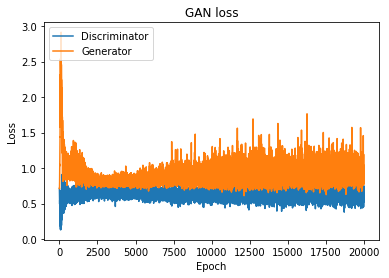

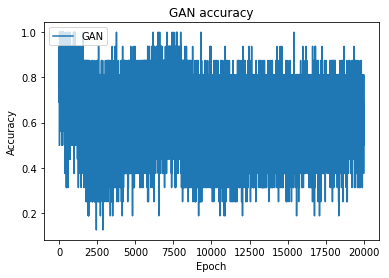

In [3]:
gan_model = GAN()

gan_model.run(epochs=20000, batch_size=8, interval_size=100)

### Original time series data sample

In [5]:
original_data = pd.read_csv('air_quality_original_transformed_data.csv')
original_data.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0,0.956111,0.696429,0.251980,0.803565,0.516156,0.217987,0.435657,0.579630,0.635966,0.539111,0.873262,0.862141,0.992715
1,1,0.953280,0.666071,0.224622,0.794084,0.478459,0.180465,0.476587,0.540741,0.591261,0.430408,0.872036,0.857984,0.992556
2,2,0.954224,0.715179,0.207343,0.792567,0.471831,0.197141,0.464794,0.581481,0.589916,0.467866,0.866312,0.879806,0.992678
3,3,0.954224,0.703571,0.201584,0.793326,0.475559,0.221560,0.448144,0.596296,0.599664,0.515241,0.862633,0.900589,0.992858
4,4,0.951392,0.657143,0.180706,0.783087,0.429163,0.197141,0.487340,0.585185,0.568067,0.481087,0.863451,0.899203,0.992869


### Synthetic time series data

In [6]:
synthetic_data = pd.read_csv('air_quality_synthetic_transformed_data.csv')
synthetic_data.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0,0.128632,0.005443,0.000043,0.239517,0.493661,0.019043,0.045006,0.942179,0.320686,0.238162,0.996715,0.794487,0.319978
1,1,0.011467,0.023275,0.709944,0.001712,0.581607,0.647436,0.570944,0.675149,0.863902,0.903250,0.990790,0.029275,0.002230
2,2,0.292561,0.983371,0.017331,0.732170,0.587747,0.934109,0.799477,0.015181,0.125057,0.330021,0.927975,0.176220,0.139010
3,3,0.417605,0.547787,0.195891,0.182734,0.948469,0.569451,0.038589,0.706143,0.842568,0.006153,0.835030,0.865898,0.885589
4,4,0.403720,0.002017,0.348226,0.616024,0.707417,0.057062,0.395319,0.683119,0.965200,0.446883,0.969486,0.364496,0.038204
